<div style="display: flex; background-color: RGB(255,114,0);" >
<h1 style="margin: auto; padding: 30px; "> P9 - Analyse des ventes pour Lapage </h1></div>

<u>**Remarque :**</u>  
Pour des raisons de lisibilité des parties ont été masquées.
Elles peuvent être démasquées directement sur le Notebook .ipynb

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 1 - Import des librairies et chargement des fichiers</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.1 - Désactivation des Warnings déjà lus si nécessaire</h3>
</div>

##### <u>*DESACTIVATIONS DE WARNINGS déjà lu pour LISISBILITE :*</u>

Source :
https://saturncloud.io/blog/how-to-disable-warnings-in-jupyter-notebook/

https://docs.python.org/fr/3/library/warnings.html

default => Show all warnings (even those ignored by default)
ignore => Ignore all warnings
error => Convert all warnings to errors
error::ResourceWarning => Treat ResourceWarning messages as errors
default::DeprecationWarnig => Show DeprecationWarning messages
ignore,default:::mymodule => Only report warnings triggered by "mymodule"
error:::mymodule => Convert warnings to errors in "mymodule"

In [1]:
# import warnings

In [2]:
# Suppress all warnings

#warnings.filterwarnings('ignore')

In [3]:
# Restore the warning behaviour to default : Show all warnings (even those ignored by default)

#warnings.filterwarnings('ignore')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.2 - Import des librairies</h3>
</div>

In [4]:
#Import de la librairie expression régulières
import re

In [5]:
#Import de la librairie Numpy
import numpy as np

In [6]:
#Import de la librairie Pandas
import pandas as pd

In [7]:
#Import de scipy.stats
import scipy.stats as st

##### **Pour les Graphiques :**

In [8]:
#Import de la librairie matplotlib.pyplot
import matplotlib.pyplot as plt

In [9]:
#Import de seaborn 
import seaborn as sns

In [10]:
#IMPORT
import matplotlib.dates as mdates


In [11]:
#gestion de dates
from datetime import datetime

In [12]:
#Thème Navy pour SNS
sns.set_theme(style='dark', palette='muted')
#plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
plt.rcParams.update({'axes.labelcolor':'navy','axes.titlecolor':'navy'})

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.3 - Import de Fonctions personnelles </h3>
</div>

### FONCTION PERSONNELLE D'ANALYSE DE FICHIERS :

In [13]:
# FONCTION PERSONNELLE D'ANALYSE DE FICHIERS :

def Description_Fichier_Tableau_avc_ValBlanches(Data):
    """
    fonction permettant d'analyser un Dataframe DF.
    Elle prend en entrée le dataframe DF.
    Elle nécessite d'avoir chargé la librairie des expressions regulières : import re
    Et renvoie en sortie un dataframe DF2 avec pour chacune des colonnes de DF, les informations suivantes :
    'Type': type de la colonne
    'Nb lignes' : nbre de lignes total de la colonne
    'Valeurs non-vides' : nbre de valeurs non-vides dans la colonne au sens de la fonction pandas.Series.notna()
    'Valeurs vides' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.isna()
    'Valeurs distinctes' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.unique()
    'Valeurs blanches' : nbre de valeurs blanches dans la colonne au sens de le regular expression r"\A[\s]*$"
    c'est à dire au sens de uniquement une nombres quelconque de caractères blancs y compris aucun ''

    """

    
    re2 = r"\A[\s]*$"
    FICHIER = pd.DataFrame(Data)
    #création d'un DataFrame qui va contenir les colonnes du Fichier en Index, 
    #et la description des lignes dans les colonnes
    Tab_Descriptif = pd.DataFrame(index = FICHIER.columns, 
                                  columns=['Type','Nb lignes',
                                           'Valeurs non-vides','Valeurs vides',
                                           'Valeurs distinctes','Valeurs blanches'])

    #remplissage des lignes
    for elt in FICHIER.columns :
        col_string = (FICHIER[elt]).astype('string')
        Tab_Descriptif.loc[elt,:] = [FICHIER[elt].dtypes, len(FICHIER[elt]) , 
                                     FICHIER[elt].notna().sum() ,FICHIER[elt].isna().sum(),
                                     len(FICHIER[elt].unique()),col_string.str.match(re2).sum() ]

    #print(Tab_Descriptif)
    return Tab_Descriptif
    

<>:4: SyntaxWarning: invalid escape sequence '\A'
<>:4: SyntaxWarning: invalid escape sequence '\A'
C:\Users\matth\AppData\Local\Temp\ipykernel_8436\2493595125.py:4: SyntaxWarning: invalid escape sequence '\A'
  """


L'alerte ne vaut que pour le texte de la description de fonction!

In [14]:
#Importation du fichier customers.csv
df_customers_clean_original = pd.read_csv("D:/BDD/OCR/P9/P9_DataClean/customers.csv", sep = ';')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.3Bis - Lexique des DataFrames </h3>
</div>

#### <font color='green'><u>**LEXIQUE DES PRINCIPAUX DATAFRAMES :**<u></font>

##### <font color='blue'><u>**DATAFRAME PRE-JOINTURE :**</u></font>  

<u>**customers**</u>  
**FICHIERS ORIGINAUX**  
(`df_customers_DAN_original` : Fichier customers original chargé non-modifié, VERSION DONNEES A NETTOYER ) =>NON UTILISE  
`df_customers_clean_original` : Fichier customers original chargé non-modifié, VERSION DEJA NETTOYE => UTILISE  

**FICHIERS DE NETTOYAGE**  
`df_customers_clean_Nettoye` : Fichier customers en cours de Nettoyage, avec les Nettoyages conservés  
`df_customers_clean_nettoyage_x_y` : Copie du fichier `df_customers_clean_Nettoye`, pour travail et tentatives de Nettoyage,  
                                    conservées ou non dans `df_customers_clean_Nettoye`  
`df_customers_clean_Nettoye_Final` : Fichier customers final, à l'issu du Nettoyage  


<u>**products**</u>  
**FICHIERS ORIGINAUX**  
(`df_products_DAN_original` : Fichier products original chargé non-modifié, VERSION DONNEES A NETTOYER ) =>NON UTILISE  
`df_productss_clean_original` : Fichier products original chargé non-modifié, VERSION DEJA NETTOYE => UTILISE  

**FICHIERS DE NETTOYAGE**  
`df_products_clean_Nettoye` : Fichier products en cours de Nettoyage, avec les Nettoyages conservés  
`df_products_clean_nettoyage_x_y` : Copie du fichier `df_products_clean_Nettoye`, pour travail et tentatives de Nettoyage,    
                                    conservées ou non dans `df_products_clean_Nettoye`  
`df_products_clean_Nettoye_Final` : Fichier products final, à l'issu du Nettoyage  

<u>**transactions**</u>  
**FICHIERS ORIGINAUX**  
(`df_transactions_DAN_original` : Fichier transactions original chargé non-modifié, VERSION DONNEES A NETTOYER ) =>NON UTILISE  
`df_transactions_clean_original` : Fichier transactions original chargé non-modifié, VERSION DEJA NETTOYE => UTILISE  

**FICHIERS DE NETTOYAGE**  
`df_transactions_clean_Nettoye` : Fichier transactions en cours de Nettoyage, avec les Nettoyages conservés  
`df_transactions_clean_nettoyage_x_y` : Copie du fichier `df_transactions_clean_Nettoye`, pour travail et tentatives de Nettoyage,   
                                    conservées ou non dans `df_transactions_clean_Nettoye`  
`df_transactions_clean_Nettoye_Final` : Fichier transactions final, à l'issu du Nettoyage  


##### <font color='blue'><u>**DATAFRAME POST-JOINTURE :**</u></font>  

<u>**JOINTURES**</u>  
`df_merge_L1_L2_final` : DataFrame obtenu par jointure de ( (transactions/Left-J/customers) /Left-J/products)  
#= ( (df_transactions_clean_Nettoye_Final/Left-J/df_customers_clean_Nettoye_Final) /Left-J/df_products_clean_Nettoye_Final)  

`df_merge_O1_O2_final` : DataFrame obtenu par jointure de ( (transactions/Outer-J/customers) /Outer-J/products)  
#= ( (df_transactions_clean_Nettoye_Final/Left-J/df_customers_clean_Nettoye_Final) /Left-J/df_products_clean_Nettoye_Final)  

**MASQUES UTILES pour df_merge_O1_O2_final :**  
`mask_O1_O2_transactions` : masque permettant d'afficher un dataframe df_merge_O1_O2_final avec uniquement les transactions non vides
#= ~(df_merge_O1_O2_final['transaction_id'].isna())  
(ie l'ensemble des transactions et leurs informations)

`df_merge_O1_O2_final_transactions` : dataframe en lecture direct de l'application du masque `mask_O1_O2_transactions` sur `df_merge_O1_O2_final`
#= df_merge_O1_O2_final.loc[mask_O1_O2_transactions,:]

`mask_O1_O2_customers` : masque permettant d'afficher un dataframe df_merge_O1_O2_final avec uniquement les clients non vides 
#= ~(df_merge_O1_O2_final['client_id'].isna())  
(ie l'ensemble des clients et leurs informations)

`df_merge_O1_O2_final_customers` : dataframe en lecture direct de l'application du masque `mask_O1_O2_customers` sur `df_merge_O1_O2_final`
#= df_merge_O1_O2_final.loc[mask_O1_O2_customers,:]

`mask_O1_O2_products` : masque permettant d'afficher un dataframe df_merge_O1_O2_final avec uniquement les produits non vides 
#= ~(df_merge_O1_O2_final['id_prod'].isna())  
(ie l'ensemble des produits et leurs informations)

`df_merge_O1_O2_final_products` : dataframe en lecture direct de l'application du masque `mask_O1_O2_products` sur `df_merge_O1_O2_final`
#= df_merge_O1_O2_final.loc[mask_O1_O2_products,:]

##### <font color='blue'><u>**DATAFRAME POUR ANALYSE PROFIL CLIENT :**</u></font>  

<u>**FICHIERS POUR PROFIL CLIENT**</u>  
`df_analyse_O1_O2_BtC` :  
DataFrame contenant **l'ensemble des transactions**,  
incluant **uniquement les clients ayant achetés**; et les **produits ayant été achetés**,  
**restreint aux clients classiques BtC=BusinessToCustomer** (exclusion donc des transactions concernant les 4 gros clients BTB)  

`df_Profil_Client_Achat_1_1`:    
DataFrame regroupé **par client (avec son age)**,  
indiquant notamment les bilans sur 2 ans : **Total d'Achat, Nombre de Sessions, Panier Moyen**

`df_Profil_Client_Achat_1_1_Age_Moyen`:    
idem `df_Profil_Client_Achat_1_1` mais données moyennes regroupés **par age** (et non par (client,age) )

`df_Profil_Client_Achat_1_1_Tranche_age`:  
idem `df_Profil_Client_Achat_1_1` mais données moyennes regroupées **par Tranches d'age fines** (et non par (client,age) ) :  
['18-24', '25-29', '30-39', '40-49', '50-59', '60-69', '70-100']  

`df_Profil_Client_Achat_1_1_Tranche_age_2`:  
idem `df_Profil_Client_Achat_1_1` mais données moyennes regroupées **par Tranche d'age pertinentes** (et non par (client,age) )  
['18-29', '30-49', '50-100']


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.4 - Chargement des fichiers A nettoyer </h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.4.1 - Import du Fichier customers.csv DAN</h4>
</div>

In [15]:
#Importation du fichier customers.csv A NETTOYER
#df_customers_DAN_original = pd.read_csv("D:/BDD/OCR/P9/P9_DAN/customers.csv", sep = ',')

In [16]:
#df_customers_DAN_original.head(5)

In [17]:
#df_customers_DAN_original.info()

In [18]:
#df_customers_DAN_original.dtypes

In [19]:
#Description_Fichier_Tableau_avc_ValBlanches( df_customers_DAN_original )

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.4.2 - Import du Fichier products.csv DAN</h4>
</div>

In [20]:
#Importation du fichier products.csv A NETTOYER
#df_products_DAN_original = pd.read_csv("D:/BDD/OCR/P9/P9_DAN/products.csv", sep = ',')

In [21]:
#df_products_DAN_original.head(5)

In [22]:
#df_products_DAN_original.info()

In [23]:
#df_products_DAN_original.dtypes

In [24]:
#Description_Fichier_Tableau_avc_ValBlanches( df_products_DAN_original )

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.4.3 - Import du Fichier transactions.csv DAN</h4>
</div>

In [25]:
#Importation du fichier Transactions.csv A NETTOYER
df_transactions_DAN_original = pd.read_csv("D:/BDD/OCR/P9/P9_DAN/transactions.csv", sep = ',')

In [26]:
# MSG ERREUR : TypeError: the dtype datetime64 is not supported for parsing, pass this column using parse_dates instead

#Importation du fichier Transactions.csv
#df_transactions_DAN_original = pd.read_csv("D:/BDD/OCR/P9/P9_DAN/transactions.csv", 
#                                               sep = ';',
#                                              dtype={'date':np.datetime64})

In [27]:
df_transactions_DAN_original.head(5)

,id_prod,date,session_id,client_id
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714
3,2_209,2021-06-24 04:19:29.835891,s_52962,c_6941
4,0_1509,2023-01-11 08:22:08.194479,s_325227,c_4232


In [28]:
df_transactions_DAN_original.tail(5)

,id_prod,date,session_id,client_id
679527,0_1551,2022-01-15 13:05:06.246925,s_150195,c_8489
679528,1_639,2022-03-19 16:03:23.429229,s_181434,c_4370
679529,0_1425,2022-12-20 04:33:37.584749,s_314704,c_304
679530,0_1994,2021-07-16 20:36:35.350579,s_63204,c_2227
679531,1_523,2022-09-28 01:12:01.973763,s_274568,c_3873


In [29]:
df_transactions_DAN_original.dtypes

id_prod       object
date          object
session_id    object
client_id     object
dtype: object

In [30]:
# MSG ERREUR A CORRIGER : 
#DateParseError: Unknown datetime string format, unable to parse: test_2021-03-01 02:30:02.237419, at position 3019: Error while type casting for column 'date'

#df_transactions_DAN_original.astype({'date':'datetime64[ns]'})

In [31]:
df_transactions_DAN_original.dtypes

id_prod       object
date          object
session_id    object
client_id     object
dtype: object

In [32]:
#Description_Fichier_Tableau_avc_ValBlanches( df_transactions_DAN_original )

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.5 - Chargement des fichiers pre-nettoyés </h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.5.1 - Import du Fichier customers.csv Clean</h4>
</div>

In [33]:
#Importation du fichier customers.csv
df_customers_clean_original = pd.read_csv("D:/BDD/OCR/P9/P9_DataClean/customers.csv", sep = ';')

In [34]:
df_customers_clean_original.head(5)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


In [35]:
df_customers_clean_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8621 entries, 0 to 8620
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  8621 non-null   object
 1   sex        8621 non-null   object
 2   birth      8621 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 202.2+ KB


In [36]:
df_customers_clean_original.dtypes

client_id    object
sex          object
birth         int64
dtype: object

In [37]:
Description_Fichier_Tableau_avc_ValBlanches( df_customers_clean_original )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,object,8621,8621,0,8621,0
sex,object,8621,8621,0,2,0
birth,int64,8621,8621,0,76,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.5.2 - Import du Fichier products.csv Clean</h4>
</div>

In [38]:
#Importation du fichier products.csv
df_products_clean_original = pd.read_csv("D:/BDD/OCR/P9/P9_DataClean/products.csv", sep = ';')

In [39]:
df_products_clean_original.head(5)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


In [40]:
df_products_clean_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3286 entries, 0 to 3285
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3286 non-null   object 
 1   price    3286 non-null   float64
 2   categ    3286 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 77.1+ KB


In [41]:
df_products_clean_original.dtypes

id_prod     object
price      float64
categ        int64
dtype: object

In [42]:
Description_Fichier_Tableau_avc_ValBlanches( df_products_clean_original )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,object,3286,3286,0,3286,0
price,float64,3286,3286,0,1454,0
categ,int64,3286,3286,0,3,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.5.3 - Import du Fichier transactions.csv Clean</h4>
</div>

In [43]:
#Importation du fichier Transactions.csv
df_transactions_clean_original = pd.read_csv("D:/BDD/OCR/P9/P9_DataClean/transactions.csv", sep = ';')

C:\Users\matth\AppData\Local\Temp\ipykernel_8436\1351259097.py:2: DtypeWarning: Columns (0,1,2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_transactions_clean_original = pd.read_csv("D:/BDD/OCR/P9/P9_DataClean/transactions.csv", sep = ';')


In [44]:
# MSG ERREUR : TypeError: the dtype datetime64 is not supported for parsing, pass this column using parse_dates instead

#Importation du fichier Transactions.csv
#df_transactions_clean_original = pd.read_csv("D:/BDD/OCR/P9/P9_DataClean/transactions.csv", 
#                                               sep = ';',
#                                              dtype={'date':np.datetime64})

In [45]:
df_transactions_clean_original.head(5)

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [46]:
df_transactions_clean_original.tail(5)

,id_prod,date,session_id,client_id
1048570,NaN,NaN,NaN,NaN
1048571,NaN,NaN,NaN,NaN
1048572,NaN,NaN,NaN,NaN
1048573,NaN,NaN,NaN,NaN
1048574,NaN,NaN,NaN,NaN


In [47]:
df_transactions_clean_original.dtypes

id_prod       object
date          object
session_id    object
client_id     object
dtype: object

In [48]:
df_transactions_clean_original.astype({'date':'datetime64[ns]'})

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033
...,...,...,...,...
1048570,NaN,NaT,NaN,NaN
1048571,NaN,NaT,NaN,NaN
1048572,NaN,NaT,NaN,NaN
1048573,NaN,NaT,NaN,NaN


In [49]:
df_transactions_clean_original.dtypes

id_prod       object
date          object
session_id    object
client_id     object
dtype: object

In [50]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_original )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,object,1048575,687534,361041,3266,0
date,object,1048575,687534,361041,687420,0
session_id,object,1048575,687534,361041,345506,0
client_id,object,1048575,687534,361041,8601,0


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 2 - ANALYSE EXPLORATOIRE DES FICHIERS </h2>
</div>

PREMIER CHOIX :  
Il semble que les erreurs soient des erreurs ajoutées volontairement !  
Travaillons avec les données Clean !

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.1 - ANALYSE du Fichier CUSTOMERS : df_customers_clean_original</h3>
</div>

In [51]:
#Nous enregistrerons les modifs une fois faites et confirmées sur :
df_customers_clean_Nettoye = df_customers_clean_original.copy(deep=True) 

##### **Travaillons sur une copie :**

In [52]:
#Travaillons sur une copie :
df_customers_clean_nettoyage_1_1 = df_customers_clean_Nettoye.copy(deep=False) 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.1 - Etude globale de customers </h4>
</div>

In [53]:
display(df_customers_clean_nettoyage_1_1)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943
...,...,...,...
8616,c_7920,m,1956
8617,c_7403,f,1970
8618,c_5119,m,1974
8619,c_5643,f,1968


In [54]:
df_customers_clean_nettoyage_1_1.shape

(8621, 3)

In [55]:
df_customers_clean_nettoyage_1_1.dtypes

client_id    object
sex          object
birth         int64
dtype: object

In [56]:
df_customers_clean_nettoyage_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8621 entries, 0 to 8620
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  8621 non-null   object
 1   sex        8621 non-null   object
 2   birth      8621 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 202.2+ KB


In [57]:
Description_Fichier_Tableau_avc_ValBlanches(df_customers_clean_nettoyage_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,object,8621,8621,0,8621,0
sex,object,8621,8621,0,2,0
birth,int64,8621,8621,0,76,0


In [58]:
df_customers_clean_nettoyage_1_1.describe()

,birth
count,8621.000000
mean,1978.275606
std,16.917958
min,1929.000000
25%,1966.000000
50%,1979.000000
75%,1992.000000
max,2004.000000


In [59]:
#INUTILE
#df_customers_clean_nettoyage_1_1.describe(include='all')

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.2 - Exploration de la colonne client_id </h4>
</div>

In [60]:
Description_Fichier_Tableau_avc_ValBlanches( df_customers_clean_nettoyage_1_1['client_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,object,8621,8621,0,8621,0


8621 lignes / 8621 non vides / 8621 valeurs distinctes
=> A priori pas de valeurs vides,  
pas de doublons

In [61]:
df_customers_clean_nettoyage_1_1['client_id'].values

array(['c_4410', 'c_7839', 'c_1699', ..., 'c_5119', 'c_5643', 'c_84'],
      dtype=object)

In [62]:
df_customers_clean_nettoyage_1_1['client_id'].unique

<bound method Series.unique of 0       c_4410
1       c_7839
2       c_1699
3       c_5961
4       c_5320
         ...  
8616    c_7920
8617    c_7403
8618    c_5119
8619    c_5643
8620      c_84
Name: client_id, Length: 8621, dtype: object>

#### A.VERIFICATION FORMAT client_id

In [63]:
#\A : en début de chaine (équivalent à ^)
#[0-9] : uncaractère numérique
#+ 1caractère ou plus, mais au moins 1
#$ fin de la chaîne
#re_client_id : une chaine de caractère qui commence par "c_" 
# et se poursuit par des caractères numériques (et au moins 1)
re_client_id =  r"\Ac_[0-9]+$"

##### TEST de LA REGEXP re_client_id

In [64]:
liste_test_1_1 = ["c_1" , "ac_1", "c_", "_1", "a_1", "c_1234", "c_1234b","?c_1234&" ]

In [65]:
for elt in liste_test_1_1 :
    resultat = re.match(re_client_id,elt)
    print(elt," => resultat trouvé", resultat is not None) 

c_1  => resultat trouvé True
ac_1  => resultat trouvé False
c_  => resultat trouvé False
_1  => resultat trouvé False
a_1  => resultat trouvé False
c_1234  => resultat trouvé True
c_1234b  => resultat trouvé False
?c_1234&  => resultat trouvé False


##### FIN TEST de LA REGEXP re_client_id

In [66]:
col_client_id_string = (df_customers_clean_nettoyage_1_1['client_id']).astype('string')
col_client_id_string

0       c_4410
1       c_7839
2       c_1699
3       c_5961
4       c_5320
         ...  
8616    c_7920
8617    c_7403
8618    c_5119
8619    c_5643
8620      c_84
Name: client_id, Length: 8621, dtype: string

In [67]:
mask_client_id_non_compliant_format = ~col_client_id_string.str.match(re_client_id)
mask_client_id_non_compliant_format

0       False
1       False
2       False
3       False
4       False
        ...  
8616    False
8617    False
8618    False
8619    False
8620    False
Name: client_id, Length: 8621, dtype: boolean

In [68]:
df_customers_clean_nettoyage_1_1.loc[mask_client_id_non_compliant_format,:]

,client_id,sex,birth


##### **PAS DE ID hors Format**

#### B.VERIFICATION DOUBLON client_id

In [69]:
df_customers_clean_nettoyage_1_1.duplicated(subset=['client_id'], keep=False)

0       False
1       False
2       False
3       False
4       False
        ...  
8616    False
8617    False
8618    False
8619    False
8620    False
Length: 8621, dtype: bool

In [70]:
df_customers_clean_nettoyage_1_1.duplicated(subset=['client_id'], keep=False).value_counts()

False    8621
Name: count, dtype: int64

In [71]:
nb_doublons_df_customers_client_id = df_customers_clean_nettoyage_1_1.duplicated(subset=['client_id'], keep=False).sum()

print("il y a :",
      nb_doublons_df_customers_client_id,
      "doublon(s)")

il y a : 0 doublon(s)


#### C. MAJ de df_customers_clean_Nettoye :

##### <u>**CONSERVONS df_customers_clean_Nettoye :**</u>

In [72]:
#PAS DE MODIFICATION FAITE : on conserve df_customers_clean_Nettoye inchangé:
df_customers_clean_Nettoye.head()

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.3 - Exploration de la colonne sex </h4>
</div>

##### **Travaillons sur une copie :**

In [73]:
#Travaillons sur une copie :
df_customers_clean_nettoyage_1_1 = df_customers_clean_Nettoye.copy(deep=False) 

In [74]:
Description_Fichier_Tableau_avc_ValBlanches( df_customers_clean_nettoyage_1_1['sex'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sex,object,8621,8621,0,2,0


=> PAS DE VALEURS VIDES

In [75]:
df_customers_clean_nettoyage_1_1['sex'].unique()

array(['f', 'm'], dtype=object)

=>PAS DE VALEUR ANORMALE

In [76]:
df_customers_clean_nettoyage_1_1['sex'].value_counts()

sex
f    4490
m    4131
Name: count, dtype: int64

##### <u>**CONSERVONS df_customers_clean_Nettoye :**</u>

In [77]:
#PAS DE MODIFICATION FAITE : on conserve df_customers_clean_Nettoye inchangé:
df_customers_clean_Nettoye.head()

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.4 - Exploration de la colonne birth</h4>
</div>

##### **Travaillons sur une copie :**

In [78]:
#Travaillons sur une copie :
df_customers_clean_nettoyage_1_1 = df_customers_clean_Nettoye.copy(deep=False) 

In [79]:
df_customers_clean_nettoyage_1_1['birth'].dtypes

dtype('int64')

In [80]:
Description_Fichier_Tableau_avc_ValBlanches( df_customers_clean_nettoyage_1_1['birth'])

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
birth,int64,8621,8621,0,76,0


=> PAS DE VALEURS VIDES

In [81]:
df_customers_clean_nettoyage_1_1['birth'].describe()

count    8621.000000
mean     1978.275606
std        16.917958
min      1929.000000
25%      1966.000000
50%      1979.000000
75%      1992.000000
max      2004.000000
Name: birth, dtype: float64

=>DONNEES comprises entre 1929 et 2004 pas de valeurs anormales. (clients entre 104 et 21 ans)

In [82]:
df_customers_clean_nettoyage_1_1['birth'].value_counts()

birth
2004    440
1979    215
1988    207
1986    203
1978    199
       ... 
1933      8
1932      6
1931      4
1930      4
1929      3
Name: count, Length: 76, dtype: int64

##### <u>**CONSERVONS df_customers_clean_Nettoye :**</u>

In [83]:
#PAS DE MODIFICATION FAITE : on conserve df_customers_clean_Nettoye inchangé:
df_customers_clean_Nettoye.head()

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.5 - Autres explorations : </h4>
</div>

A priori il n'y a pas d'intérêt à étudier un doublon de 'sex'/'birth',  
car un même 'sex'/'birth', est possible sans que cela soit un vrai doublon.  
Ici c'est bien le client_id seul qui va trancher.

##### <u>**Travaillons sur une copie :**</u>

In [84]:
#Travaillons sur une copie :
df_customers_clean_nettoyage_1_1 = df_customers_clean_Nettoye.copy(deep=False) 

In [85]:
df_customers_clean_nettoyage_1_1.dtypes

client_id    object
sex          object
birth         int64
dtype: object

In [86]:
df_customers_clean_nettoyage_1_1.head(5)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


**REMARQUE :**  
Source : https://pandas.pydata.org/docs/user_guide/text.html  
Selon la doc pandas,  
par défaut les données sont mises en object qui est un attrape tout.  
Mais si les données sont bien du texte il vaut mieux qualifier les données en string.  

##### <font color='orange'><u>**CONVERTISSONS `client_id` et `sex` en string :**</u></font>

In [87]:
df_customers_clean_nettoyage_1_1 = df_customers_clean_nettoyage_1_1.astype({'client_id' : 'string',
                                                                            'sex' : 'string'})

In [88]:
df_customers_clean_nettoyage_1_1.dtypes

client_id    string[python]
sex          string[python]
birth                 int64
dtype: object

##### <font color='orange'><u>**CONVERTISSONS `birth` en INT64 pour supporter les Nan :**</u></font>

In [89]:
df_customers_clean_nettoyage_1_1 = df_customers_clean_nettoyage_1_1.astype({'birth' : 'Int64'})

In [90]:
df_customers_clean_nettoyage_1_1.dtypes

client_id    string[python]
sex          string[python]
birth                 Int64
dtype: object

##### <font color='orange'> <u>**CONSERVONS les modifications dans df_customers_clean_Nettoye :**</u></font>

In [91]:
df_customers_clean_Nettoye = df_customers_clean_nettoyage_1_1.copy(deep=False)

In [92]:
df_customers_clean_Nettoye.dtypes

client_id    string[python]
sex          string[python]
birth                 Int64
dtype: object

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.2 - ANALYSE du Fichier PRODUCTS : df_products_clean_original</h3>
</div>

In [93]:
#Nous enregistrerons les modifs une fois faites et confirmées sur :
df_products_clean_Nettoye = df_products_clean_original.copy(deep=True) 

##### **Travaillons sur une copie :**

In [94]:
#Travaillons sur une copie :
df_products_clean_nettoyage_1_1 = df_products_clean_Nettoye.copy(deep=False) 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.1 - Etude globale de products</h4>
</div>

In [95]:
display(df_products_clean_nettoyage_1_1)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0
...,...,...,...
3281,2_23,115.99,2
3282,0_146,17.14,0
3283,0_802,11.22,0
3284,1_140,38.56,1


In [96]:
df_products_clean_nettoyage_1_1.shape

(3286, 3)

In [97]:
df_products_clean_nettoyage_1_1.dtypes

id_prod     object
price      float64
categ        int64
dtype: object

In [98]:
df_products_clean_nettoyage_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3286 entries, 0 to 3285
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3286 non-null   object 
 1   price    3286 non-null   float64
 2   categ    3286 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 77.1+ KB


In [99]:
Description_Fichier_Tableau_avc_ValBlanches(df_products_clean_nettoyage_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,object,3286,3286,0,3286,0
price,float64,3286,3286,0,1454,0
categ,int64,3286,3286,0,3,0


In [100]:
df_products_clean_nettoyage_1_1.describe()

,price,categ
count,3286.000000,3286.000000
mean,21.863597,0.370359
std,29.849786,0.615446
min,0.620000,0.000000
25%,6.990000,0.000000
50%,13.075000,0.000000
75%,22.990000,1.000000
max,300.000000,2.000000


In [101]:
#INUTILE
#df_products_clean_nettoyage_1_1.describe(include='all')

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.2 - Exploration de la colonne id_prod </h4>
</div>

In [102]:
Description_Fichier_Tableau_avc_ValBlanches( df_products_clean_nettoyage_1_1['id_prod'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,object,3286,3286,0,3286,0


3286 lignes / 3286 non vides / 3286 valeurs distinctes
=> A priori pas de valeurs vides,  
pas de doublons

In [103]:
df_products_clean_nettoyage_1_1['id_prod'].values

array(['0_1421', '0_1368', '0_731', ..., '0_802', '1_140', '0_1920'],
      dtype=object)

In [104]:
df_products_clean_nettoyage_1_1['id_prod'].unique

<bound method Series.unique of 0       0_1421
1       0_1368
2        0_731
3        1_587
4       0_1507
         ...  
3281      2_23
3282     0_146
3283     0_802
3284     1_140
3285    0_1920
Name: id_prod, Length: 3286, dtype: object>

#### A.VERIFICATION FORMAT id_format

In [105]:
#\A : en début de chaine (équivalent à ^)
#[0-9] : uncaractère numérique
#+ 1caractère ou plus, mais au moins 1
#$ fin de la chaîne
#re_client_id : une chaine de caractère qui commence par "c_" 
# et se poursuit par des caractères numériques (et au moins 1)
re_id_prod =  r"\A[0-9]_[0-9]+$"

##### TEST de LA REGEXP re_client_id

In [106]:
liste_test_1_2 = ["0_1" , "00_1", "0_", "_1", "a_1", "2_1234", "3_1234b","?4_1234&" ]

In [107]:
for elt in liste_test_1_2 :
    resultat = re.match(re_id_prod,elt)
    print(elt," => resultat trouvé", resultat is not None) 

0_1  => resultat trouvé True
00_1  => resultat trouvé False
0_  => resultat trouvé False
_1  => resultat trouvé False
a_1  => resultat trouvé False
2_1234  => resultat trouvé True
3_1234b  => resultat trouvé False
?4_1234&  => resultat trouvé False


##### FIN TEST de LA REGEXP re_id_prod

In [108]:
col_id_prod_string = (df_products_clean_nettoyage_1_1['id_prod']).astype('string')
col_id_prod_string

0       0_1421
1       0_1368
2        0_731
3        1_587
4       0_1507
         ...  
3281      2_23
3282     0_146
3283     0_802
3284     1_140
3285    0_1920
Name: id_prod, Length: 3286, dtype: string

In [109]:
mask_id_prod_non_compliant_format = ~col_id_prod_string.str.match(re_id_prod)
mask_id_prod_non_compliant_format

0       False
1       False
2       False
3       False
4       False
        ...  
3281    False
3282    False
3283    False
3284    False
3285    False
Name: id_prod, Length: 3286, dtype: boolean

In [110]:
df_products_clean_nettoyage_1_1.loc[mask_id_prod_non_compliant_format,:]

,id_prod,price,categ


##### **PAS DE ID hors Format**

#### B.VERIFICATION DOUBLON client_id

In [111]:
df_products_clean_nettoyage_1_1.duplicated(subset=['id_prod'], keep=False)

0       False
1       False
2       False
3       False
4       False
        ...  
3281    False
3282    False
3283    False
3284    False
3285    False
Length: 3286, dtype: bool

In [112]:
df_products_clean_nettoyage_1_1.duplicated(subset=['id_prod'], keep=False).value_counts()

False    3286
Name: count, dtype: int64

In [113]:
nb_doublons_df_products_id_prod= df_products_clean_nettoyage_1_1.duplicated(subset=['id_prod'], keep=False).sum()

print("il y a :",
      nb_doublons_df_products_id_prod,
      "doublon(s)")

il y a : 0 doublon(s)


#### C. MAJ de df_customers_clean_Nettoye :

##### <u>**CONSERVONS df_products_clean_Nettoye :**</u>

In [114]:
#PAS DE MODIFICATION FAITE : on conserve df_customers_clean_Nettoye inchangé:
df_products_clean_Nettoye.head()

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.3 - Exploration de la colonne price </h4>
</div>

##### **Travaillons sur une copie :**

In [115]:
#Travaillons sur une copie :
df_products_clean_nettoyage_1_1 = df_products_clean_Nettoye.copy(deep=False) 

In [116]:
Description_Fichier_Tableau_avc_ValBlanches( df_products_clean_nettoyage_1_1['price'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
price,float64,3286,3286,0,1454,0


=> PAS DE VALEURS VIDES

In [117]:
df_products_clean_nettoyage_1_1['price'].unique()

array([19.99,  5.13, 17.99, ..., 11.22, 38.56, 25.16])

In [118]:
df_products_clean_nettoyage_1_1['price'].describe()

count    3286.000000
mean       21.863597
std        29.849786
min         0.620000
25%         6.990000
50%        13.075000
75%        22.990000
max       300.000000
Name: price, dtype: float64

In [119]:
df_products_clean_nettoyage_1_1.loc[df_products_clean_nettoyage_1_1['price']<1.0,:]

,id_prod,price,categ
145,0_1203,0.99,0
370,0_120,0.66,0
686,0_2138,0.93,0
800,0_2166,0.97,0
847,0_180,0.97,0
945,0_2169,0.99,0
984,0_2275,0.99,0
990,0_1329,0.99,0
1210,0_1844,0.77,0
1529,0_1620,0.80,0


In [120]:
(df_products_clean_nettoyage_1_1.loc[df_products_clean_nettoyage_1_1['price']<1.0,:] ).shape

(29, 3)

Remarque il y a des valeurs inférieures à 1 euros.  
Mais comme on ne connait pas le type d'objet ?
Est-ce que ce sont des marque-page,
des livres d'occasions à très faibles valeurs ?
Ces hypothèses ne sont pas impossibles !?

Il y a 29 produits, cela ne semble pas être un produit isolé !
Et ils ont de plus l'air d'être tous dans la même catégorie : 0
=>PAS DE VALEUR ANORMALE

In [121]:
#df_products_clean_nettoyage_1_1['price'].value_counts()

##### <u>**CONSERVONS df_customers_clean_Nettoye :**</u>

In [122]:
#PAS DE MODIFICATION FAITE : on conserve df_products_clean_Nettoye inchangé:
df_products_clean_Nettoye.head()

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.4 - Exploration de la colonne categ </h4>
</div>

##### **Travaillons sur une copie :**

In [123]:
#Travaillons sur une copie :
df_products_clean_nettoyage_1_1 = df_products_clean_Nettoye.copy(deep=False) 

In [124]:
Description_Fichier_Tableau_avc_ValBlanches( df_products_clean_nettoyage_1_1['categ'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
categ,int64,3286,3286,0,3,0


=> PAS DE VALEURS VIDES

In [125]:
df_products_clean_nettoyage_1_1['categ'].unique()

array([0, 1, 2], dtype=int64)

=>PAS DE VALEUR ANORMALE

In [126]:
df_products_clean_nettoyage_1_1['categ'].value_counts()

categ
0    2308
1     739
2     239
Name: count, dtype: int64

In [127]:
#stats Prix pour Categ==0
df_products_clean_nettoyage_1_1.loc[df_products_clean_nettoyage_1_1['categ']==0,['price']].describe()

,price
count,2308.000000
mean,11.732795
std,7.565755
min,0.620000
25%,5.587500
50%,10.320000
75%,16.655000
max,40.990000


In [128]:
#stats Prix pour Categ==1
df_products_clean_nettoyage_1_1.loc[df_products_clean_nettoyage_1_1['categ']==1,['price']].describe()

,price
count,739.000000
mean,25.531421
std,15.425162
min,2.000000
25%,13.390000
50%,22.990000
75%,33.990000
max,80.990000


In [129]:
#stats Prix pour Categ==2
df_products_clean_nettoyage_1_1.loc[df_products_clean_nettoyage_1_1['categ']==2,['price']].describe()

,price
count,239.000000
mean,108.354686
std,49.561431
min,30.990000
25%,71.065000
50%,101.990000
75%,136.530000
max,300.000000


La Gamme de prix a l'air différente selon la categorie :  
-categ 0 : prix les plus bas autour de 10 euros  
-categ 1 : prix intermédiaire autour de 20 euros  
-categ 2 : prix les plus hauts autour de 100 euros

##### <u>**CONSERVONS df_products_clean_Nettoye :**</u>

In [130]:
#PAS DE MODIFICATION FAITE : on conserve df_customers_clean_Nettoye inchangé:
df_products_clean_Nettoye.head()

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.5 - Autres explorations </h4>
</div>

##### <u>**Travaillons sur une copie :**</u>

In [131]:
#Travaillons sur une copie :
df_products_clean_nettoyage_1_1 = df_products_clean_Nettoye.copy(deep=False) 

In [132]:
df_products_clean_nettoyage_1_1.dtypes

id_prod     object
price      float64
categ        int64
dtype: object

In [133]:
df_products_clean_nettoyage_1_1.head(5)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


**REMARQUE :**  
Source : https://pandas.pydata.org/docs/user_guide/text.html  
Selon la doc pandas,  
par défaut les données sont mises en object qui est un attrape tout.  
Mais si les données sont bien du texte il vaut mieux qualifier les données en string.  

##### <font color='orange'><u>**CONVERTISSONS `id_prod` en string :**</u></font>

In [134]:
df_products_clean_nettoyage_1_1 = df_products_clean_nettoyage_1_1.astype({'id_prod' : 'string'})

In [135]:
df_products_clean_nettoyage_1_1.dtypes

id_prod    string[python]
price             float64
categ               int64
dtype: object

##### <font color='orange'><u>**CONVERTISSONS `categ` en String , car c'est une variable qualitative :**</u></font>

In [136]:
df_products_clean_nettoyage_1_1 = df_products_clean_nettoyage_1_1.astype({'categ' : 'string'})

In [137]:
df_products_clean_nettoyage_1_1.dtypes

id_prod    string[python]
price             float64
categ      string[python]
dtype: object

##### <font color='orange'> <u>**CONSERVONS les modifications dans df_customers_clean_Nettoye :**</u></font>

In [138]:
df_products_clean_Nettoye = df_products_clean_nettoyage_1_1.copy(deep=False)

In [139]:
df_products_clean_Nettoye.dtypes

id_prod    string[python]
price             float64
categ      string[python]
dtype: object

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.3 - ANALYSE du Fichier TRANSACTIONS : df_transactions_clean_original</h3>
</div>

In [140]:
#Nous enregistrerons les modifs une fois faites et confirmées sur :
df_transactions_clean_Nettoye = df_transactions_clean_original.copy(deep=False) 

##### <u>**Travaillons sur une copie :**</u>

In [141]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_1_1 = df_transactions_clean_Nettoye.copy(deep=False) 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.1 - Etude globale de transactions </h4>
</div>

#### <font color='green'><u>**A. OBSERVATIONS GLOBALES**</u></font>

In [142]:
display(df_transactions_clean_nettoyage_1_1)

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033
...,...,...,...,...
1048570,NaN,NaN,NaN,NaN
1048571,NaN,NaN,NaN,NaN
1048572,NaN,NaN,NaN,NaN
1048573,NaN,NaN,NaN,NaN


In [143]:
df_transactions_clean_nettoyage_1_1.shape

(1048575, 4)

In [144]:
df_transactions_clean_nettoyage_1_1.dtypes

id_prod       object
date          object
session_id    object
client_id     object
dtype: object

In [145]:
df_transactions_clean_nettoyage_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id_prod     687534 non-null  object
 1   date        687534 non-null  object
 2   session_id  687534 non-null  object
 3   client_id   687534 non-null  object
dtypes: object(4)
memory usage: 32.0+ MB


In [146]:
Description_Fichier_Tableau_avc_ValBlanches(df_transactions_clean_nettoyage_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,object,1048575,687534,361041,3266,0
date,object,1048575,687534,361041,687420,0
session_id,object,1048575,687534,361041,345506,0
client_id,object,1048575,687534,361041,8601,0


In [147]:
df_transactions_clean_nettoyage_1_1.describe()

,id_prod,date,session_id,client_id
count,687534,687534,687534,687534
unique,3265,687419,345505,8600
top,1_369,2021-10-06 21:29:59.752585,s_118668,c_1609
freq,2340,2,14,25586


In [148]:
#INUTILE
#df_transactions_clean_nettoyage_1_1.describe(include='all')

##### <u>**PREMIERES OBSERVATIONS :**</u>  

<u>1. TYPAGE de `'date'` à mettre en Date :</u>  
IL FAUDRA CONVERTIR LES DATES EN TYPE DATE :  
Soit j'arrive à faire une conversion standard de Python/Pandas;  
Soit je tronque la fin et ne garde que le début 2021-10-06 21:29:59 et je retente la conversion après

<u>2. RETYPAGE de `id_prod` , `session_id`, et `client_id` en String :</u>  
Comme vu précédemment, selon la doc pandas,  
il est préférable de passer le text qualifié en object en string.

<u>3. LIGNES TOTALEMENT VIDES A SUPPRIMER :</u>  
Nous avons manifestement un ensemble de lignes vides et/ou identiques.  
Commençons par les supprimer

#### <font color='green'><u><u>**B. SUPPRESSION DES LIGNES VIDES:**</u></font>

In [149]:
df_transactions_clean_nettoyage_1_1.shape

(1048575, 4)

##### **VERSION MANUELLE INUTILE remplacée par `.dropna`**

In [150]:
#mask_transactions_ligne_vide = (df_transactions_clean_nettoyage_1_1['id_prod'].isna()
# & df_transactions_clean_nettoyage_1_1['date'].isna()
# & df_transactions_clean_nettoyage_1_1['session_id'].isna()
# & df_transactions_clean_nettoyage_1_1['client_id'].isna()
#)

In [151]:
##SUPPRESSIONS DE LA/LES LIGNES VIDES :
#index_to_drop = df_transactions_clean_nettoyage_1_1.loc[mask_transactions_ligne_vide ,:].index
#
#df_transactions_clean_nettoyage_1_1.drop(index = index_to_drop , inplace=True)

##### **FIN - VERSION MANUELLE INUTILE remplacée par `.dropna`**

Il existe une fonction .dropna qui permet de faire cela :

In [152]:
df_transactions_clean_nettoyage_1_1.dropna(how='all', inplace=True)

In [153]:
#Nombres de lignes totales :
print("Nombre de lignes total : ",
      (df_transactions_clean_nettoyage_1_1).shape[0]
     )

Nombre de lignes total :  687534


In [154]:
display(df_transactions_clean_nettoyage_1_1)

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033
...,...,...,...,...
687529,1_508,2023-02-28 23:49:03.148402,s_348444,c_3573
687530,2_37,2023-02-28 23:51:29.318531,s_348445,c_50
687531,1_695,2023-02-28 23:53:18.929676,s_348446,c_488
687532,0_1547,2023-02-28 23:58:00.107815,s_348447,c_4848


##### <font color='orange'> <u>**CONSERVONS les modifications dans df_transactions_clean_Nettoye :**</u></font>

In [155]:
df_transactions_clean_Nettoye = df_transactions_clean_nettoyage_1_1.copy(deep=False)

##### <font color='green'><u><u>**c. RETYPONS LES COLONNES :**</u></font>

##### <u>**Travaillons sur une copie :**</u>

In [156]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_1_2b = df_transactions_clean_Nettoye.copy(deep=False) 

In [157]:
df_transactions_clean_nettoyage_1_2b = df_transactions_clean_nettoyage_1_2b.astype({'id_prod':'string',
                                                                                    'session_id':'string',
                                                                                    'client_id':'string'})

In [158]:
df_transactions_clean_nettoyage_1_2b.dtypes

id_prod       string[python]
date                  object
session_id    string[python]
client_id     string[python]
dtype: object

In [159]:
df_transactions_clean_nettoyage_1_2b['date']=pd.to_datetime(df_transactions_clean_nettoyage_1_2b['date'])
df_transactions_clean_nettoyage_1_2b['date']

0        2021-03-01 00:01:07.843138
1        2021-03-01 00:02:26.047414
2        2021-03-01 00:02:38.311413
3        2021-03-01 00:04:54.559692
4        2021-03-01 00:05:18.801198
                    ...            
687529   2023-02-28 23:49:03.148402
687530   2023-02-28 23:51:29.318531
687531   2023-02-28 23:53:18.929676
687532   2023-02-28 23:58:00.107815
687533   2023-02-28 23:58:30.792755
Name: date, Length: 687534, dtype: datetime64[ns]

In [160]:
df_transactions_clean_nettoyage_1_2b.dtypes

id_prod       string[python]
date          datetime64[ns]
session_id    string[python]
client_id     string[python]
dtype: object

##### <font color='orange'> <u>**CONSERVONS les modifications dans df_transactions_clean_Nettoye :**</u></font>

In [161]:
df_transactions_clean_Nettoye = df_transactions_clean_nettoyage_1_2b.copy(deep=False)

In [162]:
Description_Fichier_Tableau_avc_ValBlanches(df_transactions_clean_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687534,687534,0,3265,0
date,datetime64[ns],687534,687534,0,687415,0
session_id,string[python],687534,687534,0,345505,0
client_id,string[python],687534,687534,0,8600,0


##### <font color='green'><u><u>**d. ETUDE DES DOUBLONS :**</u></font>

##### <u>**Travaillons sur une copie :**</u>

In [163]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_1_3b = df_transactions_clean_Nettoye.copy(deep=False) 

In [164]:
df_transactions_clean_nettoyage_1_3b.head(5)

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [165]:
#Description_Fichier_Tableau_avc_ValBlanches(df_transactions_clean_nettoyage_1_3b)

##### **ETUDE DES DOUBLONS DE LIGNE ENTIERE : =>PAS DE DOUBLONS**

In [166]:
#Nombres de lignes totales :
print("Nombre de lignes total : ",
      (df_transactions_clean_nettoyage_1_3b).shape[0]
     )

#Nombres de lignes en doublons
print("Nombre de lignes total : ",
      df_transactions_clean_nettoyage_1_3b.duplicated(keep=False).sum()
     )

Nombre de lignes total :  687534
Nombre de lignes total :  0


##### **=>IL N'Y A PAS DE DOUBLON TOTAL DE LIGNE :**  (après avoir supprimé les lignes vides)

##### <u>**ETUDE ANTICIPATIVE DE doublons de session_id : => DOUBLONS**</u>

In [167]:
#Nombres de lignes en doublons
print("Nombre de doublons session_id : \n",
      df_transactions_clean_nettoyage_1_3b.duplicated(keep=False, subset = ['session_id']).sum()
     )

Nombre de doublons session_id : 
 523278


**=>  session_id : pas un identifiant de la transaction**  
Cela implique que session_id n'est pas un identifiant de la transaction.  
En effet, il existe plusieurs transactions dans une même session.   
Ces transactions sont différentes par un des autres éléments : id_prod, date ou client_id

##### <u>**ETUDE ANTICIPATIVE DE doublons de id_prod / session_id / client_id => DOUBLONS**</u>

In [168]:
#Nombres de lignes en doublons
print("Nombre de doublons id_prod / session_id / client_id : \n",
      df_transactions_clean_nettoyage_1_3b.duplicated(keep=False, subset = ['id_prod','session_id','client_id']).sum()
     )

Nombre de doublons id_prod / session_id / client_id : 
 1708


**doublons de id_prod / session_id / client_id  
=>  PLUSIEURS FOIS LE MEME PRODUIT DANS UN SESSION (achat en nombre sup à 2 du même produit, différencié uniquement par la date-heure)**  
Cela signifie que lors d'une même session,  
un client peut avoir pris plusieurs fois un même produit,  
C'est ainsi que doivent être traité les quantités, apparemment; cependant la date/heure sera différente,  
car il n'y a pas de doublon lorsqu'on inclut la date.

##### **SUJET DE RECHERCHE D'UNE CLE A TRAITER DANS UN SECOND TEMPS**

##### <u>**CONSERVONS df_transactions_clean_Nettoye :**</u>

In [169]:
#PAS DE MODIFICATION FAITE : on conserve df_products_clean_Nettoye inchangé:
df_transactions_clean_Nettoye.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [170]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_Nettoye )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687534,687534,0,3265,0
date,datetime64[ns],687534,687534,0,687415,0
session_id,string[python],687534,687534,0,345505,0
client_id,string[python],687534,687534,0,8600,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.2 - Exploration de la colonne session_id </h4>
</div>

##### **Travaillons sur une copie :**

In [171]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_2_0c = df_transactions_clean_Nettoye.copy(deep=False) 

In [172]:
#Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_nettoyage_2_0c['session_id'] )

687534 lignes / 687534 non vides / 345505 valeurs distinctes
=> A priori pas de valeurs vides,  
Mais par contre nous avons des doublons

##### **EXPLORATION DES DOUBLONS :**

In [173]:
df_transactions_clean_nettoyage_2_0c['session_id'].values

<StringArray>
[     's_1',      's_2',      's_3',      's_4',      's_5',      's_6',
      's_7',      's_6',      's_8',      's_9',
 ...
 's_348438', 's_348438', 's_348442', 's_348427', 's_348443', 's_348444',
 's_348445', 's_348446', 's_348447', 's_348435']
Length: 687534, dtype: string

In [174]:
(df_transactions_clean_nettoyage_2_0c['session_id'].values).size

687534

In [175]:
df_transactions_clean_nettoyage_2_0c['session_id'].unique

<bound method Series.unique of 0              s_1
1              s_2
2              s_3
3              s_4
4              s_5
            ...   
687529    s_348444
687530    s_348445
687531    s_348446
687532    s_348447
687533    s_348435
Name: session_id, Length: 687534, dtype: string>

C'est étonnant : selon la méthode .unique il ne semble pas y avoir de doublons !  
Nous allons traiter dans le même ordre : format puis Doublons.  
Nous allons traiter les doublons à ce moment là.

#### <font color='green'>**A.VERIFICATION FORMAT id_format**</u>

In [176]:
#\A : en début de chaine (équivalent à ^)
#[0-9] : uncaractère numérique
#+ 1caractère ou plus, mais au moins 1
#$ fin de la chaîne
#re_client_id : une chaine de caractère qui commence par "c_" 
# et se poursuit par des caractères numériques (et au moins 1)
re_session_id =  r"\As_[0-9]+$"

##### TEST de LA REGEXP re_client_id

In [177]:
liste_test_1_3 = ["s_1" , "as_1", "s_", "_1", "a_1", "s_1234", "s_1234b","?s_1234&" ]

In [178]:
for elt in liste_test_1_3 :
    resultat = re.match(re_session_id,elt)
    print(elt," => resultat trouvé", resultat is not None) 

s_1  => resultat trouvé True
as_1  => resultat trouvé False
s_  => resultat trouvé False
_1  => resultat trouvé False
a_1  => resultat trouvé False
s_1234  => resultat trouvé True
s_1234b  => resultat trouvé False
?s_1234&  => resultat trouvé False


##### FIN TEST de LA REGEXP re_id_prod

In [179]:
col_session_id_string = (df_transactions_clean_nettoyage_2_0c['session_id']).astype('string')
col_session_id_string

0              s_1
1              s_2
2              s_3
3              s_4
4              s_5
            ...   
687529    s_348444
687530    s_348445
687531    s_348446
687532    s_348447
687533    s_348435
Name: session_id, Length: 687534, dtype: string

In [180]:
type(col_session_id_string)

pandas.core.series.Series

In [181]:
mask_session_id_non_compliant_format = ~col_session_id_string.str.match(re_session_id)
mask_session_id_non_compliant_format

0         False
1         False
2         False
3         False
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533    False
Name: session_id, Length: 687534, dtype: boolean

In [182]:
df_transactions_clean_nettoyage_2_0c.loc[mask_session_id_non_compliant_format,:]

,id_prod,date,session_id,client_id


##### **PAS DE ID hors Format**

##### <u>**CONSERVONS df_transactions_clean_Nettoye :**</u>

In [183]:
#PAS DE MODIFICATION FAITE : on conserve df_products_clean_Nettoye inchangé:
df_transactions_clean_Nettoye.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [184]:
#Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_Nettoye )

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.3 - Exploration de la colonne id_prod </h4>
</div>

##### **Travaillons sur une copie :**

In [185]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_2_1c = df_transactions_clean_Nettoye.copy(deep=False) 

In [186]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_nettoyage_2_1c['id_prod'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687534,687534,0,3265,0


687534 lignes / 687534 non vides / 345505 valeurs distinctes
=> A priori pas de valeurs vides,  
Il ya des doublons, mais cela n'est pas étonnant, car plusieurs produits peuvent aller dans une ou plusieurs sessions, dans une ou plusieurs transacations.

#### <font color='green'>**A.VERIFICATION FORMAT id_prod**</u>

In [187]:
# re_id_prod a déjà été défini
re_id_prod

'\\A[0-9]_[0-9]+$'

In [188]:
col_transactions_id_prod_string = (df_transactions_clean_nettoyage_2_1c['id_prod']).astype('string')
col_transactions_id_prod_string

0         0_1259
1         0_1390
2         0_1352
3         0_1458
4         0_1358
           ...  
687529     1_508
687530      2_37
687531     1_695
687532    0_1547
687533    0_1398
Name: id_prod, Length: 687534, dtype: string

In [189]:
type(col_transactions_id_prod_string)

pandas.core.series.Series

In [190]:
mask_tr_id_prod__non_compliant_format = ~col_transactions_id_prod_string.str.match(re_id_prod)
mask_tr_id_prod__non_compliant_format

0         False
1         False
2         False
3         False
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533    False
Name: id_prod, Length: 687534, dtype: boolean

In [191]:
df_transactions_clean_nettoyage_2_1c.loc[mask_tr_id_prod__non_compliant_format,:]

,id_prod,date,session_id,client_id


##### **PAS DE ID hors Format**

##### <u>**CONSERVONS df_transactions_clean_Nettoye :**</u>

In [192]:
#PAS DE MODIFICATION FAITE : on conserve df_products_clean_Nettoye inchangé:
df_transactions_clean_Nettoye.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [193]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_Nettoye )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687534,687534,0,3265,0
date,datetime64[ns],687534,687534,0,687415,0
session_id,string[python],687534,687534,0,345505,0
client_id,string[python],687534,687534,0,8600,0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.4 - Exploration de la colonne client_id </h4>
</div>

##### **Travaillons sur une copie :**

In [194]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_2_2c = df_transactions_clean_Nettoye.copy(deep=False) 

In [195]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_nettoyage_2_2c['client_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],687534,687534,0,8600,0


687534 lignes / 687534 non vides / 8600 valeurs distinctes
=> A priori pas de valeurs vides,  
Il ya des doublons, mais cela n'est pas étonnant, car un client peut aller dans une ou plusieurs sessions, dans une ou plusieurs transactions.

#### <font color='green'>**A.VERIFICATION FORMAT client_id**</u>

In [196]:
# re_client_id a déjà été défini
re_client_id

'\\Ac_[0-9]+$'

In [197]:
col_transactions_client_id_string = (df_transactions_clean_nettoyage_2_2c['client_id']).astype('string')
col_transactions_client_id_string

0          c_329
1          c_664
2          c_580
3         c_7912
4         c_2033
           ...  
687529    c_3573
687530      c_50
687531     c_488
687532    c_4848
687533    c_3575
Name: client_id, Length: 687534, dtype: string

In [198]:
type(col_transactions_client_id_string)

pandas.core.series.Series

In [199]:
mask_tr_client_id__non_compliant_format = ~col_transactions_client_id_string.str.match(re_client_id)
mask_tr_client_id__non_compliant_format

0         False
1         False
2         False
3         False
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533    False
Name: client_id, Length: 687534, dtype: boolean

In [200]:
df_transactions_clean_nettoyage_2_2c.loc[mask_tr_client_id__non_compliant_format,:]

,id_prod,date,session_id,client_id


##### **=>PAS DE ID hors Format**

##### <u>**CONSERVONS df_transactions_clean_Nettoye :**</u>

In [201]:
#PAS DE MODIFICATION FAITE : on conserve df_products_clean_Nettoye inchangé:
df_transactions_clean_Nettoye.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [202]:
#Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_Nettoye )

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.5 - Exploration des doublons de session_id et Recherche d'une clé</h4>
</div>

##### **Travaillons sur une copie :**

In [203]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_3_1d = df_transactions_clean_Nettoye.copy(deep=False) 

#### <font color='green'><u>**A.VERIFICATION DOUBLON session_id => DOUBLONS :**</u></font>    
**=> session_id n'est pas un id de transactions mais seulement de session**

In [204]:
df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id'], keep=False)

0         False
1         False
2          True
3          True
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533     True
Length: 687534, dtype: bool

In [205]:
df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id'], keep=False).value_counts()

True     523278
False    164256
Name: count, dtype: int64

In [206]:
nb_doublons_df_transactions_session_id = df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id'], keep=False).sum()

print("il y a :",
      nb_doublons_df_transactions_session_id,
      "doublon(s)")

il y a : 523278 doublon(s)


**=> IL EXISTE DES DOUBLONS DE SESSION_ID**

In [207]:
mask_doublons_session_id = df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id'], keep=False)

index_doublons = df_transactions_clean_nettoyage_3_1d.loc[mask_doublons_session_id ,:].index

In [208]:
index_doublons

Index([     2,      3,      5,      6,      7,     11,     13,     14,     15,
           16,
       ...
       687513, 687514, 687515, 687518, 687519, 687523, 687524, 687525, 687527,
       687533],
      dtype='int64', length=523278)

##### **Testons un exemple**

In [209]:
#Test sur 1er doublon
index_1 = index_doublons[0]

In [210]:
df_transactions_clean_nettoyage_3_1d.loc[index_1,:]

id_prod                           0_1352
date          2021-03-01 00:02:38.311413
session_id                           s_3
client_id                          c_580
Name: 2, dtype: object

In [211]:
session_id_1 = df_transactions_clean_nettoyage_3_1d.loc[index_1,'session_id']
session_id_1

's_3'

In [212]:
#Test sur 1er doublon
index_1 = index_doublons[0]
session_id_1 = df_transactions_clean_nettoyage_3_1d.loc[index_1,'session_id']

df_transactions_clean_nettoyage_3_1d.loc[ df_transactions_clean_nettoyage_3_1d['session_id'] == session_id_1 , :]

,id_prod,date,session_id,client_id
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
11,0_1638,2021-03-01 00:10:37.223732,s_3,c_580
29,0_1110,2021-03-01 00:38:57.630675,s_3,c_580


Donc une session_id, semble pouvoir contenir plusieurs transactions :  
- avec le même client  
- avec différents produits  
- à différentes heures

Remarque :  
- je ne sais pas si un produits peut également aller plusieurs fois dans la transaction (pour un achat de plusieurs quantité)  
- vérifier qu'une session ne contient qu'un seul client_id  
- vérifier si une session peut être sur plusieurs date différente (question accessoires)  

En tout cas ce qui est sûr c'est que la clé sess_id n'est pas suffisante pour identifier une transaction.  
Par transaction il faudrait donc identifier une clé comme étant la combinaison session_id/date, ou créé une clé artificielle

In [213]:
#Test sur 2eme doublon
index_2 = index_doublons[1]
session_id_2 = df_transactions_clean_nettoyage_3_1d.loc[index_2,'session_id']

df_transactions_clean_nettoyage_3_1d.loc[ df_transactions_clean_nettoyage_3_1d['session_id'] == session_id_2 , :]

,id_prod,date,session_id,client_id
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
17,1_310,2021-03-01 00:17:11.089942,s_4,c_7912


In [214]:
#Test sur dernier doublon
index_dernier = index_doublons[-1]
session_id_dernier = df_transactions_clean_nettoyage_3_1d.loc[index_dernier,'session_id']

df_transactions_clean_nettoyage_3_1d.loc[ df_transactions_clean_nettoyage_3_1d['session_id'] == session_id_dernier , :]

,id_prod,date,session_id,client_id
687511,1_161,2023-02-28 23:27:23.532076,s_348435,c_3575
687512,1_98,2023-02-28 23:27:27.366186,s_348435,c_3575
687513,0_574,2023-02-28 23:29:59.509422,s_348435,c_3575
687514,0_1293,2023-02-28 23:30:24.685662,s_348435,c_3575
687518,1_403,2023-02-28 23:34:19.656966,s_348435,c_3575
687533,0_1398,2023-02-28 23:58:30.792755,s_348435,c_3575


##### **CONCLUSION session_id :**
**session_id n'est pas un identifiant de transaction**   
C'est un identifiant de session.  
Une session est associé à plusieurs transactions.  
On devrait pouvoir créer un identifiant de transaction car il semble que le couple session_id /date soit unique.  

Nous avons déjà la vérifications de l'unicité de ces lignes.  
J'ai donc 2 possibilités si je souhaite avoir un identifiant unique de transaction :  
-soit je créée un id artificiel du type t_1 ....t_687534 , ou autre  
-soit je concatène session_id et date  
=>KO, voir la suite; il n'y a pas d'unicité de date/session_id : différents produits achetés au même moment.
(je penche plus pour le premier choix)  
  
Est-ce nécessaire ?:  
Ca peut être pratique quand je veux compter qqc d'unique par exemple.  

#### <font color='green'>**B. Est-ce que session_id / date pourrait être un id ? => NON, il en existe des DOUBLONS**</font>  
Sous-entendu a-t-on des doublons de session_id/date ?

In [215]:
df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id','date'], keep=False)

0         False
1         False
2         False
3         False
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533    False
Length: 687534, dtype: bool

In [216]:
df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id','date'], keep=False).value_counts()

False    687296
True        238
Name: count, dtype: int64

In [217]:
nb_doublons_df_transactions_session_id_et_date = df_transactions_clean_nettoyage_3_1d.duplicated(subset=['session_id','date'], keep=False).sum()

print("il y a :",
      nb_doublons_df_transactions_session_id_et_date,
      "doublon(s)")

il y a : 238 doublon(s)


=> REPONSE :  
Il ya des doublons de date/session_id
(des produits achetés/ajoutés dans le panier en même temps lors d'une même session)  

**Donc date/session_id ne sera même pas un bon candidat pour l'identifiant d'une transaction :  
Il faut créer un id_artificiel s'il on veut un id de transaction.**

#### <font color='green'>**C. Peut-on avoir plusieurs fois le même produit dans une session ? =>OUI**  
Peut-il y avoir plusieurs lignes avec : même client /même produit / même session (mais date/time différent)  
C'est à dire l'achat de plusieurs fois le même produit dans une même session.  
**REPONSE : OUI (voir ci-dessous)**

In [218]:
df_transactions_clean_nettoyage_3_1d.columns

Index(['id_prod', 'date', 'session_id', 'client_id'], dtype='object')

In [219]:
df_transactions_clean_nettoyage_3_1d.duplicated(subset = ['id_prod', 'session_id', 'client_id'],keep=False)

0         False
1         False
2         False
3         False
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533    False
Length: 687534, dtype: bool

In [220]:
df_transactions_clean_nettoyage_3_1d.duplicated(subset = ['id_prod', 'session_id', 'client_id'],keep=False).value_counts()

False    685826
True       1708
Name: count, dtype: int64

In [221]:
nb_doublons_df_transactions_session_id = df_transactions_clean_nettoyage_3_1d.duplicated(subset = ['id_prod', 'session_id', 'client_id'],
                                                                                        keep=False).sum()

print("il y a :",
      nb_doublons_df_transactions_session_id,
      "doublon(s)")

il y a : 1708 doublon(s)


**=> REPONSE OUI CELA EXISTE**

In [222]:
mask_multiproduit = df_transactions_clean_nettoyage_3_1d.duplicated(subset = ['id_prod', 'session_id', 'client_id'],keep=False)

index_multiproduit = df_transactions_clean_nettoyage_3_1d.loc[mask_multiproduit ,:].index

In [223]:
index_multiproduit

Index([   988,    999,   1233,   1264,   2363,   2379,   2545,   2547,   3046,
         3068,
       ...
       686428, 686460, 686614, 686617, 686618, 686626, 687154, 687165, 687477,
       687495],
      dtype='int64', length=1708)

##### **Testons un exemple**

In [224]:
#Test sur 1er doublon
index_MP_1 = index_multiproduit[0]

In [225]:
df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,:]

id_prod                            1_483
date          2021-03-02 00:56:45.649547
session_id                         s_504
client_id                         c_3678
Name: 988, dtype: object

In [226]:
mask_MP_1 = (df_transactions_clean_nettoyage_3_1d['id_prod'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,'id_prod']
            )&(df_transactions_clean_nettoyage_3_1d['session_id'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,'session_id']
              )&(df_transactions_clean_nettoyage_3_1d['client_id'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,'client_id'])

In [227]:
df_transactions_clean_nettoyage_3_1d.loc[mask_MP_1 , :]

,id_prod,date,session_id,client_id
988,1_483,2021-03-02 00:56:45.649547,s_504,c_3678
999,1_483,2021-03-02 01:14:27.382353,s_504,c_3678


In [228]:
#Test sur 1er multiproduit
index_MP_1 = index_multiproduit[0]
mask_MP_1 = (df_transactions_clean_nettoyage_3_1d['id_prod'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,'id_prod']
            )&(df_transactions_clean_nettoyage_3_1d['session_id'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,'session_id']
              )&(df_transactions_clean_nettoyage_3_1d['client_id'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_1,'client_id'])

df_transactions_clean_nettoyage_3_1d.loc[mask_MP_1 , :]

,id_prod,date,session_id,client_id
988,1_483,2021-03-02 00:56:45.649547,s_504,c_3678
999,1_483,2021-03-02 01:14:27.382353,s_504,c_3678


In [229]:
#Test sur dernier multiproduit
index_MP_dernier = index_multiproduit[-1]
mask_MP_dernier = (df_transactions_clean_nettoyage_3_1d['id_prod'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_dernier,'id_prod']
            )&(df_transactions_clean_nettoyage_3_1d['session_id'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_dernier,'session_id']
              )&(df_transactions_clean_nettoyage_3_1d['client_id'] == df_transactions_clean_nettoyage_3_1d.loc[index_MP_dernier,'client_id'])

df_transactions_clean_nettoyage_3_1d.loc[mask_MP_dernier , :]

,id_prod,date,session_id,client_id
687477,0_1157,2023-02-28 22:35:58.078139,s_348418,c_2236
687495,0_1157,2023-02-28 23:05:41.756995,s_348418,c_2236


#### <font color='green'>**D. Peut-on avoir plusieurs clients dans une même session ? => NON UN SEUL CLIENT PAR SESSION**</font>  

In [230]:
df_transactions_clean_nettoyage_3_1d[['session_id','client_id']].groupby(by=['session_id']).value_counts()

session_id  client_id
s_1         c_329        1
s_10        c_2218       1
s_100       c_3854       2
s_1000      c_1014       4
s_10000     c_476        3
                        ..
s_99995     c_4170       1
s_99996     c_4900       4
s_99997     c_3521       1
s_99998     c_2795       3
s_99999     c_7336       3
Name: count, Length: 345505, dtype: int64

In [231]:
df_transactions_clean_nettoyage_3_1d.columns

Index(['id_prod', 'date', 'session_id', 'client_id'], dtype='object')

##### <font color=red>QUESTION CHAT GPT :</font>  
Dans ma Table transactions (avec les colonnes ['id_prod', 'date', 'session_id', 'client_id'] ).  
Je souhaite savori si il est possible d'avoir plusieurs clients_id pour un même sess_id.  
En consquence j'aimerais faire un groupby session_id, avec un aggrégation  de type unique_count client_id)
comment faire une aggrégation (groupby session_id  ) sur une table ['session_id','client_id'] qui faise un count different client_id

In [232]:
#je n'obtiens pas le résultat voulu avec cela:
#df_transactions_clean_nettoyage_3_1d[['session_id','client_id']].groupby(by='session_id').agg('value_counts')
#df_transactions_clean_nettoyage_3_1d[['session_id','client_id']].groupby(by='session_id').value_counts()

In [233]:
#TEST PROPOSITION CHAT GPT :
df_test_session_multiclient_CHATGPT_1_1 = df_transactions_clean_nettoyage_3_1d.groupby('session_id')['client_id'].nunique()
df_test_session_multiclient_CHATGPT_1_1

session_id
s_1        1
s_10       1
s_100      1
s_1000     1
s_10000    1
          ..
s_99995    1
s_99996    1
s_99997    1
s_99998    1
s_99999    1
Name: client_id, Length: 345505, dtype: int64

##### AUTRES FACONS DE CALCULER :

In [234]:
#je ne garde qu'une ligne par couple ['session_id', 'client_id'] :
df_test_session_multiclient_1 = df_transactions_clean_nettoyage_3_1d[['session_id', 'client_id']].drop_duplicates(keep='first')
df_test_session_multiclient_1.head()

,session_id,client_id
0,s_1,c_329
1,s_2,c_664
2,s_3,c_580
3,s_4,c_7912
4,s_5,c_2033


##### MANIERE 1 :

In [235]:
df_test_session_multiclient_1.duplicated(subset="session_id",keep=False).value_counts()

False    345505
Name: count, dtype: int64

In [236]:
print("le nombre de session avec plus de un client est de : ",
      df_test_session_multiclient_1.duplicated(subset="session_id",keep=False).sum() )

le nombre de session avec plus de un client est de :  0


##### MANIERE 2 :

In [237]:
#Je compte le nombre de session_id que j'ai par valeur de session_id
df_test_session_multiclient_1['session_id'].value_counts()

session_id
s_1         1
s_13        1
s_5         1
s_6         1
s_7         1
           ..
s_348445    1
s_348446    1
s_348429    1
s_348407    1
s_348447    1
Name: count, Length: 345505, dtype: Int64

In [238]:
#Je regarde si j'ai une autre valeur que 1 :
(df_test_session_multiclient_1['session_id'].value_counts()).describe()

count    345505.0
mean          1.0
std           0.0
min           1.0
25%           1.0
50%           1.0
75%           1.0
max           1.0
Name: count, dtype: Float64

In [239]:
print("le minimum de client sur une même session est : ",
      ((df_test_session_multiclient_1['session_id'].value_counts()).describe() )['min'] )
print("le maximum de client sur une même session est : ",
      ((df_test_session_multiclient_1['session_id'].value_counts()).describe() )['max'] )

le minimum de client sur une même session est :  1.0
le maximum de client sur une même session est :  1.0


##### **=> Pour chaque Session, il y a un seul client**
=> Le Maximum et le minimum sont à 1; c'est donc que la seule valeur présente est 1 !

#### <font color='green'>**E. Question Accessoire : UNE SESSION PEUT-ELLE ETRE SUR PLUSIEURS JOURS DIFFERENT ?**</font>  

In [240]:
df_transactions_clean_nettoyage_3_1d.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


In [241]:
df_transactions_clean_nettoyage_3_1d.dtypes

id_prod       string[python]
date          datetime64[ns]
session_id    string[python]
client_id     string[python]
dtype: object

In [242]:
df_transactions_clean_nettoyage_3_1d['date'].dt.date

0         2021-03-01
1         2021-03-01
2         2021-03-01
3         2021-03-01
4         2021-03-01
             ...    
687529    2023-02-28
687530    2023-02-28
687531    2023-02-28
687532    2023-02-28
687533    2023-02-28
Name: date, Length: 687534, dtype: object

In [243]:
df_test_session_multijour_1 = df_transactions_clean_nettoyage_3_1d.copy(deep=False)
df_test_session_multijour_1.head(3)

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580


In [244]:
df_test_session_multijour_1['day'] = df_test_session_multijour_1['date'].dt.date
df_test_session_multijour_1.head(3)

,id_prod,date,session_id,client_id,day
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,2021-03-01
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,2021-03-01
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,2021-03-01


In [245]:
#je ne garde qu'une ligne par couple ['session_id', 'day'] :
df_test_session_multijour_2_1 = df_test_session_multijour_1[['session_id','day']].drop_duplicates(keep='first')
df_test_session_multijour_2_1.head(3)

,session_id,day
0,s_1,2021-03-01
1,s_2,2021-03-01
2,s_3,2021-03-01


##### MANIERE 1 :

In [246]:
df_test_session_multijour_2_1.duplicated(subset="session_id",keep=False).value_counts()

False    343918
True       3174
Name: count, dtype: int64

In [247]:
print("le nombre de session avec plus de un jour est de : ",
      df_test_session_multijour_2_1.duplicated(subset="session_id",keep=False).sum() )

le nombre de session avec plus de un jour est de :  3174


##### MANIERE 2 :

In [248]:
#Je compte le nombre de session_id que j'ai par valeur de session_id
df_test_session_multijour_2_1['session_id'].value_counts()

session_id
s_151379    2
s_136953    2
s_166307    2
s_166310    2
s_136968    2
           ..
s_347334    1
s_347335    1
s_347336    1
s_347337    1
s_348447    1
Name: count, Length: 345505, dtype: Int64

In [249]:
#Je regarde si j'ai une autre valeur que 1 :
(df_test_session_multijour_2_1['session_id'].value_counts()).describe()

count    345505.0
mean     1.004593
std      0.067618
min           1.0
25%           1.0
50%           1.0
75%           1.0
max           2.0
Name: count, dtype: Float64

In [250]:
print("le minimum de nombre de jour sur une même session est : ",
      ((df_test_session_multijour_2_1['session_id'].value_counts()).describe() )['min'] )
print("le maximum de nombre de jour sur une même session est : ",
      ((df_test_session_multijour_2_1['session_id'].value_counts()).describe() )['max'] )

le minimum de nombre de jour sur une même session est :  1.0
le maximum de nombre de jour sur une même session est :  2.0


##### **=> Pour une Session, je peux avoir 2 journées différentes**

Regardons quelques exemples des session : s_151379     s_136953     s_136968 

In [251]:
# Exemple 1 session : s_151379
df_transactions_clean_nettoyage_3_1d.loc[df_transactions_clean_nettoyage_3_1d['session_id']=='s_151379',:]

,id_prod,date,session_id,client_id
303135,1_536,2022-01-17 23:42:35.551088,s_151379,c_6635
303145,0_1193,2022-01-17 23:56:52.884497,s_151379,c_6635
303152,1_537,2022-01-18 00:05:42.254490,s_151379,c_6635


In [252]:
# Exemple 2 session : s_136953
df_transactions_clean_nettoyage_3_1d.loc[df_transactions_clean_nettoyage_3_1d['session_id']=='s_136953',:]

,id_prod,date,session_id,client_id
273477,0_1370,2021-12-19 23:12:23.289503,s_136953,c_5833
273481,0_2276,2021-12-19 23:17:16.185506,s_136953,c_5833
273483,1_279,2021-12-19 23:18:23.826413,s_136953,c_5833
273485,0_995,2021-12-19 23:21:51.963839,s_136953,c_5833
273487,1_483,2021-12-19 23:22:42.001839,s_136953,c_5833
273498,0_1295,2021-12-19 23:38:03.730562,s_136953,c_5833
273506,1_364,2021-12-19 23:48:17.324637,s_136953,c_5833
273517,1_79,2021-12-20 00:10:06.110478,s_136953,c_5833


In [253]:
# Exemple 3 session : s_136968      
df_transactions_clean_nettoyage_3_1d.loc[df_transactions_clean_nettoyage_3_1d['session_id']=='s_136968',:]

,id_prod,date,session_id,client_id
273510,0_1526,2021-12-19 23:54:56.264661,s_136968,c_4936
273543,1_616,2021-12-20 00:53:55.683872,s_136968,c_4936
273553,0_1156,2021-12-20 01:04:01.621163,s_136968,c_4936


**=> Il semble s'agir à chaque fois de jours consécutifs (fin d'un journée, début d'une autre)**  
Cela est tout à fait cohérent.  
Je ne pousse pas les recherches car cela ne devrait pas avoir d'impact sur l'étude.  
Si cela m'apparaissait nécessaire je viendrais pousser les recherches plus loins.

##### ETUDE DE LA DIFFERENCE DE JOURS pour une MEME SESSION :

In [254]:
df_test_session_multijour_2_1.head(3)

,session_id,day
0,s_1,2021-03-01
1,s_2,2021-03-01
2,s_3,2021-03-01


In [255]:
df_test_session_multijour_2_1.dtypes

session_id    string[python]
day                   object
dtype: object

In [256]:
df_test_session_multijour_2_1['day'] = pd.to_datetime(df_test_session_multijour_2_1['day'])
df_test_session_multijour_2_1.head(3)

,session_id,day
0,s_1,2021-03-01
1,s_2,2021-03-01
2,s_3,2021-03-01


In [257]:
df_test_session_multijour_2_1.dtypes

session_id    string[python]
day           datetime64[ns]
dtype: object

In [258]:
df_test_session_multijour_3_1 = df_test_session_multijour_2_1.groupby(by='session_id').agg({'day':['min','max']})
df_test_session_multijour_3_1

day           
                  min        max
session_id                      
s_1        2021-03-01 2021-03-01
s_10       2021-03-01 2021-03-01
s_100      2021-03-01 2021-03-01
s_1000     2021-03-03 2021-03-03
s_10000    2021-03-22 2021-03-22
...               ...        ...
s_99995    2021-10-04 2021-10-04
s_99996    2021-10-04 2021-10-04
s_99997    2021-10-04 2021-10-04
s_99998    2021-10-04 2021-10-04
s_99999    2021-10-09 2021-10-09

[345505 rows x 2 columns]

In [259]:
df_test_session_multijour_3_1.dtypes

day  min    datetime64[ns]
     max    datetime64[ns]
dtype: object

In [260]:
df_test_session_multijour_3_1['day']['min']

session_id
s_1       2021-03-01
s_10      2021-03-01
s_100     2021-03-01
s_1000    2021-03-03
s_10000   2021-03-22
             ...    
s_99995   2021-10-04
s_99996   2021-10-04
s_99997   2021-10-04
s_99998   2021-10-04
s_99999   2021-10-09
Name: min, Length: 345505, dtype: datetime64[ns]

In [261]:
df_test_session_multijour_3_1['diff_day']= ( df_test_session_multijour_3_1['day']['max'] ) - ( df_test_session_multijour_3_1['day']['min'] )

In [262]:
df_test_session_multijour_3_1.head(3)

day            diff_day
                  min        max         
session_id                               
s_1        2021-03-01 2021-03-01   0 days
s_10       2021-03-01 2021-03-01   0 days
s_100      2021-03-01 2021-03-01   0 days

In [263]:
df_test_session_multijour_3_1.dtypes

day       min     datetime64[ns]
          max     datetime64[ns]
diff_day         timedelta64[ns]
dtype: object

In [264]:
df_test_session_multijour_3_1['diff_day'].value_counts()

diff_day
0 days    343918
1 days      1587
Name: count, dtype: int64

In [265]:
df_test_session_multijour_3_1['diff_day'].describe()

count                       345505
mean     0 days 00:06:36.859090317
std      0 days 01:37:22.193684937
min                0 days 00:00:00
25%                0 days 00:00:00
50%                0 days 00:00:00
75%                0 days 00:00:00
max                1 days 00:00:00
Name: diff_day, dtype: object

##### ETUDE DE LA DIFFERENCE DE JOURS pour une MEME SESSION :  
=> CONCLUSION : toutes les sessions qui sont étalées sur plusieurs jours le sont sur 2 jours consécutifs.

##### <u>**CONSERVONS df_transactions_clean_Nettoye :**</u>

In [266]:
#PAS DE MODIFICATION FAITE : on conserve df_products_clean_Nettoye inchangé:
df_transactions_clean_Nettoye.head()

,id_prod,date,session_id,client_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.6 - Création d'un ID de transaction</h4>
</div>

##### **Travaillons sur une copie :**

In [267]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_3_2d = df_transactions_clean_Nettoye.copy(deep=False) 

#### <font color='green'>**A. REVERIFICATION DE L'UNICITE DE CHAQUE LIGNE :**</font>

In [268]:
df_transactions_clean_nettoyage_3_2d.duplicated(keep=False)

0         False
1         False
2         False
3         False
4         False
          ...  
687529    False
687530    False
687531    False
687532    False
687533    False
Length: 687534, dtype: bool

In [269]:
df_transactions_clean_nettoyage_3_2d.duplicated(keep=False).value_counts()

False    687534
Name: count, dtype: int64

In [270]:
nb_doublons_df_transactions_session_id = df_transactions_clean_nettoyage_3_2d.duplicated(keep=False).sum()

print("il y a :",
      nb_doublons_df_transactions_session_id,
      "doublon(s)")

il y a : 0 doublon(s)


#### <font color='green'>**B. AJOUT D'UNE COLONNE ID :**</font>

In [271]:
col = pd.DataFrame(data=range(1,df_transactions_clean_nettoyage_3_2d.shape[0]+1) ,
                   columns=['transaction_id'],
                   dtype='string')
col

,transaction_id
0,1
1,2
2,3
3,4
4,5
...,...
687529,687530
687530,687531
687531,687532
687532,687533


In [272]:
col.dtypes

transaction_id    string[python]
dtype: object

In [273]:
col_transaction_id = "t_"+col
col_transaction_id

,transaction_id
0,t_1
1,t_2
2,t_3
3,t_4
4,t_5
...,...
687529,t_687530
687530,t_687531
687531,t_687532
687532,t_687533


In [274]:
col_transaction_id.dtypes

transaction_id    string[python]
dtype: object

In [275]:
df_transactions_clean_nettoyage_3_2d['transaction_id'] = col_transaction_id
df_transactions_clean_nettoyage_3_2d

,id_prod,date,session_id,client_id,transaction_id
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,t_1
1,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,t_2
2,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,t_3
3,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912,t_4
4,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033,t_5
...,...,...,...,...,...
687529,1_508,2023-02-28 23:49:03.148402,s_348444,c_3573,t_687530
687530,2_37,2023-02-28 23:51:29.318531,s_348445,c_50,t_687531
687531,1_695,2023-02-28 23:53:18.929676,s_348446,c_488,t_687532
687532,0_1547,2023-02-28 23:58:00.107815,s_348447,c_4848,t_687533


In [276]:
df_transactions_clean_nettoyage_3_2d.dtypes

id_prod           string[python]
date              datetime64[ns]
session_id        string[python]
client_id         string[python]
transaction_id    string[python]
dtype: object

In [277]:
df_transactions_clean_nettoyage_3_2d.columns

Index(['id_prod', 'date', 'session_id', 'client_id', 'transaction_id'], dtype='object')

In [278]:
#REORDONNONS LES COLONNES :
df_transactions_clean_nettoyage_3_2d = df_transactions_clean_nettoyage_3_2d[['transaction_id','session_id','date','client_id','id_prod']]
df_transactions_clean_nettoyage_3_2d

,transaction_id,session_id,date,client_id,id_prod
0,t_1,s_1,2021-03-01 00:01:07.843138,c_329,0_1259
1,t_2,s_2,2021-03-01 00:02:26.047414,c_664,0_1390
2,t_3,s_3,2021-03-01 00:02:38.311413,c_580,0_1352
3,t_4,s_4,2021-03-01 00:04:54.559692,c_7912,0_1458
4,t_5,s_5,2021-03-01 00:05:18.801198,c_2033,0_1358
...,...,...,...,...,...
687529,t_687530,s_348444,2023-02-28 23:49:03.148402,c_3573,1_508
687530,t_687531,s_348445,2023-02-28 23:51:29.318531,c_50,2_37
687531,t_687532,s_348446,2023-02-28 23:53:18.929676,c_488,1_695
687532,t_687533,s_348447,2023-02-28 23:58:00.107815,c_4848,0_1547


In [279]:
df_transactions_clean_nettoyage_3_2d.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
client_id         string[python]
id_prod           string[python]
dtype: object

##### AUTRE MANIERE DE FAIRE :  
le faire en object

In [280]:
colbis = pd.DataFrame(data=range(1,df_transactions_clean_nettoyage_3_2d.shape[0]+1) ,
                   columns=['transaction_id'],
                   dtype='object')
colbis

,transaction_id
0,1
1,2
2,3
3,4
4,5
...,...
687529,687530
687530,687531
687531,687532
687532,687533


In [281]:
colbis.dtypes

transaction_id    object
dtype: object

In [282]:
colbis_transaction_id = "t_"+colbis.astype(str)
colbis_transaction_id

,transaction_id
0,t_1
1,t_2
2,t_3
3,t_4
4,t_5
...,...
687529,t_687530
687530,t_687531
687531,t_687532
687532,t_687533


In [283]:
colbis_transaction_id.dtypes

transaction_id    object
dtype: object

In [284]:
#df_transactions_clean_nettoyage_3_2d['transaction_id'] = colbis_transaction_id
#df_transactions_clean_nettoyage_3_2d

In [285]:
#df_transactions_clean_nettoyage_3_2d.columns

In [286]:
##REORDONNONS LES COLONNES :
#df_transactions_clean_nettoyage_3_2d = df_transactions_clean_nettoyage_3_2d[['transaction_id','session_id','date','client_id','id_prod']]
#df_transactions_clean_nettoyage_3_2d

##### FIN : AUTRE MANIERE DE FAIRE :

In [287]:
df_transactions_clean_nettoyage_3_2d.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
client_id         string[python]
id_prod           string[python]
dtype: object

In [288]:
df_transactions_clean_nettoyage_3_2d.head(3)

,transaction_id,session_id,date,client_id,id_prod
0,t_1,s_1,2021-03-01 00:01:07.843138,c_329,0_1259
1,t_2,s_2,2021-03-01 00:02:26.047414,c_664,0_1390
2,t_3,s_3,2021-03-01 00:02:38.311413,c_580,0_1352


In [289]:
df_transactions_clean_nettoyage_3_2d.tail(3)

,transaction_id,session_id,date,client_id,id_prod
687531,t_687532,s_348446,2023-02-28 23:53:18.929676,c_488,1_695
687532,t_687533,s_348447,2023-02-28 23:58:00.107815,c_4848,0_1547
687533,t_687534,s_348435,2023-02-28 23:58:30.792755,c_3575,0_1398


##### <font color='orange'><u>**VALIDONS ET CONSERVONS NOS MODIFICATIONS DANS df_transactions_clean_Nettoye**</u></font>

In [290]:
df_transactions_clean_Nettoye = df_transactions_clean_nettoyage_3_2d.copy(deep=False)

In [291]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0


In [292]:
df_transactions_clean_Nettoye.shape

(687534, 5)

In [293]:
df_transactions_clean_Nettoye.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
client_id         string[python]
id_prod           string[python]
dtype: object

In [294]:
df_transactions_clean_Nettoye.describe()

,date
count,687534
mean,2022-03-01 21:24:00.618519296
min,2021-03-01 00:01:07.843138
25%,2021-09-10 10:35:20.642323456
50%,2022-02-27 06:50:25.400120064
75%,2022-08-28 22:16:49.841665536
max,2023-02-28 23:58:30.792755


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.7 - Création d'une colonne `day`</h4>
</div>

Création d'UNE COLONNE DAY (colonne HOUR non nécessaire a priori)  
Afin de pouvoir regrouper par jour (et se libérer de la distinction entre 2 dates du même jour par l'heure)

##### **Travaillons sur une copie :**

In [295]:
#Travaillons sur une copie :
df_transactions_clean_nettoyage_3_3 = df_transactions_clean_Nettoye.copy(deep=False) 

#### <font color='green'>**A. CREATION DE LA COLONNNE `DAY` :**</font>

In [296]:
df_transactions_clean_nettoyage_3_3['day'] = df_transactions_clean_nettoyage_3_3['date'].dt.date
df_transactions_clean_nettoyage_3_3.head(3)

,transaction_id,session_id,date,client_id,id_prod,day
0,t_1,s_1,2021-03-01 00:01:07.843138,c_329,0_1259,2021-03-01
1,t_2,s_2,2021-03-01 00:02:26.047414,c_664,0_1390,2021-03-01
2,t_3,s_3,2021-03-01 00:02:38.311413,c_580,0_1352,2021-03-01


In [297]:
df_transactions_clean_nettoyage_3_3.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
client_id         string[python]
id_prod           string[python]
day                       object
dtype: object

In [298]:
df_transactions_clean_nettoyage_3_3['day'] = pd.to_datetime(df_transactions_clean_nettoyage_3_3['day'])
df_transactions_clean_nettoyage_3_3.head(3)

,transaction_id,session_id,date,client_id,id_prod,day
0,t_1,s_1,2021-03-01 00:01:07.843138,c_329,0_1259,2021-03-01
1,t_2,s_2,2021-03-01 00:02:26.047414,c_664,0_1390,2021-03-01
2,t_3,s_3,2021-03-01 00:02:38.311413,c_580,0_1352,2021-03-01


In [299]:
df_transactions_clean_nettoyage_3_3.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
client_id         string[python]
id_prod           string[python]
day               datetime64[ns]
dtype: object

#### <font color='green'>**B. REORDONNONS LES COLONNES :**</font>

In [300]:
#REORDONNONS LES COLONNES :
df_transactions_clean_nettoyage_3_3 = df_transactions_clean_nettoyage_3_3[['transaction_id','session_id','date','day','client_id','id_prod']]
df_transactions_clean_nettoyage_3_3.head(3)

,transaction_id,session_id,date,day,client_id,id_prod
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,0_1352


##### <font color='orange'><u>**VALIDONS ET CONSERVONS NOS MODIFICATIONS DANS df_transactions_clean_Nettoye**</u></font>

In [301]:
df_transactions_clean_Nettoye = df_transactions_clean_nettoyage_3_3.copy(deep=False)

In [302]:
Description_Fichier_Tableau_avc_ValBlanches( df_transactions_clean_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0


In [303]:
df_transactions_clean_Nettoye.shape

(687534, 6)

In [304]:
df_transactions_clean_Nettoye.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
day               datetime64[ns]
client_id         string[python]
id_prod           string[python]
dtype: object

In [305]:
df_transactions_clean_Nettoye.describe()

,date,day
count,687534,687534
mean,2022-03-01 21:24:00.618519296,2022-03-01 09:22:26.987930880
min,2021-03-01 00:01:07.843138,2021-03-01 00:00:00
25%,2021-09-10 10:35:20.642323456,2021-09-10 00:00:00
50%,2022-02-27 06:50:25.400120064,2022-02-27 00:00:00
75%,2022-08-28 22:16:49.841665536,2022-08-28 00:00:00
max,2023-02-28 23:58:30.792755,2023-02-28 00:00:00


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.4 - BILAN DES FICHIERS NETTOYES</h3>
</div>

##### **FICHIER customers**

In [306]:
df_customers_clean_Nettoye.shape

(8621, 3)

In [307]:
df_customers_clean_Nettoye.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8621 entries, 0 to 8620
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  8621 non-null   string
 1   sex        8621 non-null   string
 2   birth      8621 non-null   Int64 
dtypes: Int64(1), string(2)
memory usage: 210.6 KB


In [308]:
df_customers_clean_Nettoye.head(3)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984


In [309]:
Description_Fichier_Tableau_avc_ValBlanches(df_customers_clean_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],8621,8621,0,8621,0
sex,string[python],8621,8621,0,2,0
birth,Int64,8621,8621,0,76,0


##### **FICHIER products**

In [310]:
df_products_clean_Nettoye.shape

(3286, 3)

In [311]:
df_products_clean_Nettoye.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3286 entries, 0 to 3285
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3286 non-null   string 
 1   price    3286 non-null   float64
 2   categ    3286 non-null   string 
dtypes: float64(1), string(2)
memory usage: 77.1 KB


In [312]:
df_products_clean_Nettoye.head(3)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0


In [313]:
Description_Fichier_Tableau_avc_ValBlanches(df_products_clean_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],3286,3286,0,3286,0
price,float64,3286,3286,0,1454,0
categ,string[python],3286,3286,0,3,0


##### **FICHIER transactions**

In [314]:
df_transactions_clean_Nettoye.shape

(687534, 6)

In [315]:
df_transactions_clean_Nettoye.info()

<class 'pandas.core.frame.DataFrame'>
Index: 687534 entries, 0 to 687533
Data columns (total 6 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   id_prod         687534 non-null  string        
dtypes: datetime64[ns](2), string(4)
memory usage: 52.8 MB


In [316]:
df_transactions_clean_Nettoye.head(3)

,transaction_id,session_id,date,day,client_id,id_prod
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,0_1352


In [317]:
Description_Fichier_Tableau_avc_ValBlanches(df_transactions_clean_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0


##### **FICHIER Finaux :**

In [318]:
df_customers_clean_Nettoye_Final = df_customers_clean_Nettoye.copy(deep=False)

In [319]:
df_products_clean_Nettoye_Final = df_products_clean_Nettoye.copy(deep=False)

In [320]:
df_transactions_clean_Nettoye_Final = df_transactions_clean_Nettoye.copy(deep=False)

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 3 - JONCTIONS </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.1 - JONCTION DES FICHIERS transactions et customers à Gauche</h3>
</div>

#### <font color ='green'>A. RAPPEL DES FICHIERS :</font>

In [321]:
df_transactions_clean_Nettoye_Final.shape

(687534, 6)

In [322]:
df_transactions_clean_Nettoye_Final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 687534 entries, 0 to 687533
Data columns (total 6 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   id_prod         687534 non-null  string        
dtypes: datetime64[ns](2), string(4)
memory usage: 52.8 MB


In [323]:
df_transactions_clean_Nettoye_Final.head(3)

,transaction_id,session_id,date,day,client_id,id_prod
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,0_1352


In [324]:
Description_Fichier_Tableau_avc_ValBlanches(df_transactions_clean_Nettoye_Final)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0


In [325]:
df_customers_clean_Nettoye_Final.shape

(8621, 3)

In [326]:
df_customers_clean_Nettoye_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8621 entries, 0 to 8620
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  8621 non-null   string
 1   sex        8621 non-null   string
 2   birth      8621 non-null   Int64 
dtypes: Int64(1), string(2)
memory usage: 210.6 KB


In [327]:
df_customers_clean_Nettoye_Final.head(3)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984


In [328]:
Description_Fichier_Tableau_avc_ValBlanches(df_customers_clean_Nettoye_Final)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],8621,8621,0,8621,0
sex,string[python],8621,8621,0,2,0
birth,Int64,8621,8621,0,76,0


#### <font color ='green'>B. JONCTION OUTER POUR EXPLORER :</font>

**JOINTURE OUTER POUR EXPLORER :**

In [329]:
#Fusion des fichiers transactions et customers
df_merge_OUTER_1 = pd.merge(left = df_transactions_clean_Nettoye_Final ,
                        right = df_customers_clean_Nettoye_Final ,
                        on = 'client_id' ,
                        how = 'outer',
                        indicator = True
                       )


In [330]:
df_merge_OUTER_1.head(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
0,t_95126,s_47346,2021-06-11 21:02:39.382765,2021-06-11,c_1,0_1470,m,1955,both
1,t_129144,s_65433,2021-07-21 22:41:38.769525,2021-07-21,c_1,0_513,m,1955,both
2,t_131828,s_66947,2021-07-25 12:17:34.446678,2021-07-25,c_1,0_1186,m,1955,both


In [331]:
df_merge_OUTER_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687555 entries, 0 to 687554
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687555 non-null  string        
 5   id_prod         687534 non-null  string        
 6   sex             687555 non-null  string        
 7   birth           687555 non-null  Int64         
 8   _merge          687555 non-null  category      
dtypes: Int64(1), category(1), datetime64[ns](2), string(5)
memory usage: 43.3 MB


In [332]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_OUTER_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687555,687534,21,687535,0
session_id,string[python],687555,687534,21,345506,0
date,datetime64[ns],687555,687534,21,687416,0
day,datetime64[ns],687555,687534,21,731,0
client_id,string[python],687555,687555,0,8621,0
id_prod,string[python],687555,687534,21,3266,0
sex,string[python],687555,687555,0,2,0
birth,Int64,687555,687555,0,76,0
_merge,category,687555,687555,0,2,0


##### <u>***Y a t-il des lignes ne "matchant" pas entre les 2 fichiers?**</u>

In [333]:
df_merge_OUTER_1.tail(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
687552,t_652269,s_330231,2023-01-21 17:40:50.856434,2023-01-21,c_999,1_727,m,1964,both
687553,t_659027,s_333631,2023-01-28 13:12:42.429052,2023-01-28,c_999,0_1442,m,1964,both
687554,t_670668,s_339757,2023-02-10 23:59:59.414026,2023-02-10,c_999,1_676,m,1964,both


In [334]:
df_merge_OUTER_1['_merge'].unique()

['both', 'right_only']
Categories (3, object): ['left_only', 'right_only', 'both']

In [335]:
df_merge_OUTER_1['_merge'].value_counts()

_merge
both          687534
right_only        21
left_only          0
Name: count, dtype: int64

In [336]:
df_merge_OUTER_1.loc[df_merge_OUTER_1['_merge']=='right_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
18399,<NA>,<NA>,NaT,NaT,c_1223,<NA>,m,1963,right_only
167262,<NA>,<NA>,NaT,NaT,c_2706,<NA>,f,1967,right_only
191551,<NA>,<NA>,NaT,NaT,c_3017,<NA>,f,1992,right_only
225851,<NA>,<NA>,NaT,NaT,c_3443,<NA>,m,1959,right_only
240172,<NA>,<NA>,NaT,NaT,c_3526,<NA>,m,1956,right_only
261001,<NA>,<NA>,NaT,NaT,c_3789,<NA>,f,1997,right_only
282271,<NA>,<NA>,NaT,NaT,c_4086,<NA>,f,1992,right_only
305952,<NA>,<NA>,NaT,NaT,c_4358,<NA>,m,1999,right_only
309172,<NA>,<NA>,NaT,NaT,c_4406,<NA>,f,1998,right_only
312791,<NA>,<NA>,NaT,NaT,c_4447,<NA>,m,1956,right_only


In [337]:
df_merge_OUTER_1.loc[df_merge_OUTER_1['_merge']=='left_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge


##### <u>**CONCLUSION :**</u>  

**EXISTENCE DE RIGHT ONLY :**  
Cela signifie qu'il y a des clients qui ne sont impliqués dans aucune transaction sur internet et sur la période concernée.

**ABSENCE DE LEFT_ONLY :**  
Cela signifie que pour toutes les transactions, nous avons bien les données qui concernent ce client.

##### <u>**CHOIX DE LA JOINTURE :**</u>  

En conséquence il y a un choix à faire de jointure qui n'est pas équivalent.  

1. je veux étudier les transactions sur internet, donc il est évident que je vais garder la totalité des informations des transactions.
2. La question se pose sur le fait de garder les clients qui n'ont pas de transactions sur internet.
- La base client je l'ai déjà dans df_customers_clean_Nettoye_Final (donc je pourrais faire des stats globales dessus par ailleurs)
- cette partie sans transaction, je pourrais me dire que ce sont des clients purement physique; mais je n'en suis pas sûr elle est peut-être aussi "pollué" par des anciens clients qui n'achètent plus depuis longtemps ni en physique ni sur internet sur la période concernée.
- ce qui va m'intéressé, de plus c'est le comportement des clients internet, en conséquence, il ne semble pas que j'ai d'intérêt à garder ces clients sans transactions internet.

=> Je vais mettre de côté ces 2 listes.  
Mais  
**=>Pour mon travail par la suite, je faire une LEFT JOIN pour garder toutes les transactions**  
De plus elles ont toutes leurs données clients connues.  
(Ici le LEFT JOIN et le INNER JOIN auraient donné le même résultat)

##### **LISTE DES NON_CLIENTS SUR INTERNET :**

In [338]:
#LISTE DES NON_CLIENTS SUR INTERNET :
mask_non_clients_internet = df_merge_OUTER_1['_merge']=='right_only'
df_non_clients_internet = (df_merge_OUTER_1.loc[mask_non_clients_internet,['client_id', 'sex', 'birth']]).drop_duplicates(keep='first')
df_non_clients_internet.head(3)

,client_id,sex,birth
18399,c_1223,m,1963
167262,c_2706,f,1967
191551,c_3017,f,1992


In [339]:
df_non_clients_internet.shape

(21, 3)

In [340]:
liste_client_id_non_clients_internet = df_non_clients_internet['client_id'].values

In [341]:
Description_Fichier_Tableau_avc_ValBlanches(df_non_clients_internet)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],21,21,0,21,0
sex,string[python],21,21,0,2,0
birth,Int64,21,21,0,15,0


##### **LISTE DES CLIENTS SUR INTERNET :**

In [342]:
#LISTE DES CLIENTS SUR INTERNET :
mask_clients_internet = ~(df_merge_OUTER_1['_merge']=='right_only')
df_clients_internet = (df_merge_OUTER_1.loc[mask_clients_internet,['client_id', 'sex', 'birth']]).drop_duplicates(keep='first')
df_clients_internet.head(3)

,client_id,sex,birth
0,c_1,m,1955
43,c_10,m,1956
101,c_100,m,1992


In [343]:
df_clients_internet.shape

(8600, 3)

In [344]:
liste_client_id_clients_internet = df_clients_internet['client_id'].values

In [345]:
Description_Fichier_Tableau_avc_ValBlanches(df_clients_internet)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],8600,8600,0,8600,0
sex,string[python],8600,8600,0,2,0
birth,Int64,8600,8600,0,76,0


##### **REMARQUE :**  
Dans la Table customers (8621 clients), il y a :  
- 8600 clients internet  
- 21 NON-clients internet

#### <font color ='green'>C. JONCTION LEFT-JOIN TRANSACTIONS/CUSTOMERS :</font>

In [346]:
#Fusion des fichiers transactions et customers
df_merge_LEFT_1 = pd.merge(left = df_transactions_clean_Nettoye_Final ,
                        right = df_customers_clean_Nettoye_Final ,
                        on = 'client_id' ,
                        how = 'left',
                        indicator = True
                       )


In [347]:
df_merge_LEFT_1.head(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259,f,1967,both
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390,m,1960,both
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,0_1352,m,1988,both


In [348]:
df_merge_LEFT_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687534 entries, 0 to 687533
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   id_prod         687534 non-null  string        
 6   sex             687534 non-null  string        
 7   birth           687534 non-null  Int64         
 8   _merge          687534 non-null  category      
dtypes: Int64(1), category(1), datetime64[ns](2), string(5)
memory usage: 43.3 MB


In [349]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_LEFT_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
_merge,category,687534,687534,0,1,0


##### <u>***Y a t-il des lignes ne "matchant" pas entre les 2 fichiers?**</u>

In [350]:
df_merge_LEFT_1.tail(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
687531,t_687532,s_348446,2023-02-28 23:53:18.929676,2023-02-28,c_488,1_695,f,1985,both
687532,t_687533,s_348447,2023-02-28 23:58:00.107815,2023-02-28,c_4848,0_1547,m,1953,both
687533,t_687534,s_348435,2023-02-28 23:58:30.792755,2023-02-28,c_3575,0_1398,f,1981,both


In [351]:
df_merge_LEFT_1['_merge'].unique()

['both']
Categories (3, object): ['left_only', 'right_only', 'both']

In [352]:
df_merge_LEFT_1['_merge'].value_counts()

_merge
both          687534
left_only          0
right_only         0
Name: count, dtype: int64

In [353]:
df_merge_LEFT_1.loc[df_merge_LEFT_1['_merge']=='right_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge


In [354]:
df_merge_LEFT_1.loc[df_merge_LEFT_1['_merge']=='left_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge


##### <u>**CONCLUSION : PAS DE SURPRISE**</u>  

**EXISTENCE DE RIGHT ONLY :**  
Il n'y en a plus car on a fait un left join

**ABSENCE DE LEFT_ONLY : DEJA OBSERVE**  
Cela signifie que pour toutes les transactions, nous avons bien les données qui concernent ce client.

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.2 - JONCTION DES FICHIERS df_merge_LEFT_1 et produits </h3>
</div>

##### RENOMMONS _merge en _merge_1

In [355]:
df_merge_LEFT_1.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259,f,1967,both
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390,m,1960,both


In [356]:
#afin d'éviter un conflit lors du deuxième merge renommons la colonne _merge issue du premier merge
df_merge_LEFT_1 = df_merge_LEFT_1.rename(columns={'_merge':'_merge_1'})
df_merge_LEFT_1.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259,f,1967,both
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390,m,1960,both


#### <font color ='green'>A. RAPPEL DES FICHIERS :</font>

In [357]:
df_merge_LEFT_1.shape

(687534, 9)

In [358]:
df_merge_LEFT_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687534 entries, 0 to 687533
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   id_prod         687534 non-null  string        
 6   sex             687534 non-null  string        
 7   birth           687534 non-null  Int64         
 8   _merge_1        687534 non-null  category      
dtypes: Int64(1), category(1), datetime64[ns](2), string(5)
memory usage: 43.3 MB


In [359]:
df_merge_LEFT_1.head(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259,f,1967,both
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390,m,1960,both
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,0_1352,m,1988,both


In [360]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_LEFT_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
_merge_1,category,687534,687534,0,1,0


In [361]:
df_products_clean_Nettoye_Final.shape

(3286, 3)

In [362]:
df_products_clean_Nettoye_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3286 entries, 0 to 3285
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3286 non-null   string 
 1   price    3286 non-null   float64
 2   categ    3286 non-null   string 
dtypes: float64(1), string(2)
memory usage: 77.1 KB


In [363]:
df_products_clean_Nettoye_Final.head(3)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0


In [364]:
Description_Fichier_Tableau_avc_ValBlanches(df_products_clean_Nettoye_Final)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],3286,3286,0,3286,0
price,float64,3286,3286,0,1454,0
categ,string[python],3286,3286,0,3,0


#### <font color ='green'>B. JONCTION OUTER POUR EXPLORER :</font>

**JOINTURE OUTER POUR EXPLORER :**

In [365]:
#Fusion des fichiers LEFT_1 et products
df_merge_LEFT_1_OUTER_2 = pd.merge(left = df_merge_LEFT_1 ,
                        right = df_products_clean_Nettoye_Final ,
                        on = 'id_prod' ,
                        how = 'outer',
                        indicator = True
                       )


In [366]:
df_merge_LEFT_1_OUTER_2.head(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
0,t_562,s_282,2021-03-01 13:45:51.575117,2021-03-01,c_5152,0_0,f,1986,both,3.75,0,both
1,t_1213,s_621,2021-03-02 06:42:55.351333,2021-03-02,c_2917,0_0,m,1988,both,3.75,0,both
2,t_1692,s_852,2021-03-02 18:49:49.651862,2021-03-02,c_3988,0_0,f,1962,both,3.75,0,both


In [367]:
df_merge_LEFT_1_OUTER_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687555 entries, 0 to 687554
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   id_prod         687555 non-null  string        
 6   sex             687534 non-null  string        
 7   birth           687534 non-null  Int64         
 8   _merge_1        687534 non-null  category      
 9   price           687555 non-null  float64       
 10  categ           687555 non-null  string        
 11  _merge          687555 non-null  category      
dtypes: Int64(1), category(2), datetime64[ns](2), float64(1), string(6)
memory usage: 54.4 MB


In [368]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_LEFT_1_OUTER_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687555,687534,21,687535,0
session_id,string[python],687555,687534,21,345506,0
date,datetime64[ns],687555,687534,21,687416,0
day,datetime64[ns],687555,687534,21,731,0
client_id,string[python],687555,687534,21,8601,0
id_prod,string[python],687555,687555,0,3286,0
sex,string[python],687555,687534,21,3,0
birth,Int64,687555,687534,21,77,0
_merge_1,category,687555,687534,21,2,0
price,float64,687555,687555,0,1454,0


##### <u>***Y a t-il des lignes ne "matchant" pas entre les 2 fichiers?**</u>

In [369]:
df_merge_LEFT_1_OUTER_2.tail(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
687552,t_585964,s_296127,2022-11-11 20:56:49.820935,2022-11-11,c_7135,2_99,m,1996,both,84.99,2,both
687553,t_614683,s_310606,2022-12-11 20:56:49.820935,2022-12-11,c_7135,2_99,m,1996,both,84.99,2,both
687554,t_651646,s_329932,2023-01-21 01:53:46.967570,2023-01-21,c_5828,2_99,f,1998,both,84.99,2,both


In [370]:
df_merge_LEFT_1_OUTER_2['_merge'].unique()

['both', 'right_only']
Categories (3, object): ['left_only', 'right_only', 'both']

In [371]:
df_merge_LEFT_1_OUTER_2['_merge'].value_counts()

_merge
both          687534
right_only        21
left_only          0
Name: count, dtype: int64

In [372]:
df_merge_LEFT_1_OUTER_2.loc[df_merge_LEFT_1_OUTER_2['_merge']=='right_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
6073,<NA>,<NA>,NaT,NaT,<NA>,0_1014,<NA>,<NA>,NaN,1.15,0,right_only
6511,<NA>,<NA>,NaT,NaT,<NA>,0_1016,<NA>,<NA>,NaN,35.06,0,right_only
8723,<NA>,<NA>,NaT,NaT,<NA>,0_1025,<NA>,<NA>,NaN,24.99,0,right_only
21687,<NA>,<NA>,NaT,NaT,<NA>,0_1062,<NA>,<NA>,NaN,20.08,0,right_only
40971,<NA>,<NA>,NaT,NaT,<NA>,0_1119,<NA>,<NA>,NaN,2.99,0,right_only
94245,<NA>,<NA>,NaT,NaT,<NA>,0_1318,<NA>,<NA>,NaN,20.92,0,right_only
297077,<NA>,<NA>,NaT,NaT,<NA>,0_1620,<NA>,<NA>,NaN,0.80,0,right_only
299185,<NA>,<NA>,NaT,NaT,<NA>,0_1624,<NA>,<NA>,NaN,24.50,0,right_only
311123,<NA>,<NA>,NaT,NaT,<NA>,0_1645,<NA>,<NA>,NaN,2.99,0,right_only
323013,<NA>,<NA>,NaT,NaT,<NA>,0_1780,<NA>,<NA>,NaN,1.67,0,right_only


In [373]:
df_merge_LEFT_1_OUTER_2.loc[df_merge_LEFT_1_OUTER_2['_merge']=='left_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge


##### <u>**CONCLUSION :**</u>  

**EXISTENCE DE RIGHT ONLY :**  
Cela signifie qu'il y a des produits qui ne sont impliqués dans aucune transaction sur internet et sur la période concernée.

**ABSENCE DE LEFT_ONLY :**  
Cela signifie que pour toutes les transactions, nous avons bien les données qui concernent les produits.

##### <u>**CHOIX DE LA JOINTURE :**</u>  

En conséquence il y a un choix à faire de jointure qui n'est pas équivalent.  

1. je veux étudier les transactions sur internet, donc il est évident que je vais garder la totalité des informations des transactions.
2. La question se pose sur le fait de garder les produits qui n'ont pas de transactions sur internet.
- La base produit je l'ai déjà dans df_products_clean_Nettoye_Final (donc je pourrais faire des stats globales dessus par ailleurs)
- cette partie sans transaction, je pourrais me dire que ce sont des produits non disponible en ligne (ex commande spéciale client); mais je n'en suis pas sûr elle est peut-être aussi "pollué" par des anciennes références qui ne sont plus vendus depuis longtemps ni en physique ni sur internet sur la période concernée.
- ce qui va m'intéresser, c'est ce qui se passe sur internet, en conséquence, il ne semble pas que j'aie d'intérêt à garder ces produits sans transactions internet.

=> Je vais mettre de côté ces 2 listes.  
Mais  
**=>Pour mon travail par la suite, je vais faire une LEFT JOIN pour garder toutes les transactions internet uniquement**  
De plus elles ont toutes leurs données produits connues.  
(Ici le LEFT JOIN et le INNER JOIN auraient donc donné le même résultat)

##### **LISTE DES PRODUIT NON-INTERNET :**

In [374]:
df_products_clean_Nettoye_Final.columns

Index(['id_prod', 'price', 'categ'], dtype='object')

In [375]:
#LISTE DES NON_CLIENTS SUR INTERNET :
mask_produits_non_internet = df_merge_LEFT_1_OUTER_2['_merge']=='right_only'
df_produits_non_internet = (df_merge_LEFT_1_OUTER_2.loc[mask_produits_non_internet,['id_prod', 'price', 'categ']]).drop_duplicates(keep='first')
df_produits_non_internet.head(3)

,id_prod,price,categ
6073,0_1014,1.15,0
6511,0_1016,35.06,0
8723,0_1025,24.99,0


In [376]:
df_produits_non_internet.shape

(21, 3)

In [377]:
Description_Fichier_Tableau_avc_ValBlanches(df_produits_non_internet)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],21,21,0,21,0
price,float64,21,21,0,19,0
categ,string[python],21,21,0,3,0


##### **LISTE DES CLIENTS SUR INTERNET :**

In [378]:
#LISTE DES CLIENTS SUR INTERNET :
mask_produits_internet = ~(df_merge_LEFT_1_OUTER_2['_merge']=='right_only')
df_produits_internet = (df_merge_LEFT_1_OUTER_2.loc[mask_produits_internet,['id_prod', 'price', 'categ']]).drop_duplicates(keep='first')
df_produits_internet.head(3)

,id_prod,price,categ
0,0_0,3.75,0
1242,0_1,10.99,0
1729,0_10,17.95,0


In [379]:
df_produits_internet.shape

(3265, 3)

In [380]:
Description_Fichier_Tableau_avc_ValBlanches(df_produits_internet)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],3265,3265,0,3265,0
price,float64,3265,3265,0,1442,0
categ,string[python],3265,3265,0,3,0


##### **REMARQUE :**  
Dans la Table products (3286 produits), il y a :  
- 3265 produits internet  
- 21 produits NON-internet

#### <font color ='green'>C. JONCTION LEFT-JOIN TRANSACTIONS/CUSTOMERS :</font>

In [381]:
#Fusion des fichiers transactions et customers
df_merge_LEFT_1_LEFT_2 = pd.merge(left = df_merge_LEFT_1 ,
                        right = df_products_clean_Nettoye_Final ,
                        on = 'id_prod' ,
                        how = 'left',
                        indicator = True
                       )


In [382]:
df_merge_LEFT_1_LEFT_2.head(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259,f,1967,both,11.99,0,both
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390,m,1960,both,19.37,0,both
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,0_1352,m,1988,both,4.50,0,both


In [383]:
df_merge_LEFT_1_LEFT_2.shape

(687534, 12)

In [384]:
df_merge_LEFT_1_LEFT_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687534 entries, 0 to 687533
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   id_prod         687534 non-null  string        
 6   sex             687534 non-null  string        
 7   birth           687534 non-null  Int64         
 8   _merge_1        687534 non-null  category      
 9   price           687534 non-null  float64       
 10  categ           687534 non-null  string        
 11  _merge          687534 non-null  category      
dtypes: Int64(1), category(2), datetime64[ns](2), float64(1), string(6)
memory usage: 54.4 MB


In [385]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_LEFT_1_LEFT_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
id_prod,string[python],687534,687534,0,3265,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
_merge_1,category,687534,687534,0,1,0
price,float64,687534,687534,0,1442,0


##### <u>***Y a t-il des lignes ne "matchant" pas entre les 2 fichiers?**</u>

In [386]:
df_merge_LEFT_1_LEFT_2.tail(3)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
687531,t_687532,s_348446,2023-02-28 23:53:18.929676,2023-02-28,c_488,1_695,f,1985,both,26.99,1,both
687532,t_687533,s_348447,2023-02-28 23:58:00.107815,2023-02-28,c_4848,0_1547,m,1953,both,8.99,0,both
687533,t_687534,s_348435,2023-02-28 23:58:30.792755,2023-02-28,c_3575,0_1398,f,1981,both,4.52,0,both


In [387]:
df_merge_LEFT_1_LEFT_2['_merge'].unique()

['both']
Categories (3, object): ['left_only', 'right_only', 'both']

In [388]:
df_merge_LEFT_1_LEFT_2['_merge'].value_counts()

_merge
both          687534
left_only          0
right_only         0
Name: count, dtype: int64

In [389]:
df_merge_LEFT_1_LEFT_2.loc[df_merge_LEFT_1_LEFT_2['_merge']=='right_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge


In [390]:
df_merge_LEFT_1_LEFT_2.loc[df_merge_LEFT_1_LEFT_2['_merge']=='left_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge


##### <u>**CONCLUSION : PAS DE SURPRISE**</u>  

**EXISTENCE DE RIGHT ONLY :**  
Il n'y en a plus car on a fait un left join

**ABSENCE DE LEFT_ONLY : DEJA OBSERVE**  
Cela signifie que pour toutes les transactions, nous avons bien les données qui concernent ces produits.

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.3 - JONCTION LEFT1_LEFT_2 </h3>
</div>

In [391]:
df_merge_LEFT_1_LEFT_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,0_1259,f,1967,both,11.99,0,both
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,0_1390,m,1960,both,19.37,0,both


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.4 - EFFECTUONS UNE OUTER1_OUTER_2 PROPOSONS TOUTES LES JONCTIONS POSSIBLES </h3>
</div>

Testons pour voir si c'est pratique.  
Ici on est sur des tailles raisonnables de fichiers donc on peut essayer de voir si c'est pratique.

#### <font color ='green'>A. UTILISONS LE OUTER_1 entre transactions et customers :</font>

In [392]:
df_merge_OUTER_1.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge
0,t_95126,s_47346,2021-06-11 21:02:39.382765,2021-06-11,c_1,0_1470,m,1955,both
1,t_129144,s_65433,2021-07-21 22:41:38.769525,2021-07-21,c_1,0_513,m,1955,both


#### <font color ='green'>B. RENOMMONS _merge en _merge_1 :</font>

In [393]:
#afin d'éviter un conflit lors du deuxième merge renommons la colonne _merge issue du premier merge
df_merge_OUTER_1 = df_merge_OUTER_1.rename(columns={'_merge':'_merge_1'})
df_merge_OUTER_1.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1
0,t_95126,s_47346,2021-06-11 21:02:39.382765,2021-06-11,c_1,0_1470,m,1955,both
1,t_129144,s_65433,2021-07-21 22:41:38.769525,2021-07-21,c_1,0_513,m,1955,both


#### <font color ='green'>C. BILAN DES FICHIERS OUTER_1 et products pre-jonction :</font>

In [394]:
df_merge_OUTER_1.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1
0,t_95126,s_47346,2021-06-11 21:02:39.382765,2021-06-11,c_1,0_1470,m,1955,both
1,t_129144,s_65433,2021-07-21 22:41:38.769525,2021-07-21,c_1,0_513,m,1955,both


In [395]:
df_merge_OUTER_1.shape

(687555, 9)

In [396]:
df_merge_OUTER_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687555 entries, 0 to 687554
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687555 non-null  string        
 5   id_prod         687534 non-null  string        
 6   sex             687555 non-null  string        
 7   birth           687555 non-null  Int64         
 8   _merge_1        687555 non-null  category      
dtypes: Int64(1), category(1), datetime64[ns](2), string(5)
memory usage: 43.3 MB


In [397]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_OUTER_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687555,687534,21,687535,0
session_id,string[python],687555,687534,21,345506,0
date,datetime64[ns],687555,687534,21,687416,0
day,datetime64[ns],687555,687534,21,731,0
client_id,string[python],687555,687555,0,8621,0
id_prod,string[python],687555,687534,21,3266,0
sex,string[python],687555,687555,0,2,0
birth,Int64,687555,687555,0,76,0
_merge_1,category,687555,687555,0,2,0


In [398]:
df_products_clean_Nettoye_Final.head(2)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0


In [399]:
df_products_clean_Nettoye_Final.shape

(3286, 3)

In [400]:
df_products_clean_Nettoye_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3286 entries, 0 to 3285
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3286 non-null   string 
 1   price    3286 non-null   float64
 2   categ    3286 non-null   string 
dtypes: float64(1), string(2)
memory usage: 77.1 KB


In [401]:
Description_Fichier_Tableau_avc_ValBlanches( df_products_clean_Nettoye_Final )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],3286,3286,0,3286,0
price,float64,3286,3286,0,1454,0
categ,string[python],3286,3286,0,3,0


#### <font color ='green'>D. FAISONS un OUTER_2 avec products :</font>

In [402]:
#Fusion des fichiers OUTER_1 et products
df_merge_OUTER_1_OUTER_2 = pd.merge(left = df_merge_OUTER_1 ,
                                    right = df_products_clean_Nettoye_Final ,
                                    on = 'id_prod' ,
                                    how = 'outer',
                                    indicator = True
                                    )

In [403]:
df_merge_OUTER_1_OUTER_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,0_0,m,1973,both,3.75,0,both
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,0_0,f,1999,both,3.75,0,both


In [404]:
#afin de clarifier renommons _merge en _merge_2
df_merge_OUTER_1_OUTER_2 = df_merge_OUTER_1_OUTER_2.rename(columns={'_merge':'_merge_2'})
df_merge_OUTER_1_OUTER_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,0_0,m,1973,both,3.75,0,both
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,0_0,f,1999,both,3.75,0,both


#### <font color ='green'>E. ANALYSE DU OUTER_1_OUTER_2 :</font>

In [405]:
df_merge_OUTER_1_OUTER_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,0_0,m,1973,both,3.75,0,both
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,0_0,f,1999,both,3.75,0,both


In [406]:
df_merge_OUTER_1_OUTER_2.shape

(687576, 12)

In [407]:
df_merge_OUTER_1_OUTER_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687576 entries, 0 to 687575
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687555 non-null  string        
 5   id_prod         687555 non-null  string        
 6   sex             687555 non-null  string        
 7   birth           687555 non-null  Int64         
 8   _merge_1        687555 non-null  category      
 9   price           687555 non-null  float64       
 10  categ           687555 non-null  string        
 11  _merge_2        687576 non-null  category      
dtypes: Int64(1), category(2), datetime64[ns](2), float64(1), string(6)
memory usage: 54.4 MB


In [408]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_OUTER_1_OUTER_2 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687576,687534,42,687535,0
session_id,string[python],687576,687534,42,345506,0
date,datetime64[ns],687576,687534,42,687416,0
day,datetime64[ns],687576,687534,42,731,0
client_id,string[python],687576,687555,21,8622,0
id_prod,string[python],687576,687555,21,3287,0
sex,string[python],687576,687555,21,3,0
birth,Int64,687576,687555,21,77,0
_merge_1,category,687576,687555,21,3,0
price,float64,687576,687555,21,1455,0


In [409]:
df_merge_OUTER_1_OUTER_2['_merge_1'].unique()

['both', NaN, 'right_only']
Categories (3, object): ['left_only', 'right_only', 'both']

In [410]:
df_merge_OUTER_1_OUTER_2['_merge_1'].value_counts()

_merge_1
both          687534
right_only        21
left_only          0
Name: count, dtype: int64

In [411]:
df_merge_OUTER_1_OUTER_2['_merge_2'].unique()

['both', 'right_only', 'left_only']
Categories (3, object): ['left_only', 'right_only', 'both']

In [412]:
df_merge_OUTER_1_OUTER_2['_merge_2'].value_counts()

_merge_2
both          687534
left_only         21
right_only        21
Name: count, dtype: int64

**REMARQUE :**  
Dans notre cas :
Les 21 left_only sont les lignes clients qui n'ont pas de transactions : attention, ce ne sont aps des transactions qui n'ont pas de produits.  
les 21 right_only sont les lignes produits qui n'ont pas de transactions.

In [413]:
df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge_2']=='left_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
687555,<NA>,<NA>,NaT,NaT,c_1223,<NA>,m,1963,right_only,NaN,<NA>,left_only
687556,<NA>,<NA>,NaT,NaT,c_2706,<NA>,f,1967,right_only,NaN,<NA>,left_only
687557,<NA>,<NA>,NaT,NaT,c_3017,<NA>,f,1992,right_only,NaN,<NA>,left_only
687558,<NA>,<NA>,NaT,NaT,c_3443,<NA>,m,1959,right_only,NaN,<NA>,left_only
687559,<NA>,<NA>,NaT,NaT,c_3526,<NA>,m,1956,right_only,NaN,<NA>,left_only
687560,<NA>,<NA>,NaT,NaT,c_3789,<NA>,f,1997,right_only,NaN,<NA>,left_only
687561,<NA>,<NA>,NaT,NaT,c_4086,<NA>,f,1992,right_only,NaN,<NA>,left_only
687562,<NA>,<NA>,NaT,NaT,c_4358,<NA>,m,1999,right_only,NaN,<NA>,left_only
687563,<NA>,<NA>,NaT,NaT,c_4406,<NA>,f,1998,right_only,NaN,<NA>,left_only
687564,<NA>,<NA>,NaT,NaT,c_4447,<NA>,m,1956,right_only,NaN,<NA>,left_only


In [414]:
df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge_2']=='right_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
6073,<NA>,<NA>,NaT,NaT,<NA>,0_1014,<NA>,<NA>,NaN,1.15,0,right_only
6511,<NA>,<NA>,NaT,NaT,<NA>,0_1016,<NA>,<NA>,NaN,35.06,0,right_only
8723,<NA>,<NA>,NaT,NaT,<NA>,0_1025,<NA>,<NA>,NaN,24.99,0,right_only
21687,<NA>,<NA>,NaT,NaT,<NA>,0_1062,<NA>,<NA>,NaN,20.08,0,right_only
40971,<NA>,<NA>,NaT,NaT,<NA>,0_1119,<NA>,<NA>,NaN,2.99,0,right_only
94245,<NA>,<NA>,NaT,NaT,<NA>,0_1318,<NA>,<NA>,NaN,20.92,0,right_only
297077,<NA>,<NA>,NaT,NaT,<NA>,0_1620,<NA>,<NA>,NaN,0.80,0,right_only
299185,<NA>,<NA>,NaT,NaT,<NA>,0_1624,<NA>,<NA>,NaN,24.50,0,right_only
311123,<NA>,<NA>,NaT,NaT,<NA>,0_1645,<NA>,<NA>,NaN,2.99,0,right_only
323013,<NA>,<NA>,NaT,NaT,<NA>,0_1780,<NA>,<NA>,NaN,1.67,0,right_only


#### <font color ='green'>F. CREATION DE MASQUE POUR CHOIX de la JOINTURE :</font>

In [415]:
mask_LEFT_1 = df_merge_OUTER_1_OUTER_2['_merge_1']!='right_only'
mask_RIGHT_1 = df_merge_OUTER_1_OUTER_2['_merge_1']!='left_only'
mask_INNER_1 = ~(df_merge_OUTER_1_OUTER_2['_merge_1'].isin(['left_only','right_only']))
#mask_OUTER_1 = PAS DE conditions sur _merge_1

In [416]:
mask_LEFT_2 = df_merge_OUTER_1_OUTER_2['_merge_2']!='right_only'
mask_RIGHT_2 = df_merge_OUTER_1_OUTER_2['_merge_2']!='left_only'
mask_INNER_2 = ~(df_merge_OUTER_1_OUTER_2['_merge_2'].isin(['left_only','right_only']))
# mask_OUTER_2 = PAS DE conditions sur _merge_2

In [417]:
mask_LEFT_1_LEFT_2 = (mask_LEFT_1)& (mask_LEFT_2)

In [418]:
mask_INNER_1_INNER_2 = (mask_INNER_1)& (mask_INNER_2)

In [419]:
mask_LEFT_1_OUTER_2 = mask_LEFT_1

##### TESTS :

In [420]:
df_multijonction_test_LEFT_1_OUTER_2 = df_merge_OUTER_1_OUTER_2.loc[mask_LEFT_1,:]
df_multijonction_test_LEFT_1_OUTER_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,0_0,m,1973,both,3.75,0,both
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,0_0,f,1999,both,3.75,0,both


In [421]:
df_multijonction_test_LEFT_1_OUTER_2['_merge_2'].value_counts()

_merge_2
both          687534
right_only        21
left_only          0
Name: count, dtype: int64

In [422]:
df_multijonction_test_LEFT_1_LEFT_2 = df_merge_OUTER_1_OUTER_2.loc[(mask_LEFT_1)& (mask_LEFT_2),:]
df_multijonction_test_LEFT_1_LEFT_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,0_0,m,1973,both,3.75,0,both
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,0_0,f,1999,both,3.75,0,both


In [423]:
df_multijonction_test_LEFT_1_LEFT_2['_merge_2'].value_counts()

_merge_2
both          687534
left_only          0
right_only         0
Name: count, dtype: int64

In [424]:
df_multijonction_test_OUTER_1_LEFT_2 = df_merge_OUTER_1_OUTER_2.loc[(mask_LEFT_2),:]
df_multijonction_test_OUTER_1_LEFT_2.head(2)

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,0_0,m,1973,both,3.75,0,both
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,0_0,f,1999,both,3.75,0,both


In [425]:
df_multijonction_test_OUTER_1_LEFT_2['_merge_2'].value_counts()

_merge_2
both          687534
left_only         21
right_only         0
Name: count, dtype: int64

In [426]:
df_multijonction_test_OUTER_1_LEFT_2.loc[df_multijonction_test_OUTER_1_LEFT_2['_merge_2']=='left_only',:]

,transaction_id,session_id,date,day,client_id,id_prod,sex,birth,_merge_1,price,categ,_merge_2
687555,<NA>,<NA>,NaT,NaT,c_1223,<NA>,m,1963,right_only,NaN,<NA>,left_only
687556,<NA>,<NA>,NaT,NaT,c_2706,<NA>,f,1967,right_only,NaN,<NA>,left_only
687557,<NA>,<NA>,NaT,NaT,c_3017,<NA>,f,1992,right_only,NaN,<NA>,left_only
687558,<NA>,<NA>,NaT,NaT,c_3443,<NA>,m,1959,right_only,NaN,<NA>,left_only
687559,<NA>,<NA>,NaT,NaT,c_3526,<NA>,m,1956,right_only,NaN,<NA>,left_only
687560,<NA>,<NA>,NaT,NaT,c_3789,<NA>,f,1997,right_only,NaN,<NA>,left_only
687561,<NA>,<NA>,NaT,NaT,c_4086,<NA>,f,1992,right_only,NaN,<NA>,left_only
687562,<NA>,<NA>,NaT,NaT,c_4358,<NA>,m,1999,right_only,NaN,<NA>,left_only
687563,<NA>,<NA>,NaT,NaT,c_4406,<NA>,f,1998,right_only,NaN,<NA>,left_only
687564,<NA>,<NA>,NaT,NaT,c_4447,<NA>,m,1956,right_only,NaN,<NA>,left_only


#### <font color ='green'>G. CONCLUSION PONCTUELLE :</font>

Pour le moment ça parait un peu compliqué !!!  
Et source d'erreur.
Je ne le retiens pas pour la suite.  
Mais je peux exploiter la JONCTION OUTER_1_OUTER_2

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.5 - PREPARATION DE LA JONCTION LEFT_1_LEFT_2 ET DERNIERE TRANSFORMATIONS en L1_L2_final</h3>
</div>

#### <font color='green'>**A. VALIDONS CETTE JOINTURE ET CONSERVONS LA DANS UNE COPIE :**</font>

In [427]:
#Validons cette jointure :
df_merge_L1_L2_final = df_merge_LEFT_1_LEFT_2.copy(deep=True)

##### **=>SUPPRIMONS LES COLONNES _merge :**

In [428]:
#SUPPRESSION DES COLONNES INUTILES :
df_merge_L1_L2_final = df_merge_L1_L2_final.drop(columns=['_merge_1','_merge'])

In [429]:
df_merge_L1_L2_final.columns

Index(['transaction_id', 'session_id', 'date', 'day', 'client_id', 'id_prod',
       'sex', 'birth', 'price', 'categ'],
      dtype='object')

In [430]:
#REORDONNONS LES COLONNES :
df_merge_L1_L2_final = df_merge_L1_L2_final[['transaction_id', 'session_id', 'date', 'day',
                                 'client_id', 'sex', 'birth', 
                                 'id_prod','price', 'categ']]
df_merge_L1_L2_final.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,f,1967,0_1259,11.99,0
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,m,1960,0_1390,19.37,0
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,m,1988,0_1352,4.50,0


#### <font color='green'>**B. FICHIER JOINTURE FINALE :**</font>

In [431]:
df_merge_L1_L2_final.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,f,1967,0_1259,11.99,0
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,m,1960,0_1390,19.37,0
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,m,1988,0_1352,4.50,0


In [432]:
df_merge_L1_L2_final.tail(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
687531,t_687532,s_348446,2023-02-28 23:53:18.929676,2023-02-28,c_488,f,1985,1_695,26.99,1
687532,t_687533,s_348447,2023-02-28 23:58:00.107815,2023-02-28,c_4848,m,1953,0_1547,8.99,0
687533,t_687534,s_348435,2023-02-28 23:58:30.792755,2023-02-28,c_3575,f,1981,0_1398,4.52,0


In [433]:
df_merge_L1_L2_final.shape

(687534, 10)

In [434]:
df_merge_L1_L2_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687534 entries, 0 to 687533
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   sex             687534 non-null  string        
 6   birth           687534 non-null  Int64         
 7   id_prod         687534 non-null  string        
 8   price           687534 non-null  float64       
 9   categ           687534 non-null  string        
dtypes: Int64(1), datetime64[ns](2), float64(1), string(6)
memory usage: 53.1 MB


In [435]:
df_merge_L1_L2_final.describe()

,date,day,birth,price
count,687534,687534,687534.0,687534.000000
mean,2022-03-01 21:24:00.618519296,2022-03-01 09:22:26.987930880,1977.817391,17.493918
min,2021-03-01 00:01:07.843138,2021-03-01 00:00:00,1929.0,0.620000
25%,2021-09-10 10:35:20.642323456,2021-09-10 00:00:00,1970.0,8.990000
50%,2022-02-27 06:50:25.400120064,2022-02-27 00:00:00,1980.0,13.990000
75%,2022-08-28 22:16:49.841665536,2022-08-28 00:00:00,1987.0,19.080000
max,2023-02-28 23:58:30.792755,2023-02-28 00:00:00,2004.0,300.000000
std,NaN,NaN,13.607935,18.238337


In [436]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_L1_L2_final)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
id_prod,string[python],687534,687534,0,3265,0
price,float64,687534,687534,0,1442,0
categ,string[python],687534,687534,0,3,0


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.6 - PREPARATION DE LA JONCTION OUTER_1_OUTER_2 ET DERNIERES TRANSFORMATIONS en O1_O2_final</h3>
</div>

##### **REMARQUE : DE L'INTERET (ou NON) de l'ANALYSE SUR la jonction OUTER_1_OUTER_2**
L'utilisation du OUTER_1_OUTER_2 peut se justifier.  

Il permet de garder les clients qui n'ont pas de transactions sur ces 2 ans (21 sur 8621),  
et les produits non impliqués sur des transactions sur ses 2 ans (21 sur 3286).  

Cela représente une proportion faible.  
On peut aussi bien les exclure que les inclure.  

Un argument pour les exclure est de dire que le calibrage n'est peut être pas bon, et que  
dans le fichier customers, il y a des clients qui ne sont plus actifs depuis longtemps;  
dans le fichier products, il y a des products qui ne sont peut-être pas disponible sur internet.  

Pour trancher cela il nous faudrait un échange avec le client, ce qui dans le cadre de note formation n'existe pas.  

Un autre argument pour les conserver est de tout simplement se dire que les proportions sont assez faibles pour se dire que ce n'est pas une erreur de calibrage des échantillons, et que les échantillons ont été fait en prenant donc les clients actifs sur internet (par exemple connexion au site), et les produits proposés sur internet.  
Mais que ce sont simplement,  
des clients qui n'ont pas eu l'acte d'achat sur les 2 dernières années,  
et des produits qui n'ont pas motivés d'achat sur internet ces 2 dernières années.

#### <font color='green'>**A. VALIDONS CETTE JOINTURE ET CONSERVONS LA DANS UNE COPIE :**</font>

In [437]:
#Validons cette jointure :
df_merge_O1_O2_final = df_merge_OUTER_1_OUTER_2.copy(deep=True)

##### **=>SUPPRIMONS LES COLONNES _merge :**

In [438]:
#SUPPRESSION DES COLONNES INUTILES :
df_merge_O1_O2_final = df_merge_O1_O2_final.drop(columns=['_merge_1','_merge_2'])

In [439]:
df_merge_O1_O2_final.columns

Index(['transaction_id', 'session_id', 'date', 'day', 'client_id', 'id_prod',
       'sex', 'birth', 'price', 'categ'],
      dtype='object')

In [440]:
#REORDONNONS LES COLONNES :
df_merge_O1_O2_final = df_merge_O1_O2_final[['transaction_id', 'session_id', 'date', 'day',
                                 'client_id', 'sex', 'birth', 
                                 'id_prod','price', 'categ']]
df_merge_O1_O2_final.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0
2,t_362246,s_180968,2022-03-18 16:40:10.068303,2022-03-18,c_1011,f,1999,0_0,3.75,0


#### <font color='green'>**B. FICHIER JOINTURE O1_O2 FINALE :**</font>

In [441]:
df_merge_O1_O2_final.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0
2,t_362246,s_180968,2022-03-18 16:40:10.068303,2022-03-18,c_1011,f,1999,0_0,3.75,0


In [442]:
df_merge_O1_O2_final.tail(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
687573,<NA>,<NA>,NaT,NaT,c_8381,f,1965,<NA>,NaN,<NA>
687574,<NA>,<NA>,NaT,NaT,c_862,f,1956,<NA>,NaN,<NA>
687575,<NA>,<NA>,NaT,NaT,c_90,m,2001,<NA>,NaN,<NA>


In [443]:
df_merge_O1_O2_final.shape

(687576, 10)

In [444]:
df_merge_O1_O2_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687576 entries, 0 to 687575
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687555 non-null  string        
 5   sex             687555 non-null  string        
 6   birth           687555 non-null  Int64         
 7   id_prod         687555 non-null  string        
 8   price           687555 non-null  float64       
 9   categ           687555 non-null  string        
dtypes: Int64(1), datetime64[ns](2), float64(1), string(6)
memory usage: 53.1 MB


In [445]:
df_merge_O1_O2_final.describe()

,date,day,birth,price
count,687534,687534,687555.0,687555.000000
mean,2022-03-01 21:24:00.618519040,2022-03-01 09:22:26.987929600,1977.817591,17.494540
min,2021-03-01 00:01:07.843138,2021-03-01 00:00:00,1929.0,0.620000
25%,2021-09-10 10:35:20.642323456,2021-09-10 00:00:00,1970.0,8.990000
50%,2022-02-27 06:50:25.400120064,2022-02-27 00:00:00,1980.0,13.990000
75%,2022-08-28 22:16:49.841665536,2022-08-28 00:00:00,1987.0,19.080000
max,2023-02-28 23:58:30.792755,2023-02-28 00:00:00,2004.0,300.000000
std,NaN,NaN,13.608198,18.240963


In [446]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_O1_O2_final)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687576,687534,42,687535,0
session_id,string[python],687576,687534,42,345506,0
date,datetime64[ns],687576,687534,42,687416,0
day,datetime64[ns],687576,687534,42,731,0
client_id,string[python],687576,687555,21,8622,0
sex,string[python],687576,687555,21,3,0
birth,Int64,687576,687555,21,77,0
id_prod,string[python],687576,687555,21,3287,0
price,float64,687576,687555,21,1455,0
categ,string[python],687576,687555,21,4,0


#### <font color='green'>**C. QUELQUES MASQUES UTILES pour O1_O2_final:**</font>

In [447]:
df_merge_O1_O2_final.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


##### <u>**MASQUE TRANSACTIONS**</u>

In [448]:
#MASQUE TRANSACTIONS :
mask_O1_O2_transactions = ~(df_merge_O1_O2_final['transaction_id'].isna())

In [449]:
#DATAFRAME OUTER_1_OUTER_2 TRANSACTIONS :
df_merge_O1_O2_final_transactions = df_merge_O1_O2_final.loc[mask_O1_O2_transactions,:]

In [450]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_O1_O2_final_transactions)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
id_prod,string[python],687534,687534,0,3265,0
price,float64,687534,687534,0,1442,0
categ,string[python],687534,687534,0,3,0


**OBSERVATIONS**  
687534 transactions, toutes avec un client et un produit connu.

##### <u>**MASQUE CLIENTS**</u>

In [451]:
#MASQUE CLIENTS :
mask_O1_O2_customers = ~(df_merge_O1_O2_final['client_id'].isna())

In [452]:
#DATAFRAME OUTER_1_OUTER_2 CLIENTS :
df_merge_O1_O2_final_customers = df_merge_O1_O2_final.loc[mask_O1_O2_customers,:]

In [453]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_O1_O2_final_customers)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687555,687534,21,687535,0
session_id,string[python],687555,687534,21,345506,0
date,datetime64[ns],687555,687534,21,687416,0
day,datetime64[ns],687555,687534,21,731,0
client_id,string[python],687555,687555,0,8621,0
sex,string[python],687555,687555,0,2,0
birth,Int64,687555,687555,0,76,0
id_prod,string[python],687555,687534,21,3266,0
price,float64,687555,687534,21,1443,0
categ,string[python],687555,687534,21,4,0


**OBSERVATIONS**  
8621 clients,  
dont 21 sans transaction.

##### <u>**MASQUE PRODUITS**</u>

In [454]:
#MASQUE PRODUITS :
mask_O1_O2_products = ~(df_merge_O1_O2_final['id_prod'].isna())

In [455]:
#DATAFRAME OUTER_1_OUTER_2 CLIENTS :
df_merge_O1_O2_final_products = df_merge_O1_O2_final.loc[mask_O1_O2_products,:]

In [456]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_O1_O2_final_products)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687555,687534,21,687535,0
session_id,string[python],687555,687534,21,345506,0
date,datetime64[ns],687555,687534,21,687416,0
day,datetime64[ns],687555,687534,21,731,0
client_id,string[python],687555,687534,21,8601,0
sex,string[python],687555,687534,21,3,0
birth,Int64,687555,687534,21,77,0
id_prod,string[python],687555,687555,0,3286,0
price,float64,687555,687555,0,1454,0
categ,string[python],687555,687555,0,3,0


**OBSERVATIONS**  
3286 produits,  
dont 21 sans transaction.

##### <u>**REMARQUE :**</u>  

En réalité   `df_analyse_L1_L2_1_1`  
correspond ici à une INNER_1_INNER_2 (car toutes les transactions sont associés à un client_id dans customers et à un id_prod dans products)  

et correspond au **MASK TRANSACTIONS de O1_O2** :  

`df_merge_O1_O2_final_transactions` = `df_merge_O1_O2_final.loc[mask_O1_O2_transactions,:]`

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 4 - PREMIERES ANALYSES SIMPLES sur df_merge_L1_L2_final</h2>
</div>

##### **Travaillons sur une copie :**

In [457]:
#Travaillons sur une copie :
df_analyse_L1_L2_1_1 = df_merge_L1_L2_final.copy(deep=True) 

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">4.1 - ANALYSES DIVERS VARIABLES</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.1 - Analyse Globale des variables</h4>
</div>

In [458]:
df_analyse_L1_L2_1_1.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,f,1967,0_1259,11.99,0
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,m,1960,0_1390,19.37,0
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,m,1988,0_1352,4.50,0


In [459]:
df_analyse_L1_L2_1_1.shape

(687534, 10)

In [460]:
df_analyse_L1_L2_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687534 entries, 0 to 687533
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687534 non-null  string        
 5   sex             687534 non-null  string        
 6   birth           687534 non-null  Int64         
 7   id_prod         687534 non-null  string        
 8   price           687534 non-null  float64       
 9   categ           687534 non-null  string        
dtypes: Int64(1), datetime64[ns](2), float64(1), string(6)
memory usage: 53.1 MB


In [461]:
Description_Fichier_Tableau_avc_ValBlanches ( df_analyse_L1_L2_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
id_prod,string[python],687534,687534,0,3265,0
price,float64,687534,687534,0,1442,0
categ,string[python],687534,687534,0,3,0


In [462]:
df_analyse_L1_L2_1_1.describe()

,date,day,birth,price
count,687534,687534,687534.0,687534.000000
mean,2022-03-01 21:24:00.618519296,2022-03-01 09:22:26.987930880,1977.817391,17.493918
min,2021-03-01 00:01:07.843138,2021-03-01 00:00:00,1929.0,0.620000
25%,2021-09-10 10:35:20.642323456,2021-09-10 00:00:00,1970.0,8.990000
50%,2022-02-27 06:50:25.400120064,2022-02-27 00:00:00,1980.0,13.990000
75%,2022-08-28 22:16:49.841665536,2022-08-28 00:00:00,1987.0,19.080000
max,2023-02-28 23:58:30.792755,2023-02-28 00:00:00,2004.0,300.000000
std,NaN,NaN,13.607935,18.238337


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.2 - transaction_id</h4>
</div>

In [463]:
(df_analyse_L1_L2_1_1['transaction_id'] ).head(3)

0    t_1
1    t_2
2    t_3
Name: transaction_id, dtype: string

In [464]:
(df_analyse_L1_L2_1_1['transaction_id'] ).tail(3)

687531    t_687532
687532    t_687533
687533    t_687534
Name: transaction_id, dtype: string

In [465]:
Description_Fichier_Tableau_avc_ValBlanches( df_analyse_L1_L2_1_1['transaction_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0


##### **TRAVAIL SUR LES VALEURS MAXIMALES ET MINIMALES (pas utile ?)**

In [466]:
#PREMIERE VALEURS
((df_analyse_L1_L2_1_1['transaction_id'] ).sort_values(ascending=True) ).head(2)

0     t_1
9    t_10
Name: transaction_id, dtype: string

In [467]:
#DERNIERES VALEURS
((df_analyse_L1_L2_1_1['transaction_id'] ).sort_values(ascending=True) ).tail(2)

99997    t_99998
99998    t_99999
Name: transaction_id, dtype: string

Remarque :  
Je ne peux pas utiliser l'ordre alpha numérique car t_687534 est avant t_9

In [468]:
type(df_analyse_L1_L2_1_1['transaction_id'])

pandas.core.series.Series

In [469]:
df_num_transactions_1 = (df_analyse_L1_L2_1_1['transaction_id'] ).str.replace("t_", "")
df_num_transactions_1.head(2)

0    1
1    2
Name: transaction_id, dtype: string

**ATTENTION :**  
Mettre Int64 si besoin de gérer les Nan

In [470]:
df_num_transactions_2 = df_num_transactions_1.astype(dtype='Int64')

In [471]:
df_num_transactions_2.dtype

Int64Dtype()

In [472]:
#PREMIERES VALEURS
((df_num_transactions_2).sort_values(ascending=True) ).head(2)

0    1
1    2
Name: transaction_id, dtype: Int64

In [473]:
#DERNIERES VALEURS
((df_num_transactions_2).sort_values(ascending=True) ).tail(2)

687532    687533
687533    687534
Name: transaction_id, dtype: Int64

##### **FIN - TRAVAIL SUR LES VALEURS MAXIMALES ET MINIMALES (pas utile ?)**

##### **PAS D'INFORMATION PARTICULIERE :**  
687534 valeurs distinctes, pas de valeurs vides.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.3 - session_id</h4>
</div>

In [474]:
(df_analyse_L1_L2_1_1['session_id'] ).head(3)

0    s_1
1    s_2
2    s_3
Name: session_id, dtype: string

In [475]:
(df_analyse_L1_L2_1_1['session_id'] ).tail(3)

687531    s_348446
687532    s_348447
687533    s_348435
Name: session_id, dtype: string

In [476]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['session_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
session_id,string[python],687534,687534,0,345505,0


In [477]:
((df_analyse_L1_L2_1_1['session_id'] ).value_counts() ).describe()

count    345505.0
mean     1.989939
std      1.276025
min           1.0
25%           1.0
50%           2.0
75%           3.0
max          14.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
687534 valeurs, dont 345505 valeurs distinctes, pas de valeurs vides.  
Une session_id contient de 1 à 14 transactions.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.4 - date </h4>
</div>

In [478]:
(df_analyse_L1_L2_1_1['date'] ).head(3)

0   2021-03-01 00:01:07.843138
1   2021-03-01 00:02:26.047414
2   2021-03-01 00:02:38.311413
Name: date, dtype: datetime64[ns]

In [479]:
(df_analyse_L1_L2_1_1['date'] ).tail(3)

687531   2023-02-28 23:53:18.929676
687532   2023-02-28 23:58:00.107815
687533   2023-02-28 23:58:30.792755
Name: date, dtype: datetime64[ns]

In [480]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['date'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
date,datetime64[ns],687534,687534,0,687415,0


In [481]:
((df_analyse_L1_L2_1_1['date'] ).value_counts() ).describe()

count    687415.000000
mean          1.000173
std           0.013156
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           2.000000
Name: count, dtype: float64

##### **OBSERVATIONS :**  
687 534 valeurs, dont 687 415 valeurs distinctes (119 valeurs identiques),  
pas de valeurs vides.  
Une dateStamp est impliquée dans 1 à 2 transactions !!!!

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.4bis - day </h4>
</div>

ETUDE sur la COLONNE DAY (une colonne HOUR n'est pas nécessaire a priori)  
Afin de pouvoir regrouper par jour (et se libérer de la distinction entre 2 dates du même jour par l'heure)

In [482]:
(df_analyse_L1_L2_1_1['day'] ).head(3)

0   2021-03-01
1   2021-03-01
2   2021-03-01
Name: day, dtype: datetime64[ns]

In [483]:
(df_analyse_L1_L2_1_1['day'] ).tail(3)

687531   2023-02-28
687532   2023-02-28
687533   2023-02-28
Name: day, dtype: datetime64[ns]

In [484]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['day'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
day,datetime64[ns],687534,687534,0,730,0


In [485]:
((df_analyse_L1_L2_1_1['day'] ).value_counts() ).describe()

count     730.000000
mean      941.827397
std       104.116429
min       713.000000
25%       882.250000
50%       930.000000
75%       993.000000
max      1339.000000
Name: count, dtype: float64

##### **OBSERVATIONS :**  
687 534 valeurs, dont 730 valeurs distinctes,  
pas de valeurs vides.  
Une Jour-day est impliquée dans 713 à 1339 transactions !

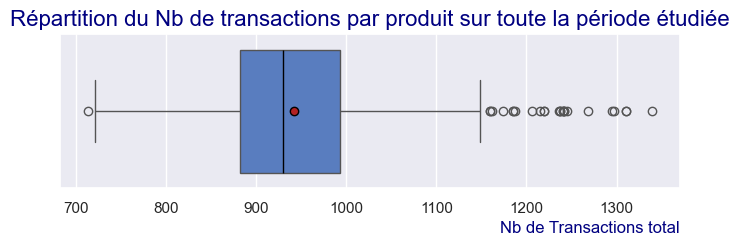

In [486]:
df_graph = (df_analyse_L1_L2_1_1[['day','transaction_id']] ).groupby(by=['day']).count()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par produit sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.5 - client_id</h4>
</div>

In [487]:
(df_analyse_L1_L2_1_1['client_id'] ).head(3)

0    c_329
1    c_664
2    c_580
Name: client_id, dtype: string

In [488]:
(df_analyse_L1_L2_1_1['client_id'] ).tail(3)

687531     c_488
687532    c_4848
687533    c_3575
Name: client_id, dtype: string

In [489]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['client_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],687534,687534,0,8600,0


In [490]:
((df_analyse_L1_L2_1_1['client_id'] ).value_counts() ).describe()

count        8600.0
mean      79.945814
std      313.532311
min             1.0
25%            28.0
50%            52.0
75%            97.0
max         25586.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
687 534 valeurs, dont 8 600 valeurs distinctes (ie clients distincts),  
pas de valeurs vides.  
Un client_id est impliqué dans 1 à 25 586 transactions !!!!

#### <font color='green'>**A. OBSERVATIONS CLIENTS et NOMBRES de TRANSACTIONS :**</font>

In [491]:
df_client_nb_achat_1 = (df_analyse_L1_L2_1_1['client_id'] ).value_counts()
df_client_nb_achat_1.describe()

count        8600.0
mean      79.945814
std      313.532311
min             1.0
25%            28.0
50%            52.0
75%            97.0
max         25586.0
Name: count, dtype: Float64

In [492]:
df_client_nb_achat_1bis = (df_analyse_L1_L2_1_1[['client_id','transaction_id']] ).groupby(by=['client_id']).count()
df_client_nb_achat_1bis.describe()

,transaction_id
count,8600.000000
mean,79.945814
std,313.532311
min,1.000000
25%,28.000000
50%,52.000000
75%,97.000000
max,25586.000000


In [493]:
df_client_nb_achat_1bis.head(3)

,transaction_id
client_id,
c_1,43
c_10,58
c_100,8


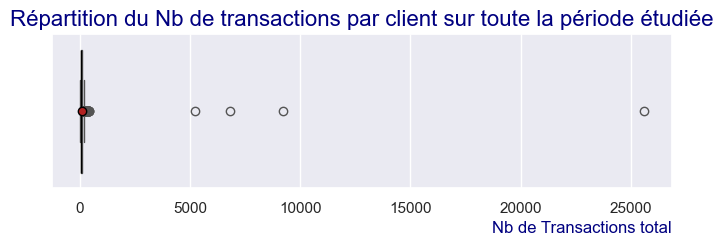

In [494]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis,x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

Nous avons 4 clients à plus de 5000 transactions sur la période.

In [495]:
mask_client_nb_achat_Gros_Client = df_client_nb_achat_1bis['transaction_id']>=5000

df_client_nb_achat_1bis_Gros_Client = df_client_nb_achat_1bis.loc[mask_client_nb_achat_Gros_Client,:]
df_client_nb_achat_1bis_Gros_Client.head()

,transaction_id
client_id,
c_1609,25586
c_3454,6793
c_4958,5222
c_6714,9199


In [496]:
index_client_Gros_Client = df_client_nb_achat_1bis_Gros_Client.index
index_client_Gros_Client

Index(['c_1609', 'c_3454', 'c_4958', 'c_6714'], dtype='string', name='client_id')

In [497]:
mask_client_nb_achat_Medium_Client = ~(df_client_nb_achat_1bis['transaction_id']>=5000)

df_client_nb_achat_1bis_Medium_Client = df_client_nb_achat_1bis.loc[mask_client_nb_achat_Medium_Client,:]
df_client_nb_achat_1bis_Medium_Client.head(3)

,transaction_id
client_id,
c_1,43
c_10,58
c_100,8


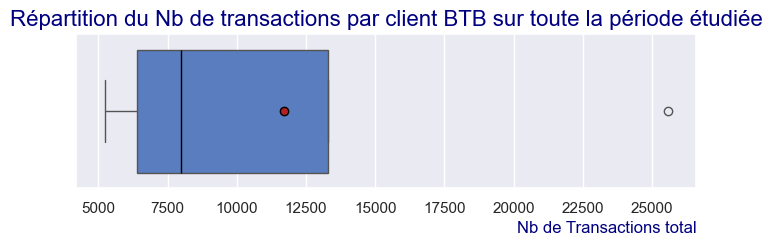

In [498]:
# 4  GROS clients : BOXPLOT NON PERTINENT POUR 4 clients
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis.loc[mask_client_nb_achat_Gros_Client,:],
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client BTB sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

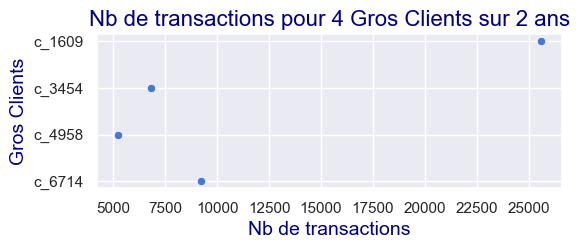

In [499]:
# 4 GROS CLIENTS SCATTERPLOT
plt.figure(figsize=(6,2))
plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

sns.scatterplot(data= df_client_nb_achat_1bis_Gros_Client,
                x=df_client_nb_achat_1bis_Gros_Client['transaction_id'],
                y=df_client_nb_achat_1bis_Gros_Client.index,
                #hue='product_type',
                #palette=palette_fixe
               )

plt.ylabel("Gros Clients",fontdict={'fontsize' : 14, 'color':'navy'})
plt.xlabel('Nb de transactions',fontdict={'fontsize' : 14, 'color':'navy'})
plt.grid()
#plt.ylim(0,1.5)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.02,1.02))
plt.title("Nb de transactions pour 4 Gros Clients sur 2 ans",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

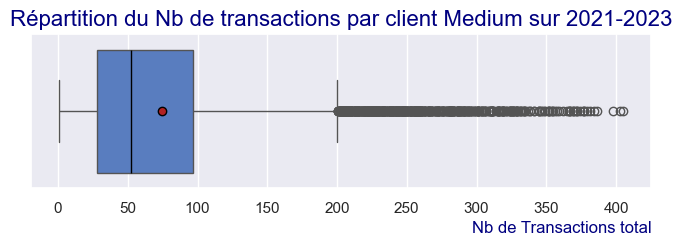

In [500]:
#clients Intermediaires
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis.loc[mask_client_nb_achat_Medium_Client,:],
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client Medium sur 2021-2023",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

**Remarque :**  
On a encore un grands nombres de clients ayant acheté entre 200 et 400 livres sur la période de 2 ans (du 01/03/2021 au 28/02/2023).  
ce qui fait 100 à 200 livres par an.  
On est encore probablement dans du BTB.  
100 livres par an ca fait environ 2 par semaine, 8 par mois.  
Imaginons qu'il lise beaucoup, fassse beaucoup de cadeaux-livres, ne lise pas tout ce qu'il achète (mis de côté ou collection).  
100 livres par an ca fait environ 2 par semaine, 8 par mois,  
ça pourrait faire par mois 4 livres lus, 2 livres mis de côté, 2 livres offerts;  
C'est encore raisonnable.

200 livres par an ça fait beaucoup, ça fait 4 livres par semaines, 16 livres par mois;  
ça pourrait faire par mois 8 livres lus, 4 livres mis de côté, 4 livres offerts.   
Dans certaines porfessions (comédien, metteur en scène, éditeur...) on lit beaucoup.  
Certaines personnes (passionnées, en retraite etc...) lisent plus que la moyenne.  


La Moyenne en France en 2023 et de 22 livres lus par an .  
Un gros lecteurs pourrait donc en lire le double 44,  
voir un peu plus 2,5*22 = 55 livres par an.  
Il pourrait en offrir et en mettre de côté.  
100 livres par an parait raisonnable (200 livres sur 2 ans).  
200 livres parait beaucoup (400 livres sur 2 ans).  

**Remarque :**  
Attention, une personne pourrait acheter les livres pour l'ensemble de son foyer et notamment pour les enfants.  
400 livres/2ans, 200livres/an , ~4livres/semaine  
pour un foyer de 4 personnes (avec notamment un grand nombres de livres pour enfant), cela fait :  
100 livres/2ans/pers, 50livres/an/pers , ~1 livre/semaine/semaine.  
pour des gros lecteurs, qui en plus en offre et ne lisent pas tous les livres achetés, cela parait plus raisonnable.


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.6 - id_prod</h4>
</div>

In [501]:
(df_analyse_L1_L2_1_1['id_prod'] ).head(3)

0    0_1259
1    0_1390
2    0_1352
Name: id_prod, dtype: string

In [502]:
(df_analyse_L1_L2_1_1['id_prod'] ).tail(3)

687531     1_695
687532    0_1547
687533    0_1398
Name: id_prod, dtype: string

In [503]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['id_prod'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687534,687534,0,3265,0


In [504]:
((df_analyse_L1_L2_1_1['id_prod'] ).value_counts() ).describe()

count        3265.0
mean     210.577029
std      337.807282
min             1.0
25%            17.0
50%            57.0
75%           242.0
max          2340.0
Name: count, dtype: Float64

In [505]:
(df_analyse_L1_L2_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()

,transaction_id
id_prod,
0_0,1242
0_1,487
0_10,22
0_100,3
0_1000,432
...,...
2_95,4
2_96,598
2_97,13


In [506]:
((df_analyse_L1_L2_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()).describe()

,transaction_id
count,3265.000000
mean,210.577029
std,337.807282
min,1.000000
25%,17.000000
50%,57.000000
75%,242.000000
max,2340.000000


##### **OBSERVATIONS :**  
687534 valeurs, dont 3265 valeurs distinctes, pas de valeurs vides.  
Une id_produit intervient dans 1 à 2340 transactions.

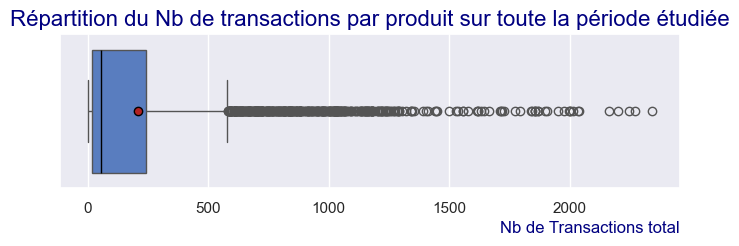

In [507]:
df_graph = (df_analyse_L1_L2_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par produit sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.7 - sex</h4>
</div>

In [508]:
(df_analyse_L1_L2_1_1['sex'] ).head(3)

0    f
1    m
2    m
Name: sex, dtype: string

In [509]:
(df_analyse_L1_L2_1_1['sex'] ).tail(3)

687531    f
687532    m
687533    f
Name: sex, dtype: string

In [510]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['sex'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sex,string[python],687534,687534,0,2,0


In [511]:
(df_analyse_L1_L2_1_1['sex'] ).value_counts()

sex
m    344841
f    342693
Name: count, dtype: Int64

In [512]:
((df_analyse_L1_L2_1_1['sex'] ).value_counts() ).describe()

count            2.0
mean        343767.0
std      1518.865366
min         342693.0
25%         343230.0
50%         343767.0
75%         344304.0
max         344841.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
687534 valeurs, dont 2 valeurs distinctes ( m et f), pas de valeurs vides.  
m impliqué dans 344 842 transactions  
f impliqué dans 342 693 transactions

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.7 - birth</h4>
</div>

In [513]:
(df_analyse_L1_L2_1_1['birth'] ).head(3)

0    1967
1    1960
2    1988
Name: birth, dtype: Int64

In [514]:
(df_analyse_L1_L2_1_1['birth'] ).tail(3)

687531    1985
687532    1953
687533    1981
Name: birth, dtype: Int64

In [515]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['birth'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
birth,Int64,687534,687534,0,76,0


In [516]:
((df_analyse_L1_L2_1_1['birth'] ).value_counts() ).describe()

count           76.0
mean          9046.5
std      8754.540807
min            170.0
25%          2373.25
50%           5802.0
75%         16060.25
max          47702.0
Name: count, dtype: Float64

In [517]:
(df_analyse_L1_L2_1_1['birth']).describe()

count       687534.0
mean     1977.817391
std        13.607935
min           1929.0
25%           1970.0
50%           1980.0
75%           1987.0
max           2004.0
Name: birth, dtype: Float64

##### **OBSERVATIONS :**  
687534 valeurs, dont 76 valeurs distinctes.  
Années de naissances comprises entre 1929 et 2004 (96 ans et 21 ans)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.7 - categ</h4>
</div>

In [518]:
(df_analyse_L1_L2_1_1['categ'] ).head(3)

0    0
1    0
2    0
Name: categ, dtype: string

In [519]:
(df_analyse_L1_L2_1_1['categ'] ).tail(3)

687531    1
687532    0
687533    0
Name: categ, dtype: string

In [520]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['categ'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
categ,string[python],687534,687534,0,3,0


In [521]:
(df_analyse_L1_L2_1_1['categ'] ).value_counts()

categ
0    415459
1    235592
2     36483
Name: count, dtype: Int64

In [522]:
#((df_analyse_L1_L2_1_1['categ'] ).value_counts() ).describe()

##### **OBSERVATIONS :**  
687534 valeurs, dont 3 valeurs distinctes ( 0, 1 et 2), pas de valeurs vides.  
Suur la période d'étude :  
0 impliqué dans 415 459 transactions  
1 impliqué dans 235 592 transactions  
2 impliqué dans 36 483 transactions

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.8 - price</h4>
</div>

In [523]:
(df_analyse_L1_L2_1_1['price'] ).head(3)

0    11.99
1    19.37
2     4.50
Name: price, dtype: float64

In [524]:
(df_analyse_L1_L2_1_1['price'] ).tail(3)

687531    26.99
687532     8.99
687533     4.52
Name: price, dtype: float64

In [525]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_L1_L2_1_1['price'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
price,float64,687534,687534,0,1442,0


In [526]:
#(df_analyse_L1_L2_1_1['price'] ).value_counts()

In [527]:
df_nb_transac_GB_prod_1 = df_analyse_L1_L2_1_1.groupby(by=['id_prod','price','categ'],as_index=False).agg({'transaction_id':'count'})
df_nb_transac_GB_prod_1

,id_prod,price,categ,transaction_id
0,0_0,3.75,0,1242
1,0_1,10.99,0,487
2,0_10,17.95,0,22
3,0_100,20.60,0,3
4,0_1000,6.84,0,432
...,...,...,...,...
3260,2_95,98.99,2,4
3261,2_96,47.91,2,598
3262,2_97,160.99,2,13
3263,2_98,149.74,2,1


In [528]:
df_nb_transac_GB_prod_1.shape

(3265, 4)

In [529]:
(df_analyse_L1_L2_1_1['price'] ).describe()

count    687534.000000
mean         17.493918
std          18.238337
min           0.620000
25%           8.990000
50%          13.990000
75%          19.080000
max         300.000000
Name: price, dtype: float64

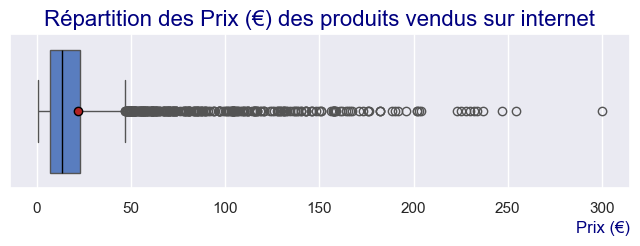

In [530]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='price',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus sur internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

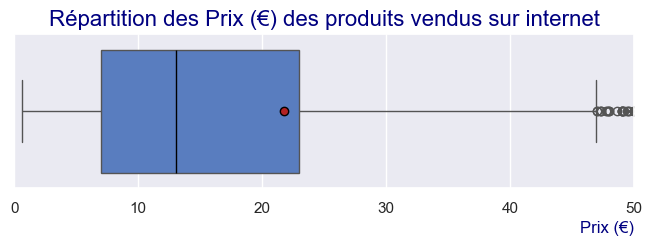

In [531]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='price',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
plt.xlim(0,50)
plt.grid(axis='x')
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus sur internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

##### **OBSERVATIONS :**  
687534 valeurs, dont 1442 valeurs distinctes (poru 3265 produits vendus sur internet), 
pas de valeurs vides.  
Prix min : 0,62 euros  
Prix max : 300 euros  
moyenne : 17.493918mediane : 13.99  
ecart-type : 18.237

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.1 - Analyse Globale des variables</h4>
</div>

In [532]:
df_analyse_L1_L2_1_1.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1,s_1,2021-03-01 00:01:07.843138,2021-03-01,c_329,f,1967,0_1259,11.99,0
1,t_2,s_2,2021-03-01 00:02:26.047414,2021-03-01,c_664,m,1960,0_1390,19.37,0
2,t_3,s_3,2021-03-01 00:02:38.311413,2021-03-01,c_580,m,1988,0_1352,4.50,0


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 4bis - PREMIERES ANALYSES SIMPLES AVEC OUTER_1_OUTER_2 </h2>
</div>

##### **Travaillons sur une copie :**

In [533]:
#Travaillons sur une copie :
df_analyse_O1_O2_1_1 = df_merge_O1_O2_final.copy(deep=True) 

In [534]:
#Travaillons sur une copie :
df_analyse_O1_O2_transactions_1_1 = df_merge_O1_O2_final_transactions.copy(deep=True) 
df_analyse_O1_O2_customers_1_1 = df_merge_O1_O2_final_customers.copy(deep=True) 
df_analyse_O1_O2_products_1_1 = df_merge_O1_O2_final_products.copy(deep=True) 


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">4bis.1 - ANALYSES DIVERS VARIABLES</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.1 - Analyse Globale des variables</h4>
</div>

In [535]:
df_analyse_O1_O2_1_1.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0
2,t_362246,s_180968,2022-03-18 16:40:10.068303,2022-03-18,c_1011,f,1999,0_0,3.75,0


In [536]:
df_analyse_O1_O2_1_1.shape

(687576, 10)

In [537]:
df_analyse_O1_O2_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 687576 entries, 0 to 687575
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   transaction_id  687534 non-null  string        
 1   session_id      687534 non-null  string        
 2   date            687534 non-null  datetime64[ns]
 3   day             687534 non-null  datetime64[ns]
 4   client_id       687555 non-null  string        
 5   sex             687555 non-null  string        
 6   birth           687555 non-null  Int64         
 7   id_prod         687555 non-null  string        
 8   price           687555 non-null  float64       
 9   categ           687555 non-null  string        
dtypes: Int64(1), datetime64[ns](2), float64(1), string(6)
memory usage: 53.1 MB


In [538]:
Description_Fichier_Tableau_avc_ValBlanches ( df_analyse_O1_O2_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687576,687534,42,687535,0
session_id,string[python],687576,687534,42,345506,0
date,datetime64[ns],687576,687534,42,687416,0
day,datetime64[ns],687576,687534,42,731,0
client_id,string[python],687576,687555,21,8622,0
sex,string[python],687576,687555,21,3,0
birth,Int64,687576,687555,21,77,0
id_prod,string[python],687576,687555,21,3287,0
price,float64,687576,687555,21,1455,0
categ,string[python],687576,687555,21,4,0


In [539]:
df_analyse_O1_O2_1_1.describe()

,date,day,birth,price
count,687534,687534,687555.0,687555.000000
mean,2022-03-01 21:24:00.618519040,2022-03-01 09:22:26.987929600,1977.817591,17.494540
min,2021-03-01 00:01:07.843138,2021-03-01 00:00:00,1929.0,0.620000
25%,2021-09-10 10:35:20.642323456,2021-09-10 00:00:00,1970.0,8.990000
50%,2022-02-27 06:50:25.400120064,2022-02-27 00:00:00,1980.0,13.990000
75%,2022-08-28 22:16:49.841665536,2022-08-28 00:00:00,1987.0,19.080000
max,2023-02-28 23:58:30.792755,2023-02-28 00:00:00,2004.0,300.000000
std,NaN,NaN,13.608198,18.240963


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.2 - transaction_id</h4>
</div>

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK TRANSACTIONS

In [540]:
(df_analyse_O1_O2_1_1['transaction_id'] ).head(3)

0      t_1818
1    t_334688
2    t_362246
Name: transaction_id, dtype: string

In [541]:
(df_analyse_O1_O2_1_1['transaction_id'] ).tail(3)

687573    <NA>
687574    <NA>
687575    <NA>
Name: transaction_id, dtype: string

In [542]:
Description_Fichier_Tableau_avc_ValBlanches( df_analyse_O1_O2_1_1['transaction_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687576,687534,42,687535,0


##### **TRAVAIL SUR LES VALEURS MAXIMALES ET MINIMALES (pas utile ?)**

In [543]:
#PREMIERE VALEURS
((df_analyse_O1_O2_1_1['transaction_id'] ).sort_values(ascending=True) ).head(2)

79036      t_1
602202    t_10
Name: transaction_id, dtype: string

In [544]:
#DERNIERES VALEURS
((df_analyse_O1_O2_1_1['transaction_id'] ).sort_values(ascending=True) ).tail(2)

687574    <NA>
687575    <NA>
Name: transaction_id, dtype: string

Remarque :  
Je ne peux pas utiliser l'ordre alpha numérique car t_687534 est avant t_9

In [545]:
type(df_analyse_O1_O2_1_1['transaction_id'])

pandas.core.series.Series

In [546]:
df_num_transactions_1b = (df_analyse_O1_O2_1_1['transaction_id'] ).str.replace("t_", "")
df_num_transactions_1b.head(2)

0      1818
1    334688
Name: transaction_id, dtype: string

**ATTENTION :**  
Mettre Int64 si besoin de gérer les Nan

In [547]:
df_num_transactions_2b = df_num_transactions_1b.astype(dtype='Int64')

In [548]:
df_num_transactions_2b.dtype

Int64Dtype()

In [549]:
#PREMIERES VALEURS
((df_num_transactions_2b).sort_values(ascending=True) ).head(2)

79036     1
142762    2
Name: transaction_id, dtype: Int64

In [550]:
#DERNIERES VALEURS
((df_num_transactions_2b).sort_values(ascending=True) ).tail(2)

687574    <NA>
687575    <NA>
Name: transaction_id, dtype: Int64

##### **FIN - TRAVAIL SUR LES VALEURS MAXIMALES ET MINIMALES (pas utile ?)**

##### **PAS D'INFORMATION PARTICULIERE :**  
687534 valeurs distinctes +42NAN

##### **SUR LE FICHIER RESTREINT AUX TRANSACTIONS NON VIDES :**

In [551]:
#REMARQUE sur le fichier concernant que les transactions :
Description_Fichier_Tableau_avc_ValBlanches( df_analyse_O1_O2_transactions_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],687534,687534,0,687534,0
session_id,string[python],687534,687534,0,345505,0
date,datetime64[ns],687534,687534,0,687415,0
day,datetime64[ns],687534,687534,0,730,0
client_id,string[python],687534,687534,0,8600,0
sex,string[python],687534,687534,0,2,0
birth,Int64,687534,687534,0,76,0
id_prod,string[python],687534,687534,0,3265,0
price,float64,687534,687534,0,1442,0
categ,string[python],687534,687534,0,3,0


##### **SUR LE FICHIER RESTREINT AUX TRANSACTIONS NON VIDES :**  
687534 valeurs distinctes, pas de valeurs vides

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.3 - session_id</h4>
</div>

##### <font color='green'>**A. Sur df_analyse_O1_O2_1_1 :**</font>

In [552]:
(df_analyse_O1_O2_1_1['session_id'] ).head(3)

0       s_908
1    s_167174
2    s_180968
Name: session_id, dtype: string

In [553]:
(df_analyse_O1_O2_1_1['session_id'] ).tail(3)

687573    <NA>
687574    <NA>
687575    <NA>
Name: session_id, dtype: string

In [554]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['session_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
session_id,string[python],687576,687534,42,345506,0


In [555]:
((df_analyse_O1_O2_1_1['session_id'] ).value_counts() ).describe()

count    345505.0
mean     1.989939
std      1.276025
min           1.0
25%           1.0
50%           2.0
75%           3.0
max          14.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
687534 valeurs (+42 NAN), dont 345505 valeurs distinctes(+1 NAN).  
Une session_id contient de 1 à 14 transactions.

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK TRANSACTIONS

##### <font color='green'>**B. Sur df_analyse_O1_O2_transactions_1_1 :**</font>

In [556]:
(df_analyse_O1_O2_transactions_1_1['session_id'] ).head(3)

0       s_908
1    s_167174
2    s_180968
Name: session_id, dtype: string

In [557]:
(df_analyse_O1_O2_transactions_1_1['session_id'] ).tail(3)

687552     s_61009
687553    s_296127
687554    s_310606
Name: session_id, dtype: string

In [558]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_transactions_1_1['session_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
session_id,string[python],687534,687534,0,345505,0


In [559]:
((df_analyse_O1_O2_transactions_1_1['session_id'] ).value_counts() ).describe()

count    345505.0
mean     1.989939
std      1.276025
min           1.0
25%           1.0
50%           2.0
75%           3.0
max          14.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
687534 valeurs, dont 345505 valeurs distinctes, plus de valeurs vides.  
Une session_id contient de 1 à 14 transactions.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.4 - date (peu intéressant) </h4>
</div>

##### <font color='green'>**A. Sur df_analyse_O1_O2_1_1 :**</font>

In [560]:
(df_analyse_O1_O2_1_1['date'] ).head(3)

0   2021-03-02 21:57:33.862118
1   2022-02-18 16:40:10.068303
2   2022-03-18 16:40:10.068303
Name: date, dtype: datetime64[ns]

In [561]:
(df_analyse_O1_O2_1_1['date'] ).tail(3)

687573   NaT
687574   NaT
687575   NaT
Name: date, dtype: datetime64[ns]

In [562]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['date'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
date,datetime64[ns],687576,687534,42,687416,0


In [563]:
((df_analyse_O1_O2_1_1['date'] ).value_counts() ).describe()

count    687415.000000
mean          1.000173
std           0.013156
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           2.000000
Name: count, dtype: float64

##### **OBSERVATIONS :**  
687 534 valeurs (+42 NaT), dont 687 415 valeurs distinctes (119 valeurs identiques)+1 NAT.  
Une dateStamp est impliquée dans 1 à 2 transactions !!!!

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK TRANSACTIONS

##### <font color='green'>**B. Sur df_analyse_O1_O2_transactions_1_1 :**</font>

In [564]:
(df_analyse_O1_O2_transactions_1_1['date'] ).head(3)

0   2021-03-02 21:57:33.862118
1   2022-02-18 16:40:10.068303
2   2022-03-18 16:40:10.068303
Name: date, dtype: datetime64[ns]

In [565]:
(df_analyse_O1_O2_transactions_1_1['date'] ).tail(3)

687552   2021-07-11 20:56:49.820935
687553   2022-11-11 20:56:49.820935
687554   2022-12-11 20:56:49.820935
Name: date, dtype: datetime64[ns]

In [566]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_transactions_1_1['date'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
date,datetime64[ns],687534,687534,0,687415,0


In [567]:
((df_analyse_O1_O2_transactions_1_1['date'] ).value_counts() ).describe()

count    687415.000000
mean          1.000173
std           0.013156
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           2.000000
Name: count, dtype: float64

##### **OBSERVATIONS :**  
687 534 valeurs, dont 687 415 valeurs distinctes (119 valeurs identiques),  
pas de valeurs vides.  
Une dateStamp est impliquée dans 1 à 2 transactions !!!!

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK TRANSACTIONS

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.4bis - day (plus intéressant que date)</h4>
</div>

ETUDE sur la COLONNE DAY (une colonne HOUR n'est pas nécessaire a priori)  
Afin de pouvoir regrouper par jour (et se libérer de la distinction entre 2 dates du même jour par l'heure)

##### <font color='green'>**A. Sur df_analyse_O1_O2_1_1 (peu intéressant):**</font>

In [568]:
(df_analyse_O1_O2_1_1['day'] ).head(3)

0   2021-03-02
1   2022-02-18
2   2022-03-18
Name: day, dtype: datetime64[ns]

In [569]:
(df_analyse_O1_O2_1_1['day'] ).tail(3)

687573   NaT
687574   NaT
687575   NaT
Name: day, dtype: datetime64[ns]

In [570]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['day'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
day,datetime64[ns],687576,687534,42,731,0


In [571]:
((df_analyse_O1_O2_1_1['day'] ).value_counts() ).describe()

count     730.000000
mean      941.827397
std       104.116429
min       713.000000
25%       882.250000
50%       930.000000
75%       993.000000
max      1339.000000
Name: count, dtype: float64

##### **OBSERVATIONS :**  
687 534 valeurs+42 NaT, dont 730 valeurs distinctes+1 NaT.  
Une Jour-day est impliquée dans 713 à 1339 transactions !

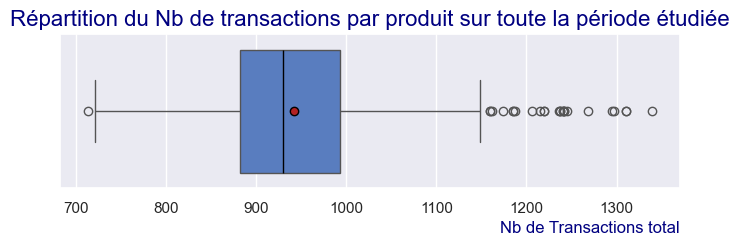

In [572]:
df_graph = (df_analyse_O1_O2_1_1[['day','transaction_id']] ).groupby(by=['day']).count()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par produit sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK TRANSACTIONS

##### <font color='green'>**B. Sur df_analyse_O1_O2_transactions_1_1 (plus intéressant) :**</font>

In [573]:
(df_analyse_O1_O2_transactions_1_1['day'] ).head(3)

0   2021-03-02
1   2022-02-18
2   2022-03-18
Name: day, dtype: datetime64[ns]

In [574]:
(df_analyse_O1_O2_transactions_1_1['day'] ).tail(3)

687552   2021-07-11
687553   2022-11-11
687554   2022-12-11
Name: day, dtype: datetime64[ns]

In [575]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_transactions_1_1['day'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
day,datetime64[ns],687534,687534,0,730,0


In [576]:
((df_analyse_O1_O2_transactions_1_1['day'] ).value_counts() ).describe()

count     730.000000
mean      941.827397
std       104.116429
min       713.000000
25%       882.250000
50%       930.000000
75%       993.000000
max      1339.000000
Name: count, dtype: float64

##### **OBSERVATIONS :**  
687 534 valeurs, dont 730 valeurs distinctes,  
pas de valeurs vides.  
Une Jour-day est impliquée dans 713 à 1339 transactions !

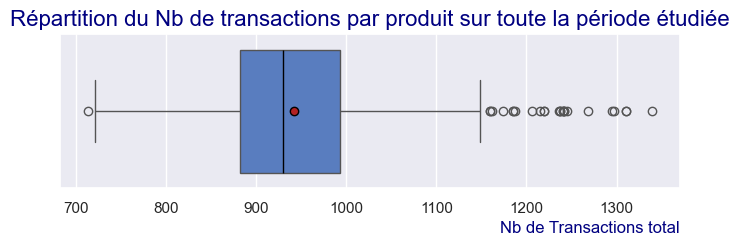

In [577]:
df_graph = (df_analyse_O1_O2_1_1[['day','transaction_id']] ).groupby(by=['day']).count()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par produit sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.5 - client_id</h4>
</div>

##### <font color='green'>**A. Sur df_analyse_O1_O2_1_1 (peu intéressant):**</font>

In [578]:
(df_analyse_O1_O2_1_1['client_id'] ).head(3)

0    c_1004
1    c_1011
2    c_1011
Name: client_id, dtype: string

In [579]:
(df_analyse_O1_O2_1_1['client_id'] ).tail(3)

687573    c_8381
687574     c_862
687575      c_90
Name: client_id, dtype: string

In [580]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['client_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],687576,687555,21,8622,0


In [581]:
((df_analyse_O1_O2_1_1['client_id'] ).value_counts() ).describe()

count        8621.0
mean      79.753509
std      313.174348
min             1.0
25%            28.0
50%            52.0
75%            97.0
max         25586.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
8 621 valeurs distinctes (ie clients distincts)+1NaN.  
Un client_id est impliqué dans 0 à 25 586 transactions !!!! (0 car on compte les client_id donc on a au moins 1)

##### <font color='blue'>**A.1 OBSERVATIONS CLIENTS et NOMBRES de TRANSACTIONS :**</font>

In [582]:
#df_analyse_O1_O2_1_1.groupby(by='client_id')['transaction_id'].nunique()

In [583]:
#df_analyse_O1_O2_1_1.groupby(by='client_id')['transaction_id'].nunique().describe()

In [584]:
#df_analyse_O1_O2_1_1.groupby(by='client_id')['transaction_id'].nunique().reset_index(name='distinct_transaction_count')

In [585]:
#df_client_nb_achat_1 = df_analyse_O1_O2_1_1.groupby(by='client_id')['transaction_id'].nunique()
#df_client_nb_achat_1

In [586]:
#df_client_nb_achat_1.describe()

In [587]:
df_client_nb_achat_1bis = (df_analyse_O1_O2_1_1[['client_id','transaction_id']] ).groupby(by=['client_id']).nunique()
df_client_nb_achat_1bis.head(3)

,transaction_id
client_id,
c_1,43
c_10,58
c_100,8


In [588]:
df_client_nb_achat_1bis.describe()

,transaction_id
count,8621.000000
mean,79.751073
std,313.174965
min,0.000000
25%,28.000000
50%,52.000000
75%,97.000000
max,25586.000000


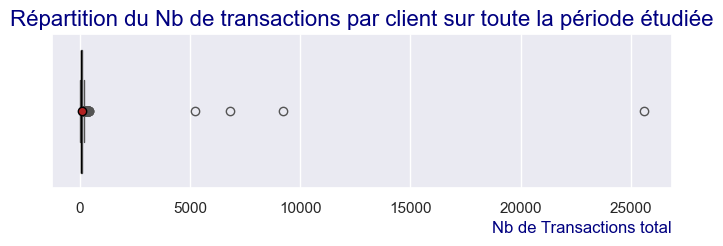

In [589]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

Nous avons 4 clients à plus de 5000 transactions sur la période.

In [590]:
mask_client_nb_achat_Gros_Client = df_client_nb_achat_1bis['transaction_id']>=5000

df_client_nb_achat_1bis_Gros_Client = df_client_nb_achat_1bis.loc[mask_client_nb_achat_Gros_Client,:]
df_client_nb_achat_1bis_Gros_Client.head()

,transaction_id
client_id,
c_1609,25586
c_3454,6793
c_4958,5222
c_6714,9199


In [591]:
index_client_Gros_Client = df_client_nb_achat_1bis_Gros_Client.index
index_client_Gros_Client

Index(['c_1609', 'c_3454', 'c_4958', 'c_6714'], dtype='string', name='client_id')

In [592]:
mask_client_nb_achat_Medium_Client = ~(df_client_nb_achat_1bis['transaction_id']>=5000)

df_client_nb_achat_1bis_Medium_Client = df_client_nb_achat_1bis.loc[mask_client_nb_achat_Medium_Client,:]
df_client_nb_achat_1bis_Medium_Client.head(3)

,transaction_id
client_id,
c_1,43
c_10,58
c_100,8


In [593]:
## 4  GROS clients : BOXPLOT NON PERTINENT POUR 4 clients
#plt.figure(figsize=(8,2))
#plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})<
#
#sns.set_theme(style='dark', palette='muted')
#sns.boxplot(data=df_client_nb_achat_1bis.loc[mask_client_nb_achat_Gros_Client,:],
#            x='transaction_id',
#            #"hue='product_type',
#            medianprops = {'color':"black"},#caract de l'indice de la médiane
#            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
#            #caract de l'indice de la moyenne
#            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
#            #hue_order= ...
#           )
##plt.xlim(0,250)
#plt.grid(axis='x')
#plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
##plt.legend()
#plt.title("Répartition du Nb de transactions par client BTB sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
#plt.show()

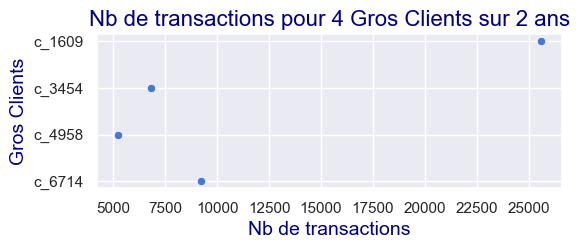

In [594]:
# 4 GROS CLIENTS SCATTERPLOT
plt.figure(figsize=(6,2))
plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

sns.scatterplot(data= df_client_nb_achat_1bis_Gros_Client,
                x=df_client_nb_achat_1bis_Gros_Client['transaction_id'],
                y=df_client_nb_achat_1bis_Gros_Client.index,
                #hue='product_type',
                #palette=palette_fixe
               )

plt.ylabel("Gros Clients",fontdict={'fontsize' : 14, 'color':'navy'})
plt.xlabel('Nb de transactions',fontdict={'fontsize' : 14, 'color':'navy'})
plt.grid()
#plt.ylim(0,1.5)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.02,1.02))
plt.title("Nb de transactions pour 4 Gros Clients sur 2 ans",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

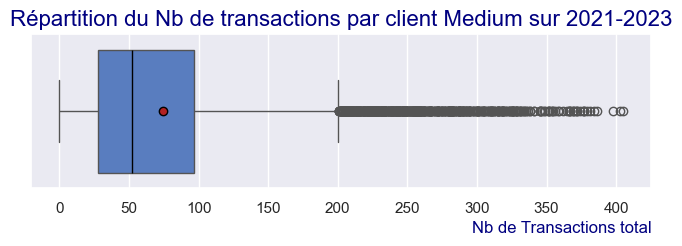

In [595]:
#clients Intermediaires
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis.loc[mask_client_nb_achat_Medium_Client,:],
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client Medium sur 2021-2023",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

**Remarque :**  
On a encore un grands nombres de clients ayant acheté entre 200 et 400 livres sur la période de 2 ans (du 01/03/2021 au 28/02/2023).  
ce qui fait 100 à 200 livres par an.  
On est encore probablement dans du BTB.  
100 livres par an ca fait environ 2 par semaine, 8 par mois.  
Imaginons qu'il lise beaucoup, fassse beaucoup de cadeaux-livres, ne lise pas tout ce qu'il achète (mis de côté ou collection).  
100 livres par an ca fait environ 2 par semaine, 8 par mois,  
ça pourrait faire par mois 4 livres lus, 2 livres mis de côté, 2 livres offerts;  
C'est encore raisonnable.

200 livres par an ça fait beaucoup, ça fait 4 livres par semaines, 16 livres par mois;  
ça pourrait faire par mois 8 livres lus, 4 livres mis de côté, 4 livres offerts.   
Dans certaines porfessions (comédien, metteur en scène, éditeur...) on lit beaucoup.  
Certaines personnes (passionnées, en retraite etc...) lisent plus que la moyenne.  


La Moyenne en France en 2023 et de 22 livres lus par an .  
Un gros lecteurs pourrait donc en lire le double 44,  
voir un peu plus 2,5*22 = 55 livres par an.  
Il pourrait en offrir et en mettre de côté.  
100 livres par an parait raisonnable (200 livres sur 2 ans).  
200 livres parait beaucoup (400 livres sur 2 ans).  

**Remarque :**  
Attention, une personne pourrait acheter les livres pour l'ensemble de son foyer et notamment pour les enfants.  
400 livres/2ans, 200livres/an , ~4livres/semaine  
pour un foyer de 4 personnes (avec notamment un grand nombres de livres pour enfant), cela fait :  
100 livres/2ans/pers, 50livres/an/pers , ~1 livre/semaine/semaine.  
pour des gros lecteurs, qui en plus en offre et ne lisent pas tous les livres achetés, cela parait plus raisonnable.


**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK CLIENTS

##### <font color='green'>**B. Sur df_analyse_O1_O2_customers_1_1 (plus intéressant):**</font>

In [596]:
(df_analyse_O1_O2_customers_1_1['client_id'] ).head(3)

0    c_1004
1    c_1011
2    c_1011
Name: client_id, dtype: string

In [597]:
(df_analyse_O1_O2_customers_1_1['client_id'] ).tail(3)

687573    c_8381
687574     c_862
687575      c_90
Name: client_id, dtype: string

In [598]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_customers_1_1['client_id'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
client_id,string[python],687555,687555,0,8621,0


In [599]:
((df_analyse_O1_O2_customers_1_1['client_id'] ).value_counts() ).describe()

count        8621.0
mean      79.753509
std      313.174348
min             1.0
25%            28.0
50%            52.0
75%            97.0
max         25586.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
687 555 valeurs (dont 21 clients sans transactions),  
8 621 valeurs distinctes (ie clients distincts), (dont 21 clients sans transactions),  
pas de valeurs vides.  
Un client_id est impliqué dans 0 à 25 586 transactions !!!! (0 car on compte les client_id donc on a au moins 1)

##### <font color='blue'>**B.1 OBSERVATIONS CLIENTS et NOMBRES de TRANSACTIONS :**</font>

In [600]:
#df_analyse_O1_O2_customers_1_1.groupby(by='client_id')['transaction_id'].nunique()

In [601]:
#df_analyse_O1_O2_customers_1_1.groupby(by='client_id')['transaction_id'].nunique().describe()

In [602]:
#df_analyse_O1_O2_customers_1_1.groupby(by='client_id')['transaction_id'].nunique().reset_index(name='distinct_transaction_count')

In [603]:
#df_client_nb_achat_1 = df_analyse_O1_O2_customers_1_1.groupby(by='client_id')['transaction_id'].nunique()
#df_client_nb_achat_1

In [604]:
#df_client_nb_achat_1.describe()

In [605]:
df_client_nb_achat_1bis = (df_analyse_O1_O2_customers_1_1[['client_id','transaction_id']] ).groupby(by=['client_id']).nunique()
df_client_nb_achat_1bis.head(3)

,transaction_id
client_id,
c_1,43
c_10,58
c_100,8


In [606]:
df_client_nb_achat_1bis.describe()

,transaction_id
count,8621.000000
mean,79.751073
std,313.174965
min,0.000000
25%,28.000000
50%,52.000000
75%,97.000000
max,25586.000000


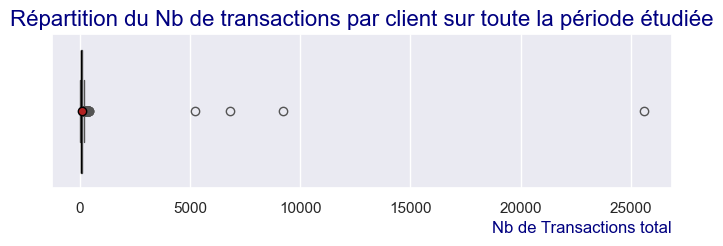

In [607]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

Nous avons 4 clients à plus de 5000 transactions sur la période.

In [608]:
mask_client_nb_achat_Gros_Client = df_client_nb_achat_1bis['transaction_id']>=5000

df_client_nb_achat_1bis_Gros_Client = df_client_nb_achat_1bis.loc[mask_client_nb_achat_Gros_Client,:]
df_client_nb_achat_1bis_Gros_Client.head()

,transaction_id
client_id,
c_1609,25586
c_3454,6793
c_4958,5222
c_6714,9199


In [609]:
index_client_Gros_Client = df_client_nb_achat_1bis_Gros_Client.index
index_client_Gros_Client

Index(['c_1609', 'c_3454', 'c_4958', 'c_6714'], dtype='string', name='client_id')

In [610]:
mask_client_nb_achat_Medium_Client = ~(df_client_nb_achat_1bis['transaction_id']>=5000)

df_client_nb_achat_1bis_Medium_Client = df_client_nb_achat_1bis.loc[mask_client_nb_achat_Medium_Client,:]
df_client_nb_achat_1bis_Medium_Client.head(3)

,transaction_id
client_id,
c_1,43
c_10,58
c_100,8


In [611]:
## 4  GROS clients : BOXPLOT NON PERTINENT POUR 4 clients
#plt.figure(figsize=(8,2))
#plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})<
#
#sns.set_theme(style='dark', palette='muted')
#sns.boxplot(data=df_client_nb_achat_1bis.loc[mask_client_nb_achat_Gros_Client,:],
#            x='transaction_id',
#            #"hue='product_type',
#            medianprops = {'color':"black"},#caract de l'indice de la médiane
#            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
#            #caract de l'indice de la moyenne
#            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
#            #hue_order= ...
#           )
##plt.xlim(0,250)
#plt.grid(axis='x')
#plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
##plt.legend()
#plt.title("Répartition du Nb de transactions par client BTB sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
#plt.show()

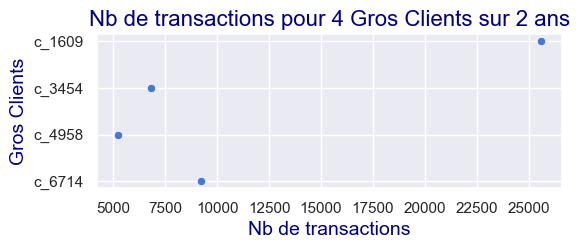

In [612]:
# 4 GROS CLIENTS SCATTERPLOT
plt.figure(figsize=(6,2))
plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

sns.scatterplot(data= df_client_nb_achat_1bis_Gros_Client,
                x=df_client_nb_achat_1bis_Gros_Client['transaction_id'],
                y=df_client_nb_achat_1bis_Gros_Client.index,
                #hue='product_type',
                #palette=palette_fixe
               )

plt.ylabel("Gros Clients",fontdict={'fontsize' : 14, 'color':'navy'})
plt.xlabel('Nb de transactions',fontdict={'fontsize' : 14, 'color':'navy'})
plt.grid()
#plt.ylim(0,1.5)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.02,1.02))
plt.title("Nb de transactions pour 4 Gros Clients sur 2 ans",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

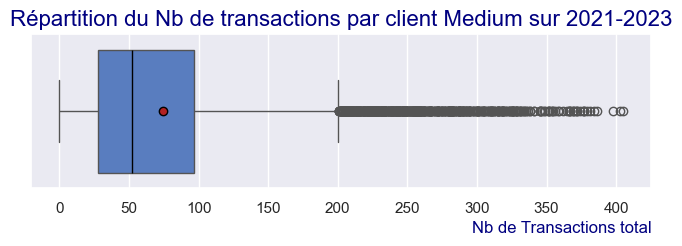

In [613]:
#clients Intermediaires
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_client_nb_achat_1bis.loc[mask_client_nb_achat_Medium_Client,:],
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par client Medium sur 2021-2023",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

**Remarque :**  
On a encore un grands nombres de clients ayant acheté entre 200 et 400 livres sur la période de 2 ans (du 01/03/2021 au 28/02/2023).  
ce qui fait 100 à 200 livres par an.  
On est encore probablement dans du BTB.  
100 livres par an ca fait environ 2 par semaine, 8 par mois.  
Imaginons qu'il lise beaucoup, fassse beaucoup de cadeaux-livres, ne lise pas tout ce qu'il achète (mis de côté ou collection).  
100 livres par an ca fait environ 2 par semaine, 8 par mois,  
ça pourrait faire par mois 4 livres lus, 2 livres mis de côté, 2 livres offerts;  
C'est encore raisonnable.

200 livres par an ça fait beaucoup, ça fait 4 livres par semaines, 16 livres par mois;  
ça pourrait faire par mois 8 livres lus, 4 livres mis de côté, 4 livres offerts.   
Dans certaines porfessions (comédien, metteur en scène, éditeur...) on lit beaucoup.  
Certaines personnes (passionnées, en retraite etc...) lisent plus que la moyenne.  


La Moyenne en France en 2023 et de 22 livres lus par an .  
Un gros lecteurs pourrait donc en lire le double 44,  
voir un peu plus 2,5*22 = 55 livres par an.  
Il pourrait en offrir et en mettre de côté.  
100 livres par an parait raisonnable (200 livres sur 2 ans).  
200 livres parait beaucoup (400 livres sur 2 ans).  

**Remarque :**  
Attention, une personne pourrait acheter les livres pour l'ensemble de son foyer et notamment pour les enfants.  
400 livres/2ans, 200livres/an , ~4livres/semaine  
pour un foyer de 4 personnes (avec notamment un grand nombres de livres pour enfant), cela fait :  
100 livres/2ans/pers, 50livres/an/pers , ~1 livre/semaine/semaine.  
pour des gros lecteurs, qui en plus en offre et ne lisent pas tous les livres achetés, cela parait plus raisonnable.


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.6 - id_prod</h4>
</div>

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK PRODUITS

##### <font color='green'>**A. Sur df_analyse_O1_O2_1_1 (peu intéressant):**</font>

In [614]:
(df_analyse_O1_O2_1_1['id_prod'] ).head(3)

0    0_0
1    0_0
2    0_0
Name: id_prod, dtype: string

In [615]:
(df_analyse_O1_O2_1_1['id_prod'] ).tail(3)

687573    <NA>
687574    <NA>
687575    <NA>
Name: id_prod, dtype: string

In [616]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['id_prod'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687576,687555,21,3287,0


In [617]:
((df_analyse_O1_O2_1_1['id_prod'] ).value_counts() ).describe()

count        3286.0
mean     209.237675
std      337.139814
min             1.0
25%            16.0
50%            56.0
75%           240.0
max          2340.0
Name: count, dtype: Float64

In [618]:
(df_analyse_O1_O2_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()

,transaction_id
id_prod,
0_0,1242
0_1,487
0_10,22
0_100,3
0_1000,432
...,...
2_95,4
2_96,598
2_97,13


In [619]:
((df_analyse_O1_O2_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()).describe()

,transaction_id
count,3286.000000
mean,209.231284
std,337.143772
min,0.000000
25%,16.000000
50%,56.000000
75%,240.000000
max,2340.000000


##### **OBSERVATIONS :**  
687555 valeurs+21 NAN,  
dont 3286 valeurs distinctes +1 NAN.  
Une id_produit intervient dans 0 à 2340 transactions.

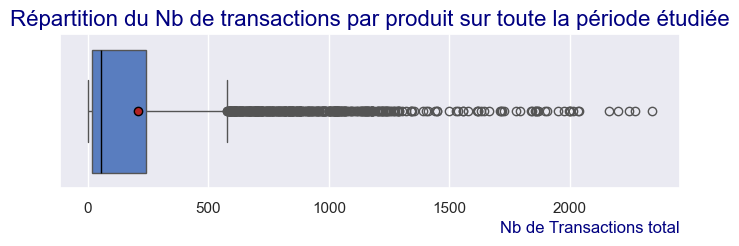

In [620]:
df_graph = (df_analyse_O1_O2_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par produit sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

##### <font color='green'>**B. Sur df_analyse_O1_O2_products_1_1 (plus intéressant):**</font>

In [621]:
(df_analyse_O1_O2_products_1_1['id_prod'] ).head(3)

0    0_0
1    0_0
2    0_0
Name: id_prod, dtype: string

In [622]:
(df_analyse_O1_O2_products_1_1['id_prod'] ).tail(3)

687552    2_99
687553    2_99
687554    2_99
Name: id_prod, dtype: string

In [623]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_products_1_1['id_prod'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_prod,string[python],687555,687555,0,3286,0


In [624]:
((df_analyse_O1_O2_products_1_1['id_prod'] ).value_counts() ).describe()

count        3286.0
mean     209.237675
std      337.139814
min             1.0
25%            16.0
50%            56.0
75%           240.0
max          2340.0
Name: count, dtype: Float64

In [625]:
(df_analyse_O1_O2_products_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()

,transaction_id
id_prod,
0_0,1242
0_1,487
0_10,22
0_100,3
0_1000,432
...,...
2_95,4
2_96,598
2_97,13


In [626]:
((df_analyse_O1_O2_products_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()).describe()

,transaction_id
count,3286.000000
mean,209.231284
std,337.143772
min,0.000000
25%,16.000000
50%,56.000000
75%,240.000000
max,2340.000000


##### **OBSERVATIONS :**  
687555 valeurs,  
dont 3286 valeurs distinctes,  
pass de valeurs vides.  
Une id_produit intervient dans 0 à 2340 transactions.

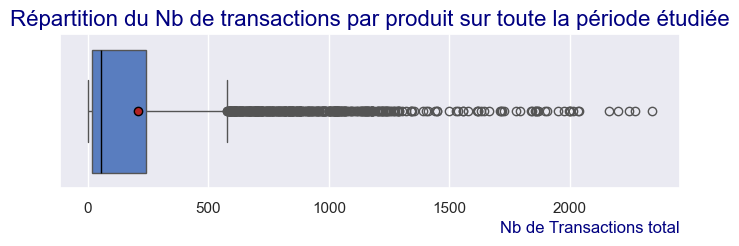

In [627]:
df_graph = (df_analyse_O1_O2_products_1_1[['id_prod','transaction_id']] ).groupby(by=['id_prod']).count()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='transaction_id',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Nb de Transactions total',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nb de transactions par produit sur toute la période étudiée",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.7 - sex</h4>
</div>

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK CLIENTS

##### <font color='green'>**A. Sur df_analyse_O1_O2_1_1 (peu intéressant):**</font>

In [628]:
(df_analyse_O1_O2_1_1['sex'] ).head(3)

0    m
1    f
2    f
Name: sex, dtype: string

In [629]:
(df_analyse_O1_O2_1_1['sex'] ).tail(3)

687573    f
687574    f
687575    m
Name: sex, dtype: string

In [630]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['sex'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sex,string[python],687576,687555,21,3,0


In [631]:
#Clients impliqués dans des transactions : 
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_transactions_1_1['sex'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sex,string[python],687534,687534,0,2,0


In [632]:
#Tous clients 
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_customers_1_1['sex'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sex,string[python],687555,687555,0,2,0


In [633]:
(df_analyse_O1_O2_customers_1_1['sex'] ).value_counts()

sex
m    344851
f    342704
Name: count, dtype: Int64

In [634]:
#TRANSACTIONS :
(df_analyse_O1_O2_transactions_1_1['sex'] ).value_counts()

sex
m    344841
f    342693
Name: count, dtype: Int64

In [635]:
((df_analyse_O1_O2_customers_1_1['sex'] ).value_counts() ).describe()

count            2.0
mean        343777.5
std      1518.158259
min         342704.0
25%        343240.75
50%         343777.5
75%        344314.25
max         344851.0
Name: count, dtype: Float64

##### **OBSERVATIONS :**  
344841 transactions impliquant des hommes  
342693 transactions impliquant des femmes

In [636]:
df_customers_clean_Nettoye_Final.head(3)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984


In [637]:
df_customers_clean_Nettoye_Final['sex'].value_counts()

sex
f    4490
m    4131
Name: count, dtype: Int64

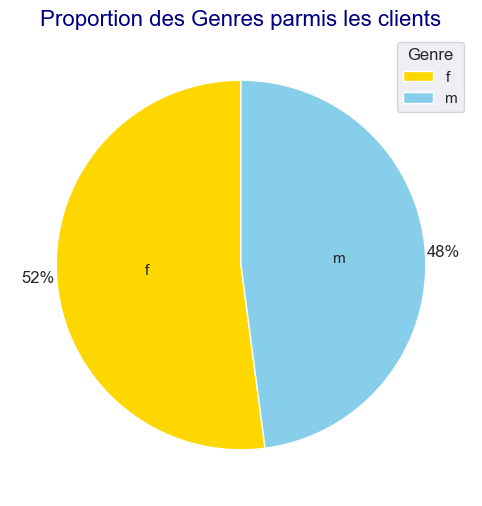

In [638]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_customers_clean_Nettoye_Final['sex'].value_counts()

plt.pie(x=df_graph,
        labels=df_graph.index,
        normalize=True,
        autopct='%.0f%%',
        labeldistance=0.5,
        pctdistance =1.1,
        startangle=90,
        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        
#plt.legend()
plt.title("Proportion des Genres parmis les clients",fontdict={'fontsize' : 16, 'color':'navy'})
plt.legend(title='Genre')
plt.show()

In [639]:
df_non_clients_internet.head(3)

,client_id,sex,birth
18399,c_1223,m,1963
167262,c_2706,f,1967
191551,c_3017,f,1992


In [640]:
df_non_clients_internet['sex'].value_counts()

sex
f    11
m    10
Name: count, dtype: Int64

In [641]:
df_clients_internet.head(3)

,client_id,sex,birth
0,c_1,m,1955
43,c_10,m,1956
101,c_100,m,1992


In [642]:
df_clients_internet['sex'].value_counts()

sex
f    4479
m    4121
Name: count, dtype: Int64

##### **REMARQUE :**  
8621 clients (4490 f +4131 m)  
8600 clients actifs (4479 f + 4121 m)  
21 clients inactifs (11 f + 10 m)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.7 - birth</h4>
</div>

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK CLIENTS

In [643]:
(df_analyse_O1_O2_1_1['birth'] ).head(3)

0    1973
1    1999
2    1999
Name: birth, dtype: Int64

In [644]:
(df_analyse_O1_O2_1_1['birth'] ).tail(3)

687573    1965
687574    1956
687575    2001
Name: birth, dtype: Int64

In [645]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['birth'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
birth,Int64,687576,687555,21,77,0


In [646]:
((df_analyse_O1_O2_1_1['birth'] ).value_counts() ).describe()

count           76.0
mean     9046.776316
std      8754.501319
min            170.0
25%          2373.25
50%           5802.0
75%         16060.25
max          47702.0
Name: count, dtype: Float64

In [647]:
(df_analyse_O1_O2_1_1['birth']).describe()

count       687555.0
mean     1977.817591
std        13.608198
min           1929.0
25%           1970.0
50%           1980.0
75%           1987.0
max           2004.0
Name: birth, dtype: Float64

##### **MASK CLIENTS :**

In [648]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_customers_1_1['birth'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
birth,Int64,687555,687555,0,76,0


In [649]:
((df_analyse_O1_O2_customers_1_1['birth'] ).value_counts() ).describe()

count           76.0
mean     9046.776316
std      8754.501319
min            170.0
25%          2373.25
50%           5802.0
75%         16060.25
max          47702.0
Name: count, dtype: Float64

In [650]:
(df_analyse_O1_O2_customers_1_1['birth']).describe()

count       687555.0
mean     1977.817591
std        13.608198
min           1929.0
25%           1970.0
50%           1980.0
75%           1987.0
max           2004.0
Name: birth, dtype: Float64

##### **BASE CLIENTS :**

In [651]:
Description_Fichier_Tableau_avc_ValBlanches (df_customers_clean_Nettoye_Final['birth'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
birth,Int64,8621,8621,0,76,0


In [652]:
((df_customers_clean_Nettoye_Final['birth'] ).value_counts() ).describe()

count          76.0
mean     113.434211
std       73.979697
min             3.0
25%           39.75
50%           136.0
75%           160.0
max           440.0
Name: count, dtype: Float64

In [653]:
(df_customers_clean_Nettoye_Final['birth']).describe()

count         8621.0
mean     1978.275606
std        16.917958
min           1929.0
25%           1966.0
50%           1979.0
75%           1992.0
max           2004.0
Name: birth, dtype: Float64

##### **OBSERVATIONS :**  
8621 valeurs, dont 76 valeurs distinctes.  
Années de naissances comprises entre 1929 et 2004 (96 ans et 21 ans)

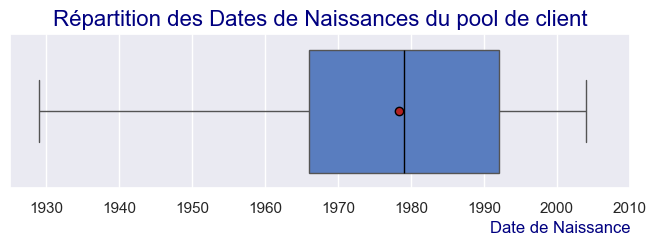

In [654]:
df_graph = df_customers_clean_Nettoye_Final['birth']

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_customers_clean_Nettoye_Final,
            x='birth',
            #"hue='',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Date de Naissance',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.xlim(1925,2010)
plt.title("Répartition des Dates de Naissances du pool de client",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

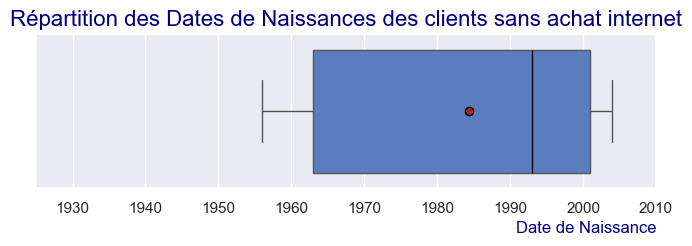

In [655]:
df_graph = df_customers_clean_Nettoye_Final['birth']

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_non_clients_internet,
            x='birth',
            #"hue='',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Date de Naissance',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
plt.xlim(1925,2010)
#plt.legend()
plt.title("Répartition des Dates de Naissances des clients sans achat internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.7 - categ</h4>
</div>

In [656]:
(df_analyse_O1_O2_1_1['categ'] ).head(3)

0    0
1    0
2    0
Name: categ, dtype: string

In [657]:
(df_analyse_O1_O2_1_1['categ'] ).tail(3)

687573    <NA>
687574    <NA>
687575    <NA>
Name: categ, dtype: string

In [658]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['categ'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
categ,string[python],687576,687555,21,4,0


In [659]:
(df_analyse_O1_O2_1_1['categ'] ).value_counts()

categ
0    415475
1    235594
2     36486
Name: count, dtype: Int64

In [660]:
#((df_analyse_O1_O2_1_1['categ'] ).value_counts() ).describe()

##### **OBSERVATIONS :**  
687534 valeurs, dont 3 valeurs distinctes ( 0, 1 et 2), pas de valeurs vides.  
Suur la période d'étude :  
0 impliqué dans 415 459 transactions  
1 impliqué dans 235 592 transactions  
2 impliqué dans 36 483 transactions

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK PRODUITS

In [661]:
(df_analyse_O1_O2_products_1_1['categ'] ).head(3)

0    0
1    0
2    0
Name: categ, dtype: string

In [662]:
(df_analyse_O1_O2_products_1_1['categ'] ).tail(3)

687552    2
687553    2
687554    2
Name: categ, dtype: string

In [663]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_products_1_1['categ'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
categ,string[python],687555,687555,0,3,0


In [664]:
(df_analyse_O1_O2_products_1_1['categ'] ).value_counts()

categ
0    415475
1    235594
2     36486
Name: count, dtype: Int64

In [665]:
#((df_analyse_O1_O2_products_1_1['categ'] ).value_counts() ).describe()

##### **OBSERVATIONS :**  
687555 valeurs, dont 3 valeurs distinctes ( 0, 1 et 2), pas de valeurs vides.  
687534 transactions +21 prod sans transactions

In [666]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_transactions_1_1['categ'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
categ,string[python],687534,687534,0,3,0


In [667]:
(df_analyse_O1_O2_transactions_1_1['categ'] ).value_counts()

categ
0    415459
1    235592
2     36483
Name: count, dtype: Int64

##### **OBSERVATIONS des TRANSACTIONS:**  
687534 valeurs, dont 3 valeurs distinctes ( 0, 1 et 2), pas de valeurs vides.  
Suur la période d'étude :  
0 impliqué dans 415 459 transactions  
1 impliqué dans 235 592 transactions  
2 impliqué dans 36 483 transactions

In [668]:
(df_produits_non_internet['categ'] ).value_counts()

categ
0    16
2     3
1     2
Name: count, dtype: Int64

In [669]:
(df_produits_internet['categ'] ).value_counts()

categ
0    2292
1     737
2     236
Name: count, dtype: Int64

##### **REMARQUE :** 
produits sans transactions internet :  
categ 0 :   16  categ 
2 :      3categ 
1 :    

produits avec transactions internet :  
categ 0 :    2292  
categ 2 :     737  
categ 1 :     236 
 2

In [670]:
(df_products_clean_Nettoye_Final['categ']  ).value_counts()

categ
0    2308
1     739
2     239
Name: count, dtype: Int64

In [671]:
(df_products_clean_Nettoye_Final['categ']  ).unique()

<StringArray>
['0', '1', '2']
Length: 3, dtype: string

In [672]:
df_products_clean_Nettoye['categ'].unique()

<StringArray>
['0', '1', '2']
Length: 3, dtype: string

In [673]:
Ordre_categ = df_products_clean_Nettoye['categ'].unique()

In [674]:
# Générer une palette 'muted' avec autant de couleurs que de catégories
couleurs_muted_categ = sns.color_palette("muted", len(Ordre_categ))

# Associer chaque produit à une couleur fixe dans un dictionnaire
palette_fixe_categ = dict(zip(Ordre_categ, couleurs_muted_categ))

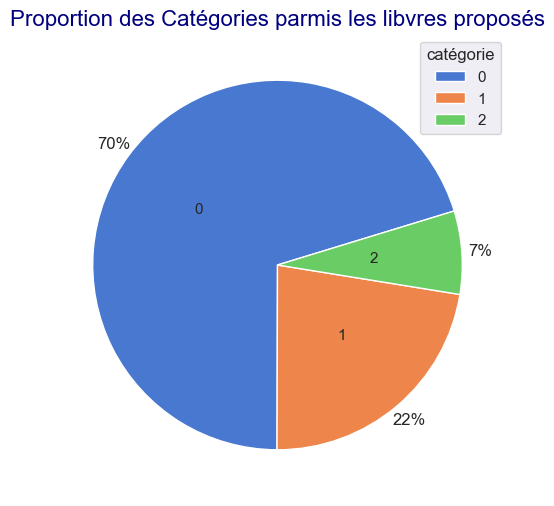

In [675]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = (df_products_clean_Nettoye_Final['categ']  ).value_counts()

# Récupérer les couleurs dans l'ordre des labels du pie chart, et sous forme de liste
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph,
        labels=df_graph.index,
        normalize=True,
        autopct='%.0f%%',
        labeldistance=0.5,
        pctdistance =1.1,
        startangle=17,
        colors=colors_in_order # Liste de couleurs bien ordonnée (plt.pie attend une liste et non un dictionnaire comme l'attend palette dans sns)
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        
#plt.legend()
plt.title("Proportion des Catégories parmis les libvres proposés",fontdict={'fontsize' : 16, 'color':'navy'})
plt.legend(title='catégorie')
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.8 - price</h4>
</div>

**REMARQUE :**  
Je pourrais aussi essayer de travailler plutôt avec un MASK PRODUITS

In [676]:
(df_analyse_O1_O2_1_1['price'] ).head(3)

0    3.75
1    3.75
2    3.75
Name: price, dtype: float64

In [677]:
(df_analyse_O1_O2_1_1['price'] ).tail(3)

687573   NaN
687574   NaN
687575   NaN
Name: price, dtype: float64

In [678]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_1_1['price'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
price,float64,687576,687555,21,1455,0


In [679]:
Description_Fichier_Tableau_avc_ValBlanches (df_analyse_O1_O2_products_1_1['price'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
price,float64,687555,687555,0,1454,0


In [680]:
#(df_analyse_O1_O2_1_1['price'] ).value_counts()

In [681]:
df_nb_transac_GB_prod_1 = df_analyse_O1_O2_products_1_1.groupby(by=['id_prod','price','categ'],as_index=False).agg(nb_transaction=pd.NamedAgg(column='transaction_id',aggfunc='count'))
df_nb_transac_GB_prod_1

,id_prod,price,categ,nb_transaction
0,0_0,3.75,0,1242
1,0_1,10.99,0,487
2,0_10,17.95,0,22
3,0_100,20.60,0,3
4,0_1000,6.84,0,432
...,...,...,...,...
3281,2_95,98.99,2,4
3282,2_96,47.91,2,598
3283,2_97,160.99,2,13
3284,2_98,149.74,2,1


In [682]:
df_nb_transac_GB_prod_1.shape

(3286, 4)

In [683]:
(df_nb_transac_GB_prod_1['nb_transaction'] ).describe()

count    3286.000000
mean      209.231284
std       337.143772
min         0.000000
25%        16.000000
50%        56.000000
75%       240.000000
max      2340.000000
Name: nb_transaction, dtype: float64

In [684]:
(df_nb_transac_GB_prod_1['price'] ).describe()

count    3286.000000
mean       21.863597
std        29.849786
min         0.620000
25%         6.990000
50%        13.075000
75%        22.990000
max       300.000000
Name: price, dtype: float64

In [685]:
(df_analyse_O1_O2_1_1['price'] ).describe()

count    687555.000000
mean         17.494540
std          18.240963
min           0.620000
25%           8.990000
50%          13.990000
75%          19.080000
max         300.000000
Name: price, dtype: float64

##### **OBSERVATIONS :**  
454 valeurs distinctes (poru 3286 produits dont 21 sans ventes), 
pas de valeurs vides.  
Prix min : 0,62 euros  
Prix max : 300 euros  
moyenne : 17.49mediane : 13.99  
ecart-type : 18.24

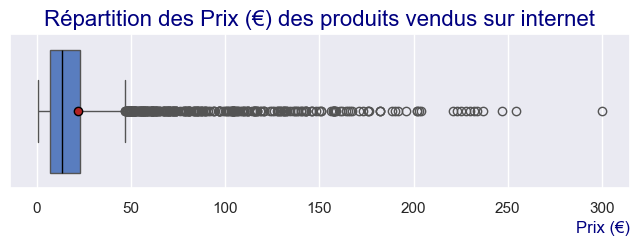

In [686]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='price',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus sur internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

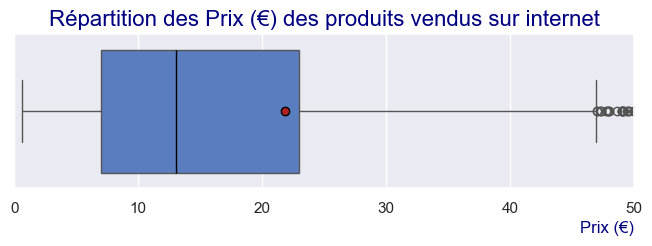

In [687]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='price',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
plt.xlim(0,50)
plt.grid(axis='x')
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus sur internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

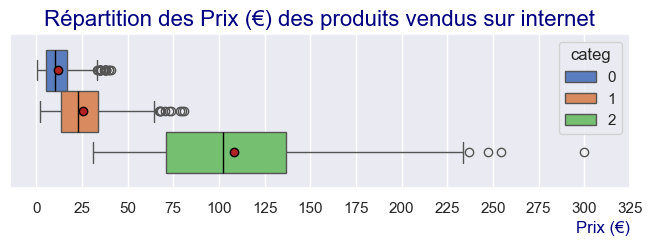

In [688]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='price',
            hue='categ',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            palette = palette_fixe_categ
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xticks(range(0,330,25))
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus sur internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

In [689]:
#df_nb_transac_GB_prod_1 = df_analyse_O1_O2_products_1_1.groupby(by=['id_prod','price','categ'],as_index=False).agg(nb_transaction=pd.NamedAgg(column='transaction_id',aggfunc='count'))
df_nb_transac_GB_prod_1.head(5)

,id_prod,price,categ,nb_transaction
0,0_0,3.75,0,1242
1,0_1,10.99,0,487
2,0_10,17.95,0,22
3,0_100,20.60,0,3
4,0_1000,6.84,0,432


In [690]:
df_prix_moyen_par_categ = df_nb_transac_GB_prod_1.groupby(by=['categ'],as_index=False).agg(prix_moyen=pd.NamedAgg(column='price',aggfunc='mean'))
df_prix_moyen_par_categ

,categ,prix_moyen
0,0,11.732795
1,1,25.531421
2,2,108.354686


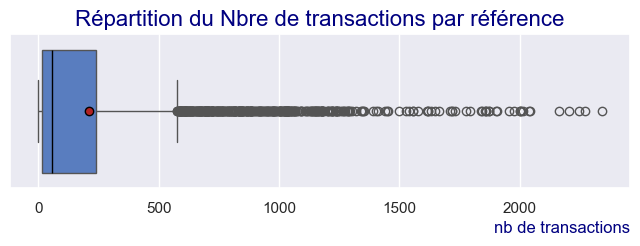

In [691]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='nb_transaction',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('nb de transactions',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nbre de transactions par référence",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

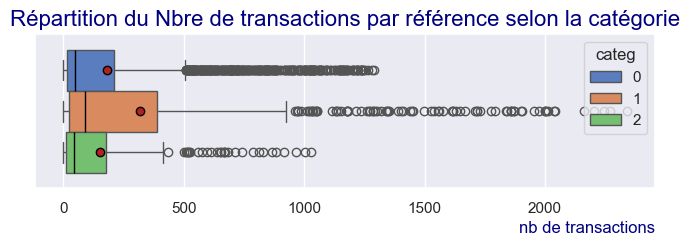

In [692]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_nb_transac_GB_prod_1,
            x='nb_transaction',
            hue='categ',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            palette = palette_fixe_categ
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('nb de transactions',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition du Nbre de transactions par référence selon la catégorie",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

In [693]:
df_nb_transac_GB_prod_1.head(2)

,id_prod,price,categ,nb_transaction
0,0_0,3.75,0,1242
1,0_1,10.99,0,487


In [694]:
df_nb_transac_GB_prod_1.groupby(by=['categ']).agg({'nb_transaction':'sum'})

,nb_transaction
categ,
0,415459
1,235592
2,36483


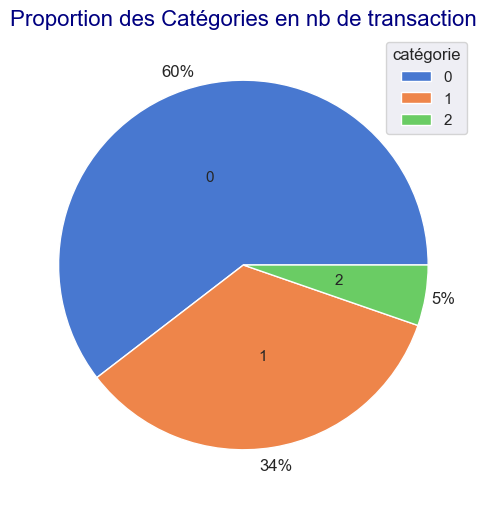

In [695]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_nb_transac_GB_prod_1.groupby(by=['categ']).agg({'nb_transaction':'sum'})


# Récupérer les couleurs dans l'ordre des labels du pie chart
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph['nb_transaction'],
        labels=df_graph.index,
        normalize=True,
        autopct='%.0f%%',
        labeldistance=0.5,
        pctdistance =1.1,
        startangle=0,
        colors=colors_in_order
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        

plt.title("Proportion des Catégories en nb de transaction",fontdict={'fontsize' : 16, 'color':'navy'})
plt.legend(title='catégorie')
plt.show()

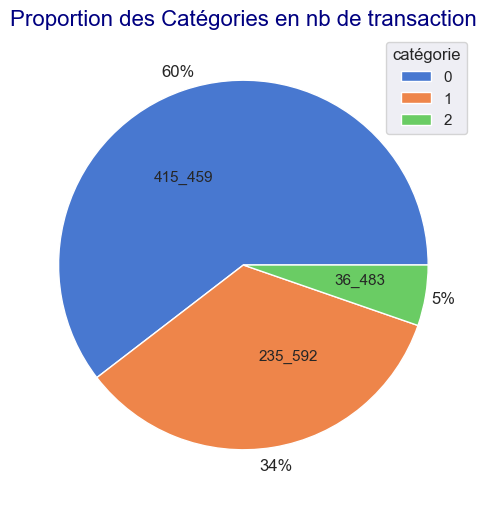

In [696]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

# Fonction pour afficher à la fois nombre et pourcentage
#def make_autopct(values):
#    def my_autopct(pct):
#        total = sum(values)
#        val = int(round(pct * total / 100.0))
#        return f'{pct:.1f}%\n({val:_.0f})'
#    return my_autopct

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_nb_transac_GB_prod_1.groupby(by=['categ']).agg({'nb_transaction':'sum'})


# Récupérer les couleurs dans l'ordre des labels du pie chart
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph['nb_transaction'],
        labels=[f'{val:_.0f}' for val in df_graph['nb_transaction'] ],
        normalize=True,
        autopct='%.0f%%',
        labeldistance=0.5,
        pctdistance =1.1,
        startangle=0,
        colors=colors_in_order
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        

plt.title("Proportion des Catégories en nb de transaction",fontdict={'fontsize' : 16, 'color':'navy'})
plt.legend(title='catégorie',labels =df_graph.index)
plt.show()

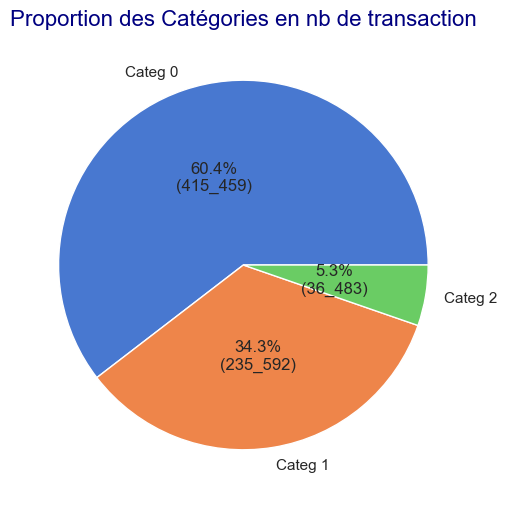

In [697]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

# Fonction pour afficher à la fois nombre et pourcentage
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{pct:.1f}%\n({val:_.0f})'
    return my_autopct

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_nb_transac_GB_prod_1.groupby(by=['categ']).agg({'nb_transaction':'sum'})


# Récupérer les couleurs dans l'ordre des labels du pie chart
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph['nb_transaction'],
        labels=[f"Categ {cat}" for cat in df_graph.index],
        normalize=True,
        autopct=make_autopct(df_graph['nb_transaction']),
        labeldistance=1.1,
        pctdistance =0.5,
        startangle=0,
        colors=colors_in_order
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        

plt.title("Proportion des Catégories en nb de transaction",fontdict={'fontsize' : 16, 'color':'navy'})
#plt.legend(title='catégorie')
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4bis.1.1 - Analyse Globale des variables</h4>
</div>

In [698]:
df_analyse_O1_O2_1_1.head(3)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0
2,t_362246,s_180968,2022-03-18 16:40:10.068303,2022-03-18,c_1011,f,1999,0_0,3.75,0


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 5 - ANALYSE DES INDICATEURS DE VENTE </h2>
</div>

##### **EXTRACTION POUR ETUDE EXTERNES :**

In [699]:
#df_analyse_O1_O2_transactions_1_1.to_csv('df_analyse_O1_O2_transactions_1_1.csv')

In [700]:
#df_analyse_O1_O2_1_1.to_csv('df_analyse_O1_O2_1_1.csv')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">5.1bis - ANALYSE DU CHIFFRE D'AFFAIRE (avec meilleur usage resample et pd.Grouper)</h3>
</div>

##### <u>**CHIFFRE D'AFFAIRE :**</u>  

Evolution dans le temps de :  
- chiffre d’affaires avec la moyenne mobile (tu pourras choisir la période : jour, semaine, mois, etc.),  
- chiffre d’affaires par catégorie,
- nombre de clients par mois,
- nombre de transactions,
- nombre de produits vendus,
- etc... 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1b.1 - Calcul du CA :</h4>
</div>

**<u>Remarque prix TTC ou HT :</u>**  
Il n'est pas indiqué si le price est un prix HT ou TTC.  
**Considérons que c'est le prix HT.**  
(Si le prix est un prix TTC, il faut créé un colonne Taux_Taxes, et une colonne prix HT.et applique les calculs au prix HT)  

Chaque transaction correspondant à 1 vente, le CA est donc simplement la somme des price.

(Sauf pour l'étude des produits ou des clients, ) Ytilisons plutôt le `df_analyse_O1_O2_transactions_1_1` qui regroupe **les transactions**.

**<u>utilisons plutôt df_analyse_O1_O2_transactions_1_1 avec les transactions :</u>**  

Sauf pour l'étude des produits ou des clients utilisons plutôt le df_analyse_O1_O2_transactions_1_1 qui regroupe les transactions.

In [701]:
df_analyse_O1_O2_transactions_1_1['day'].describe()

count                           687534
mean     2022-03-01 09:22:26.987931136
min                2021-03-01 00:00:00
25%                2021-09-10 00:00:00
50%                2022-02-27 00:00:00
75%                2022-08-28 00:00:00
max                2023-02-28 00:00:00
Name: day, dtype: object

In [702]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


In [703]:
df_analyse_O1_O2_transactions_1_1.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
day               datetime64[ns]
client_id         string[python]
sex               string[python]
birth                      Int64
id_prod           string[python]
price                    float64
categ             string[python]
dtype: object

##### <font color=green><u>**A. CA TOTAL :**</font>

In [704]:
CA_total = df_analyse_O1_O2_transactions_1_1['price'].sum()
print("Le chiffre d'affaire total sur la période d'étude (03/21 à 02/23) est de : ",
     f"{CA_total :_.2f} € ."
     )

Le chiffre d'affaire total sur la période d'étude (03/21 à 02/23) est de :  12_027_663.10 € .


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1b.2 - CA par période temporelle :</h4>
</div>

In [705]:
df_analyse_O1_O2_transactions_1_1['day'].describe()

count                           687534
mean     2022-03-01 09:22:26.987931136
min                2021-03-01 00:00:00
25%                2021-09-10 00:00:00
50%                2022-02-27 00:00:00
75%                2022-08-28 00:00:00
max                2023-02-28 00:00:00
Name: day, dtype: object

##### <font color=green><u>****A. CA JOURNALIER (et Moy mobile):****</u></font>

In [706]:
df_CA_Daily_1_1_bis = df_analyse_O1_O2_transactions_1_1.resample('D',on='day').agg({'price':'sum'})
df_CA_Daily_1_1_bis.head(2)

,price
day,
2021-03-01,16565.22
2021-03-02,15486.45


In [707]:
df_CA_Daily_1_1_bis = df_analyse_O1_O2_transactions_1_1.resample('D',on='day').agg(CA_daily=pd.NamedAgg(column='price',aggfunc='sum'))
df_CA_Daily_1_1_bis.head(2)

,CA_daily
day,
2021-03-01,16565.22
2021-03-02,15486.45


In [708]:
df_CA_Daily_1_1_bis.tail(2)

,CA_daily
day,
2023-02-27,19170.81
2023-02-28,18105.15


**MOYENNES MOBILES :**

In [709]:
df_CA_Daily_1_1_bis["CA_moving_avg_7j"] = df_CA_Daily_1_1_bis["CA_daily"].rolling(window=7).mean()
df_CA_Daily_1_1_bis["CA_moving_avg_14j"] = df_CA_Daily_1_1_bis["CA_daily"].rolling(window=14).mean()
df_CA_Daily_1_1_bis["CA_moving_avg_30j"] = df_CA_Daily_1_1_bis["CA_daily"].rolling(window=30).mean()
df_CA_Daily_1_1_bis.head(7)

,CA_daily,CA_moving_avg_7j,CA_moving_avg_14j,CA_moving_avg_30j
day,,,,
2021-03-01,16565.22,NaN,NaN,NaN
2021-03-02,15486.45,NaN,NaN,NaN
2021-03-03,15198.69,NaN,NaN,NaN
2021-03-04,15196.07,NaN,NaN,NaN
2021-03-05,17471.37,NaN,NaN,NaN
2021-03-06,15785.28,NaN,NaN,NaN
2021-03-07,14760.20,15780.468571,NaN,NaN


In [710]:
df_CA_Daily_1_1_bis.tail(2)

,CA_daily,CA_moving_avg_7j,CA_moving_avg_14j,CA_moving_avg_30j
day,,,,
2023-02-27,19170.81,16487.570000,16470.637857,16282.368
2023-02-28,18105.15,16513.984286,16571.725000,16321.900


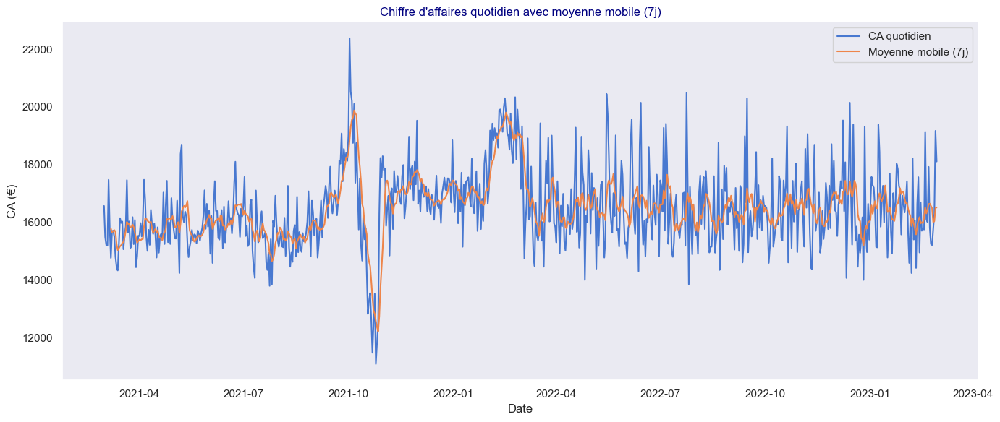

In [711]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_daily", 
             label="CA quotidien")

sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_7j", 
             label="Moyenne mobile (7j)")

plt.title("Chiffre d'affaires quotidien avec moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.tight_layout()
plt.show()

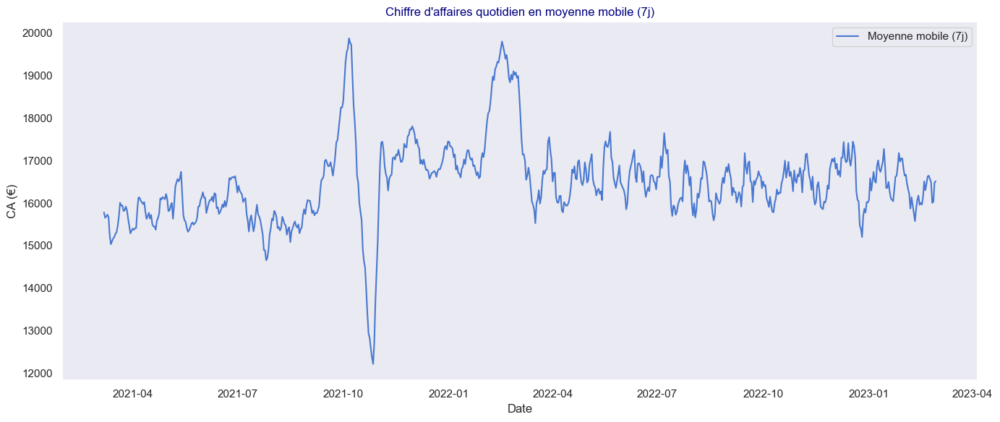

In [712]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours)

plt.figure(figsize=(14, 6))
#sns.lineplot(data=df_CA_Daily_1_1_bis, 
#             x="day", 
#             y="CA_daily", 
#             label="CA quotidien")

sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_7j", 
             label="Moyenne mobile (7j)")

plt.title("Chiffre d'affaires quotidien en moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.tight_layout()
plt.show()

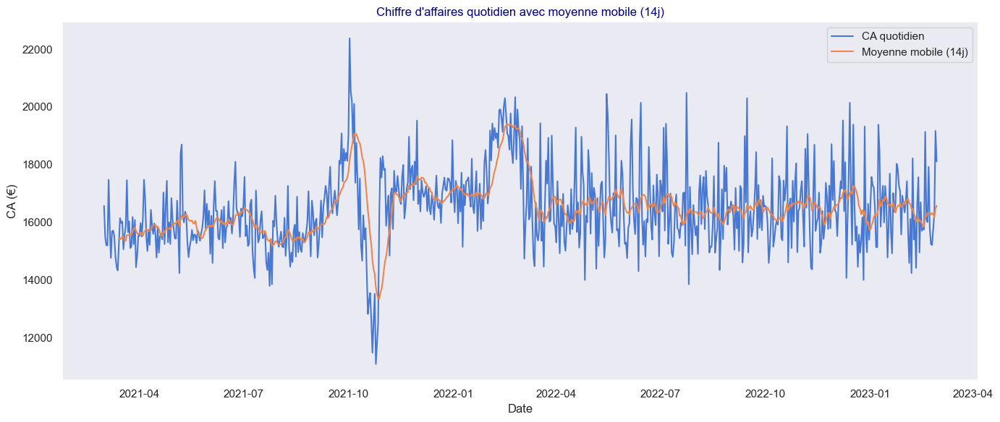

In [713]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 14 jours)

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_daily", 
             label="CA quotidien")

sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_14j", 
             label="Moyenne mobile (14j)")

plt.title("Chiffre d'affaires quotidien avec moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.tight_layout()
plt.show()

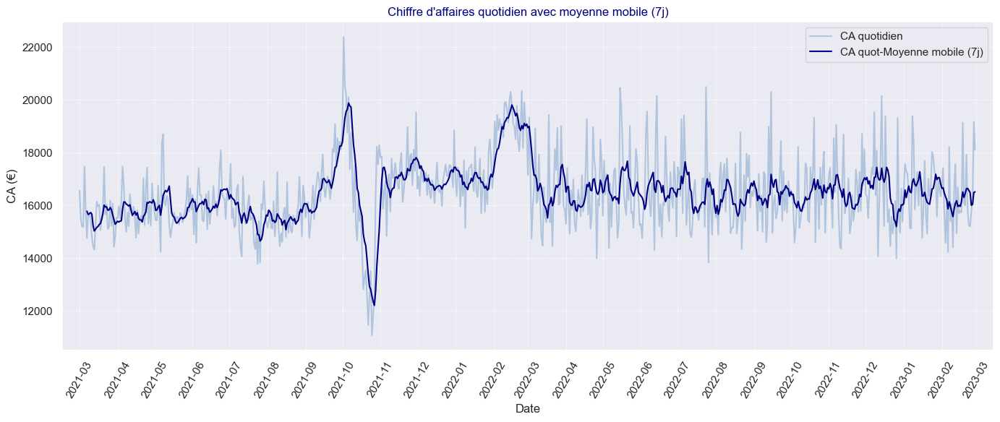

In [714]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours)
#ADAPTATION GRAPHIQUE 2

#import matplotlib.pyplot as plt
#import seaborn as sns
#import matplotlib.dates as mdates
#from datetime import datetime

plt.figure(figsize=(14, 6))

# Courbe du chiffre d'affaires quotidien
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_daily", 
             label="CA quotidien", 
             color='lightsteelblue')

# Courbe de la moyenne mobile 7 jours
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_7j", 
             label="CA quot-Moyenne mobile (7j)", 
             color='navy')

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Chiffre d'affaires quotidien avec moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

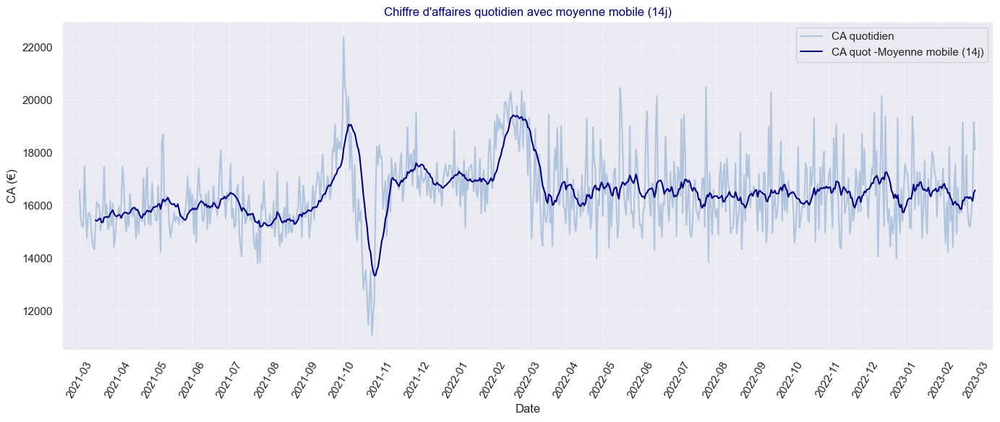

In [715]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 14 jours)
#ADAPTATION GRAPHIQUE 2

#import matplotlib.pyplot as plt
#import seaborn as sns
#import matplotlib.dates as mdates
#from datetime import datetime

plt.figure(figsize=(14, 6))

# Courbe du chiffre d'affaires quotidien
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_daily", 
             label="CA quotidien", 
             color='lightsteelblue')

# Courbe de la moyenne mobile 14 jours
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_14j", 
             label="CA quot -Moyenne mobile (14j)", 
             color='navy')

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Chiffre d'affaires quotidien avec moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

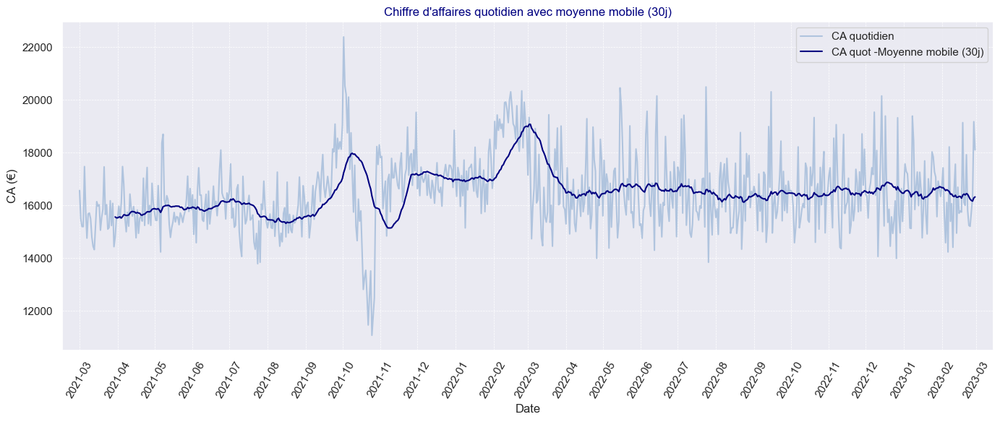

In [716]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 30 jours)
#ADAPTATION GRAPHIQUE 2

#import matplotlib.pyplot as plt
#import seaborn as sns
#import matplotlib.dates as mdates
#from datetime import datetime

plt.figure(figsize=(14, 6))

# Courbe du chiffre d'affaires quotidien
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_daily", 
             label="CA quotidien", 
             color='lightsteelblue')

# Courbe de la moyenne mobile 30 jours
sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_30j", 
             label="CA quot -Moyenne mobile (30j)", 
             color='navy')

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Chiffre d'affaires quotidien avec moyenne mobile (30j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

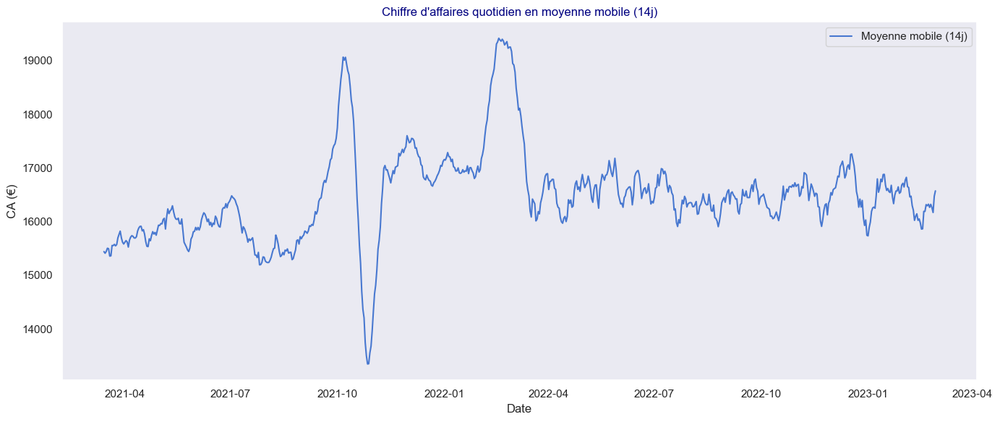

In [717]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 14 jours)

plt.figure(figsize=(14, 6))
#sns.lineplot(data=df_CA_Daily_1_1_bis, 
#             x="day", 
#             y="CA_daily", 
#             label="CA quotidien")

sns.lineplot(data=df_CA_Daily_1_1_bis, 
             x="day", 
             y="CA_moving_avg_14j", 
             label="Moyenne mobile (14j)")

plt.title("Chiffre d'affaires quotidien en moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend()
plt.tight_layout()
plt.show()

##### <font color=green><u>**B2. CA PAR CATEG JOURNALIER (et Moy mobile):**</font></u>

In [718]:
df_CA_Daily_par_categ_Grouper_1_1_bis = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='D'), 'categ'])
                                         .agg(CA_daily=pd.NamedAgg(column='price',aggfunc='sum'))).reset_index()

df_CA_Daily_par_categ_Grouper_1_1_bis.set_index(keys='day',inplace=True)

display(df_CA_Daily_par_categ_Grouper_1_1_bis)

,categ,CA_daily
day,,
2021-03-01,0,6262.65
2021-03-01,1,6811.53
2021-03-01,2,3491.04
2021-03-02,0,6718.27
2021-03-02,1,5627.15
...,...,...
2023-02-27,1,6461.76
2023-02-27,2,5271.62
2023-02-28,0,4901.86


In [719]:
for elt in df_CA_Daily_par_categ_Grouper_1_1_bis['categ'].unique():
    print(elt)

0
1
2


In [720]:
for elt in df_CA_Daily_par_categ_Grouper_1_1_bis['categ'].unique():
    mask = df_CA_Daily_par_categ_Grouper_1_1_bis['categ']==elt
    df_CA_Daily_par_categ_Grouper_1_1_bis.loc[mask,"CA_moving_avg_7j"] = df_CA_Daily_par_categ_Grouper_1_1_bis.loc[mask,"CA_daily"].rolling(window=7).mean()

In [721]:
df_CA_Daily_par_categ_Grouper_1_1_bis.head(21)

,categ,CA_daily,CA_moving_avg_7j
day,,,
2021-03-01,0,6262.65,NaN
2021-03-01,1,6811.53,NaN
2021-03-01,2,3491.04,NaN
2021-03-02,0,6718.27,NaN
2021-03-02,1,5627.15,NaN
2021-03-02,2,3141.03,NaN
2021-03-03,0,6121.03,NaN
2021-03-03,1,5691.41,NaN
2021-03-03,2,3386.25,NaN


In [722]:
for elt in df_CA_Daily_par_categ_Grouper_1_1_bis['categ'].unique():
    mask = df_CA_Daily_par_categ_Grouper_1_1_bis['categ']==elt
    df_CA_Daily_par_categ_Grouper_1_1_bis.loc[mask,"CA_moving_avg_14j"] = df_CA_Daily_par_categ_Grouper_1_1_bis.loc[mask,"CA_daily"].rolling(window=14).mean()

In [723]:
df_CA_Daily_par_categ_Grouper_1_1_bis.tail(6)

,categ,CA_daily,CA_moving_avg_7j,CA_moving_avg_14j
day,,,,
2023-02-27,0,7437.43,6060.707143,6099.626429
2023-02-27,1,6461.76,6601.667143,6343.347857
2023-02-27,2,5271.62,3825.195714,4027.663571
2023-02-28,0,4901.86,6008.730000,6017.958571
2023-02-28,1,9226.25,6655.381429,6575.965000
2023-02-28,2,3977.04,3849.872857,3977.801429


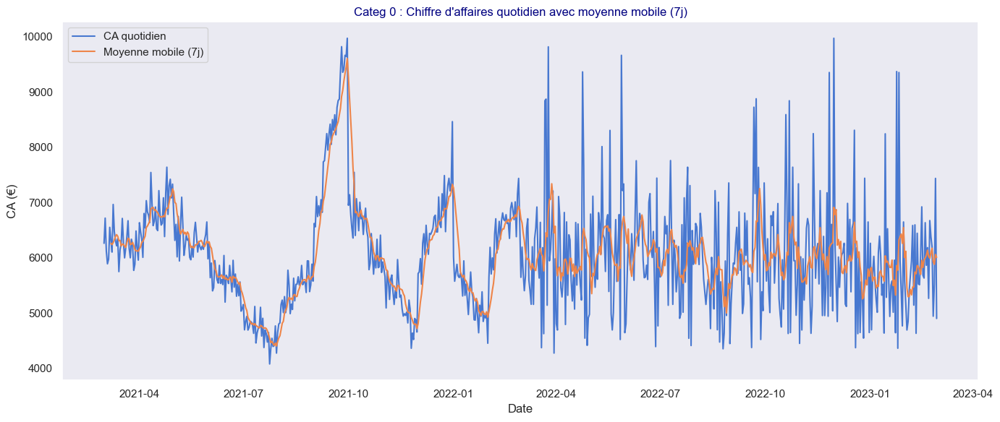

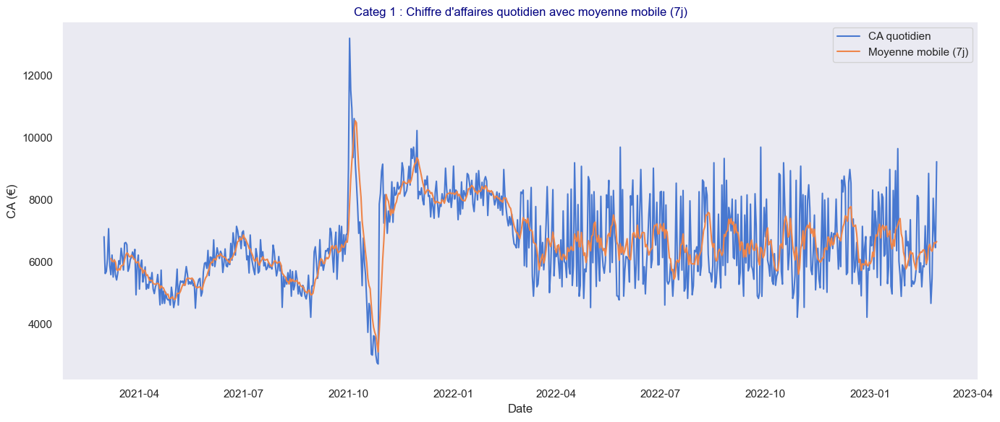

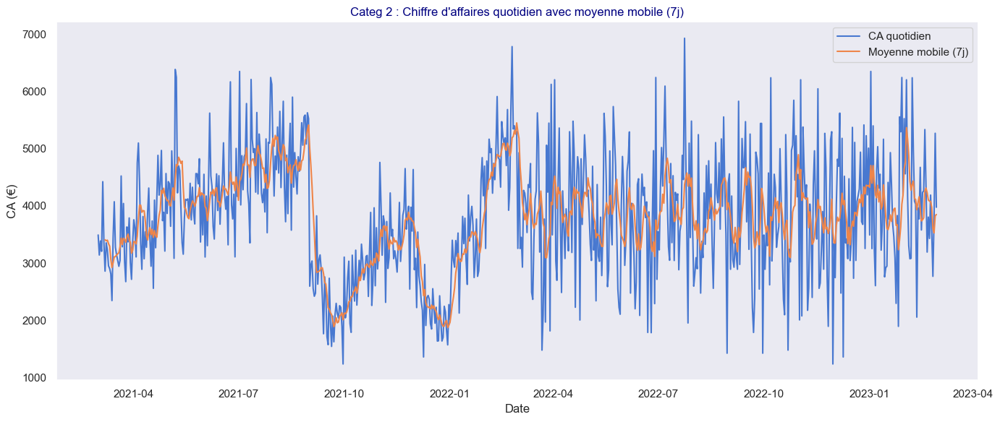

In [724]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours)
for elt in df_CA_Daily_par_categ_Grouper_1_1_bis['categ'].unique():
    mask_elt = df_CA_Daily_par_categ_Grouper_1_1_bis['categ']==elt

    df_graph_elt = df_CA_Daily_par_categ_Grouper_1_1_bis.loc[mask_elt,:]
    
    plt.figure(figsize=(14, 6))
    
    sns.lineplot(data=df_graph_elt,
                 x="day",
                 y="CA_daily",
                 label="CA quotidien")
    
    sns.lineplot(data=df_graph_elt,
                 x="day",
                 y="CA_moving_avg_7j",
                 label="Moyenne mobile (7j)")
    
    plt.title(f"Categ {elt} : Chiffre d'affaires quotidien avec moyenne mobile (7j)")
    plt.xlabel("Date")
    plt.ylabel("CA (€)")
    plt.legend()
    plt.tight_layout()
    plt.show()

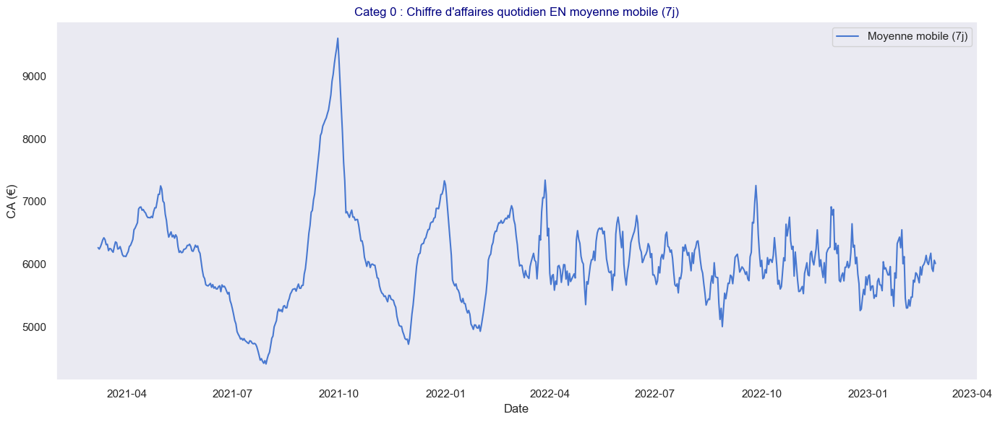

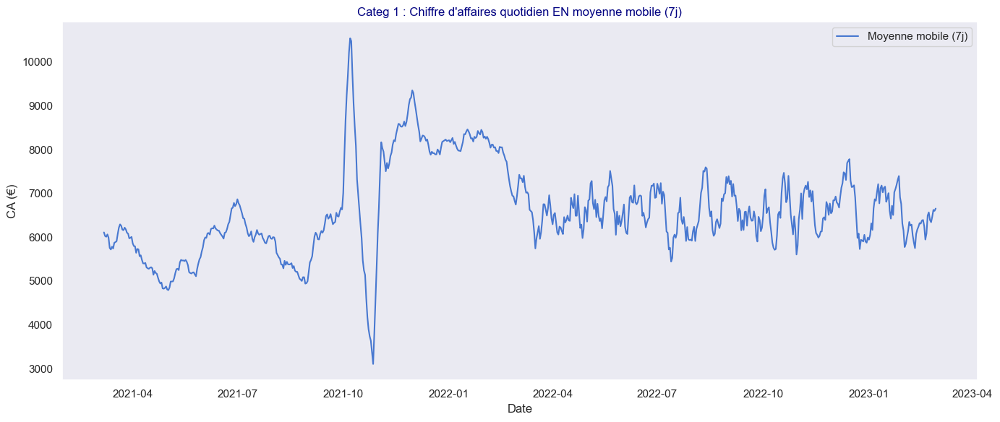

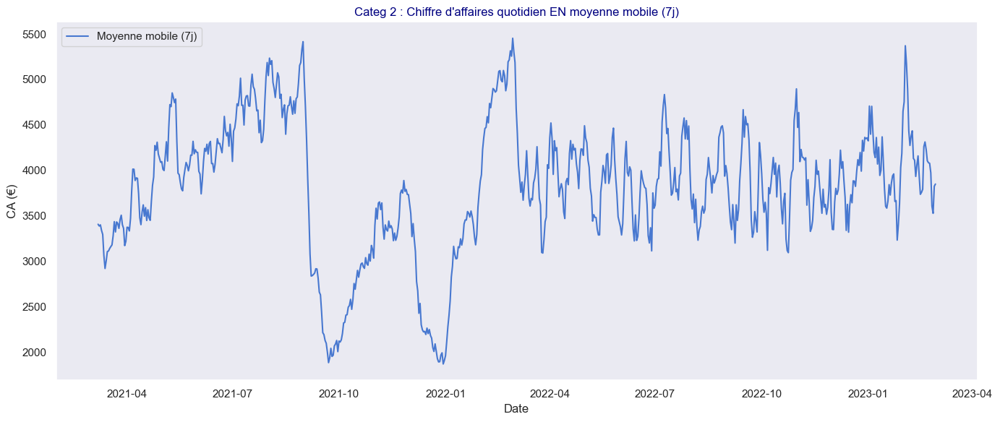

In [725]:
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours)
for elt in df_CA_Daily_par_categ_Grouper_1_1_bis['categ'].unique():
    mask_elt = df_CA_Daily_par_categ_Grouper_1_1_bis['categ']==elt

    df_graph_elt = df_CA_Daily_par_categ_Grouper_1_1_bis.loc[mask_elt,:]
    
    plt.figure(figsize=(14, 6))
    
#    sns.lineplot(data=df_graph_elt,
#                 x="day",
#                 y="CA_daily",
#                 label="CA quotidien")
    
    sns.lineplot(data=df_graph_elt,
                 x="day",
                 y="CA_moving_avg_7j",
                 label="Moyenne mobile (7j)")
    
    plt.title(f"Categ {elt} : Chiffre d'affaires quotidien EN moyenne mobile (7j)")
    plt.xlabel("Date")
    plt.ylabel("CA (€)")
    plt.legend()
    plt.tight_layout()
    plt.show()

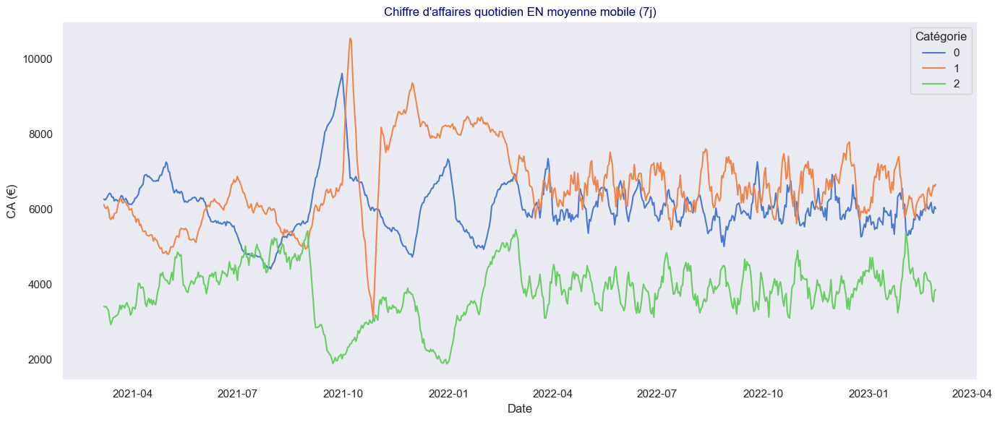

In [726]:
#SOLUTION 1 : Repasser day en colonne classique
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours) PAR CATEGORIE

df_graph = df_CA_Daily_par_categ_Grouper_1_1_bis.reset_index()
    
plt.figure(figsize=(14, 6))
    
#    sns.lineplot(data=df_graph,
#                 x="day",
#                 y="CA_daily",
#                 hue = "categ",
#                palette = palette_fixe_categ)
    
sns.lineplot(data=df_graph,
             x="day",
             y="CA_moving_avg_7j",
             hue = "categ",
             palette = palette_fixe_categ)

plt.title(f"Chiffre d'affaires quotidien EN moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend(title="Catégorie")
plt.tight_layout()
plt.show()

In [727]:
df_test = df_CA_Daily_par_categ_Grouper_1_1_bis.set_index(keys=[df_CA_Daily_par_categ_Grouper_1_1_bis.index,'categ'])
df_test

CA_daily  CA_moving_avg_7j  CA_moving_avg_14j
day        categ                                               
2021-03-01 0       6262.65               NaN                NaN
           1       6811.53               NaN                NaN
           2       3491.04               NaN                NaN
2021-03-02 0       6718.27               NaN                NaN
           1       5627.15               NaN                NaN
...                    ...               ...                ...
2023-02-27 1       6461.76       6601.667143        6343.347857
           2       5271.62       3825.195714        4027.663571
2023-02-28 0       4901.86       6008.730000        6017.958571
           1       9226.25       6655.381429        6575.965000
           2       3977.04       3849.872857        3977.801429

[2190 rows x 3 columns]

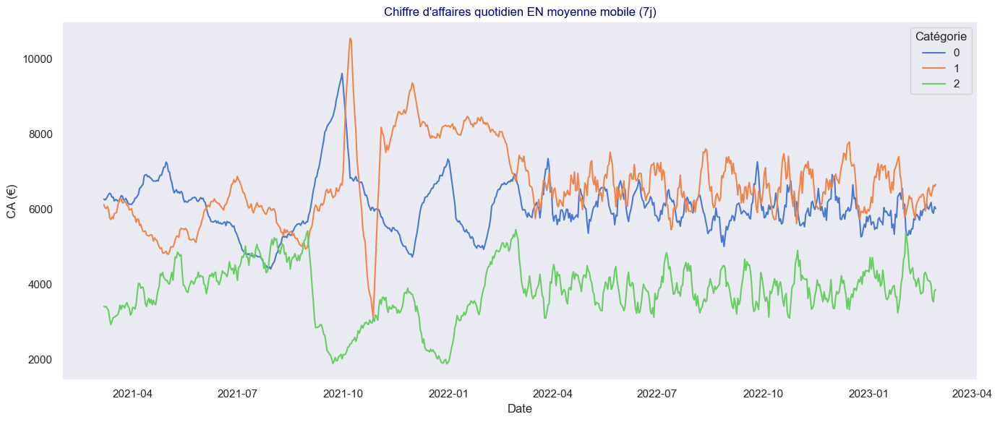

In [728]:
#SOLUTION 2 : Inclure Categ dans un index Day,categ pour qui'l comprenne que categ par categ il n'ya pas de répétition de date
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours) PAR CATEGORIE

df_graph = df_CA_Daily_par_categ_Grouper_1_1_bis.set_index(keys=[df_CA_Daily_par_categ_Grouper_1_1_bis.index,'categ'])
    
plt.figure(figsize=(14, 6))
    
#    sns.lineplot(data=df_graph,
#                 x="day",
#                 y="CA_daily",
#                 hue = "categ",
#                palette = palette_fixe_categ)
    
sns.lineplot(data=df_graph,
             x="day",
             y="CA_moving_avg_7j",
             hue = "categ",
             palette = palette_fixe_categ)

plt.title(f"Chiffre d'affaires quotidien EN moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend(title="Catégorie")
plt.tight_layout()
plt.show()

**SUR 14j**

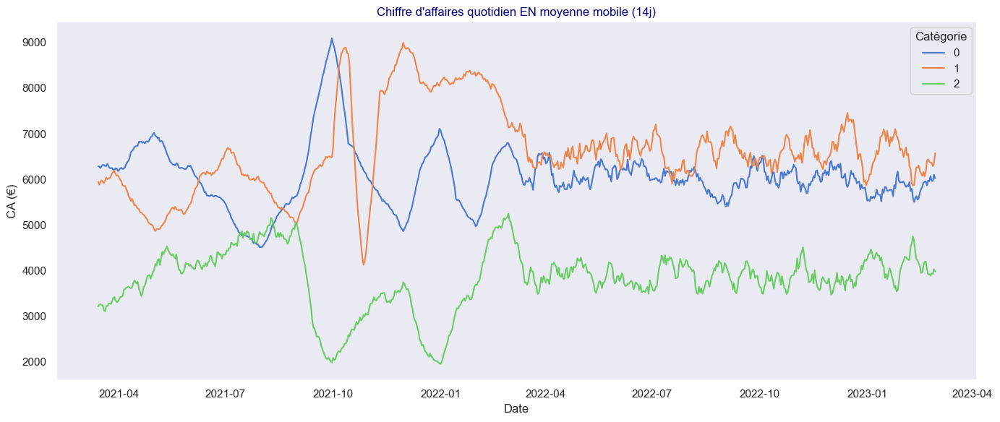

In [729]:
#SOLUTION 2 : Inclure Categ dans un index Day,categ pour qui'l comprenne que categ par categ il n'ya pas de répétition de date
#Chiffre d’affaires journalier dans le temps (avec moyenne mobile sur 7 jours) PAR CATEGORIE

df_graph = df_CA_Daily_par_categ_Grouper_1_1_bis.set_index(keys=[df_CA_Daily_par_categ_Grouper_1_1_bis.index,'categ'])
    
plt.figure(figsize=(14, 6))
    
#    sns.lineplot(data=df_graph,
#                 x="day",
#                 y="CA_daily",
#                 hue = "categ",
#                palette = palette_fixe_categ)
    
sns.lineplot(data=df_graph,
             x="day",
             y="CA_moving_avg_14j",
             hue = "categ",
             palette = palette_fixe_categ)

plt.title(f"Chiffre d'affaires quotidien EN moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.legend(title="Catégorie")
plt.tight_layout()
plt.show()

##### <font color = green><u>**Cbis. CA PAR MOIS avec Resample:**</u></font>

In [730]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


###### <font color='blue'>**1a. CA Mensuel**</font>

In [731]:
df_CA_Monthly_1_1_bis = df_analyse_O1_O2_transactions_1_1.resample('ME',on='day').agg(CA_Monthly=pd.NamedAgg(column='price',aggfunc='sum'))
df_CA_Monthly_1_1_bis.head(2)

,CA_Monthly
day,
2021-03-31,482440.61
2021-04-30,476109.30


###### <font color='blue'>**1b. Premiers Graph**</font>

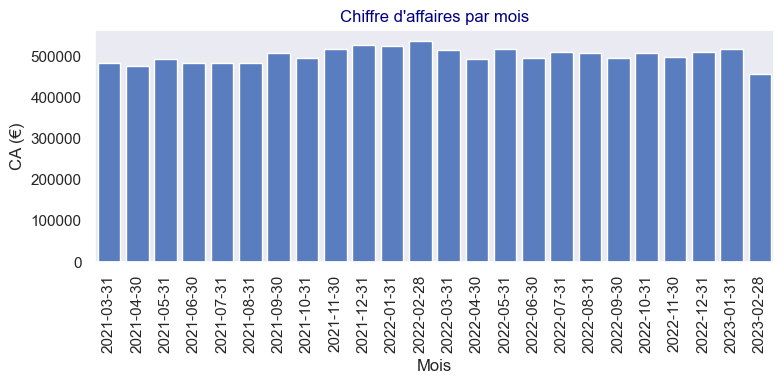

In [732]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis,
    x="day",
    y="CA_Monthly"
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

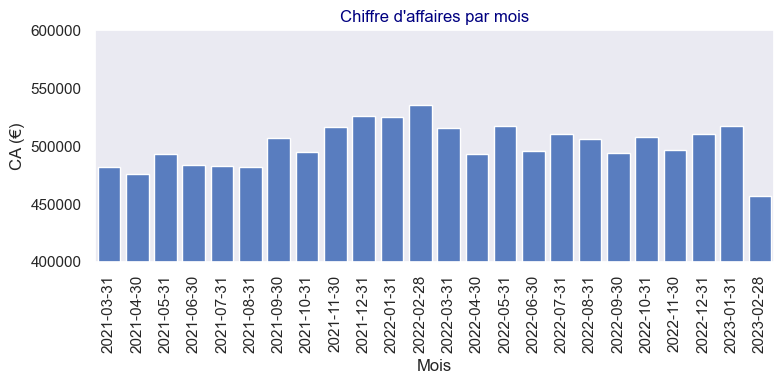

In [733]:
#FOCUS SUR LA CRETE
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis,
    x="day",
    y="CA_Monthly"
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

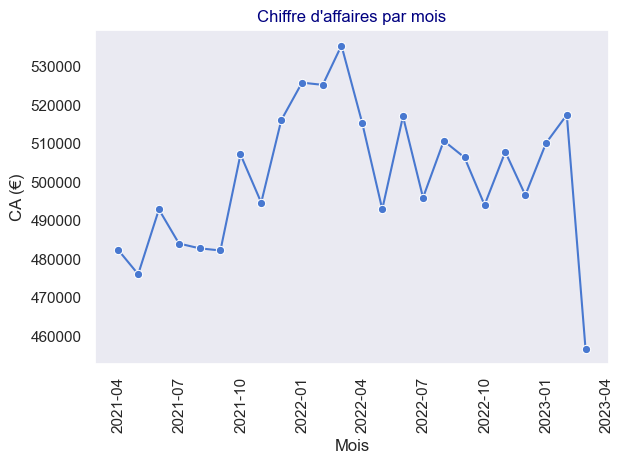

In [734]:
#plt.figure(figsize=(8,4)) 
plt.figure() 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis,
    x="day",
    y="CA_Monthly",
    marker='o'
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

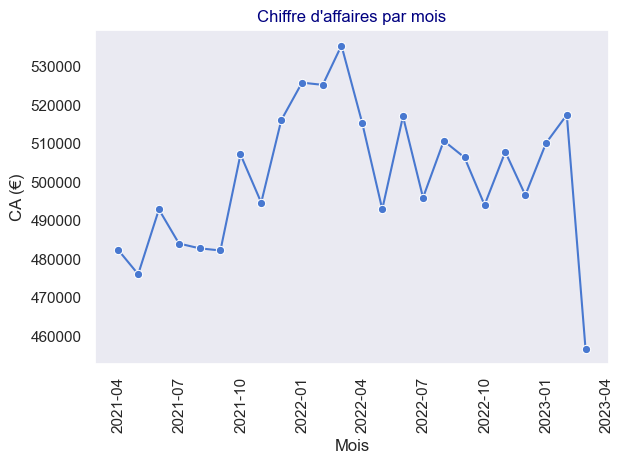

In [735]:
#plt.figure(figsize=(8,4)) 
plt.figure() 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis,
    x="day",
    y="CA_Monthly",
    marker='o'
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

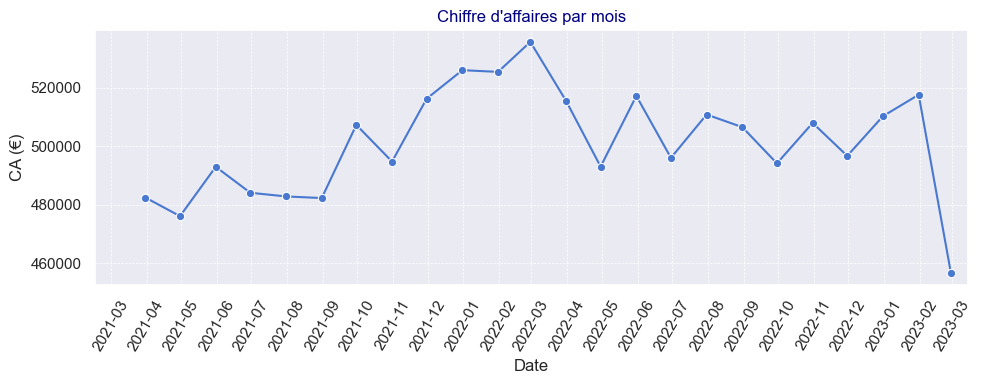

In [736]:
plt.figure(figsize=(10,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis,
    x="day",
    y="CA_Monthly",
    marker='o'
)


# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

###### <font color='blue'>**2. CA Mensuel par Categ**</font>

In [737]:
#Calcul du CA Mensuel par Catégorie
#Choix de sortir avec un index que sur la date (au lieu d'un Multi Index day,categ
df_CA_Monthly_1_1_bis_par_categ_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='ME'), 'categ'])
                                         .agg(CA_Monthly=pd.NamedAgg(column='price',aggfunc='sum'))).reset_index()

df_CA_Monthly_1_1_bis_par_categ_Grouper.set_index(keys='day',inplace=True)

display(df_CA_Monthly_1_1_bis_par_categ_Grouper)

,categ,CA_Monthly
day,,
2021-03-31,0,193629.17
2021-03-31,1,186974.17
2021-03-31,2,101837.27
2021-04-30,0,205222.46
2021-04-30,1,156138.35
...,...,...
2023-01-31,1,210104.41
2023-01-31,2,126153.08
2023-02-28,0,162457.00


###### <font color='blue'>**2.b Premiers Graph**</font>

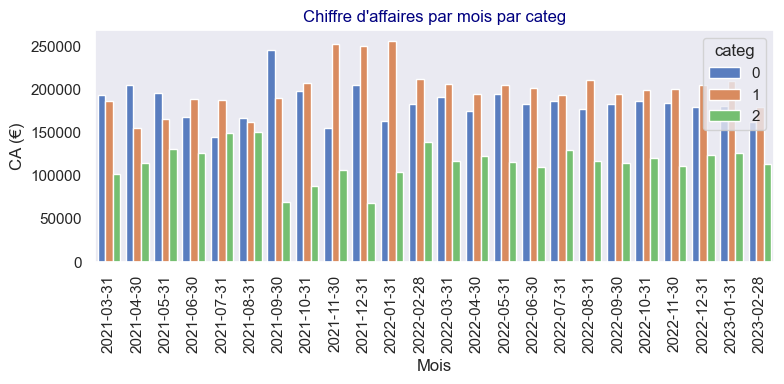

In [738]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day",
    y="CA_Monthly",
    hue='categ',
    palette=palette_fixe_categ
    )
plt.title("Chiffre d'affaires par mois par categ")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

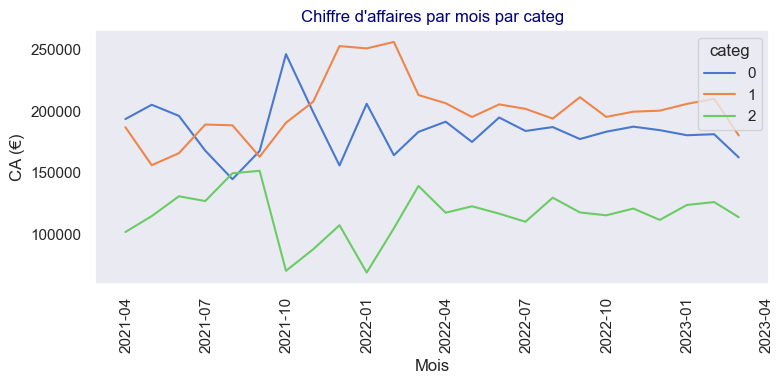

In [739]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day",
    y="CA_Monthly",
    hue='categ',
#    marker = 'o',
    palette=palette_fixe_categ
    )
plt.title("Chiffre d'affaires par mois par categ")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

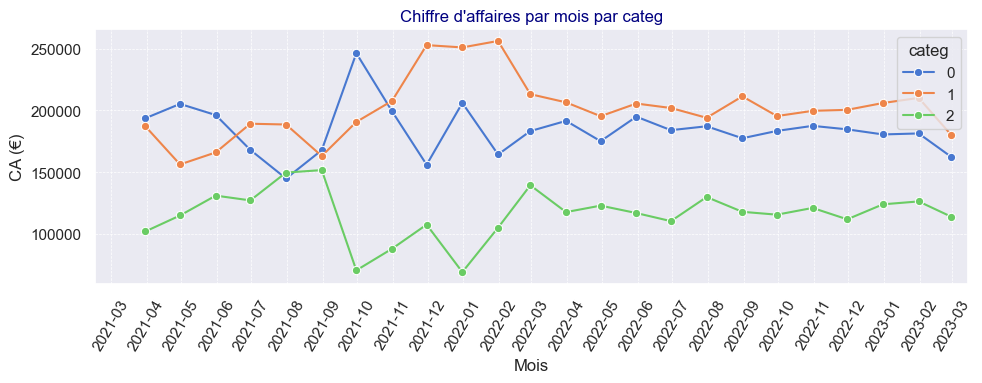

In [740]:
plt.figure(figsize=(10,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day",
    y="CA_Monthly",
    hue='categ',
    marker ='o',
    palette=palette_fixe_categ
    )

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Chiffre d'affaires par mois par categ")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

###### <font color='blue'>**3. Améliorations des Tables pour graph**</font>

In [741]:
# Création de l’étiquette d’exercice fiscal
def get_exercice(date):
    year = date.year
    if date.month < 3:
        return f'{year-1}-{str(year)[-2:]}'
    else:
        return f'{year}-{str(year+1)[-2:]}'

In [742]:
df_CA_Monthly_1_1_bis.head(2)

,CA_Monthly
day,
2021-03-31,482440.61
2021-04-30,476109.30


In [743]:
#Préparation des Data Frame pour Graph
#df_Complet_monthly_Grouper_graph = df_Complet_monthly_Grouper.loc[:,:]

df_CA_Monthly_1_1_bis['exercice'] = df_CA_Monthly_1_1_bis.index.map(get_exercice)
df_CA_Monthly_1_1_bis['annee'] = df_CA_Monthly_1_1_bis.index.year
df_CA_Monthly_1_1_bis['mois'] = df_CA_Monthly_1_1_bis.index.strftime('%b')
df_CA_Monthly_1_1_bis['mois_num'] = df_CA_Monthly_1_1_bis.index.month
df_CA_Monthly_1_1_bis['day01'] = df_CA_Monthly_1_1_bis.index.to_period('M').to_timestamp(how='start')
df_CA_Monthly_1_1_bis['annee_mois'] = df_CA_Monthly_1_1_bis.index.to_period("M")
#df_CA_Monthly_1_1_bis['year_month'] = df_CA_Monthly_1_1_bis.index.to_period("M")
#df_CA_Monthly_1_1_bis['year'] = df_CA_Monthly_1_1_bis.index.dt.year
#df_CA_Monthly_1_1_bis['month'] = df_CA_Monthly_1_1_bis.index.dt.month
#df_CA_Monthly_1_1_bis.head(3)

# Re-tri
#df_transactions_categ_2_Grouper = df_transactions_categ_2_Grouper.sort_values(['exercice', 'mois_num'])
df_CA_Monthly_1_1_bis.head(6)

,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,
2021-03-31,482440.61,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-04-30,476109.30,2021-22,2021,Apr,4,2021-04-01,2021-04
2021-05-31,492943.47,2021-22,2021,May,5,2021-05-01,2021-05
2021-06-30,484088.56,2021-22,2021,Jun,6,2021-06-01,2021-06
2021-07-31,482835.40,2021-22,2021,Jul,7,2021-07-01,2021-07
2021-08-31,482284.79,2021-22,2021,Aug,8,2021-08-01,2021-08


In [744]:
#Préparation des Data Frame pour Graph
#df_Complet_monthly_Grouper_graph = df_Complet_monthly_Grouper.loc[:,:]

df_CA_Monthly_1_1_bis_par_categ_Grouper['exercice'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.map(get_exercice)
df_CA_Monthly_1_1_bis_par_categ_Grouper['annee'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.year
df_CA_Monthly_1_1_bis_par_categ_Grouper['mois'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.strftime('%b')
df_CA_Monthly_1_1_bis_par_categ_Grouper['mois_num'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.month
df_CA_Monthly_1_1_bis_par_categ_Grouper['day01'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.to_period('M').to_timestamp(how='start')
df_CA_Monthly_1_1_bis_par_categ_Grouper['annee_mois'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.to_period("M")
#df_CA_Monthly_1_1_bis_par_categ_Grouper['year_month'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.to_period("M")
#df_CA_Monthly_1_1_bis_par_categ_Grouper['year'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.dt.year
#df_CA_Monthly_1_1_bis_par_categ_Grouper['month'] = df_CA_Monthly_1_1_bis_par_categ_Grouper.index.dt.month
#df_CA_Monthly_1_1_bis_par_categ_Grouper.head(3)

# Re-tri
#df_CA_Monthly_1_1_bis_par_categ_Grouper = df_CA_Monthly_1_1_bis_par_categ_Grouper.sort_values(['exercice', 'mois_num'])
df_CA_Monthly_1_1_bis_par_categ_Grouper.head(6)

,categ,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,,
2021-03-31,0,193629.17,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-03-31,1,186974.17,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-03-31,2,101837.27,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-04-30,0,205222.46,2021-22,2021,Apr,4,2021-04-01,2021-04
2021-04-30,1,156138.35,2021-22,2021,Apr,4,2021-04-01,2021-04
2021-04-30,2,114748.49,2021-22,2021,Apr,4,2021-04-01,2021-04


###### <font color='blue'>**4. Mask Exercices :**</font>

In [745]:
mask_Grouper_Ex_21_22 = df_CA_Monthly_1_1_bis['exercice']=='2021-22'
df_CA_Monthly_1_1_bis_Ex_21_22 = df_CA_Monthly_1_1_bis.loc[mask_Grouper_Ex_21_22,:]

mask_Grouper_Ex_22_23 = df_CA_Monthly_1_1_bis['exercice']=='2022-23'
df_CA_Monthly_1_1_bis_Ex_22_23 = df_CA_Monthly_1_1_bis.loc[mask_Grouper_Ex_22_23,:]

In [746]:
df_CA_Monthly_1_1_bis_Ex_21_22

,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,
2021-03-31,482440.61,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-04-30,476109.30,2021-22,2021,Apr,4,2021-04-01,2021-04
2021-05-31,492943.47,2021-22,2021,May,5,2021-05-01,2021-05
2021-06-30,484088.56,2021-22,2021,Jun,6,2021-06-01,2021-06
2021-07-31,482835.40,2021-22,2021,Jul,7,2021-07-01,2021-07
2021-08-31,482284.79,2021-22,2021,Aug,8,2021-08-01,2021-08
2021-09-30,507240.68,2021-22,2021,Sep,9,2021-09-01,2021-09
2021-10-31,494733.16,2021-22,2021,Oct,10,2021-10-01,2021-10
2021-11-30,516167.73,2021-22,2021,Nov,11,2021-11-01,2021-11


In [747]:
mask_Grouper_Ex_21_22 = df_CA_Monthly_1_1_bis_par_categ_Grouper['exercice']=='2021-22'
df_CA_Monthly_1_1_bis_par_categ_Grouper_Ex_21_22 = df_CA_Monthly_1_1_bis_par_categ_Grouper.loc[mask_Grouper_Ex_21_22,:]

mask_Grouper_Ex_22_23 = df_CA_Monthly_1_1_bis_par_categ_Grouper['exercice']=='2022-23'
df_CA_Monthly_1_1_bis_par_categ_Grouper_Ex_22_23 = df_CA_Monthly_1_1_bis_par_categ_Grouper.loc[mask_Grouper_Ex_22_23,:]

###### <font color='blue'>**4. Graph CA Mensuel :**</font>

In [748]:
df_CA_Monthly_1_1_bis.head(2)

,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,
2021-03-31,482440.61,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-04-30,476109.30,2021-22,2021,Apr,4,2021-04-01,2021-04


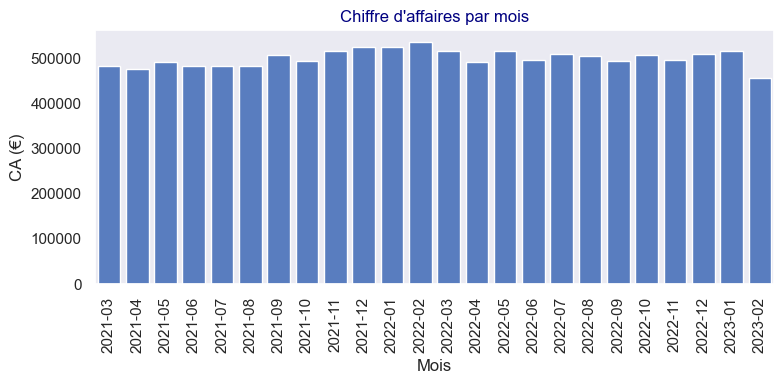

In [749]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis,
    x="annee_mois",
    y="CA_Monthly"
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

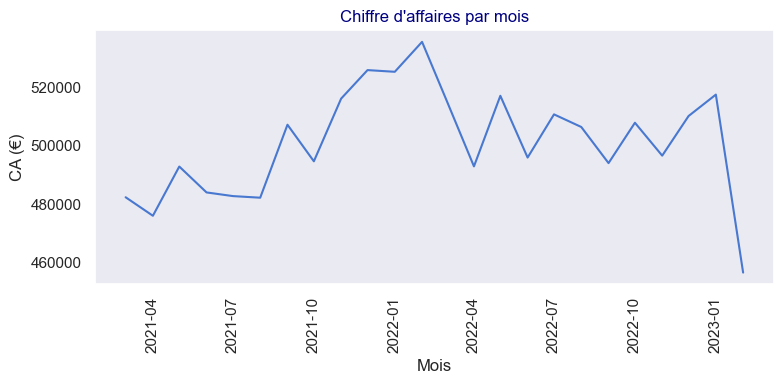

In [750]:
#NE MARCHE PAS AVEC UN LINEPLOT, il doit lui falloir un type date
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis,
    x="day01",
    y="CA_Monthly"
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

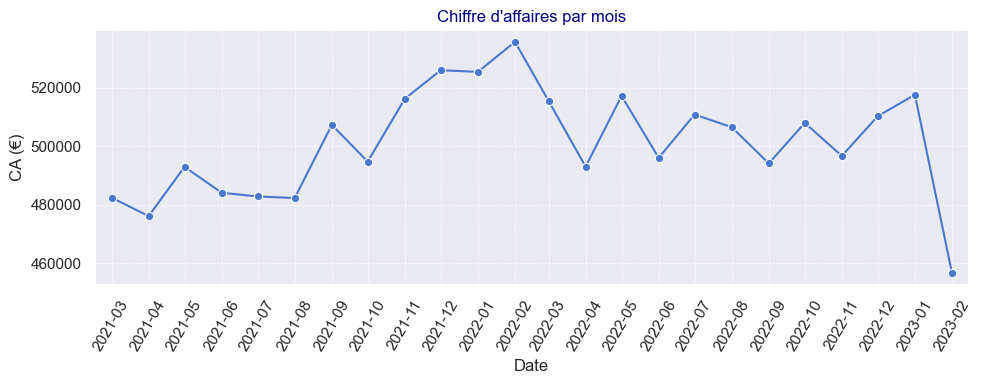

In [751]:
#NE MARCHE PAS AVEC UN LINEPLOT, il doit lui falloir un type date
plt.figure(figsize=(10,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis,
    x="day01",
    y="CA_Monthly",
    marker = 'o'
)

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Date")
plt.ylabel("CA (€)")
plt.xlim(datetime(2021, 2, 15), datetime(2023, 2, 15))
plt.tight_layout()
plt.show()

##### **AFFICHAGE PAR ANNEE :**

In [752]:
df_CA_Monthly_1_1_bis.head(2)

,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,
2021-03-31,482440.61,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-04-30,476109.30,2021-22,2021,Apr,4,2021-04-01,2021-04


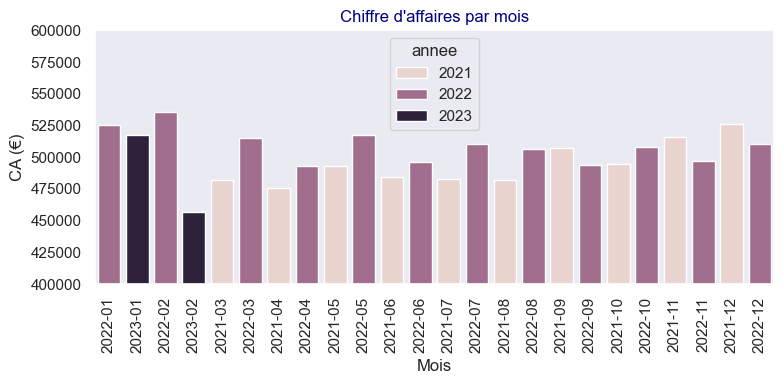

In [753]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis.sort_values(by=['mois_num','annee']),
    x="annee_mois",
    y="CA_Monthly",
    hue='annee',
    #order=CA_Monthly['mois_num']
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

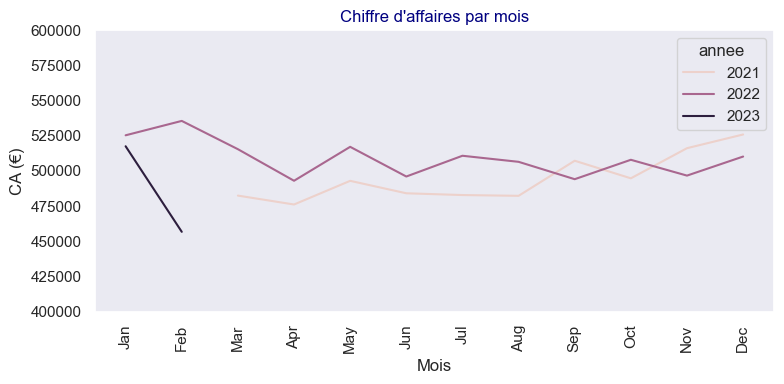

In [754]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis.sort_values(by=['mois_num','annee']),
    x="mois",
    y="CA_Monthly",
    hue='annee'#,
    #"order=df_CA_Monthly_1_1_bis['mois_num']
)
plt.title("Chiffre d'affaires par mois")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

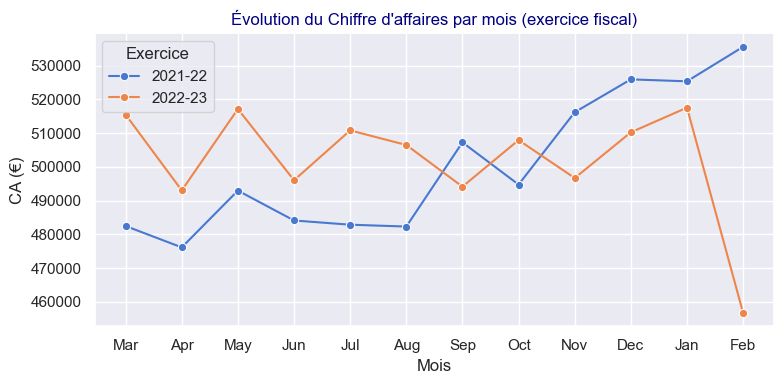

In [755]:
# Affichage par exercice fiscal
plt.figure(figsize=(8,4))
sns.lineplot(data=df_CA_Monthly_1_1_bis.sort_values(by=['annee','mois_num']), 
             x='mois', 
             y='CA_Monthly',
             hue='exercice', 
             marker='o')

plt.title("Évolution du Chiffre d'affaires par mois (exercice fiscal)")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.legend(title="Exercice")
plt.grid(True)
plt.tight_layout()
plt.show()

###### <font color='blue'>**5. Graph CA Mensuel par categ :**</font>

In [756]:
df_CA_Monthly_1_1_bis_par_categ_Grouper.head(2)

,categ,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,,
2021-03-31,0,193629.17,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-03-31,1,186974.17,2021-22,2021,Mar,3,2021-03-01,2021-03


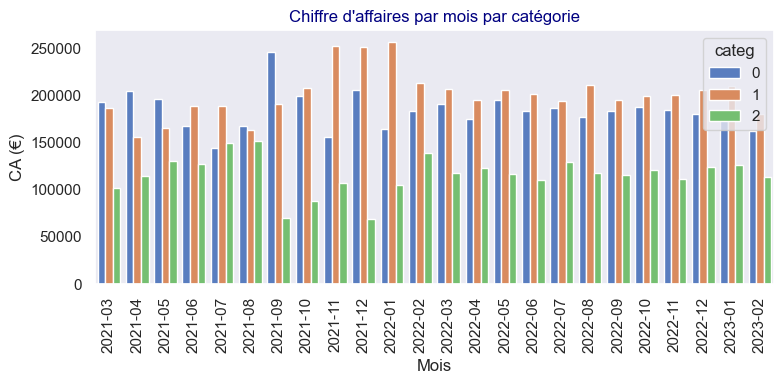

In [757]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="annee_mois",
    y="CA_Monthly",
    hue="categ",
    palette=palette_fixe_categ
)
plt.title("Chiffre d'affaires par mois par catégorie")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

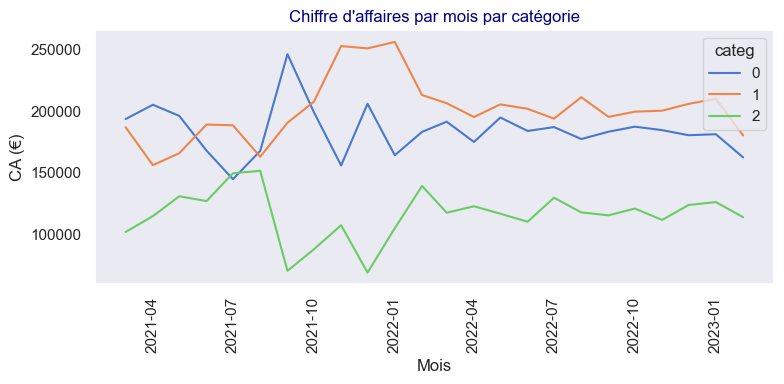

In [758]:
#NE MARCHE PAS AVEC UN LINEPLOT, il doit lui falloir un type date
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day01",
    y="CA_Monthly",
    hue="categ",
    palette=palette_fixe_categ
)
plt.title("Chiffre d'affaires par mois par catégorie")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

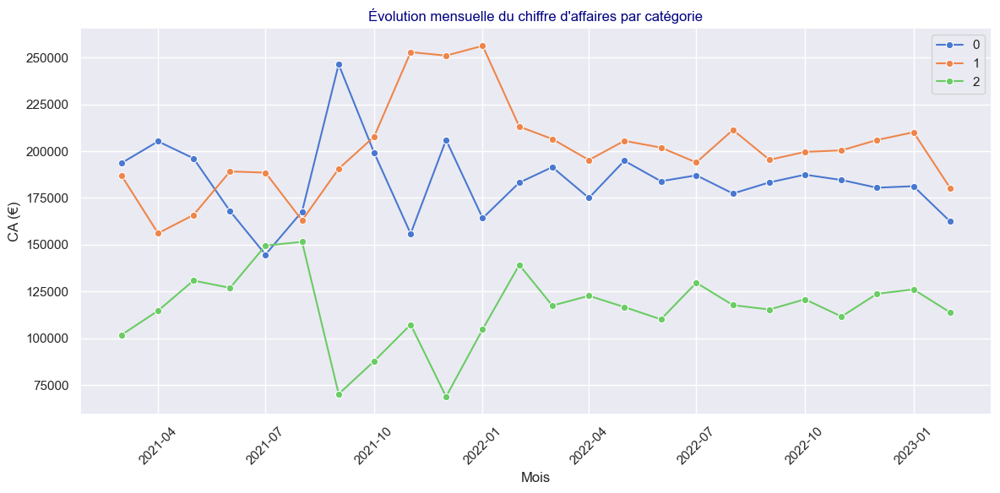

In [759]:
#IDEM AVEC AMELIORATIONS VISUELLES
plt.figure(figsize=(12, 6))
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day01",
    y="CA_Monthly",
    hue="categ",
    palette=palette_fixe_categ,
    marker='o'
)
plt.title("Évolution mensuelle du chiffre d'affaires par catégorie")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

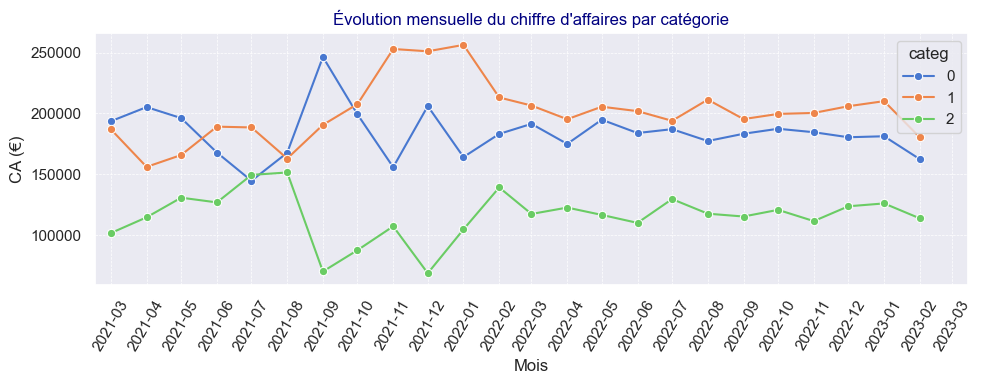

In [760]:
#IDEM AVEC AMELIORATIONS VISUELLES 2
plt.figure(figsize=(10, 4))
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day01",
    y="CA_Monthly",
    hue="categ",
    palette=palette_fixe_categ,
    marker='o'
)

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Évolution mensuelle du chiffre d'affaires par catégorie")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

##### **AFFICHAGE PAR ANNEE :**

In [761]:
df_CA_Monthly_1_1_bis_par_categ_Grouper.head(2)

,categ,CA_Monthly,exercice,annee,mois,mois_num,day01,annee_mois
day,,,,,,,,
2021-03-31,0,193629.17,2021-22,2021,Mar,3,2021-03-01,2021-03
2021-03-31,1,186974.17,2021-22,2021,Mar,3,2021-03-01,2021-03


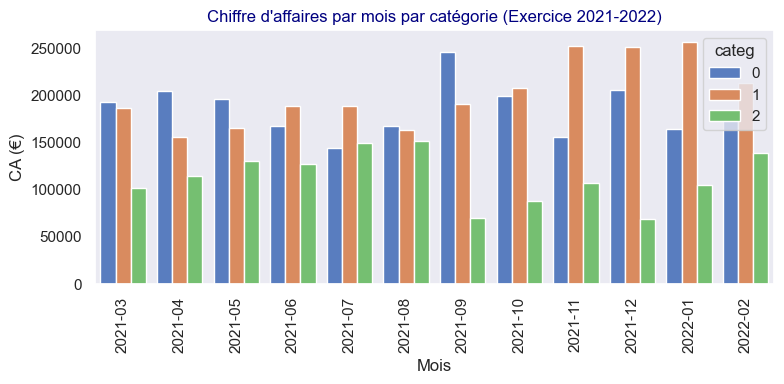

In [762]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper_Ex_21_22.sort_values(by=['annee','mois_num']),
    x="annee_mois",
    y="CA_Monthly",
    hue='categ',
    palette=palette_fixe_categ
)
plt.title("Chiffre d'affaires par mois par catégorie (Exercice 2021-2022)")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
#plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

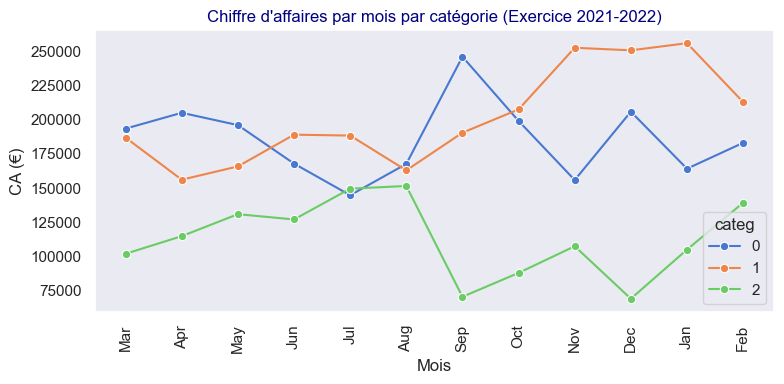

In [763]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper_Ex_21_22.sort_values(by=['annee','mois_num']),
    x="mois",
    y="CA_Monthly",
    hue='categ',
    palette=palette_fixe_categ,
    marker='o'
)
plt.title("Chiffre d'affaires par mois par catégorie (Exercice 2021-2022)")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
#plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

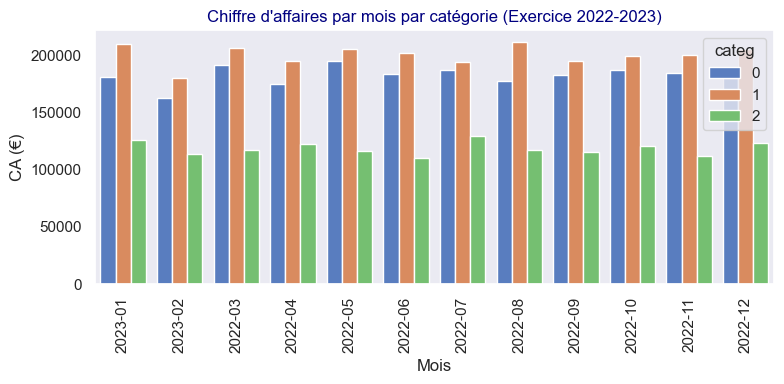

In [764]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper_Ex_22_23.sort_values(by=['mois_num','annee']),
    x="annee_mois",
    y="CA_Monthly",
    hue='categ',
    palette=palette_fixe_categ
)
plt.title("Chiffre d'affaires par mois par catégorie (Exercice 2022-2023)")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
#plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

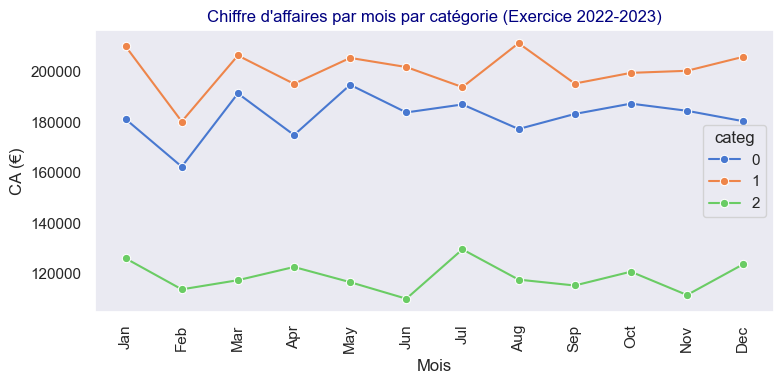

In [765]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper_Ex_22_23.sort_values(by=['mois_num','annee']),
    x="mois",
    y="CA_Monthly",
    hue='categ',
    palette=palette_fixe_categ,
    marker='o'
)
plt.title("Chiffre d'affaires par mois par catégorie (Exercice 2022-2023)")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=90)
#plt.ylim(400_000,600_000)
plt.tight_layout()
plt.show()

##### <u>**OBSERVATIONS :**</u>  
On observe que progressivement à partir de juin 2021 , la catagorie 1 devient la plus vendue, devant la catégorie 0.  
La catégorie 2 reste la moins vendue.

##### <font color = green><u>**D. CA PAR AN :**</u></font>

In [766]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


###### <font color='blue'>**1a. CA Annuel :**</font>

In [767]:
#CELLULE QUI FAIT PLANTER !!!
#INCOMPREHENSIBLE : au début ça affichait en année civile et plus maintenant  !!!
#df_CA_Yearly_Civil_1_1bis = df_analyse_O1_O2_transactions_1_1.resample('YE',on='day').sum().reset_index()
#df_CA_Yearly_Civil_1_1bis
#Test pour refaire un calcul en année civile
#df_CA_Yearly_Civil_1_1bis = df_analyse_O1_O2_transactions_1_1.resample('YE',on='day',origin=pd.Timestamp(2021, 1, 1)).sum().reset_index()
#df_CA_Yearly_Civil_1_1bis

In [768]:
df_CA_Yearly_Exercice_1_1_bis = df_analyse_O1_O2_transactions_1_1.resample('YE-FEB',on='day').agg(CA_Yearly=pd.NamedAgg(column='price',aggfunc='sum'))
df_CA_Yearly_Exercice_1_1_bis

,CA_Yearly
day,
2022-02-28,6005671.47
2023-02-28,6021991.63


In [769]:
CA_2022 = df_CA_Yearly_Exercice_1_1_bis.loc['2022-02-28', 'CA_Yearly']
CA_2023 = df_CA_Yearly_Exercice_1_1_bis.loc['2023-02-28', 'CA_Yearly']
Taux_Augmentation_CA_Yearly = ((CA_2023-CA_2022)/CA_2022)*100
print(f"le taux d'augmentation du CA entre l'exercice 2023 et 2022 est de : {Taux_Augmentation_CA_Yearly:.2f} %")

le taux d'augmentation du CA entre l'exercice 2023 et 2022 est de : 0.27 %


###### <font color='blue'>**1b. Premiers graphiques :**</font>

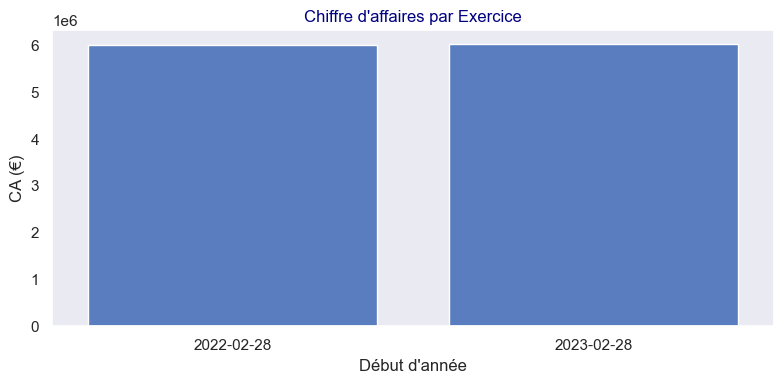

In [770]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis,
    x="day",
    y="CA_Yearly")
plt.title("Chiffre d'affaires par Exercice")
plt.xlabel("Début d'année")
plt.ylabel("CA (€)")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

###### <font color='blue'>**2. CA Annuel par catégorie:**</font>

In [771]:
#Calcul du CA Mensuel par Catégorie
#Choix de sortir avec un index que sur la date (au lieu d'un Multi Index day,categ
df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='YE-FEB'), 'categ'])
                                         .agg(CA_Yearly=pd.NamedAgg(column='price',aggfunc='sum'))).reset_index()

df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper.set_index(keys='day',inplace=True)

display(df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper)

,categ,CA_Yearly
day,,
2022-02-28,0,2230428.29
2022-02-28,1,2421318.83
2022-02-28,2,1353924.35
2023-02-28,0,2189302.68
2023-02-28,1,2406338.28
2023-02-28,2,1426350.67


###### <font color='blue'>**3. Améliorations des Tables pour graph**</font>

In [772]:
#Préparation des Data Frame pour Graph

df_CA_Yearly_Exercice_1_1_bis['exercice'] = df_CA_Yearly_Exercice_1_1_bis.index.map(get_exercice)
df_CA_Yearly_Exercice_1_1_bis['annee'] = df_CA_Yearly_Exercice_1_1_bis.index.year
df_CA_Yearly_Exercice_1_1_bis['day01'] = df_CA_Yearly_Exercice_1_1_bis.index.to_period('Y-FEB').to_timestamp(how='start')
#df_CA_Yearly_Exercice_1_1_bis['year'] = df_CA_Yearly_Exercice_1_1_bis.index.dt.year
df_CA_Yearly_Exercice_1_1_bis['CA_Yearly_Millions'] = df_CA_Yearly_Exercice_1_1_bis['CA_Yearly'] / 1_000_000

df_CA_Yearly_Exercice_1_1_bis.head(6)

,CA_Yearly,exercice,annee,day01,CA_Yearly_Millions
day,,,,,
2022-02-28,6005671.47,2021-22,2022,2021-03-01,6.005671
2023-02-28,6021991.63,2022-23,2023,2022-03-01,6.021992


In [773]:
#Préparation des Data Frame pour Graph
#df_Complet_monthly_Grouper_graph = df_Complet_monthly_Grouper.loc[:,:]

df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper['exercice'] = df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper.index.map(get_exercice)
df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper['annee'] = df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper.index.year
df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper['day01'] = df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper.index.to_period('Y-FEB').to_timestamp(how='start')
#df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper['year'] = df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper.index.dt.year
df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper['CA_Yearly_Millions'] = df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper['CA_Yearly'] / 1_000_000

df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper.head(6)

,categ,CA_Yearly,exercice,annee,day01,CA_Yearly_Millions
day,,,,,,
2022-02-28,0,2230428.29,2021-22,2022,2021-03-01,2.230428
2022-02-28,1,2421318.83,2021-22,2022,2021-03-01,2.421319
2022-02-28,2,1353924.35,2021-22,2022,2021-03-01,1.353924
2023-02-28,0,2189302.68,2022-23,2023,2022-03-01,2.189303
2023-02-28,1,2406338.28,2022-23,2023,2022-03-01,2.406338
2023-02-28,2,1426350.67,2022-23,2023,2022-03-01,1.426351


###### <font color='blue'>**4. Graph CA Annuel :**</font>

##### GRAPHS TESTS :

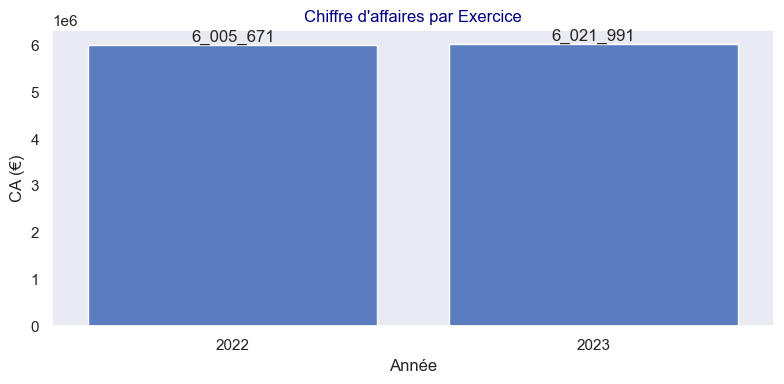

In [774]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
ax= sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis,
    x="annee",
    y="CA_Yearly")

#for x in range(0,1) :
#    ax.bar_label(ax.containers[x], fmt='%.2f')

for container in ax.containers:
    labels = [f'{int(v.get_height()):,}'.replace(",", "_") for v in container]
    ax.bar_label(container, labels=labels)

plt.title("Chiffre d'affaires par Exercice")
plt.xlabel("Année")
plt.ylabel("CA (€)")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

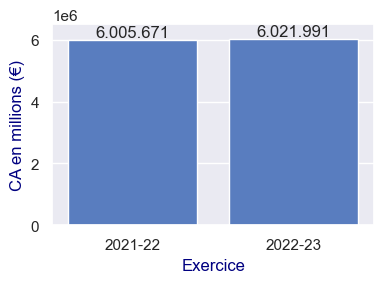

In [775]:
plt.figure(figsize=(4,3)) 
# Exemple : somme du CA par mois, affichée avec seaborn
ax= sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis,
    x="exercice",
    y="CA_Yearly")

#for x in range(0,1) :
#    ax.bar_label(ax.containers[x], fmt='%.2f')

for container in ax.containers:
    labels = [f'{int(v.get_height()):,}'.replace(",", ".") for v in container]
    ax.bar_label(container, labels=labels,padding=0)

# Ajouter des marges verticales pour que les labels ne touchent pas les bords
ax.margins(y=0.08)

#plt.title("Chiffre d'affaires par Exercice")
plt.xlabel("Exercice", fontdict={'fontsize' : 12, 'color':'navy'})
plt.ylabel("CA en millions (€)",fontdict={'fontsize' : 12, 'color':'navy'})
#plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

##### FIN GRAPHS TESTS :

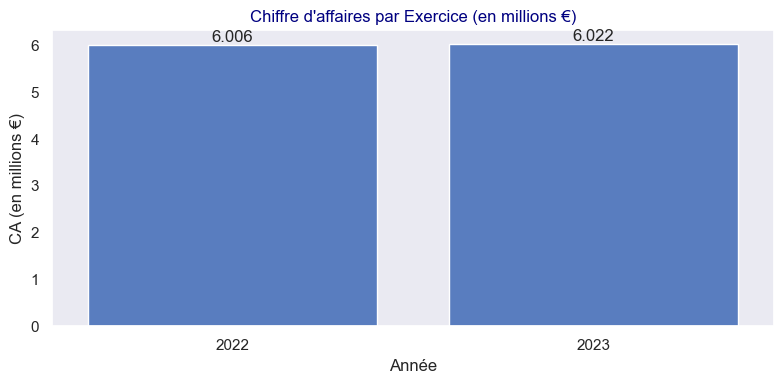

In [776]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
ax= sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis,
    x="annee",
    y="CA_Yearly_Millions")

for x in range(0,1) :
    ax.bar_label(ax.containers[x], fmt='%.3f')

#for container in ax.containers:
#    labels = [f'{int(v.get_height()):,}'.replace(",", "_") for v in container]
#    ax.bar_label(container, labels=labels)

plt.title("Chiffre d'affaires par Exercice (en millions €)")
plt.xlabel("Année")
plt.ylabel("CA (en millions €)")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

###### <font color='blue'>**5. Graph CA Annuel par catégorie :**</font>

##### GRAPHS TESTS :

In [777]:
df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper

,categ,CA_Yearly,exercice,annee,day01,CA_Yearly_Millions
day,,,,,,
2022-02-28,0,2230428.29,2021-22,2022,2021-03-01,2.230428
2022-02-28,1,2421318.83,2021-22,2022,2021-03-01,2.421319
2022-02-28,2,1353924.35,2021-22,2022,2021-03-01,1.353924
2023-02-28,0,2189302.68,2022-23,2023,2022-03-01,2.189303
2023-02-28,1,2406338.28,2022-23,2023,2022-03-01,2.406338
2023-02-28,2,1426350.67,2022-23,2023,2022-03-01,1.426351


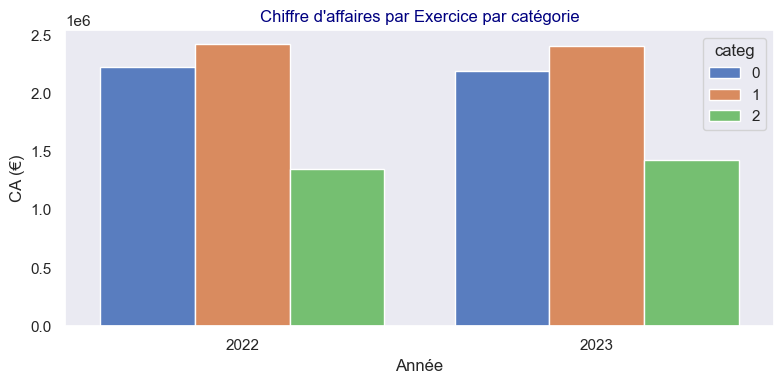

In [778]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper,
    x="annee",
    y="CA_Yearly",
    hue='categ',
    palette=palette_fixe_categ
)
plt.title("Chiffre d'affaires par Exercice par catégorie")
plt.xlabel("Année")
plt.ylabel("CA (€)")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

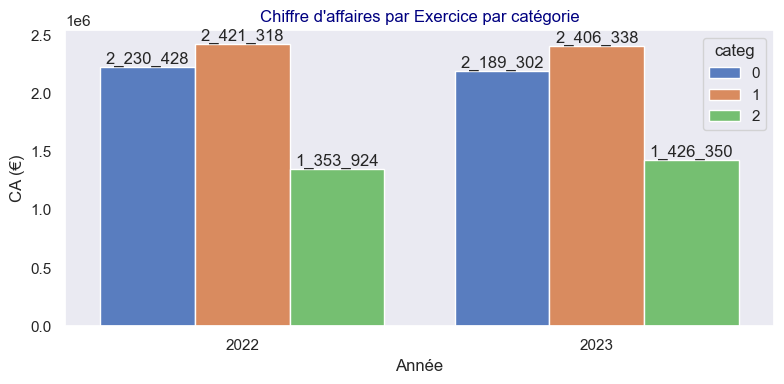

In [779]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
ax=sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper,
    x="annee",
    y="CA_Yearly",
    hue='categ',
    palette=palette_fixe_categ
)

for container in ax.containers:
    labels = [f'{int(v.get_height()):,}'.replace(",", "_") for v in container]
    ax.bar_label(container, labels=labels)
    
plt.title("Chiffre d'affaires par Exercice par catégorie")
plt.xlabel("Année")
plt.ylabel("CA (€)")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##### FIN GRAPHS TESTS :

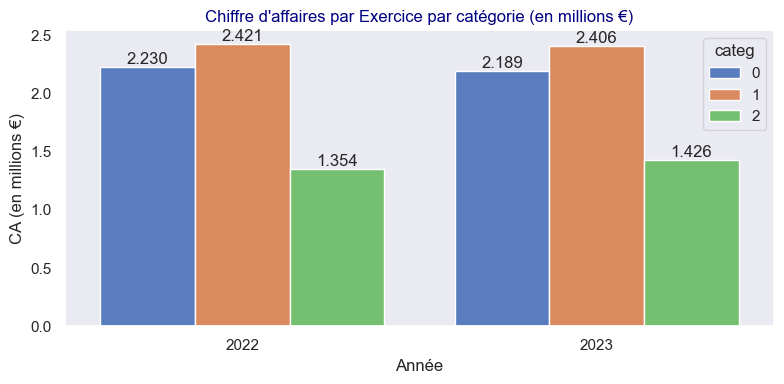

In [780]:
plt.figure(figsize=(8,4)) 
# Exemple : somme du CA par mois, affichée avec seaborn
ax=sns.barplot(
    data=df_CA_Yearly_Exercice_1_1_bis_par_categ_Grouper,
    x="annee",
    y="CA_Yearly_Millions",
    hue='categ',
    palette=palette_fixe_categ
)

for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x], fmt='%.3f')

#for container in ax.containers:
#    labels = [f'{int(v.get_height()):,}'.replace(",", "_") for v in container]
#    ax.bar_label(container, labels=labels)
    
plt.title("Chiffre d'affaires par Exercice par catégorie (en millions €)")
plt.xlabel("Année")
plt.ylabel("CA (en millions €)")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

###### <font color='blue'>**5. CA (total)sur 2 ans par catégorie :**</font>

In [781]:
df_CA_2ans_categ_1_1bis = df_analyse_O1_O2_transactions_1_1.groupby("categ")["price"].sum().reset_index()
df_CA_2ans_categ_1_1bis

,categ,price
0,0,4419730.97
1,1,4827657.11
2,2,2780275.02


In [782]:
df_CA_2ans_categ_1_1bis.rename(columns= {'price':'CA_2ans'},inplace=True)
df_CA_2ans_categ_1_1bis['CA_2ans_Millions'] = df_CA_2ans_categ_1_1bis['CA_2ans'] / 1_000_000
df_CA_2ans_categ_1_1bis

,categ,CA_2ans,CA_2ans_Millions
0,0,4419730.97,4.419731
1,1,4827657.11,4.827657
2,2,2780275.02,2.780275


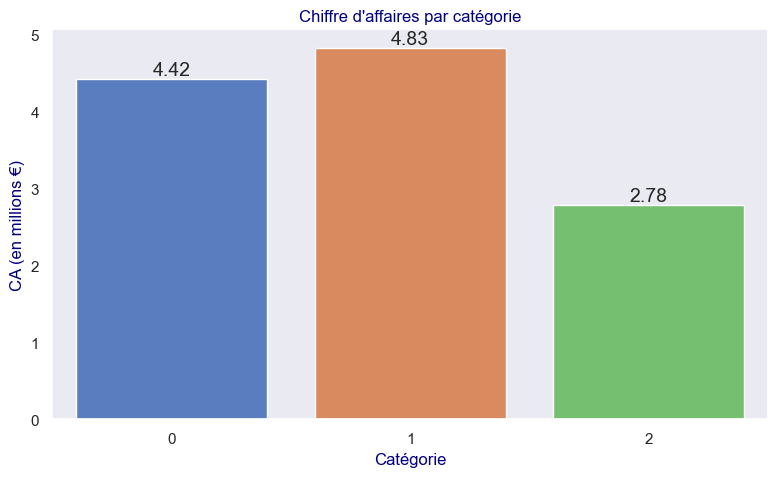

In [783]:
#BILAN sur 2 ans :
#df_cat = df_analyse_O1_O2_transactions_1_1.groupby("categ")["price"].sum().reset_index()


plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_CA_2ans_categ_1_1bis, 
                 x="categ", 
                 y="CA_2ans_Millions",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.2f')

plt.title("Chiffre d'affaires par catégorie")
plt.xlabel("Catégorie")
plt.ylabel("CA (en millions €)")
plt.tight_layout()
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1b.3 - CA Etude de la saisonnalité :</h4>
</div>

In [784]:
df_CA_Daily_1_1_bis.head(2)

,CA_daily,CA_moving_avg_7j,CA_moving_avg_14j,CA_moving_avg_30j
day,,,,
2021-03-01,16565.22,NaN,NaN,NaN
2021-03-02,15486.45,NaN,NaN,NaN


In [785]:
df_CA_Daily_par_categ_Grouper_1_1_bis.head(6)

,categ,CA_daily,CA_moving_avg_7j,CA_moving_avg_14j
day,,,,
2021-03-01,0,6262.65,NaN,NaN
2021-03-01,1,6811.53,NaN,NaN
2021-03-01,2,3491.04,NaN,NaN
2021-03-02,0,6718.27,NaN,NaN
2021-03-02,1,5627.15,NaN,NaN
2021-03-02,2,3141.03,NaN,NaN


In [786]:
#IMPORT
from statsmodels.tsa.seasonal import seasonal_decompose

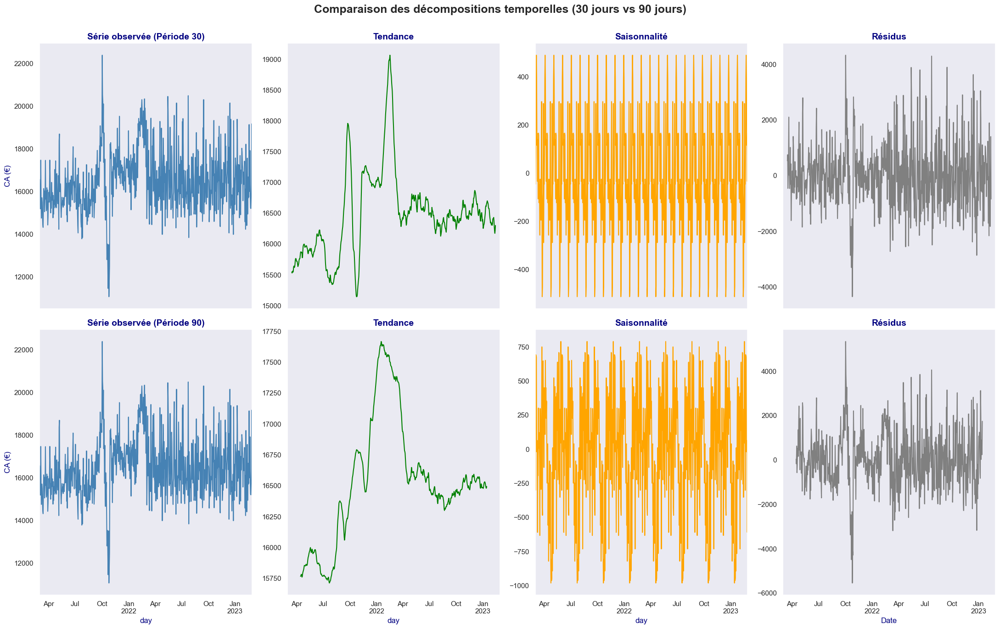

In [787]:
#from statsmodels.tsa.seasonal import seasonal_decompose
#import matplotlib.pyplot as plt

# Liste des périodes à comparer
periodes = [30, 90]
n = len(periodes)

# Création de la figure
fig, axes = plt.subplots(n, 4, figsize=(22, 7 * n), sharex=True)

# Décomposition pour chaque période
for i, period in enumerate(periodes):
    result = seasonal_decompose(df_CA_Daily_1_1_bis["CA_daily"], model='additive', period=period)

    # Série observée
    result.observed.plot(ax=axes[i, 0], color="steelblue")
    axes[i, 0].set_title(f"Série observée (Période {period})", fontsize=14, fontweight="bold")
    axes[i, 0].set_ylabel("CA (€)")

    # Tendance
    result.trend.plot(ax=axes[i, 1], color="green")
    axes[i, 1].set_title("Tendance", fontsize=14, fontweight="bold")

    # Saison
    result.seasonal.plot(ax=axes[i, 2], color="orange")
    axes[i, 2].set_title("Saisonnalité", fontsize=14, fontweight="bold")

    # Résidus
    result.resid.plot(ax=axes[i, 3], color="gray")
    axes[i, 3].set_title("Résidus", fontsize=14, fontweight="bold")
    axes[i, 3].set_xlabel("Date")

# Titre général
plt.suptitle("Comparaison des décompositions temporelles (30 jours vs 90 jours)",
             fontsize=18, fontweight="bold")

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

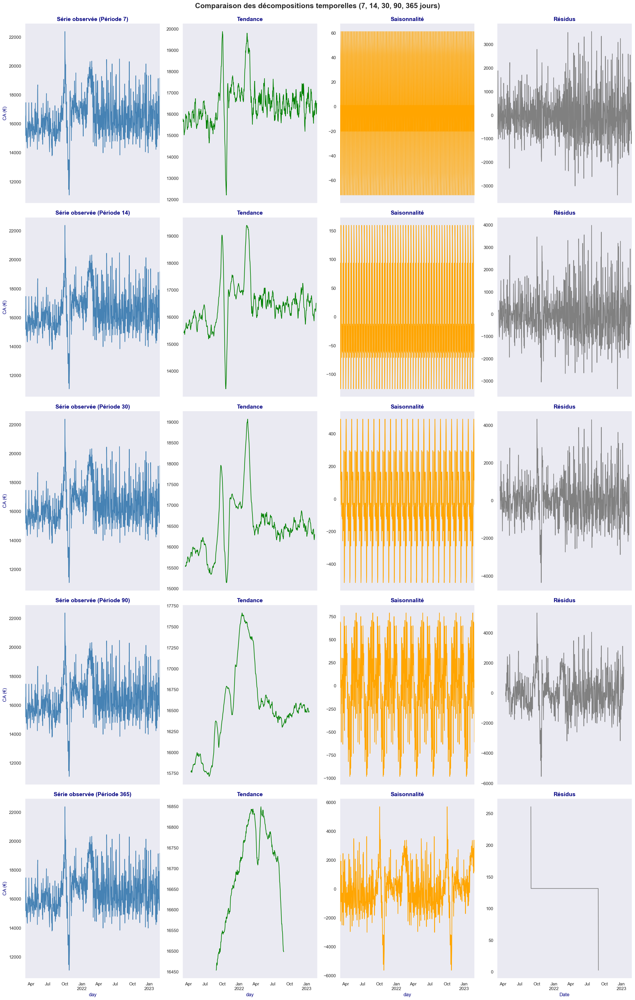

In [788]:
#from statsmodels.tsa.seasonal import seasonal_decompose
#import matplotlib.pyplot as plt

# Liste des périodes à comparer
periodes = [7,14,30, 90,365]
n = len(periodes)

# Création de la figure
fig, axes = plt.subplots(n, 4, figsize=(22, 7 * n), sharex=True)

# Décomposition pour chaque période
for i, period in enumerate(periodes):
    result = seasonal_decompose(df_CA_Daily_1_1_bis["CA_daily"], model='additive', period=period)

    # Série observée
    result.observed.plot(ax=axes[i, 0], color="steelblue")
    axes[i, 0].set_title(f"Série observée (Période {period})", fontsize=14, fontweight="bold")
    axes[i, 0].set_ylabel("CA (€)")

    # Tendance
    result.trend.plot(ax=axes[i, 1], color="green")
    axes[i, 1].set_title("Tendance", fontsize=14, fontweight="bold")

    # Saison
    result.seasonal.plot(ax=axes[i, 2], color="orange")
    axes[i, 2].set_title("Saisonnalité", fontsize=14, fontweight="bold")

    # Résidus
    result.resid.plot(ax=axes[i, 3], color="gray")
    axes[i, 3].set_title("Résidus", fontsize=14, fontweight="bold")
    axes[i, 3].set_xlabel("Date")

# Titre général
plt.suptitle("Comparaison des décompositions temporelles (7, 14, 30, 90, 365 jours)",
             fontsize=18, fontweight="bold")

plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

##### **RECHERCHES A LA MAIN :**

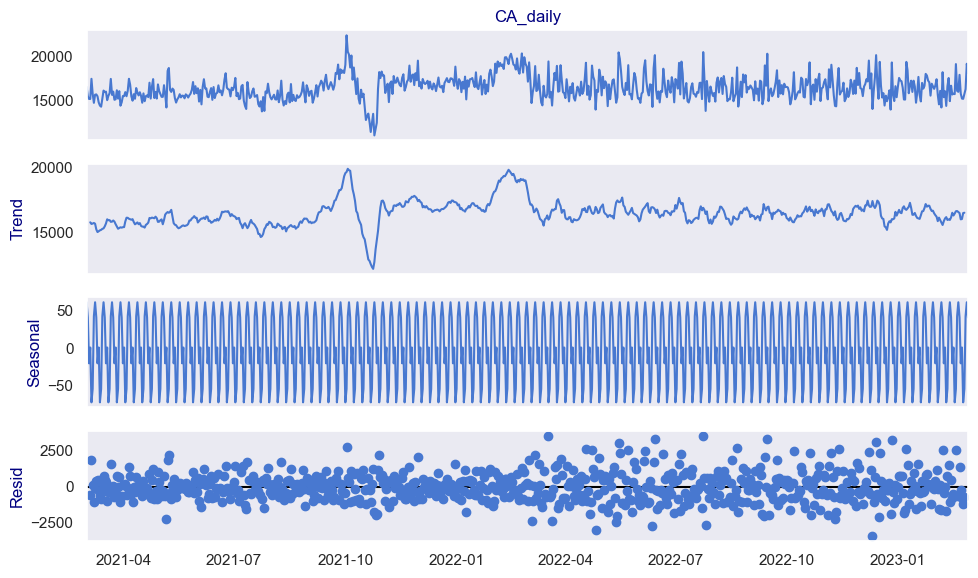

In [789]:
#plt.figure(figsize=(10, 10))
y = df_CA_Daily_1_1_bis["CA_daily"]

decomp = seasonal_decompose(y, model='additive')

fig = decomp.plot()
fig.set_size_inches((10, 6))
fig.tight_layout()
plt.show()

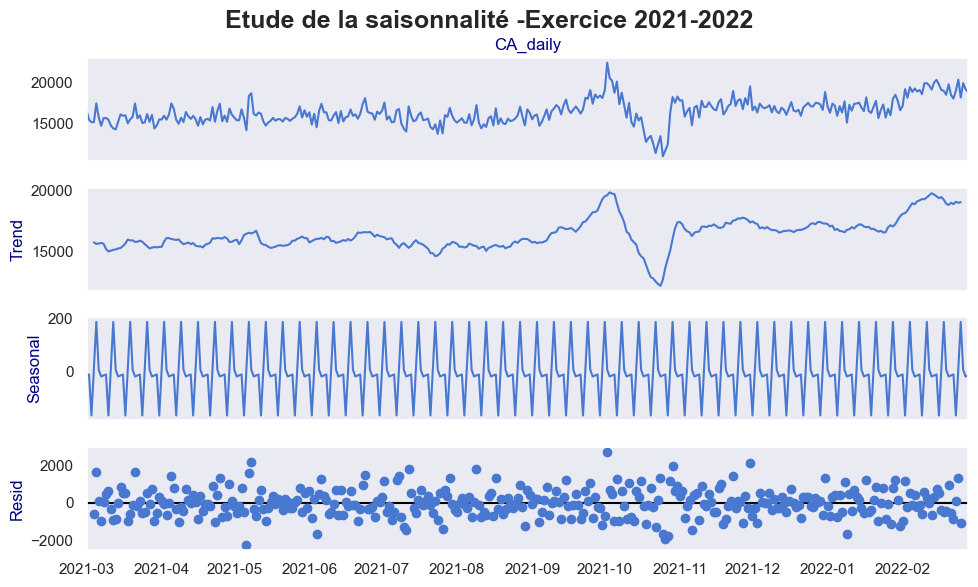

In [790]:
#plt.figure(figsize=(10, 10))
y = (df_CA_Daily_1_1_bis["CA_daily"])['01/03/2021':'28/02/2022']

decomp = seasonal_decompose(y, model='additive')

fig = decomp.plot()
fig.set_size_inches((10, 6))
fig.tight_layout()

# Titre général
plt.suptitle("Etude de la saisonnalité -Exercice 2021-2022",
             fontsize=18, fontweight="bold")
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

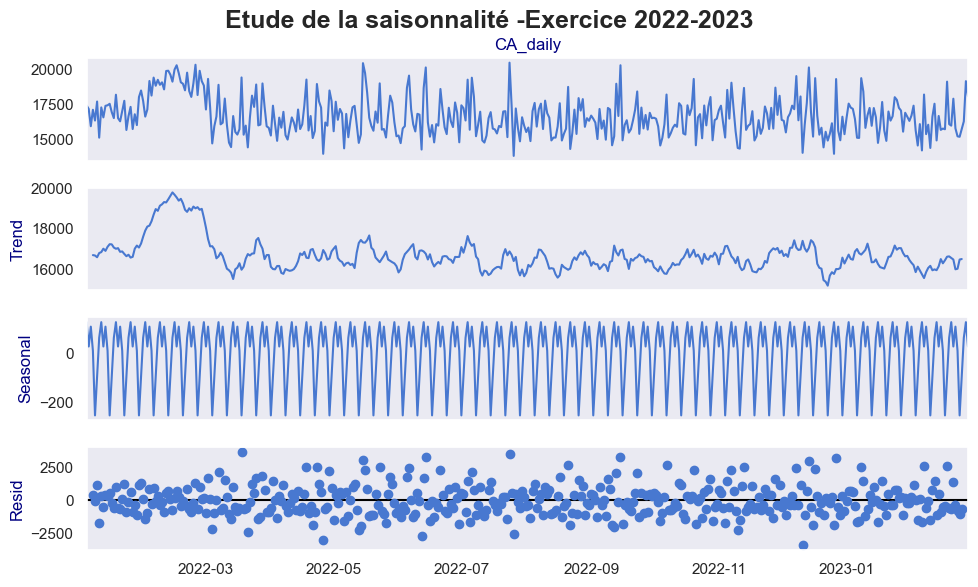

In [791]:
#plt.figure(figsize=(10, 10))
y = (df_CA_Daily_1_1_bis["CA_daily"])['01/03/2022':'28/02/2023']

decomp = seasonal_decompose(y, model='additive')

fig = decomp.plot()
fig.set_size_inches((10, 6))
fig.tight_layout()

# Titre général
plt.suptitle("Etude de la saisonnalité -Exercice 2022-2023",
             fontsize=18, fontweight="bold")
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

**OBSERVATIONS :**  
ON a l'air d'avoir une saisonnalité hebdomadaire

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1b.4 etude jour de la semaine :</h4>
</div>

In [792]:
df_CA_Daily_1_1_bis.head()

,CA_daily,CA_moving_avg_7j,CA_moving_avg_14j,CA_moving_avg_30j
day,,,,
2021-03-01,16565.22,NaN,NaN,NaN
2021-03-02,15486.45,NaN,NaN,NaN
2021-03-03,15198.69,NaN,NaN,NaN
2021-03-04,15196.07,NaN,NaN,NaN
2021-03-05,17471.37,NaN,NaN,NaN


In [793]:
#Shallow copy
df_CA_WeekDay_1_1_bis = (df_CA_Daily_1_1_bis.reset_index()[['day','CA_daily']]).set_index(keys='day')
df_CA_WeekDay_1_1_bis.head()

,CA_daily
day,
2021-03-01,16565.22
2021-03-02,15486.45
2021-03-03,15198.69
2021-03-04,15196.07
2021-03-05,17471.37


In [794]:
# Suppose que 'day' est la colonne de type datetime
df_CA_WeekDay_1_1_bis['weekday'] = df_CA_WeekDay_1_1_bis.index.day_name()  # Extrait les noms des jours (Lundi, Mardi...)
df_CA_WeekDay_1_1_bis.head()

,CA_daily,weekday
day,,
2021-03-01,16565.22,Monday
2021-03-02,15486.45,Tuesday
2021-03-03,15198.69,Wednesday
2021-03-04,15196.07,Thursday
2021-03-05,17471.37,Friday


In [795]:
# Groupement par jour de la semaine
df_CA_WeekDay_1_1_bis_grouped = df_CA_WeekDay_1_1_bis.groupby('weekday')['CA_daily'].sum().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)

df_CA_WeekDay_1_1_bis_grouped

weekday
Monday       1739110.52
Tuesday      1734560.41
Wednesday    1709878.17
Thursday     1712845.47
Friday       1705630.14
Saturday     1707864.79
Sunday       1717773.60
Name: CA_daily, dtype: float64

In [796]:
df_CA_Weekly_1_2_bis_grouped = pd.DataFrame(data=df_CA_WeekDay_1_1_bis_grouped)
df_CA_Weekly_1_2_bis_grouped

,CA_daily
weekday,
Monday,1739110.52
Tuesday,1734560.41
Wednesday,1709878.17
Thursday,1712845.47
Friday,1705630.14
Saturday,1707864.79
Sunday,1717773.60


In [797]:
type(df_CA_Weekly_1_2_bis_grouped)

pandas.core.frame.DataFrame

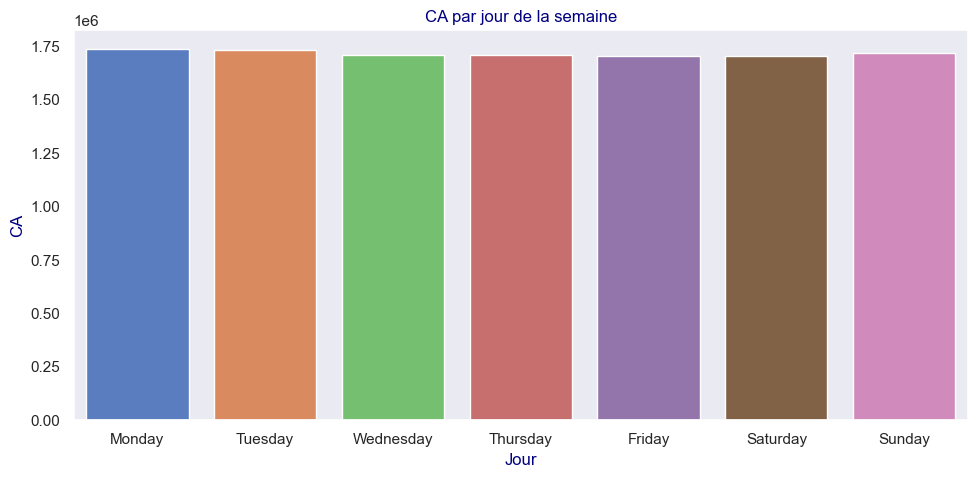

In [798]:
plt.figure(figsize=(10, 5))
sns.barplot(
    x='weekday',
    y='CA_daily',
    data=df_CA_Weekly_1_2_bis_grouped,
    order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    hue = 'weekday'
)
plt.title("CA par jour de la semaine")
plt.xlabel("Jour")
plt.ylabel("CA")
plt.tight_layout()
plt.show()

##### <u>**OBSERVATIONS :**</u>  
Pas de saisonnalité sur la semaine

##### ETUDE DE LA SAISONNALITE par QUART DU MOIS :

In [799]:
#Shallow copy
df_CA_WeekMonth_1_1_bis = (df_CA_Daily_1_1_bis.reset_index()[['day','CA_daily']]).set_index(keys='day')
df_CA_WeekMonth_1_1_bis.head()

,CA_daily
day,
2021-03-01,16565.22
2021-03-02,15486.45
2021-03-03,15198.69
2021-03-04,15196.07
2021-03-05,17471.37


In [800]:
df_CA_WeekMonth_1_1_bis['day_num'] = df_CA_WeekMonth_1_1_bis.index.day  # Extrait les noms des jours (Lundi, Mardi...)
df_CA_WeekMonth_1_1_bis.head()

,CA_daily,day_num
day,,
2021-03-01,16565.22,1
2021-03-02,15486.45,2
2021-03-03,15198.69,3
2021-03-04,15196.07,4
2021-03-05,17471.37,5


In [801]:
df_CA_WeekMonth_1_1_bis.dtypes

CA_daily    float64
day_num       int32
dtype: object

In [802]:
# Groupement par jour du mois
df_CA_WeekMonth_1_1_bis_grouped = pd.DataFrame(df_CA_WeekMonth_1_1_bis.groupby('day_num')['CA_daily'].sum().sort_index())
df_CA_WeekMonth_1_1_bis_grouped.head()

,CA_daily
day_num,
1,395694.50
2,407745.13
3,391792.38
4,391548.04
5,402041.79


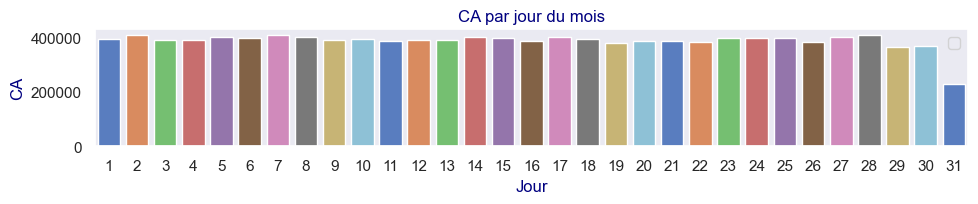

In [803]:
plt.figure(figsize=(10, 5))


sns.barplot(
    x='day_num',
    y='CA_daily',
    data=df_CA_WeekMonth_1_1_bis_grouped,
    hue = 'day_num',
    palette='muted'
)
plt.title("CA par jour du mois")
plt.xlabel("Jour")
plt.ylabel("CA")
plt.tight_layout()
plt.legend(labels=[])
#plt.ylim(200_000,425_000)
plt.show()

##### **OBSERVATIONS :**  
Pas de tendance de fond.  
(le 31 est moins elevé car seulement 7 mois sur 12 en ont un.

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">5.2bis - AUTRES INDICATEURS DE VENTES</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2b.0 - Préparation des tables :</h4>
</div>

In [804]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


###### <font color='blue'><u>**C.1 TABLES BILANS QUOTIDIENNES :**</u></font>

##### EXPLORATION :

##### FIN EXPLORATION :

In [805]:
df_Complet_daily_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='D')])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_daily_Grouper.set_index(keys='day',inplace=True)
df_Complet_daily_Grouper

,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,
2021-03-01,962,646,438
2021-03-02,939,637,428
2021-03-03,911,643,395
2021-03-04,903,616,406
2021-03-05,943,620,440
...,...,...,...
2023-02-24,894,610,412
2023-02-25,905,575,415
2023-02-26,890,590,440


In [806]:
df_Complet_daily_par_categ_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='D'), 'categ'])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_daily_par_categ_Grouper.set_index(keys='day',inplace=True)
df_Complet_daily_par_categ_Grouper

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,,
2021-03-01,0,581,407,287
2021-03-01,1,335,200,249
2021-03-01,2,46,39,36
2021-03-02,0,620,437,296
2021-03-02,1,276,169,207
...,...,...,...,...
2023-02-27,1,332,186,251
2023-02-27,2,75,47,51
2023-02-28,0,472,352,245


###### <font color='blue'><u>**C.2 TABLES BILANS MENSUELLES :**</u></font>

In [807]:
df_Complet_monthly_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='ME')])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_monthly_Grouper.set_index(keys='day',inplace=True)
df_Complet_monthly_Grouper

,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,
2021-03-31,28601,2482,5676
2021-04-30,28443,2492,5674
2021-05-31,28285,2471,5644
2021-06-30,26850,2414,5659
2021-07-31,24738,2369,5672
2021-08-31,25650,2404,5642
2021-09-30,33314,2560,5693
2021-10-31,30022,2506,6190
2021-11-30,28311,2432,5875


In [808]:
df_Complet_monthly_par_categ_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='ME'), 'categ'])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_monthly_par_categ_Grouper.set_index(keys='day',inplace=True)
df_Complet_monthly_par_categ_Grouper

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,,
2021-03-31,0,18131,1701,4286
2021-03-31,1,9134,614,4115
2021-03-31,2,1336,167,843
2021-04-30,0,19342,1731,4373
2021-04-30,1,7579,576,3725
...,...,...,...,...
2023-01-31,1,10252,617,4422
2023-01-31,2,1618,178,925
2023-02-28,0,15255,1639,4037


In [809]:
# Création de l’étiquette d’exercice fiscal
def get_exercice(date):
    year = date.year
    if date.month < 3:
        return f'{year-1}-{str(year)[-2:]}'
    else:
        return f'{year}-{str(year+1)[-2:]}'

In [810]:
#Préparation des Data Frame pour Graph
#df_Complet_monthly_Grouper_graph = df_Complet_monthly_Grouper.loc[:,:]

df_Complet_monthly_Grouper['exercice'] = df_Complet_monthly_Grouper.index.map(get_exercice)
df_Complet_monthly_Grouper['annee'] = df_Complet_monthly_Grouper.index.year
df_Complet_monthly_Grouper['mois'] = df_Complet_monthly_Grouper.index.strftime('%b')
df_Complet_monthly_Grouper['mois_num'] = df_Complet_monthly_Grouper.index.month
df_Complet_monthly_Grouper['day01'] = df_Complet_monthly_Grouper.index.to_period('M').to_timestamp(how='start')

# Re-tri
#df_transactions_categ_2_Grouper = df_transactions_categ_2_Grouper.sort_values(['exercice', 'mois_num'])
df_Complet_monthly_Grouper.head(6)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01
2021-05-31,28285,2471,5644,2021-22,2021,May,5,2021-05-01
2021-06-30,26850,2414,5659,2021-22,2021,Jun,6,2021-06-01
2021-07-31,24738,2369,5672,2021-22,2021,Jul,7,2021-07-01
2021-08-31,25650,2404,5642,2021-22,2021,Aug,8,2021-08-01


In [811]:
#Préparation des Data Frame pour Graph
#df_Complet_monthly_par_categ_Grouper_graph = df_Complet_monthly_par_categ_Grouper.loc[:,:]

df_Complet_monthly_par_categ_Grouper['exercice'] = df_Complet_monthly_par_categ_Grouper.index.map(get_exercice)
df_Complet_monthly_par_categ_Grouper['annee'] = df_Complet_monthly_par_categ_Grouper.index.year
df_Complet_monthly_par_categ_Grouper['mois'] = df_Complet_monthly_par_categ_Grouper.index.strftime('%b')
df_Complet_monthly_par_categ_Grouper['mois_num'] = df_Complet_monthly_par_categ_Grouper.index.month
df_Complet_monthly_par_categ_Grouper['day01'] = df_Complet_monthly_par_categ_Grouper.index.to_period('M').to_timestamp(how='start')

# Re-tri
#df_Complet_monthly_par_categ_Grouper = df_Complet_monthly_par_categ_Grouper.sort_values(['exercice', 'mois_num'])
df_Complet_monthly_par_categ_Grouper.head(6)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01
2021-03-31,2,1336,167,843,2021-22,2021,Mar,3,2021-03-01
2021-04-30,0,19342,1731,4373,2021-22,2021,Apr,4,2021-04-01
2021-04-30,1,7579,576,3725,2021-22,2021,Apr,4,2021-04-01
2021-04-30,2,1522,185,916,2021-22,2021,Apr,4,2021-04-01


In [812]:
mask_Grouper_Ex_21_22 = df_Complet_monthly_par_categ_Grouper['exercice']=='2021-22'
df_Complet_monthly_par_categ_Grouper_Ex_21_22 = df_Complet_monthly_par_categ_Grouper.loc[mask_Grouper_Ex_21_22,:]

mask_Grouper_Ex_22_23 = df_Complet_monthly_par_categ_Grouper['exercice']=='2022-23'
df_Complet_monthly_par_categ_Grouper_Ex_22_23 = df_Complet_monthly_par_categ_Grouper.loc[mask_Grouper_Ex_22_23,:]

###### <font color='blue'><u>**C.3 TABLES BILANS ANNUELLES :**</u></font>

In [813]:
df_Complet_yearly_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='YE-FEB')])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_yearly_Grouper.set_index(keys='day',inplace=True)
df_Complet_yearly_Grouper

,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,
2022-02-28,345608,3265,8600
2023-02-28,341926,3220,8524


In [814]:
df_Complet_yearly_par_categ_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='YE-FEB'), 'categ'])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_yearly_par_categ_Grouper.set_index(keys='day',inplace=True)
df_Complet_yearly_par_categ_Grouper

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,,
2022-02-28,0,209662,2292,7892
2022-02-28,1,118158,737,8459
2022-02-28,2,17788,236,3422
2023-02-28,0,205797,2256,7457
2023-02-28,1,117434,734,8199
2023-02-28,2,18695,230,2965


In [815]:
#Préparation des Data Frame pour Graph
#df_Complet_yearly_Grouper_graph = df_Complet_yearly_Grouper.loc[:,:]

df_Complet_yearly_Grouper['exercice'] = df_Complet_yearly_Grouper.index.map(get_exercice)
#df_Complet_yearly_Grouper['annee'] = df_Complet_yearly_Grouper.index.year
#df_Complet_yearly_Grouper['mois'] = df_Complet_yearly_Grouper.index.strftime('%b')
#df_Complet_yearly_Grouper['mois_num'] = df_Complet_yearly_Grouper.index.month
df_Complet_yearly_Grouper['day01'] = df_Complet_yearly_Grouper.index.to_period('Y-FEB').to_timestamp(how='start')

# Re-tri
#df_Complet_yearly_Grouper = df_Complet_yearly_Grouper.sort_values(['exercice', 'mois_num'])
df_Complet_yearly_Grouper.head(6)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,day01
day,,,,,
2022-02-28,345608,3265,8600,2021-22,2021-03-01
2023-02-28,341926,3220,8524,2022-23,2022-03-01


In [816]:
#Préparation des Data Frame pour Graph
#df_Complet_yearly_par_categ_Grouper_graph = df_Complet_yearly_par_categ_Grouper.loc[:,:]

df_Complet_yearly_par_categ_Grouper['exercice'] = df_Complet_yearly_par_categ_Grouper.index.map(get_exercice)
#df_Complet_yearly_par_categ_Grouper['annee'] = df_Complet_yearly_par_categ_Grouper.index.year
#df_Complet_yearly_par_categ_Grouper['mois'] = df_Complet_yearly_par_categ_Grouper.index.strftime('%b')
#df_Complet_yearly_par_categ_Grouper['mois_num'] = df_Complet_yearly_par_categ_Grouper.index.month
df_Complet_yearly_par_categ_Grouper['day01'] = df_Complet_yearly_par_categ_Grouper.index.to_period('Y-FEB').to_timestamp(how='start')

# Re-tri
#df_Complet_yearly_par_categ_Grouper = df_Complet_yearly_par_categ_Grouper.sort_values(['exercice', 'mois_num'])
df_Complet_yearly_par_categ_Grouper.head(6)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,day01
day,,,,,,
2022-02-28,0,209662,2292,7892,2021-22,2021-03-01
2022-02-28,1,118158,737,8459,2021-22,2021-03-01
2022-02-28,2,17788,236,3422,2021-22,2021-03-01
2023-02-28,0,205797,2256,7457,2022-23,2022-03-01
2023-02-28,1,117434,734,8199,2022-23,2022-03-01
2023-02-28,2,18695,230,2965,2022-23,2022-03-01


###### <font color='blue'><u>**C.4 :**</u></font>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2b.1 - Nombres de transactions :</h4>
</div>

In [817]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


##### <font color=green><u>A. Nbre de transactions totales sur la periode :</u></font>

In [818]:
print("le nombre de transactions total sur la période de l'étude est de :",
      df_analyse_O1_O2_transactions_1_1['transaction_id'].count())

le nombre de transactions total sur la période de l'étude est de : 687534


##### <font color=green><u>B. Nbre de transactions quotidienne sur la periode :</u></font>

In [819]:
df_Complet_daily_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts
day,,,
2021-03-01,962,646,438
2021-03-02,939,637,428


In [820]:
df_Complet_daily_Grouper['nb_transactions'].describe()

count     730.000000
mean      941.827397
std       104.116429
min       713.000000
25%       882.250000
50%       930.000000
75%       993.000000
max      1339.000000
Name: nb_transactions, dtype: float64

In [821]:
print("La moyenne de transaction quotidienne est de : ",
      round(df_Complet_daily_Grouper['nb_transactions'].mean(),2),
     "transactions")
print("La médiane de transaction quotidienne est de : ",
      int(df_Complet_daily_Grouper['nb_transactions'].median()),
     "transactions")

La moyenne de transaction quotidienne est de :  941.83 transactions
La médiane de transaction quotidienne est de :  930 transactions


In [822]:
df_Complet_daily_Grouper["tr_moving_avg_7j"] = df_Complet_daily_Grouper["nb_transactions"].rolling(window=7).mean()
df_Complet_daily_Grouper["tr_moving_avg_14j"] = df_Complet_daily_Grouper["nb_transactions"].rolling(window=14).mean()
df_Complet_daily_Grouper.head(10)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,tr_moving_avg_7j,tr_moving_avg_14j
day,,,,,
2021-03-01,962,646,438,NaN,NaN
2021-03-02,939,637,428,NaN,NaN
2021-03-03,911,643,395,NaN,NaN
2021-03-04,903,616,406,NaN,NaN
2021-03-05,943,620,440,NaN,NaN
2021-03-06,961,637,422,NaN,NaN
2021-03-07,905,606,413,932.000000,NaN
2021-03-08,928,614,425,927.142857,NaN
2021-03-09,952,631,421,929.000000,NaN


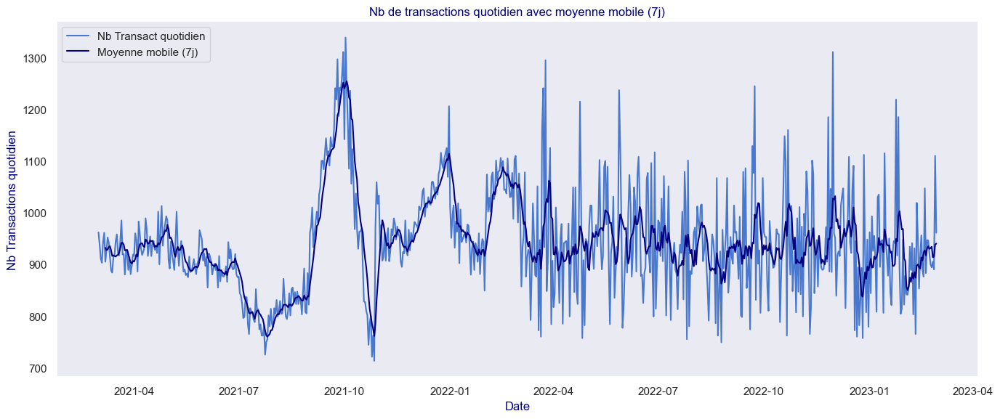

In [823]:
#Nb transactions dans le temps (avec moyenne mobile sur 7 jours)

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="nb_transactions", 
             label="Nb Transact quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="tr_moving_avg_7j", 
             label="Moyenne mobile (7j)",
            color='navy')

plt.title("Nb de transactions quotidien avec moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("Nb Transactions quotidien")
plt.legend()
plt.tight_layout()
plt.show()

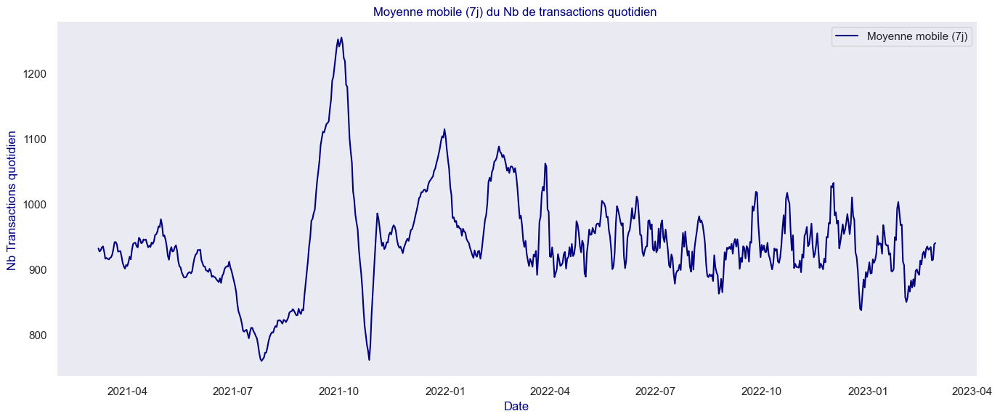

In [824]:
# moyenne mobile sur 7 jours du Nb transactions dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_transactions", 
#             label="Nb Transact quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="tr_moving_avg_7j", 
             label="Moyenne mobile (7j)",
            color='navy')

plt.title("Moyenne mobile (7j) du Nb de transactions quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Transactions quotidien")
plt.legend()
plt.tight_layout()
plt.show()

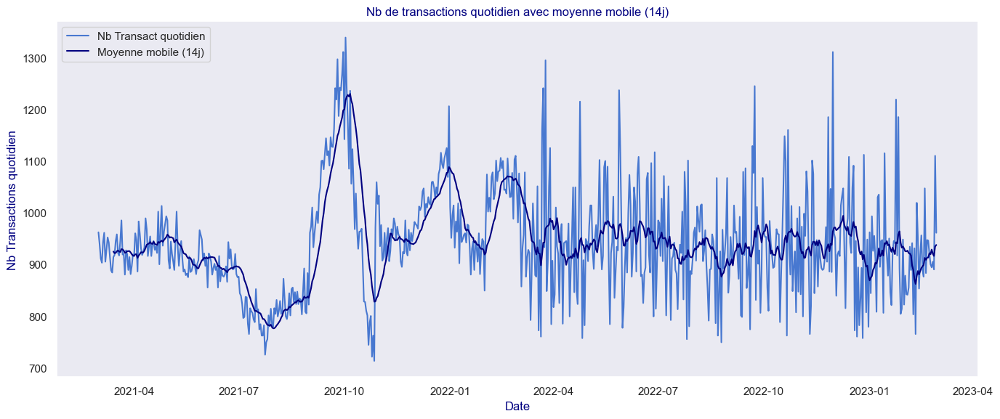

In [825]:
#Nb transactions dans le temps (avec moyenne mobile sur 14 jours)

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="nb_transactions", 
             label="Nb Transact quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="tr_moving_avg_14j", 
             label="Moyenne mobile (14j)",
            color='navy')

plt.title("Nb de transactions quotidien avec moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("Nb Transactions quotidien")
plt.legend()
plt.tight_layout()
plt.show()

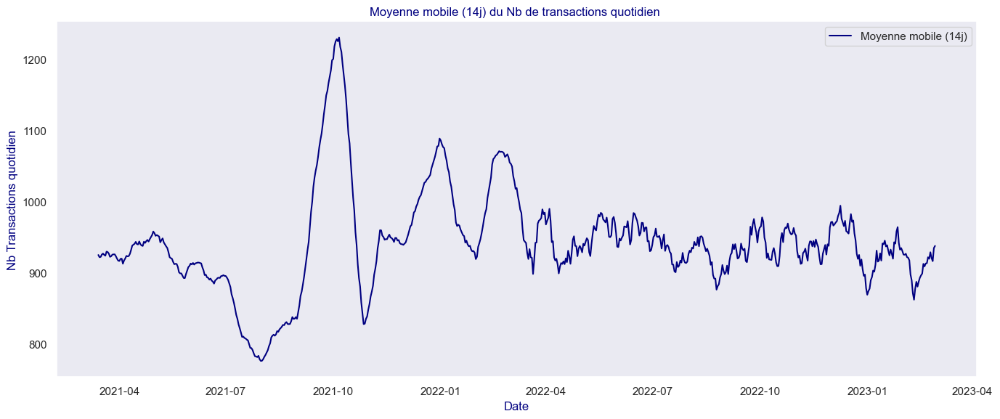

In [826]:
# moyenne mobile sur 14 jours du Nb transactions dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_transactions", 
#             label="Nb Transact quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="tr_moving_avg_14j", 
             label="Moyenne mobile (14j)",
            color='navy')

plt.title("Moyenne mobile (14j) du Nb de transactions quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Transactions quotidien")
plt.legend()
plt.tight_layout()
plt.show()

In [827]:
import matplotlib.dates as mdates

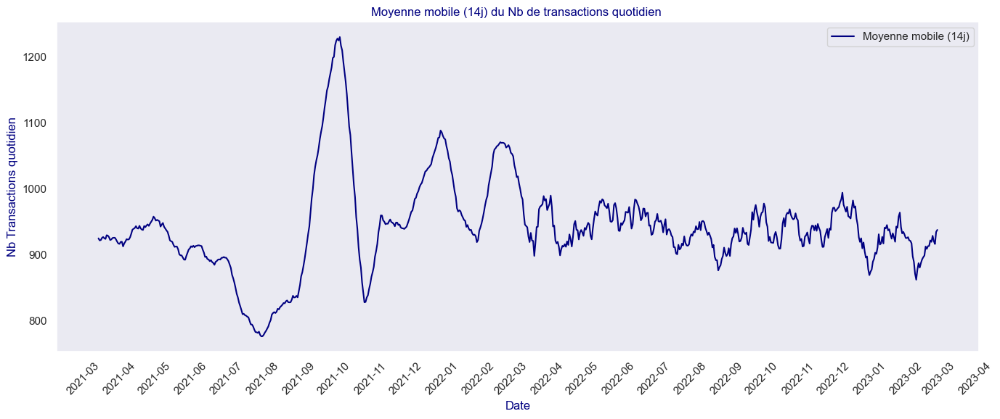

In [828]:
#AVEC AFFICHAGE DE TOUS LES MOIS
# Necessite matplotlib.dates :
#import matplotlib.dates as mdates

# moyenne mobile sur 14 jours du Nb transactions dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_transactions", 
#             label="Nb Transact quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="tr_moving_avg_14j", 
             label="Moyenne mobile (14j)",
            color='navy'
            )

# Définir les ticks de l'axe X par mois
ax = plt.gca()  # Récupère les axes actuels
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Graduation principale : chaque mois
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format affiché : Année-Mois

plt.xticks(rotation=45)
plt.title("Moyenne mobile (14j) du Nb de transactions quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Transactions quotidien")
plt.legend()
plt.tight_layout()
plt.show()

##### <font color=green><u>C. Nbre de transactions mensuelle sur la periode :</u></font>

In [829]:
df_Complet_monthly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01


In [830]:
df_Complet_monthly_par_categ_Grouper.head(2)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01


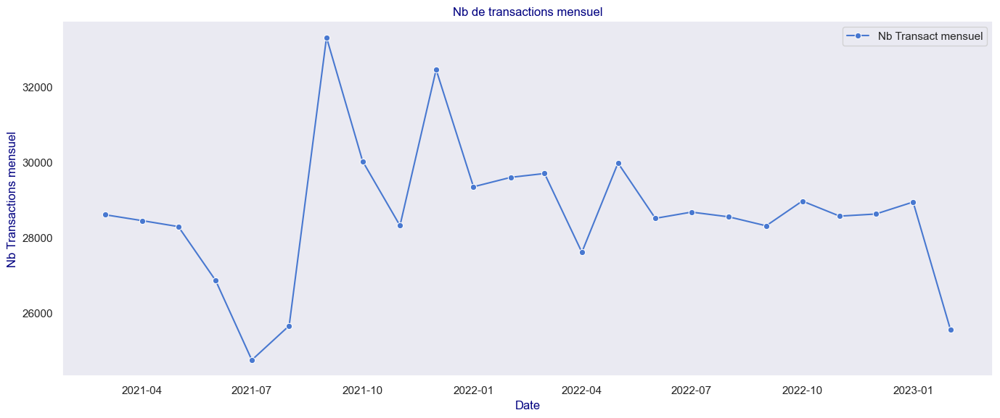

In [831]:
#Nb transactions dans le temps

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_Grouper, 
             x="day01", 
             y="nb_transactions", 
             label="Nb Transact mensuel",
            marker='o')


plt.title("Nb de transactions mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Transactions mensuel")
plt.legend()
plt.tight_layout()
plt.show()

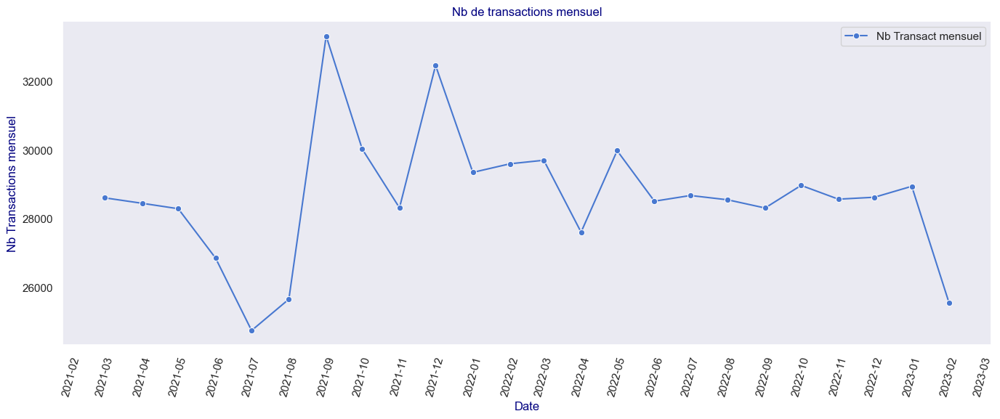

In [832]:
#Nb transactions dans le temps

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_Grouper, 
             x="day01", 
             y="nb_transactions", 
             label="Nb Transact mensuel",
            marker='o')

# Définir les ticks de l'axe X par mois
ax = plt.gca()  # Récupère les axes actuels
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Graduation principale : chaque mois
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format affiché : Année-Mois

plt.xticks(rotation=75)
plt.title("Nb de transactions mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Transactions mensuel")
plt.legend()
plt.tight_layout()
plt.show()

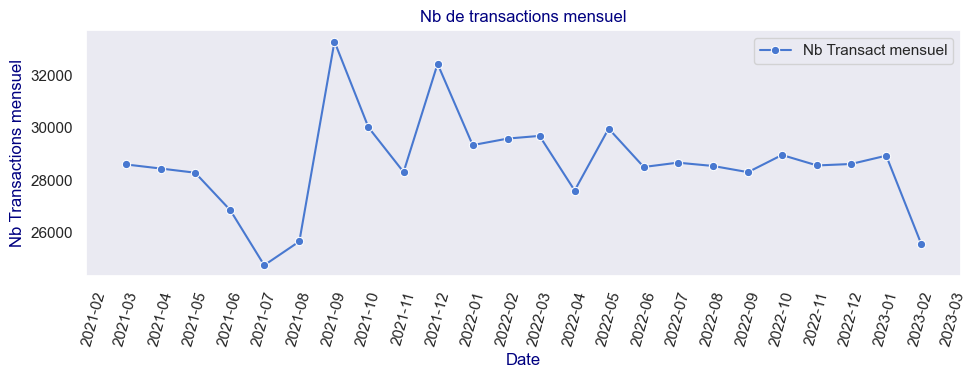

In [833]:
#Nb transactions dans le temps

# Affichage
plt.figure(figsize=(10, 4))

sns.lineplot(data=df_Complet_monthly_Grouper, 
             x="day01", 
             y="nb_transactions", 
             label="Nb Transact mensuel",
            marker='o')

# Définir les ticks de l'axe X par mois
ax = plt.gca()  # Récupère les axes actuels
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Graduation principale : chaque mois
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format affiché : Année-Mois

plt.xticks(rotation=75)
plt.title("Nb de transactions mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Transactions mensuel")
plt.legend()
plt.tight_layout()
plt.show()

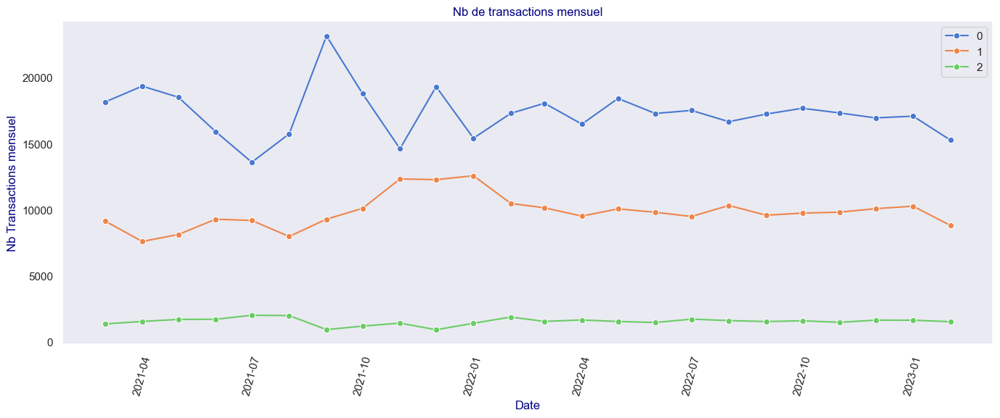

In [834]:
#Nb transactions dans le temps par catégorie

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_par_categ_Grouper, 
             x="day01", 
             y="nb_transactions",
             hue='categ',
             palette = palette_fixe_categ,
             marker='o'
#             label="Nb Transact mensuel"
            )
plt.xticks(rotation=75)
plt.title("Nb de transactions mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Transactions mensuel")
plt.legend()
plt.tight_layout()
plt.show()

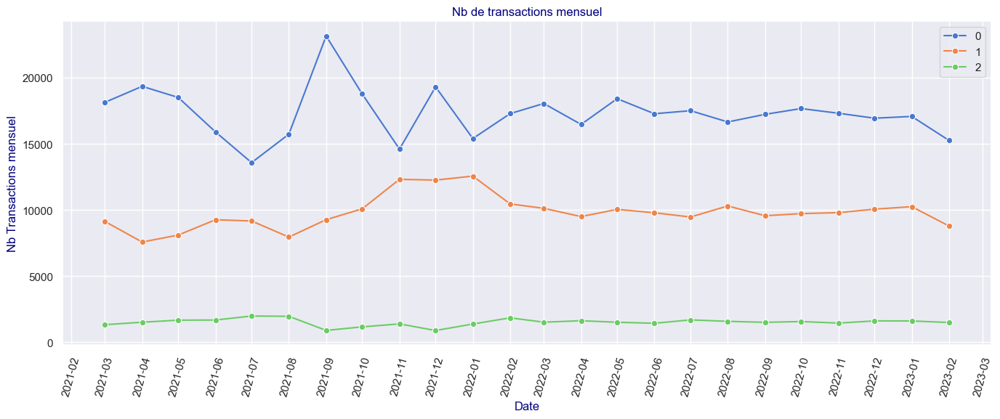

In [835]:
#Nb transactions dans le temps par catégorie

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_par_categ_Grouper, 
             x="day01", 
             y="nb_transactions",
             hue='categ',
             palette = palette_fixe_categ,
             marker='o'
#             label="Nb Transact mensuel"
            )
# Définir les ticks de l'axe X par mois
ax = plt.gca()  # Récupère les axes actuels
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Graduation principale : chaque mois
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format affiché : Année-Mois

plt.xticks(rotation=75)
plt.title("Nb de transactions mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Transactions mensuel")
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

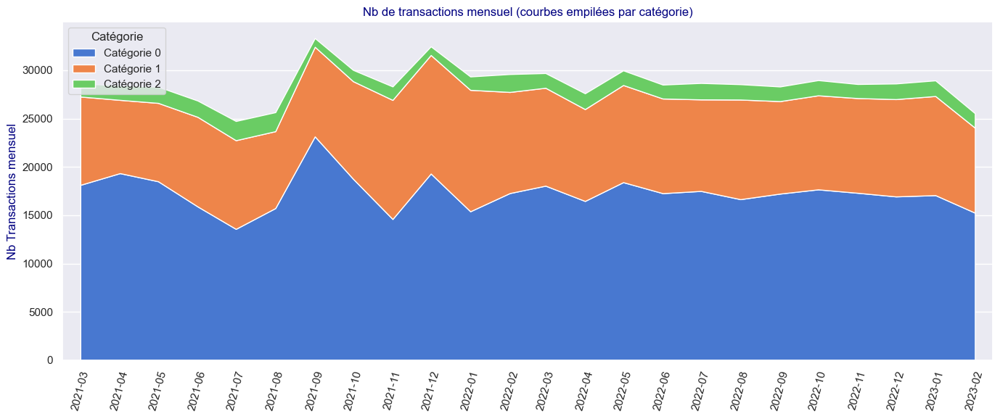

In [836]:
# Préparer les données pour stackplot : pivot avec les dates en index et les catégories en colonnes
df_pivot = df_Complet_monthly_par_categ_Grouper.pivot_table(
    index='day01', 
    columns='categ', 
    values='nb_transactions',
    aggfunc='sum'
).fillna(0).sort_index()

# Création du graphique
plt.figure(figsize=(14, 6))

# Tracer la stackplot
plt.stackplot(df_pivot.index, 
              df_pivot.T.values, 
              labels=[f'Catégorie {c}' for c in df_pivot.columns], 
              colors=[palette_fixe_categ[c] for c in df_pivot.columns])

# Mise en forme de l'axe des dates
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=75)

# Titres et axes
plt.title("Nb de transactions mensuel (courbes empilées par catégorie)")
#plt.xlabel("Date")
plt.ylabel("Nb Transactions mensuel")
plt.legend(title="Catégorie", loc='upper left')
plt.grid(axis='y')
plt.xlim(datetime(2021, 2, 15), datetime(2023, 2, 15))
plt.tight_layout()
plt.show()


In [837]:
df_Complet_monthly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01


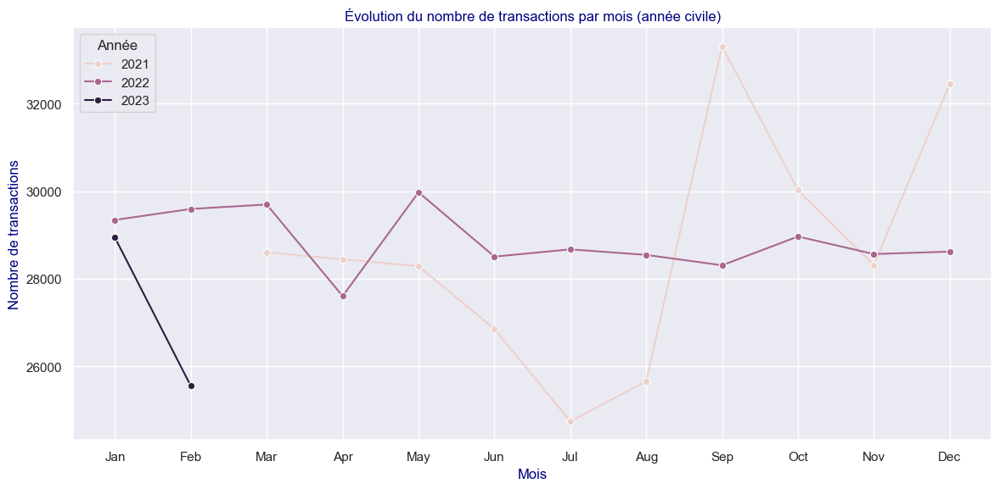

In [838]:
# Trie par ordre chronologique des mois
df_graph = df_Complet_monthly_Grouper.sort_values('mois_num')

# Graphique par année civile
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_graph, x='mois', y='nb_transactions', hue='annee', marker='o')
plt.title("Évolution du nombre de transactions par mois (année civile)")
plt.xlabel("Mois")
plt.ylabel("Nombre de transactions")
plt.legend(title="Année")
plt.grid(True)
plt.tight_layout()
plt.show()

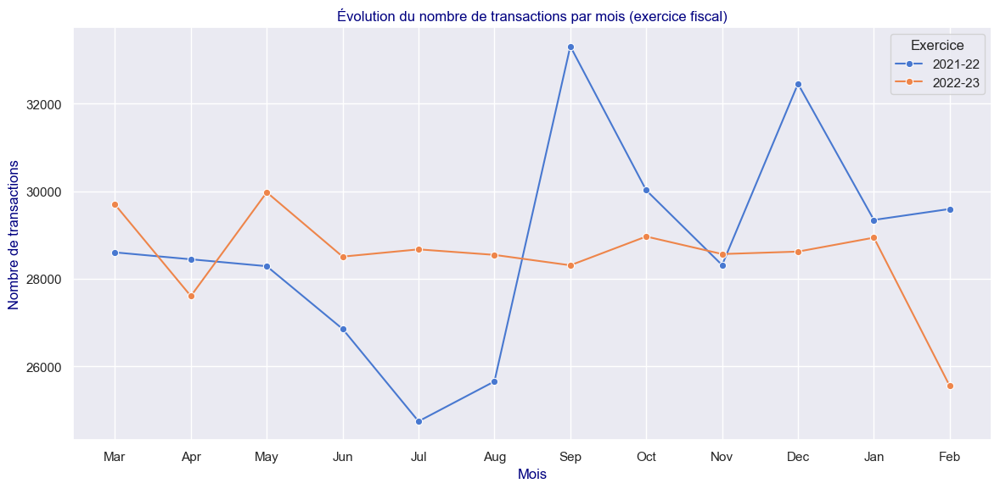

In [839]:
# Affichage par exercice fiscal
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_Grouper, x='mois', y='nb_transactions', hue='exercice', marker='o')
plt.title("Évolution du nombre de transactions par mois (exercice fiscal)")
plt.xlabel("Mois")
plt.ylabel("Nombre de transactions")
plt.legend(title="Exercice")
plt.grid(True)
plt.tight_layout()
plt.show()

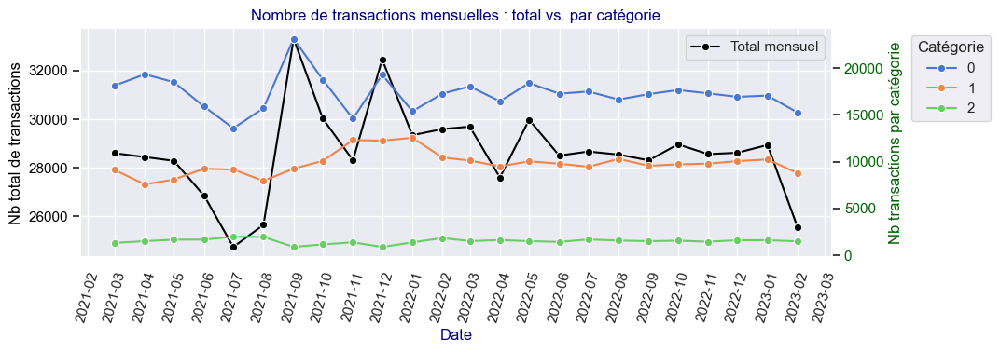

In [840]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# Création de la figure et du premier axe
fig, ax1 = plt.subplots(figsize=(10, 4))

# AXE GAUCHE : Nb total de transactions
sns.lineplot(
    data=df_Complet_monthly_Grouper.reset_index(), 
    x="day01", 
    y="nb_transactions", 
    ax=ax1,
    color="black",
    marker='o',
    label="Total mensuel"
)

ax1.set_ylabel("Nb total de transactions", color="black")
ax1.tick_params(axis='y', labelcolor="black")

# Format des dates
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=75)

# AXE DROIT : Transactions par catégorie
ax2 = ax1.twinx()

sns.lineplot(
    data=df_Complet_monthly_par_categ_Grouper.reset_index(), 
    x="day01", 
    y="nb_transactions", 
    hue="categ", 
    palette=palette_fixe_categ,
    ax=ax2,
    marker='o'
)

ax2.set_ylabel("Nb transactions par catégorie", color="darkgreen")
ax2.tick_params(axis='y', labelcolor="darkgreen")

# TITRE + LÉGENDES
plt.title("Nombre de transactions mensuelles : total vs. par catégorie")
ax1.set_xlabel("Date")
fig.tight_layout()
ax1.grid(True)
ax2.legend(title="Catégorie", bbox_to_anchor=(1.221, 1))  # Légende à droite
plt.show()


##### <font color=green><u>D. Nbre de transactions annuel sur la periode :</u></font>

In [841]:
df_Complet_yearly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,day01
day,,,,,
2022-02-28,345608,3265,8600,2021-22,2021-03-01
2023-02-28,341926,3220,8524,2022-23,2022-03-01


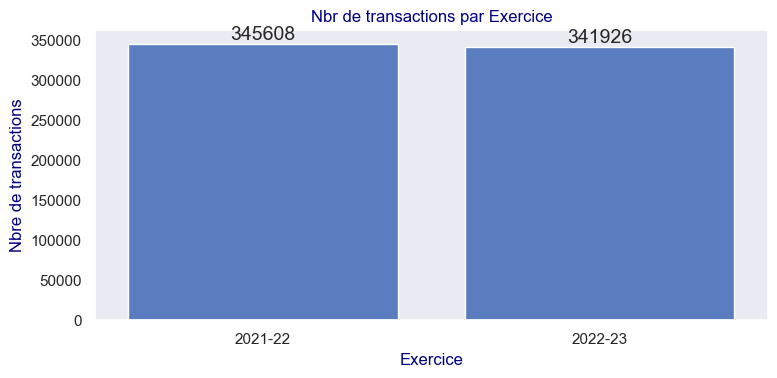

In [842]:
plt.figure(figsize=(8,4)) 
ax = sns.barplot(
    data=df_Complet_yearly_Grouper,
    x="exercice",
    y="nb_transactions")

for x in range(0,1) :
    ax.bar_label(ax.containers[x])
    
plt.title("Nbr de transactions par Exercice")
plt.xlabel("Exercice")
plt.ylabel("Nbre de transactions")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##### <font color=green><u>E. Nbre de transactions mensuelle sur la periode par catégorie :</u></font>

In [843]:
df_Complet_monthly_par_categ_Grouper.head(4)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01
2021-03-31,2,1336,167,843,2021-22,2021,Mar,3,2021-03-01
2021-04-30,0,19342,1731,4373,2021-22,2021,Apr,4,2021-04-01


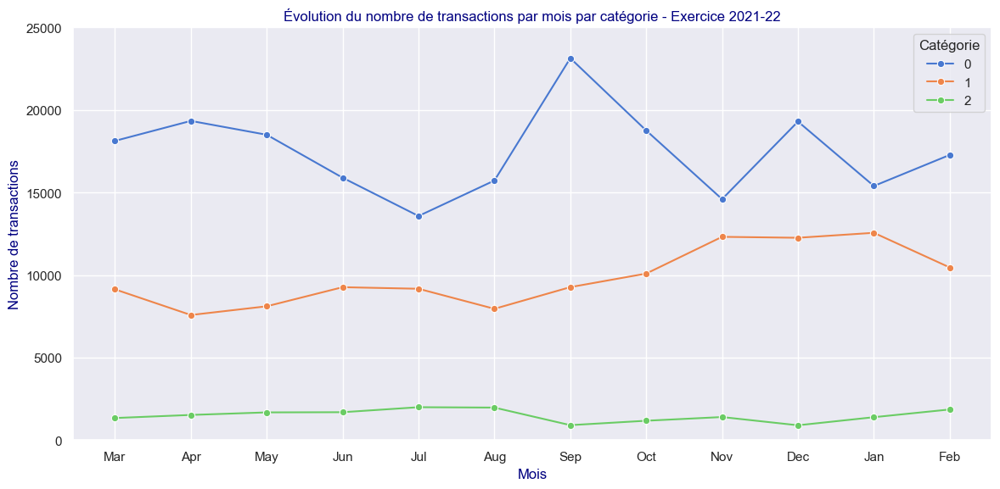

In [844]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_21_22, 
             x='mois', 
             y='nb_transactions', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de transactions par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de transactions")
plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

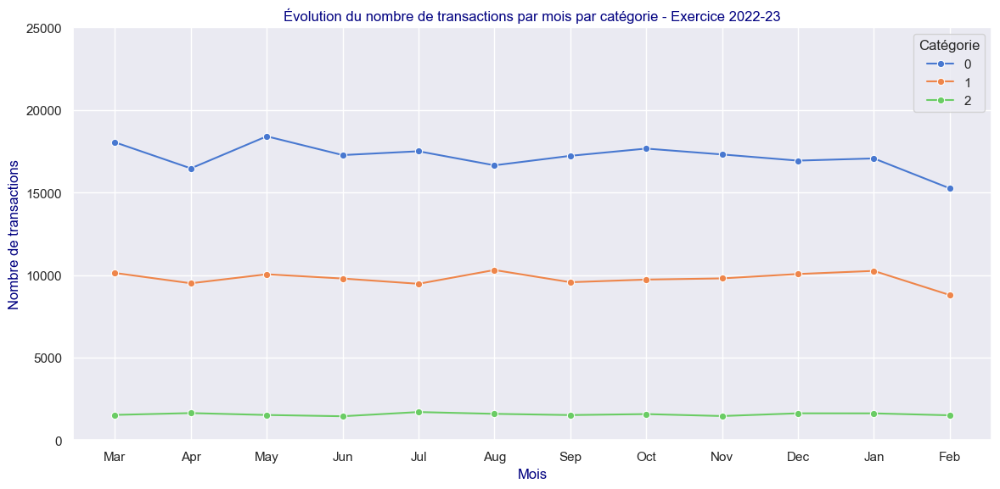

In [845]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23, 
             x='mois', 
             y='nb_transactions', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de transactions par mois par catégorie - Exercice 2022-23")
plt.xlabel("Mois")
plt.ylabel("Nombre de transactions")
plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

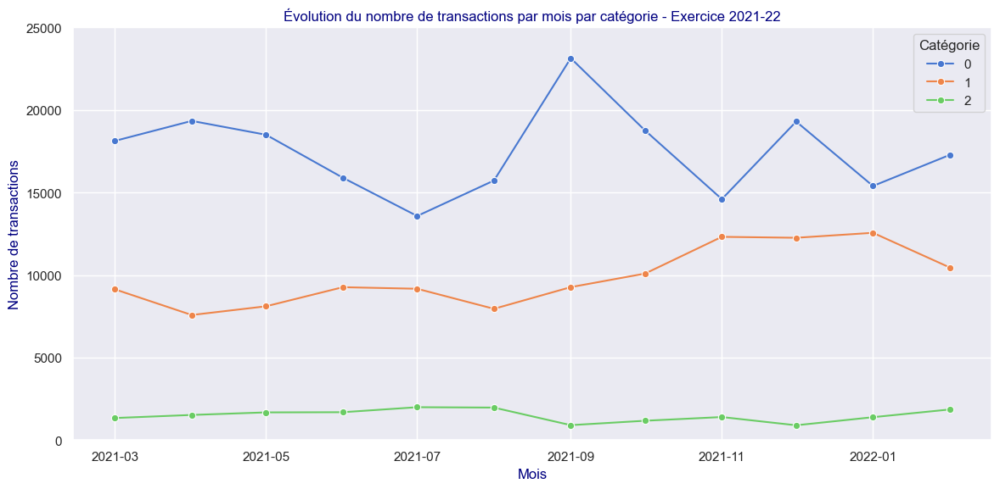

In [846]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_21_22, 
             x='day01', 
             y='nb_transactions', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de transactions par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de transactions")
plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

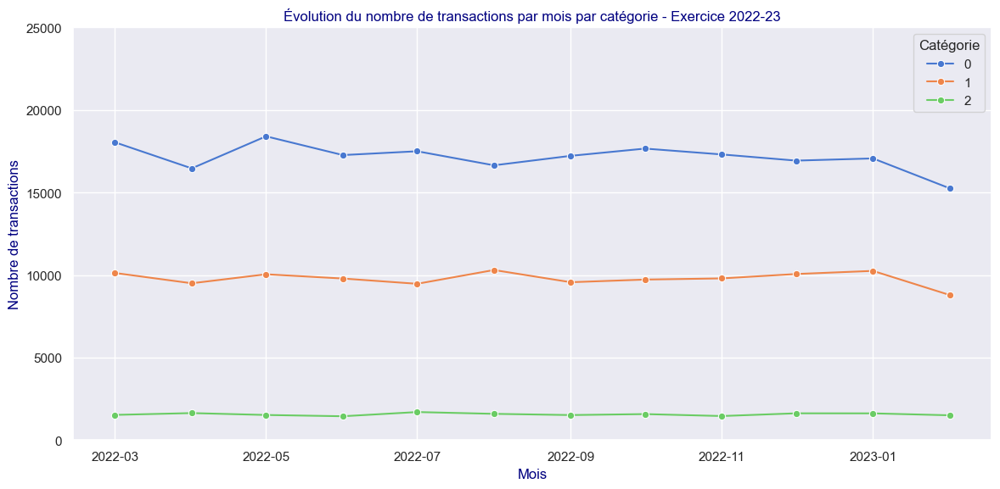

In [847]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23, 
             x='day01', 
             y='nb_transactions', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de transactions par mois par catégorie - Exercice 2022-23")
plt.xlabel("Mois")
plt.ylabel("Nombre de transactions")
plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

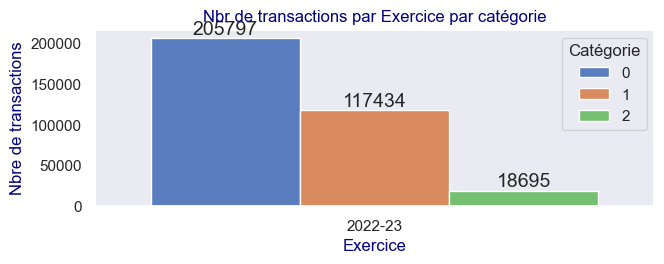

In [848]:
plt.figure(figsize=(8,4)) 
ax = sns.barplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23,
                 x="exercice",
                 y="nb_transactions",
                hue='categ',
                palette = palette_fixe_categ,
                 errorbar=None,
    estimator='sum'
                )

for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x])
    
plt.title("Nbr de transactions par Exercice par catégorie")
plt.xlabel("Exercice")
plt.ylabel("Nbre de transactions")
plt.legend(title="Catégorie")
#plt.xticks(rotation=90)
plt.tight_layout(pad=4) #pad pour gérer la marge
plt.show()

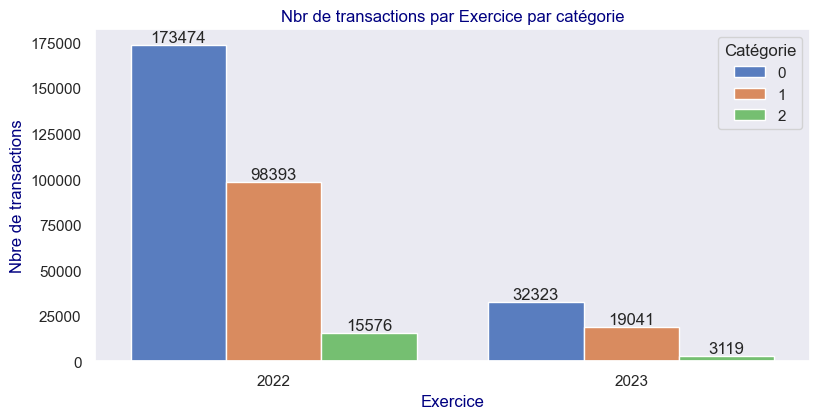

In [849]:
plt.figure(figsize=(8,4)) 

ax=sns.barplot(
    data=df_Complet_monthly_par_categ_Grouper_Ex_22_23,
    x="annee",
    y="nb_transactions",
    hue='categ',
    palette=palette_fixe_categ,
    errorbar=None,
    estimator='sum'
)
for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x],
                 fontsize=12
                 )  
    
plt.title("Nbr de transactions par Exercice par catégorie")
plt.xlabel("Exercice")
plt.ylabel("Nbre de transactions")
plt.legend(title="Catégorie")
#plt.xticks(rotation=90)
#plt.ylim(1_000,17_500)
plt.tight_layout(pad=0) #poru gérer les marges
plt.show()

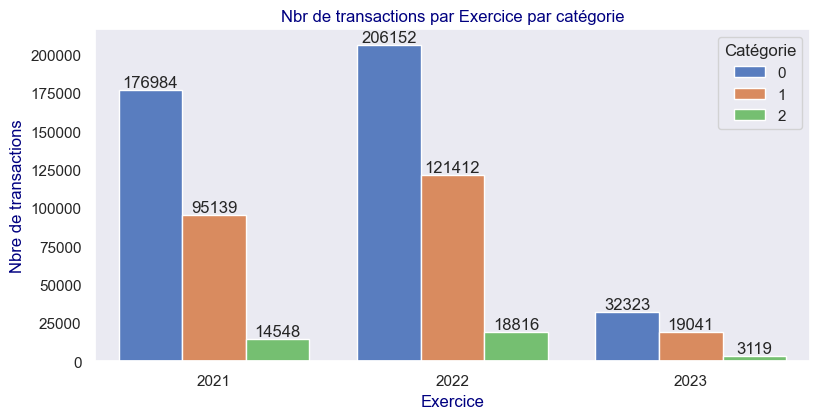

In [850]:
plt.figure(figsize=(8,4)) 

ax=sns.barplot(
    data=df_Complet_monthly_par_categ_Grouper,
    x="annee",
    y="nb_transactions",
    hue='categ',
    palette=palette_fixe_categ,
    errorbar=None,
    estimator='sum'
)
for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x],
                 fontsize=12
                 )  
    
plt.title("Nbr de transactions par Exercice par catégorie")
plt.xlabel("Exercice")
plt.ylabel("Nbre de transactions")
plt.legend(title="Catégorie")
#plt.xticks(rotation=90)
#plt.ylim(1_000,17_500)
plt.tight_layout(pad=0) #poru gérer les marges
plt.show()

In [851]:
df_Complet_monthly_par_categ_Grouper.head(39)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01
2021-03-31,2,1336,167,843,2021-22,2021,Mar,3,2021-03-01
2021-04-30,0,19342,1731,4373,2021-22,2021,Apr,4,2021-04-01
2021-04-30,1,7579,576,3725,2021-22,2021,Apr,4,2021-04-01
2021-04-30,2,1522,185,916,2021-22,2021,Apr,4,2021-04-01
2021-05-31,0,18501,1713,4255,2021-22,2021,May,5,2021-05-01
2021-05-31,1,8107,582,3842,2021-22,2021,May,5,2021-05-01
2021-05-31,2,1677,176,965,2021-22,2021,May,5,2021-05-01


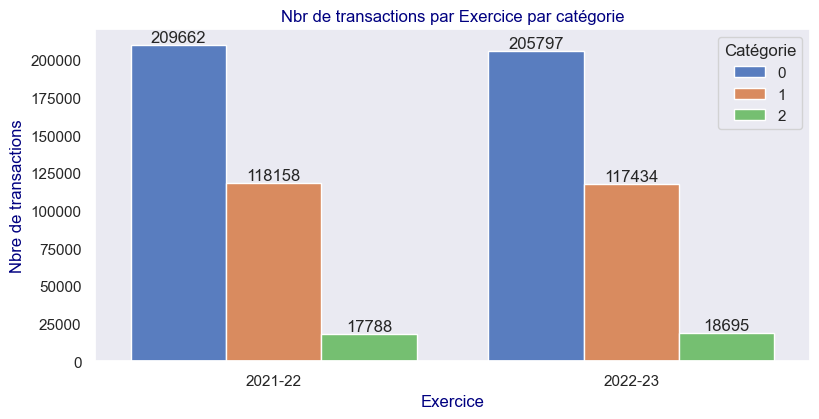

In [852]:
plt.figure(figsize=(8,4)) 

ax=sns.barplot(
    data=df_Complet_monthly_par_categ_Grouper,
    x="exercice",
    y="nb_transactions",
    hue='categ',
    palette=palette_fixe_categ,
    errorbar=None,
    estimator='sum'
)
for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x],
                 fontsize=12
                 )  
    
plt.title("Nbr de transactions par Exercice par catégorie")
plt.xlabel("Exercice")
plt.ylabel("Nbre de transactions")
plt.legend(title="Catégorie")
#plt.xticks(rotation=90)
#plt.ylim(1_000,17_500)
plt.tight_layout(pad=0) #pour gérer les marges
plt.show()

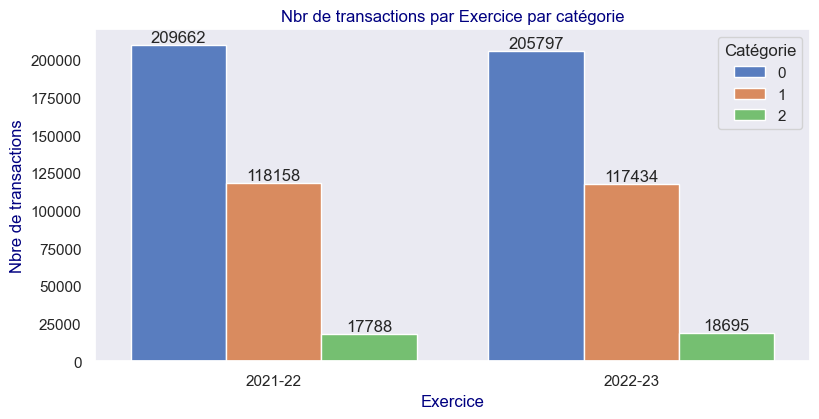

In [853]:
plt.figure(figsize=(8,4)) 

ax=sns.barplot(
    data=df_Complet_yearly_par_categ_Grouper,
    x="exercice",
    y="nb_transactions",
    hue='categ',
    palette=palette_fixe_categ,
    errorbar=None
)
for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x],
                 fontsize=12
                 )  
    
plt.title("Nbr de transactions par Exercice par catégorie")
plt.xlabel("Exercice")
plt.ylabel("Nbre de transactions")
plt.legend(title="Catégorie")
#plt.xticks(rotation=90)
#plt.ylim(1_000,17_500)
plt.tight_layout(pad=0) #pour gérer les marges
plt.show()

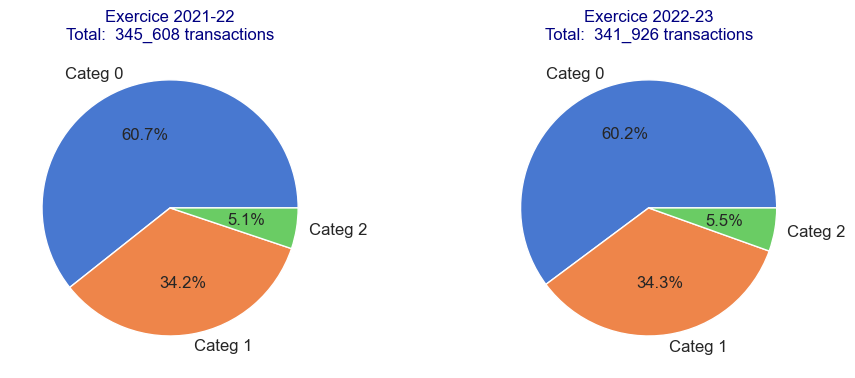

In [854]:
#import matplotlib.pyplot as plt

# Pivot pour avoir une structure adaptée : index = exercice, colonnes = categ, valeurs = nb_transactions
df_pie = df_Complet_yearly_par_categ_Grouper.pivot_table(
    index='exercice',
    columns='categ',
    values='nb_transactions',
    aggfunc='sum'
)

# Création de la figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Pour chaque exercice, tracer un camembert
for ax, (exercice, row) in zip(axes, df_pie.iterrows()):
    # Valeurs et étiquettes
    sizes = row.values
    labels = [f"Categ {cat}" for cat in row.index]
    total = sizes.sum()
    autopct_fmt = lambda p: f'{p:.1f}%' #autre possibilité : autopct_fmt ='%.1f%%'

    # Couleurs à partir du dictionnaire palette
    colors = [palette_fixe_categ[cat] for cat in row.index]

    # Tracer le camembert
    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct=autopct_fmt,
        startangle=0,
        colors=colors,
        textprops={'fontsize': 12}
    )
    # Titre du subplot
    ax.set_title(f"Exercice {exercice}\nTotal: {total: _.0f} transactions", fontsize=12)

# Titre global
#plt.suptitle("Répartition des transactions par catégorie\n(par exercice fiscal)", fontsize=14)
plt.tight_layout()
plt.show()


In [855]:
display (df_pie)

categ,0,1,2
exercice,,,
2021-22,209662,118158,17788
2022-23,205797,117434,18695


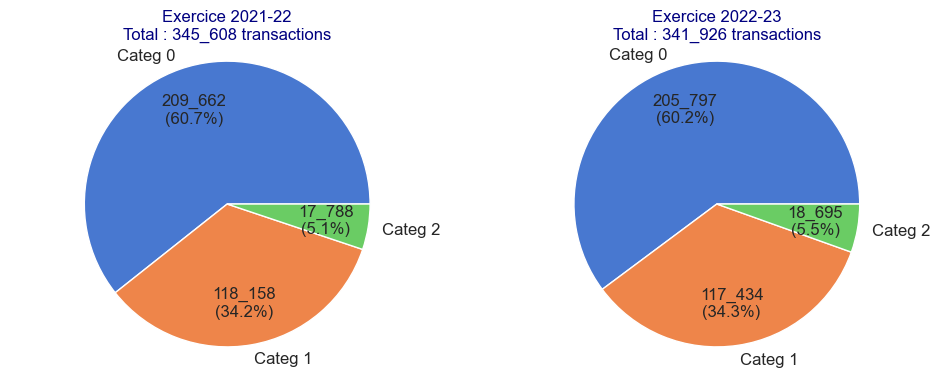

In [856]:
import matplotlib.pyplot as plt

# Pivot pour structure adaptée : lignes = exercice, colonnes = categ, valeurs = nb_transactions
df_pie = df_Complet_yearly_par_categ_Grouper.pivot_table(
    index='exercice',
    columns='categ',
    values='nb_transactions',
    aggfunc='sum'
)

# Fonction pour afficher à la fois nombre et pourcentage
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{val:_.0f}\n({pct:.1f}%)'
    return my_autopct

# Création de la figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Tracer un camembert pour chaque exercice
for ax, (exercice, row) in zip(axes, df_pie.iterrows()):
    sizes = row.values
    labels = [f"Categ {cat}" for cat in row.index]
    total = sizes.sum()

    # Couleurs selon la palette
    colors = [palette_fixe_categ[cat] for cat in row.index]

    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct=make_autopct(sizes),
        startangle=0,
        pctdistance=0.7,
        colors=colors,
        textprops={'fontsize': 12}
    )

    ax.axis('equal')  # Cercle parfait
    ax.set_title(f"Exercice {exercice}\nTotal : {total:_.0f} transactions", fontsize=12)

# Ajustement des marges
plt.tight_layout()
plt.show()


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2b.2 - Nombres de produits vendus :</h4>
</div>

C'est un peu la même chose : le nombre de produit vendus par mois, c'est le nombre de transactions par mois.  
Maintenant on peut aussi regarder le nombre de produits distincts vendus par mois!  
On va toujours utilisé le DataFrame transactions, puisque ce qui nous intéresse est le nomnbre de produit qui a été vendu.

In [857]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


##### <font color=green><u>A. Nbre de produits distincts vendu sur la periode :</u></font>

In [858]:
print("le nombre de produits distincts vendus sur la période de l'étude est de :",
      df_analyse_O1_O2_transactions_1_1['id_prod'].nunique())

le nombre de produits distincts vendus sur la période de l'étude est de : 3265


##### <font color=green><u>B. Nbre de produits distincts (vendu) quotidien sur la periode :</u></font>

In [859]:
df_Complet_daily_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,tr_moving_avg_7j,tr_moving_avg_14j
day,,,,,
2021-03-01,962,646,438,NaN,NaN
2021-03-02,939,637,428,NaN,NaN


In [860]:
df_Complet_daily_Grouper['nb_produits_distincts'].describe()

count    730.000000
mean     621.101370
std       46.665586
min      523.000000
25%      593.000000
50%      617.000000
75%      647.000000
max      781.000000
Name: nb_produits_distincts, dtype: float64

In [861]:
print("La moyenne de produits distincts quotidien vendu est de : ",
      round(df_Complet_daily_Grouper['nb_produits_distincts'].mean(),2),
     "produits distincts")
print("La médiane de produits distincts quotidien vendu est de : ",
      int(df_Complet_daily_Grouper['nb_produits_distincts'].median()),
     "produits distincts")

La moyenne de produits distincts quotidien vendu est de :  621.1 produits distincts
La médiane de produits distincts quotidien vendu est de :  617 produits distincts


In [862]:
df_Complet_daily_Grouper["pr_moving_avg_7j"] = df_Complet_daily_Grouper["nb_produits_distincts"].rolling(window=7).mean()
df_Complet_daily_Grouper["pr_moving_avg_14j"] = df_Complet_daily_Grouper["nb_produits_distincts"].rolling(window=14).mean()
df_Complet_daily_Grouper.head(10)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,tr_moving_avg_7j,tr_moving_avg_14j,pr_moving_avg_7j,pr_moving_avg_14j
day,,,,,,,
2021-03-01,962,646,438,NaN,NaN,NaN,NaN
2021-03-02,939,637,428,NaN,NaN,NaN,NaN
2021-03-03,911,643,395,NaN,NaN,NaN,NaN
2021-03-04,903,616,406,NaN,NaN,NaN,NaN
2021-03-05,943,620,440,NaN,NaN,NaN,NaN
2021-03-06,961,637,422,NaN,NaN,NaN,NaN
2021-03-07,905,606,413,932.000000,NaN,629.285714,NaN
2021-03-08,928,614,425,927.142857,NaN,624.714286,NaN
2021-03-09,952,631,421,929.000000,NaN,623.857143,NaN


##### MOYENNES MOBILES

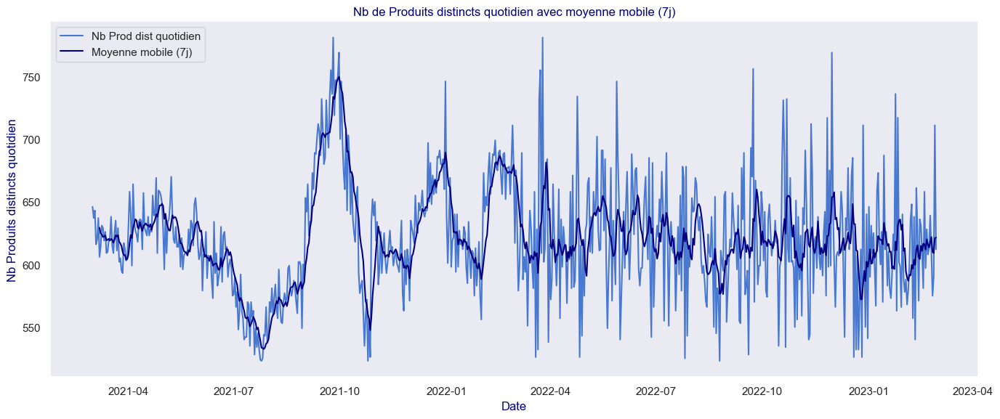

In [863]:
#Nb transactions dans le temps (avec moyenne mobile sur 7 jours)

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="nb_produits_distincts", 
             label="Nb Prod dist quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="pr_moving_avg_7j", 
             label="Moyenne mobile (7j)",
             color="navy")

plt.title("Nb de Produits distincts quotidien avec moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("Nb Produits distincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

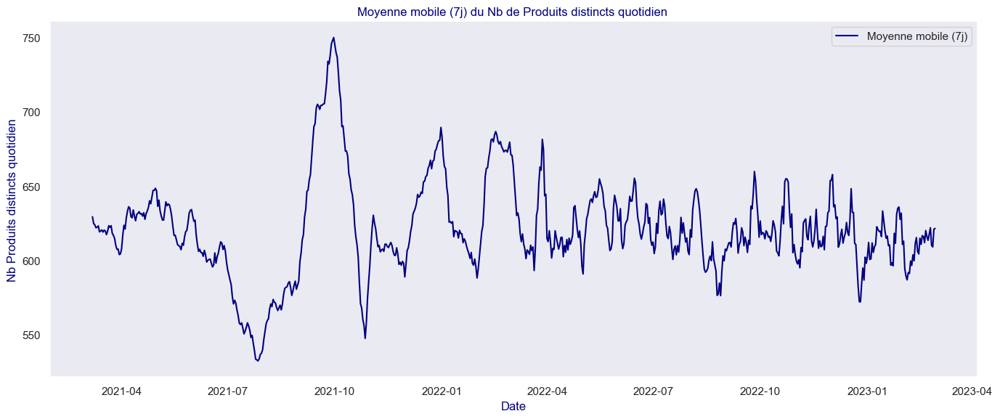

In [864]:
# moyenne mobile sur 7 jours du Nb produits distincts dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_produits_distincts", 
#             label="Nb Prod dist quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="pr_moving_avg_7j", 
             label="Moyenne mobile (7j)",
             color="navy")

plt.title("Moyenne mobile (7j) du Nb de Produits distincts quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Produits distincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

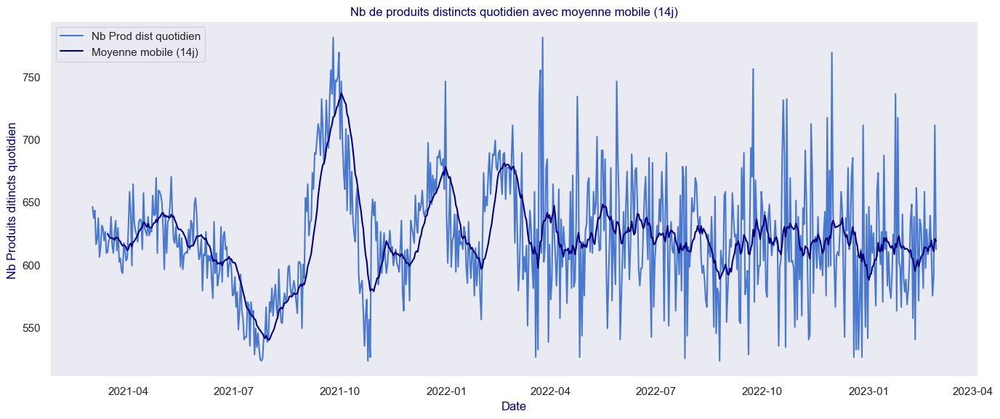

In [865]:
#Nb produits distincts dans le temps (avec moyenne mobile sur 14 jours)

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="nb_produits_distincts", 
             label="Nb Prod dist quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="pr_moving_avg_14j", 
             label="Moyenne mobile (14j)",
             color="navy")

plt.title("Nb de produits distincts quotidien avec moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("Nb Produits ditincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

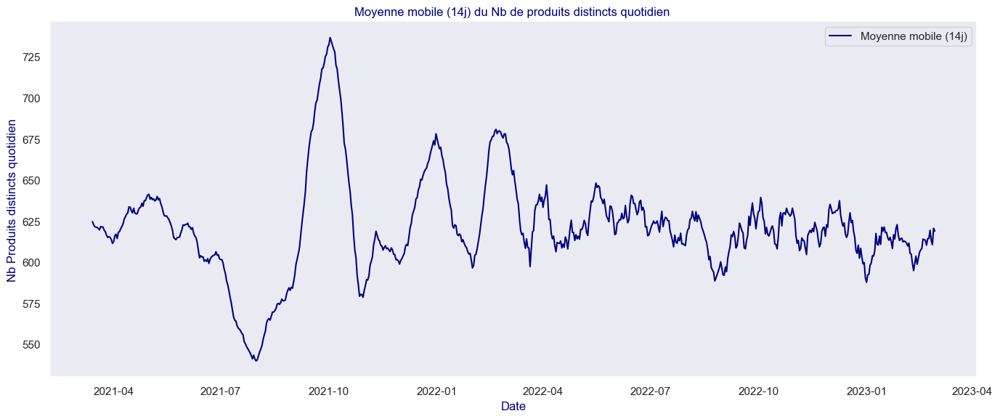

In [866]:
# moyenne mobile sur 14 jours du Nb produits ditincts dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_produits_distincts", 
#             label="Nb Prod distincts quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="pr_moving_avg_14j", 
             label="Moyenne mobile (14j)",
             color="navy")

plt.title("Moyenne mobile (14j) du Nb de produits distincts quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Produits distincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

##### MOYENNES MOBILES

##### <font color=green><u>C. Nbre de Produits distincts mensuel sur la periode :</u></font>

In [867]:
df_Complet_monthly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01


In [868]:
df_Complet_monthly_par_categ_Grouper.head(2)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01


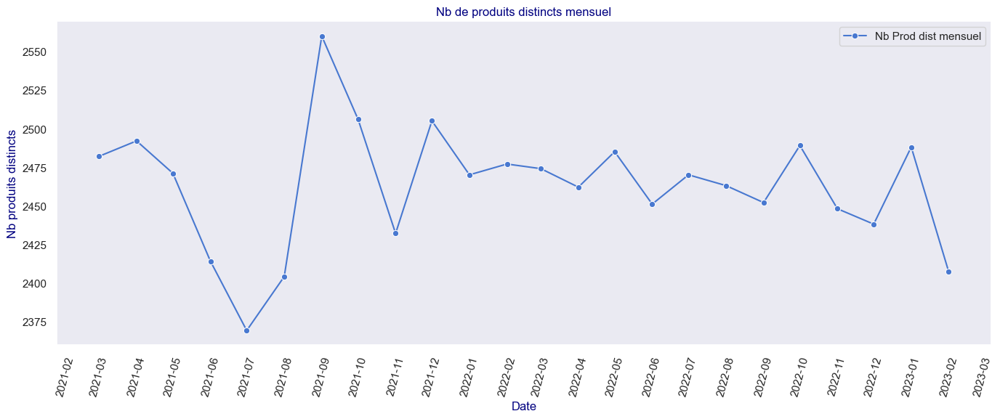

In [869]:
#Nb produits distincts dans le temps

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_Grouper, 
             x="day01", 
             y="nb_produits_distincts", 
             label="Nb Prod dist mensuel",
            marker='o')

# Définir les ticks de l'axe X par mois
ax = plt.gca()  # Récupère les axes actuels
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Graduation principale : chaque mois
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format affiché : Année-Mois

plt.xticks(rotation=75)
plt.title("Nb de produits distincts mensuel")
plt.xlabel("Date")
plt.ylabel("Nb produits distincts")
plt.legend()
plt.tight_layout()
plt.show()

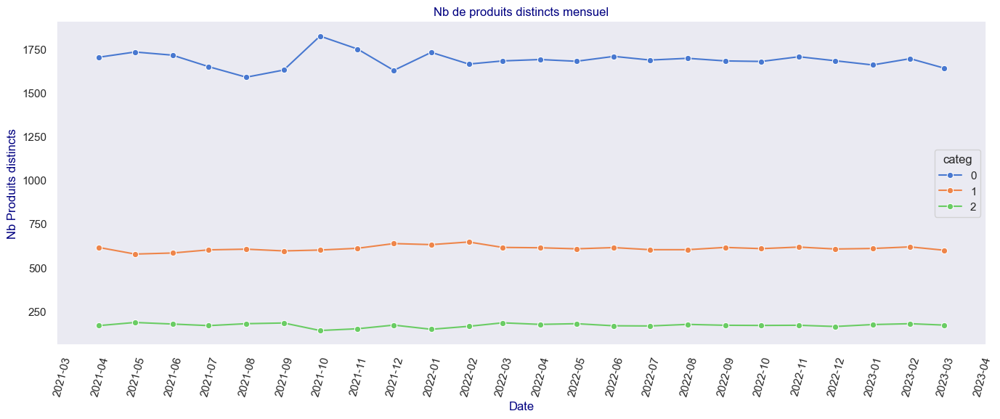

In [870]:
#Nb produits distincts dans le temps par catégorie

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_par_categ_Grouper, 
             x="day", 
             y="nb_produits_distincts",
             hue='categ',
             palette = palette_fixe_categ,
             marker='o'
#             label="Nb Produits distincts mensuel"
            )
# Définir les ticks de l'axe X par mois
ax = plt.gca()  # Récupère les axes actuels
ax.xaxis.set_major_locator(mdates.MonthLocator())  # Graduation principale : chaque mois
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format affiché : Année-Mois


plt.xticks(rotation=75)
plt.title("Nb de produits distincts mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Produits distincts")
#plt.legend("")
plt.tight_layout()
plt.show()

In [871]:
df_Complet_monthly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01


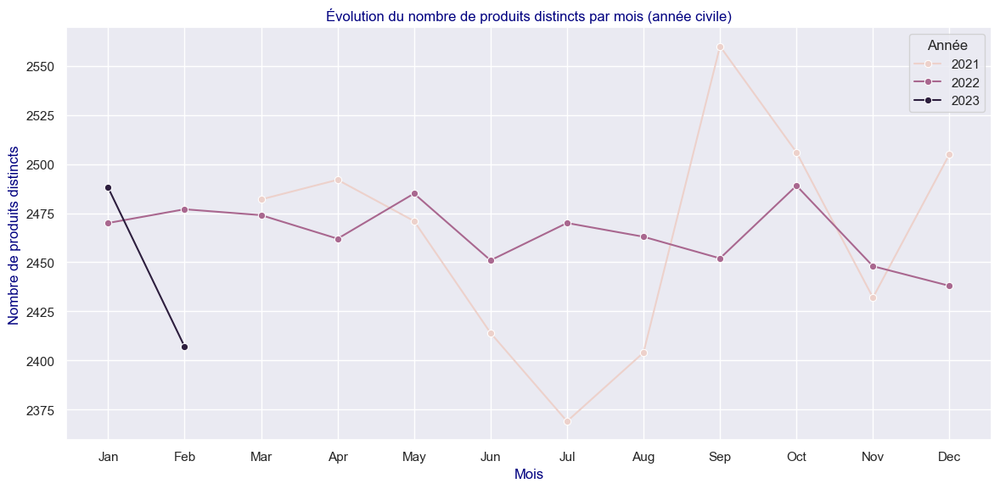

In [872]:
# Trie par ordre chronologique des mois
df_graph = df_Complet_monthly_Grouper.sort_values('mois_num')

# Graphique par année civile
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_graph, x='mois', y='nb_produits_distincts', hue='annee', marker='o')
plt.title("Évolution du nombre de produits distincts par mois (année civile)")
plt.xlabel("Mois")
plt.ylabel("Nombre de produits distincts")
plt.legend(title="Année")
plt.grid(True)
plt.tight_layout()
plt.show()

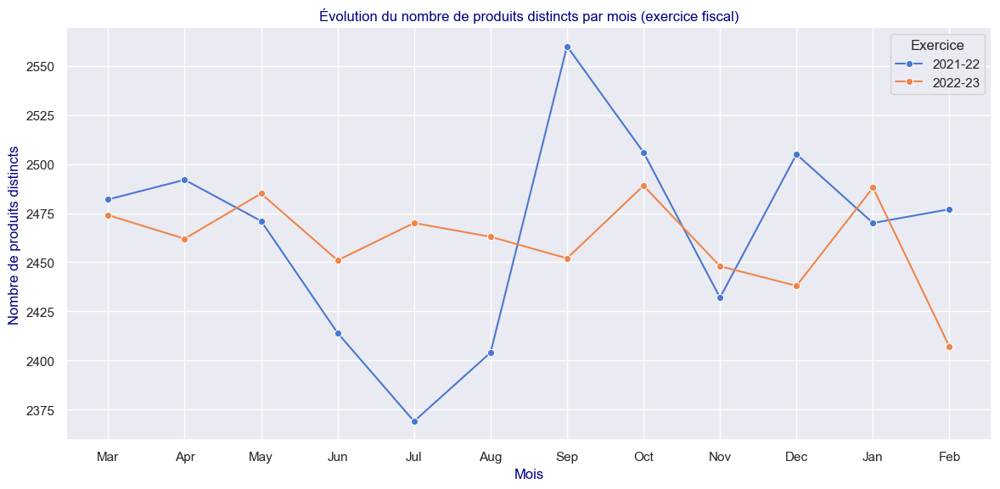

In [873]:
# Affichage par exercice fiscal
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_Grouper, x='mois', y='nb_produits_distincts', hue='exercice', marker='o')
plt.title("Évolution du nombre de produits distincts par mois (exercice fiscal)")
plt.xlabel("Mois")
plt.ylabel("Nombre de produits distincts")
plt.legend(title="Exercice")
plt.grid(True)
plt.tight_layout()
plt.show()

##### <font color=green><u>D. Nbre de produits distincts annuel sur la periode :</u></font>

In [874]:
df_Complet_yearly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,day01
day,,,,,
2022-02-28,345608,3265,8600,2021-22,2021-03-01
2023-02-28,341926,3220,8524,2022-23,2022-03-01


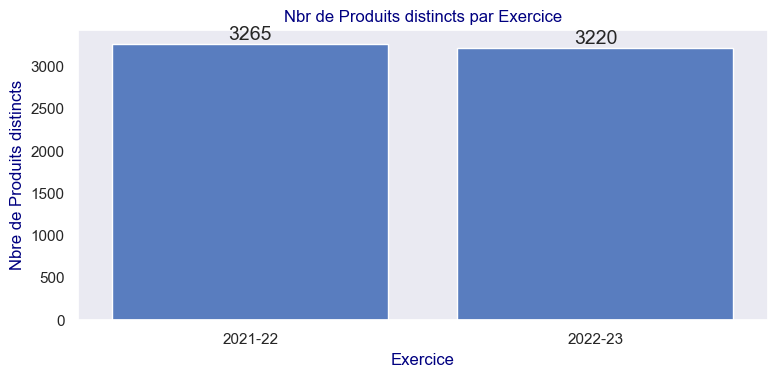

In [875]:
plt.figure(figsize=(8,4)) 
ax = sns.barplot(
    data=df_Complet_yearly_Grouper,
    x="exercice",
    y="nb_produits_distincts")

for x in range(0,1) :
    ax.bar_label(ax.containers[x])
    
plt.title("Nbr de Produits distincts par Exercice")
plt.xlabel("Exercice")
plt.ylabel("Nbre de Produits distincts")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##### <font color=green><u>E. Nbre de produits distincts mensuel sur la periode par catégorie :</u></font>

In [876]:
df_Complet_monthly_par_categ_Grouper.head(4)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01
2021-03-31,2,1336,167,843,2021-22,2021,Mar,3,2021-03-01
2021-04-30,0,19342,1731,4373,2021-22,2021,Apr,4,2021-04-01


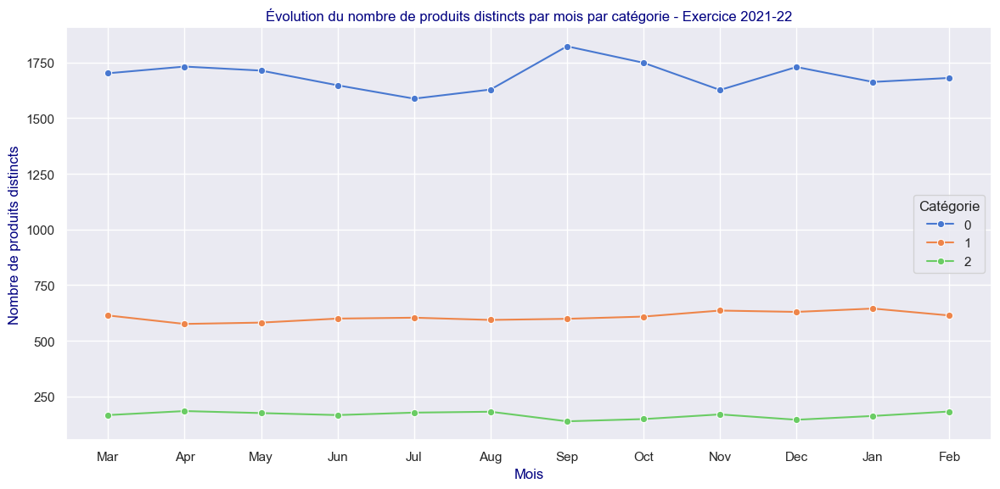

In [877]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_21_22, 
             x='mois', 
             y='nb_produits_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de produits distincts par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de produits distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

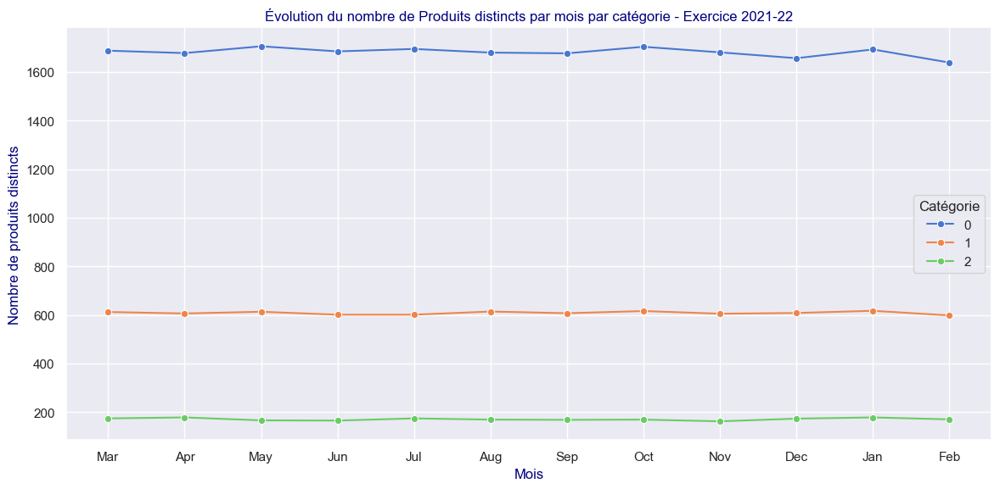

In [878]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23, 
             x='mois', 
             y='nb_produits_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de Produits distincts par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de produits distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

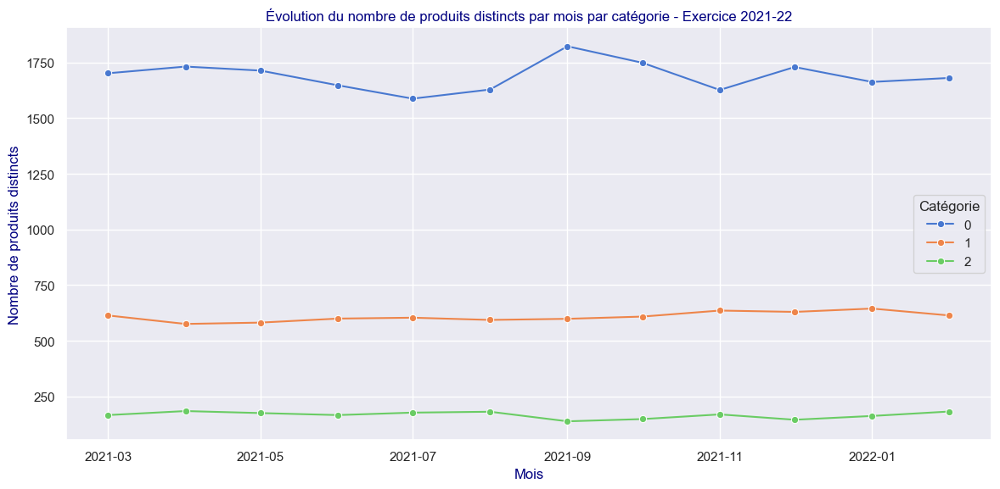

In [879]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_21_22, 
             x='day01', 
             y='nb_produits_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de produits distincts par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de produits distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

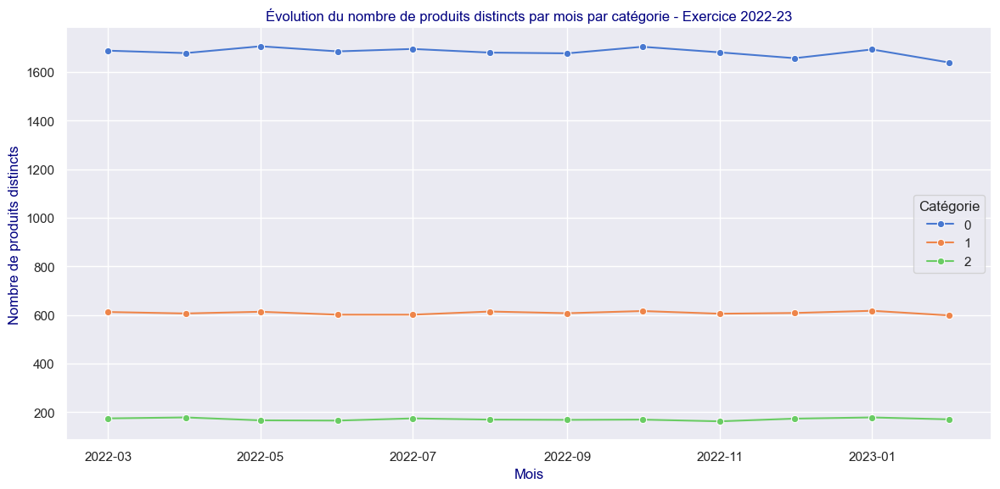

In [880]:
# Graphique par catégorie Exercice 2022-23
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23, 
             x='day01', 
             y='nb_produits_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de produits distincts par mois par catégorie - Exercice 2022-23")
plt.xlabel("Mois")
plt.ylabel("Nombre de produits distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

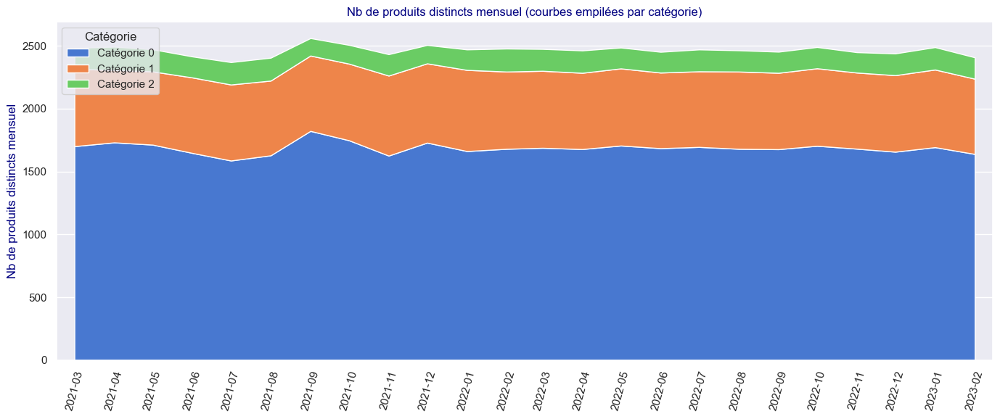

In [881]:
# Préparer les données pour stackplot : pivot avec les dates en index et les catégories en colonnes
df_pivot = df_Complet_monthly_par_categ_Grouper.pivot_table(
    index='day01', 
    columns='categ', 
    values='nb_produits_distincts',
    aggfunc='sum'
).fillna(0).sort_index()

# Création du graphique
plt.figure(figsize=(14, 6))

# Tracer la stackplot
plt.stackplot(df_pivot.index, 
              df_pivot.T.values, 
              labels=[f'Catégorie {c}' for c in df_pivot.columns], 
              colors=[palette_fixe_categ[c] for c in df_pivot.columns])

# Mise en forme de l'axe des dates
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=75)

# Titres et axes
plt.title("Nb de produits distincts mensuel (courbes empilées par catégorie)")
#plt.xlabel("Date")
plt.ylabel("Nb de produits distincts mensuel")
plt.legend(title="Catégorie", loc='upper left')
plt.grid(axis='y')
plt.xlim(datetime(2021, 2, 15), datetime(2023, 2, 15))
plt.tight_layout()
plt.show()


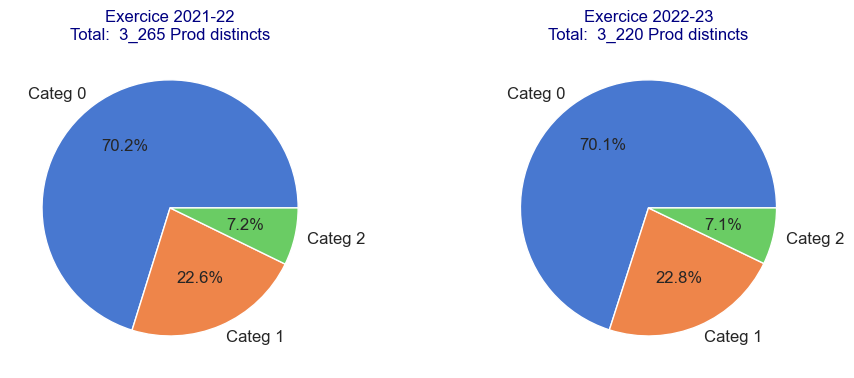

In [882]:
#import matplotlib.pyplot as plt

# Pivot pour avoir une structure adaptée : index = exercice, colonnes = categ, valeurs = nb_produits_distincts
df_pie = df_Complet_yearly_par_categ_Grouper.pivot_table(
    index='exercice',
    columns='categ',
    values='nb_produits_distincts',
    aggfunc='sum'
)

# Création de la figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Pour chaque exercice, tracer un camembert
for ax, (exercice, row) in zip(axes, df_pie.iterrows()):
    # Valeurs et étiquettes
    sizes = row.values
    labels = [f"Categ {cat}" for cat in row.index]
    total = sizes.sum()
    autopct_fmt = lambda p: f'{p:.1f}%' #autre possibilité : autopct_fmt ='%.1f%%'

    # Couleurs à partir du dictionnaire palette
    colors = [palette_fixe_categ[cat] for cat in row.index]

    # Tracer le camembert
    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct=autopct_fmt,
        startangle=0,
        colors=colors,
        textprops={'fontsize': 12}
    )
    # Titre du subplot
    ax.set_title(f"Exercice {exercice}\nTotal: {total: _.0f} Prod distincts", fontsize=12)

# Titre global
#plt.suptitle("Répartition des Produtis dsitincts par catégorie\n(par exercice fiscal)", fontsize=14)
plt.tight_layout()
plt.show()


In [883]:
display (df_pie)

categ,0,1,2
exercice,,,
2021-22,2292,737,236
2022-23,2256,734,230


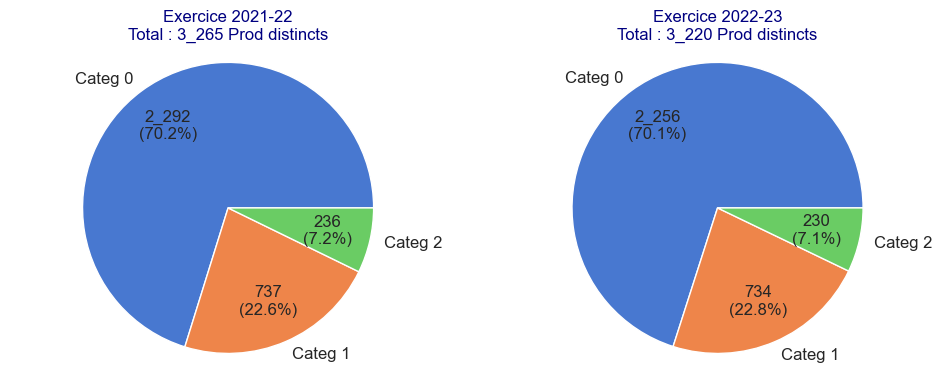

In [884]:
import matplotlib.pyplot as plt

# Pivot pour structure adaptée : lignes = exercice, colonnes = categ, valeurs = nb_produits_distincts
df_pie = df_Complet_yearly_par_categ_Grouper.pivot_table(
    index='exercice',
    columns='categ',
    values='nb_produits_distincts',
    aggfunc='sum'
)

# Fonction pour afficher à la fois nombre et pourcentage
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{val:_.0f}\n({pct:.1f}%)'
    return my_autopct

# Création de la figure
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Tracer un camembert pour chaque exercice
for ax, (exercice, row) in zip(axes, df_pie.iterrows()):
    sizes = row.values
    labels = [f"Categ {cat}" for cat in row.index]
    total = sizes.sum()

    # Couleurs selon la palette
    colors = [palette_fixe_categ[cat] for cat in row.index]

    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct=make_autopct(sizes),
        startangle=0,
        pctdistance=0.7,
        colors=colors,
        textprops={'fontsize': 12}
    )

    ax.axis('equal')  # Cercle parfait
    ax.set_title(f"Exercice {exercice}\nTotal : {total:_.0f} Prod distincts", fontsize=12)

# Ajustement des marges
plt.tight_layout()
plt.show()


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2b.3 - Nombres de clients par mois :</h4>
</div>

In [885]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


##### <font color=green><u>A. Nbre de clients distincts sur la periode :</u></font>

In [886]:
print("le nombre de produits distincts vendus sur la période de l'étude est de :",
      df_analyse_O1_O2_transactions_1_1['client_id'].nunique())

le nombre de produits distincts vendus sur la période de l'étude est de : 8600


##### <font color=green><u>B. Nbre de clients distincts quotidien sur la periode :</u></font>

In [887]:
df_Complet_daily_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,tr_moving_avg_7j,tr_moving_avg_14j,pr_moving_avg_7j,pr_moving_avg_14j
day,,,,,,,
2021-03-01,962,646,438,NaN,NaN,NaN,NaN
2021-03-02,939,637,428,NaN,NaN,NaN,NaN


In [888]:
df_Complet_daily_Grouper['nb_clients_distincts'].describe()

count    730.000000
mean     429.608219
std       26.791015
min      369.000000
25%      410.000000
50%      428.000000
75%      446.000000
max      545.000000
Name: nb_clients_distincts, dtype: float64

In [889]:
print("La moyenne de clients distincts quotidien est de : ",
      round(df_Complet_daily_Grouper['nb_clients_distincts'].mean(),2),
     "clients")
print("La médiane de clients distincts quotidien est de : ",
      int(df_Complet_daily_Grouper['nb_clients_distincts'].median()),
     "clients")

La moyenne de clients distincts quotidien est de :  429.61 clients
La médiane de clients distincts quotidien est de :  428 clients


In [890]:
df_Complet_daily_Grouper["cl_moving_avg_7j"] = df_Complet_daily_Grouper["nb_clients_distincts"].rolling(window=7).mean()
df_Complet_daily_Grouper["cl_moving_avg_14j"] = df_Complet_daily_Grouper["nb_clients_distincts"].rolling(window=14).mean()
df_Complet_daily_Grouper.head(10)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,tr_moving_avg_7j,tr_moving_avg_14j,pr_moving_avg_7j,pr_moving_avg_14j,cl_moving_avg_7j,cl_moving_avg_14j
day,,,,,,,,,
2021-03-01,962,646,438,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-02,939,637,428,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-03,911,643,395,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-04,903,616,406,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-05,943,620,440,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-06,961,637,422,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-07,905,606,413,932.000000,NaN,629.285714,NaN,420.285714,NaN
2021-03-08,928,614,425,927.142857,NaN,624.714286,NaN,418.428571,NaN
2021-03-09,952,631,421,929.000000,NaN,623.857143,NaN,417.428571,NaN


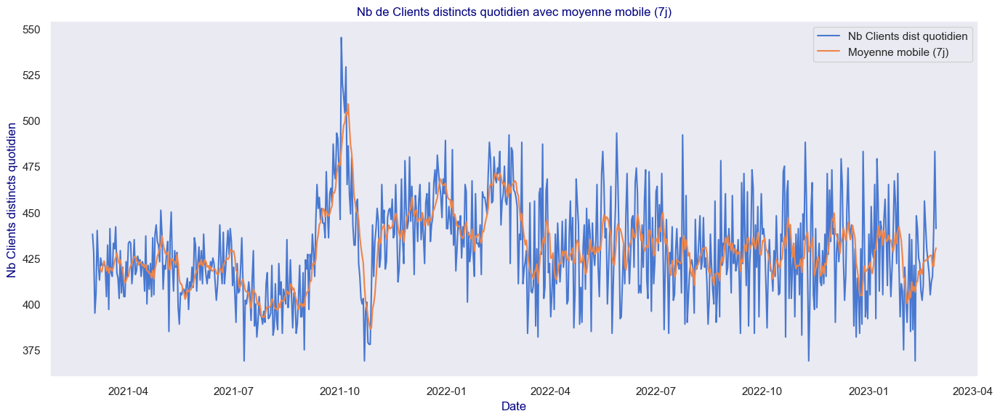

In [891]:
#Nb de Clients distincts quotidien dans le temps (avec moyenne mobile sur 7 jours)

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="nb_clients_distincts", 
             label="Nb Clients dist quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="cl_moving_avg_7j", 
             label="Moyenne mobile (7j)")

plt.title("Nb de Clients distincts quotidien avec moyenne mobile (7j)")
plt.xlabel("Date")
plt.ylabel("Nb Clients distincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

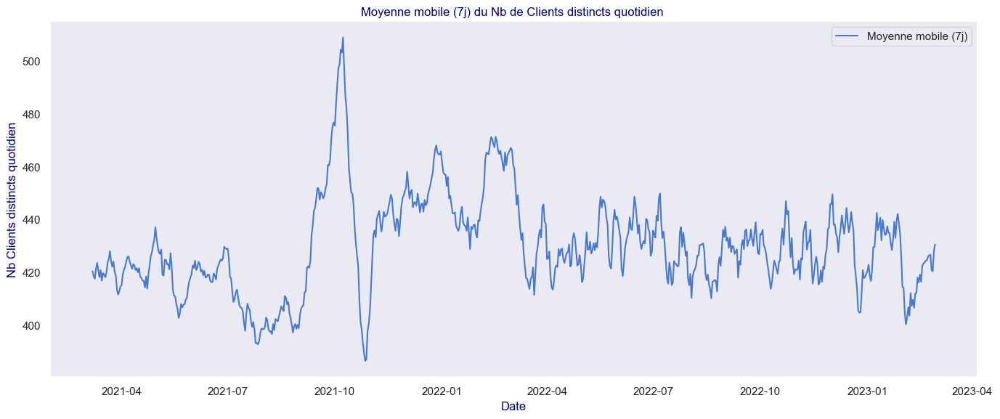

In [892]:
# moyenne mobile sur 7 jours du Nb Clients distincts dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_clients_distincts", 
#             label="Nb Clients dist quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="cl_moving_avg_7j", 
             label="Moyenne mobile (7j)")

plt.title("Moyenne mobile (7j) du Nb de Clients distincts quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Clients distincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

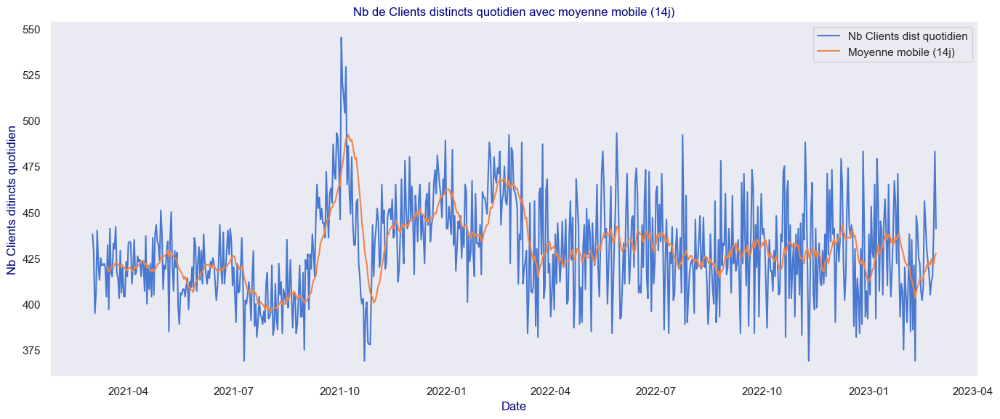

In [893]:
#Nb clients distincts dans le temps (avec moyenne mobile sur 14 jours)

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="nb_clients_distincts", 
             label="Nb Clients dist quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="cl_moving_avg_14j", 
             label="Moyenne mobile (14j)")

plt.title("Nb de Clients distincts quotidien avec moyenne mobile (14j)")
plt.xlabel("Date")
plt.ylabel("Nb Clients ditincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

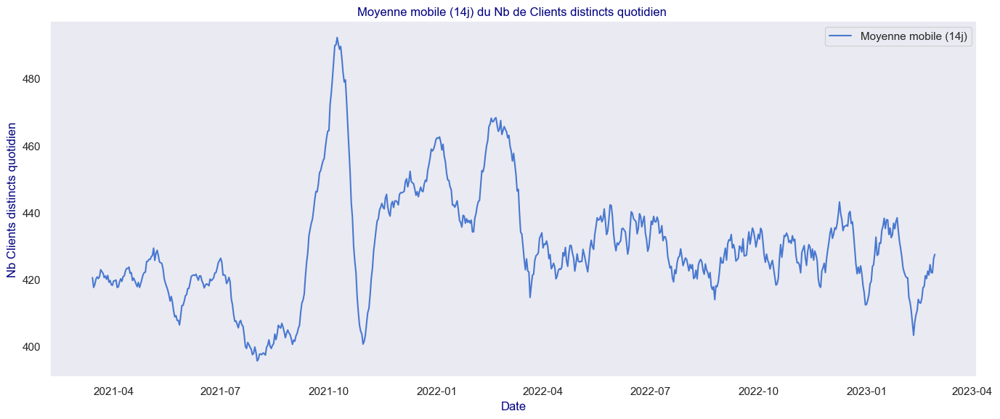

In [894]:
# moyenne mobile sur 14 jours du Nb Clients ditincts dans le temps

# Affichage
plt.figure(figsize=(14, 6))

#sns.lineplot(data=df_Complet_daily_Grouper, 
#             x="day", 
#             y="nb_clients_distincts", 
#             label="Nb Clients distincts quotidien")

sns.lineplot(data=df_Complet_daily_Grouper, 
             x="day", 
             y="cl_moving_avg_14j", 
             label="Moyenne mobile (14j)")

plt.title("Moyenne mobile (14j) du Nb de Clients distincts quotidien ")
plt.xlabel("Date")
plt.ylabel("Nb Clients distincts quotidien")
plt.legend()
plt.tight_layout()
plt.show()

##### <font color=green><u>C. Nbre de Clients distincts mensuel sur la periode :</u></font>

In [895]:
df_Complet_monthly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01


In [896]:
df_Complet_monthly_par_categ_Grouper.head(2)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01


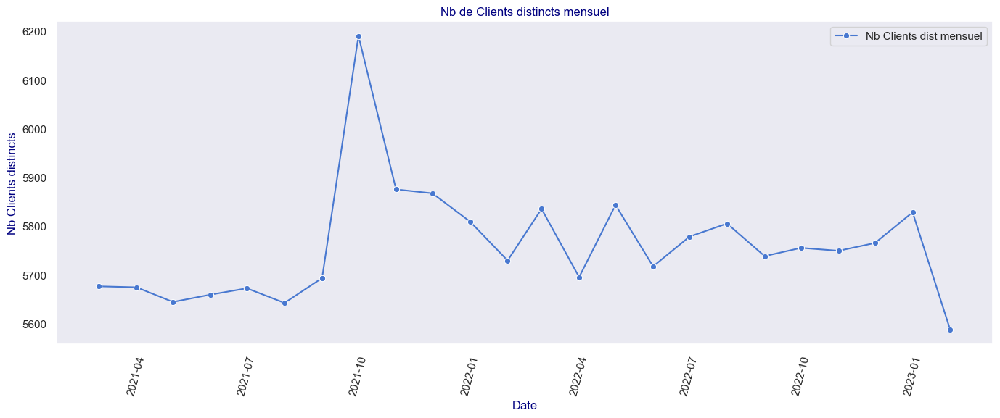

In [897]:
#Nb Clients distincts dans le temps

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_Grouper, 
             x="day01", 
             y="nb_clients_distincts", 
             label="Nb Clients dist mensuel",
            marker='o')

plt.xticks(rotation=75)
plt.title("Nb de Clients distincts mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Clients distincts")
plt.legend()
plt.tight_layout()
plt.show()

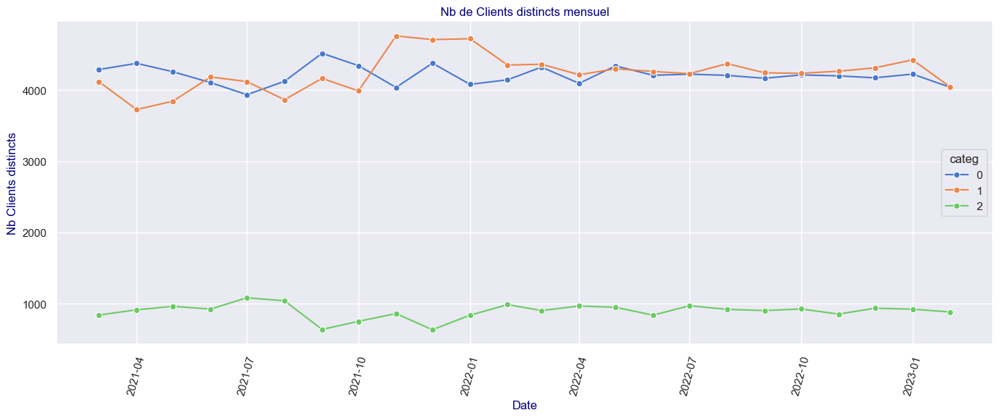

In [898]:
#Nb Clients distincts dans le temps par catégorie

# Affichage
plt.figure(figsize=(14, 6))

sns.lineplot(data=df_Complet_monthly_par_categ_Grouper, 
             x="day01", 
             y="nb_clients_distincts",
             hue='categ',
             palette = palette_fixe_categ,
             marker='o'
#             label="Nb Clients distincts mensuel"
            )

plt.xticks(rotation =75)
plt.title("Nb de Clients distincts mensuel")
plt.xlabel("Date")
plt.ylabel("Nb Clients distincts")
#plt.legend("")
plt.tight_layout()
plt.grid()
plt.show()

In [899]:
df_Complet_monthly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,
2021-03-31,28601,2482,5676,2021-22,2021,Mar,3,2021-03-01
2021-04-30,28443,2492,5674,2021-22,2021,Apr,4,2021-04-01


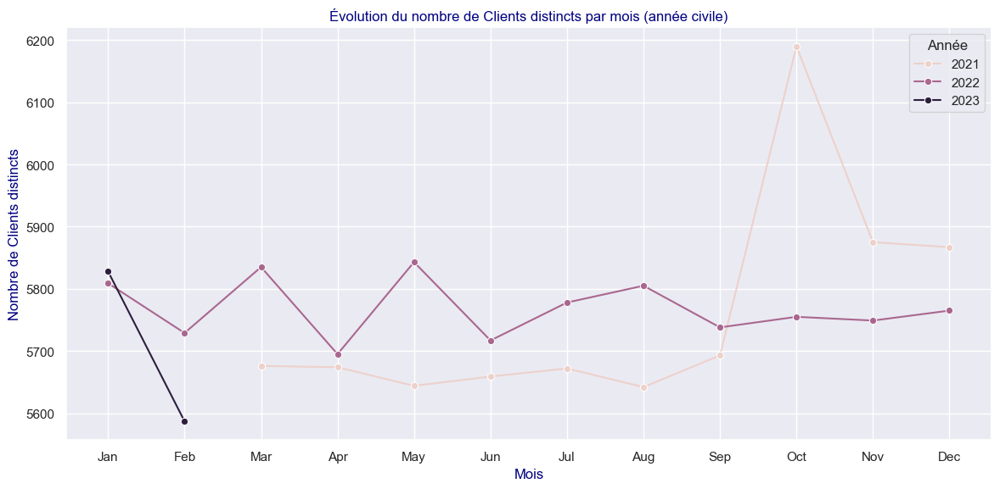

In [900]:
# Trie par ordre chronologique des mois
df_graph = df_Complet_monthly_Grouper.sort_values('mois_num')

# Graphique par année civile
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_graph, x='mois', y='nb_clients_distincts', hue='annee', marker='o')
plt.title("Évolution du nombre de Clients distincts par mois (année civile)")
plt.xlabel("Mois")
plt.ylabel("Nombre de Clients distincts")
plt.legend(title="Année")
plt.grid(True)
plt.tight_layout()
plt.show()

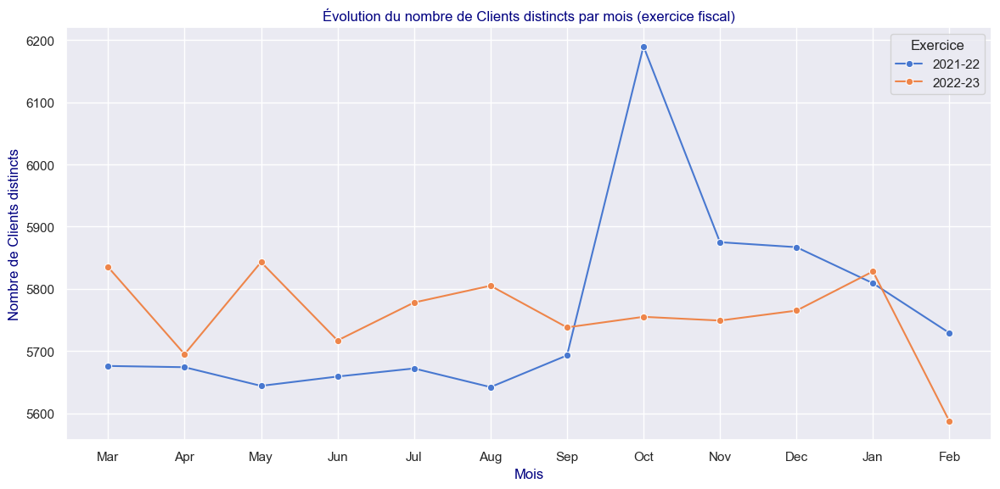

In [901]:
# Affichage par exercice fiscal
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_Grouper, x='mois', y='nb_clients_distincts', hue='exercice', marker='o')
plt.title("Évolution du nombre de Clients distincts par mois (exercice fiscal)")
plt.xlabel("Mois")
plt.ylabel("Nombre de Clients distincts")
plt.legend(title="Exercice")
plt.grid(True)
plt.tight_layout()
plt.show()

##### **OBSERVATION :**  
Pic de client en 10/2021

##### <font color=green><u>D. Nbre de Clients distincts annuel sur la periode :</u></font>

In [902]:
df_Complet_yearly_Grouper.head(2)

,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,day01
day,,,,,
2022-02-28,345608,3265,8600,2021-22,2021-03-01
2023-02-28,341926,3220,8524,2022-23,2022-03-01


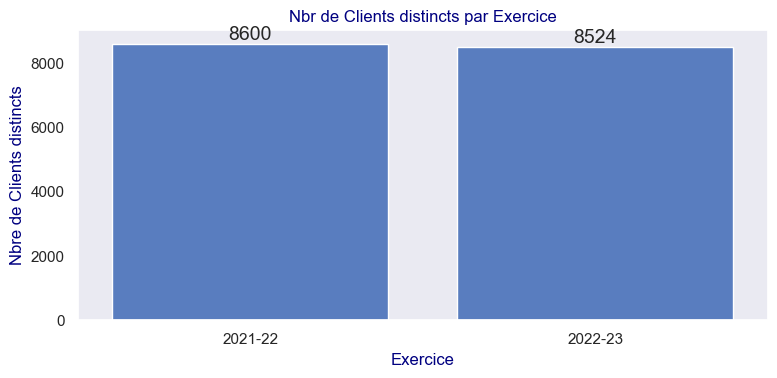

In [903]:
plt.figure(figsize=(8,4)) 
ax = sns.barplot(
    data=df_Complet_yearly_Grouper,
    x="exercice",
    y="nb_clients_distincts")

for x in range(0,1) :
    ax.bar_label(ax.containers[x])
    
plt.title("Nbr de Clients distincts par Exercice")
plt.xlabel("Exercice")
plt.ylabel("Nbre de Clients distincts")
#plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##### <font color=green><u>E. Nbre de Clients distincts mensuel sur la periode par catégorie :</u></font>

In [904]:
df_Complet_monthly_par_categ_Grouper.head(4)

,categ,nb_transactions,nb_produits_distincts,nb_clients_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,
2021-03-31,0,18131,1701,4286,2021-22,2021,Mar,3,2021-03-01
2021-03-31,1,9134,614,4115,2021-22,2021,Mar,3,2021-03-01
2021-03-31,2,1336,167,843,2021-22,2021,Mar,3,2021-03-01
2021-04-30,0,19342,1731,4373,2021-22,2021,Apr,4,2021-04-01


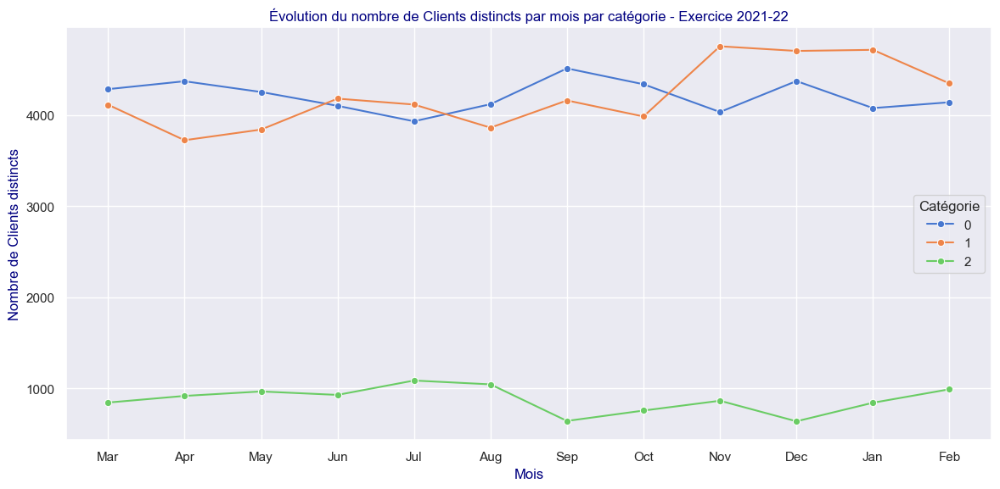

In [905]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_21_22, 
             x='mois', 
             y='nb_clients_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de Clients distincts par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de Clients distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

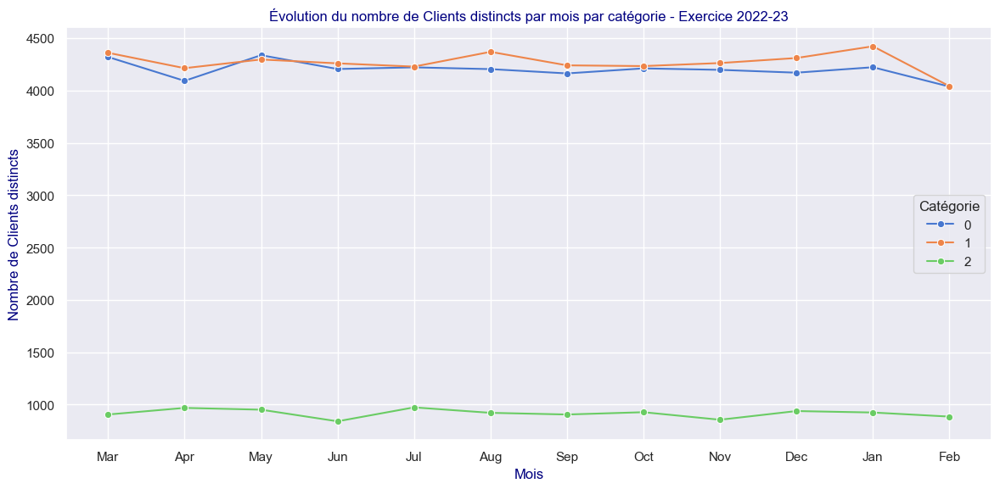

In [906]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23, 
             x='mois', 
             y='nb_clients_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de Clients distincts par mois par catégorie - Exercice 2022-23")
plt.xlabel("Mois")
plt.ylabel("Nombre de Clients distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

**Remarque :**  
Autant de clients sur la categ 0 que 1.  
Cependant en volume on a vu qu'il ya plus de transactions sur la categ 0 que 1.

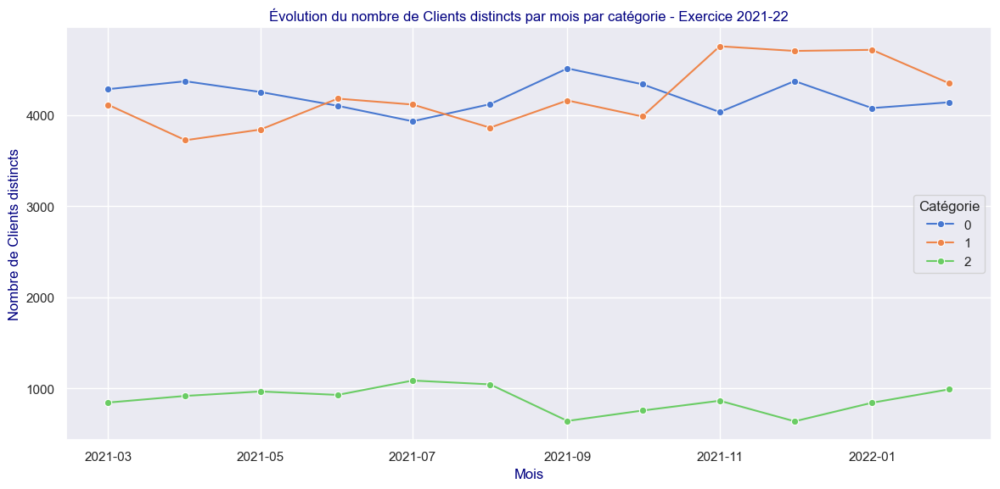

In [907]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_21_22, 
             x='day01', 
             y='nb_clients_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de Clients distincts par mois par catégorie - Exercice 2021-22")
plt.xlabel("Mois")
plt.ylabel("Nombre de Clients distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

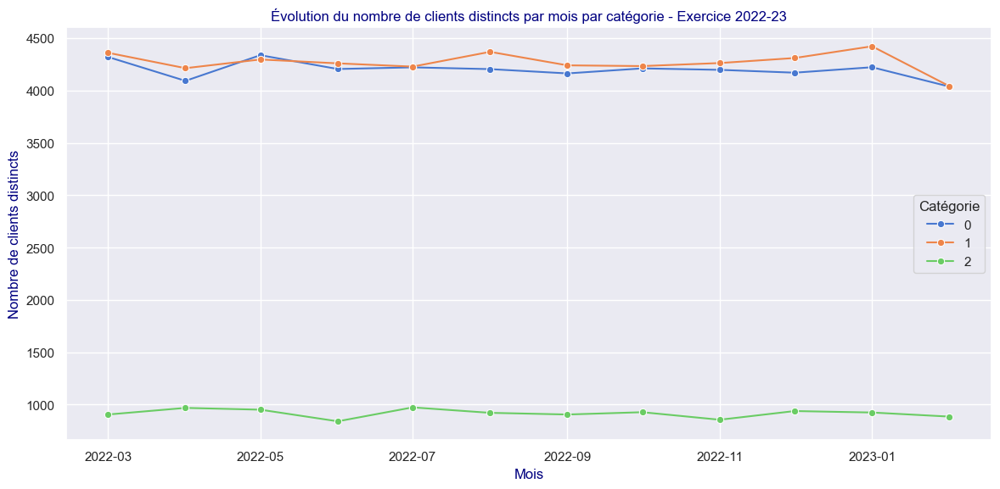

In [908]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper_Ex_22_23, 
             x='day01', 
             y='nb_clients_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de clients distincts par mois par catégorie - Exercice 2022-23")
plt.xlabel("Mois")
plt.ylabel("Nombre de clients distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

##### **OBSERVATIONS :**  
Augmentation du nombre de clients distincts sur la categ 1 en 11/2021

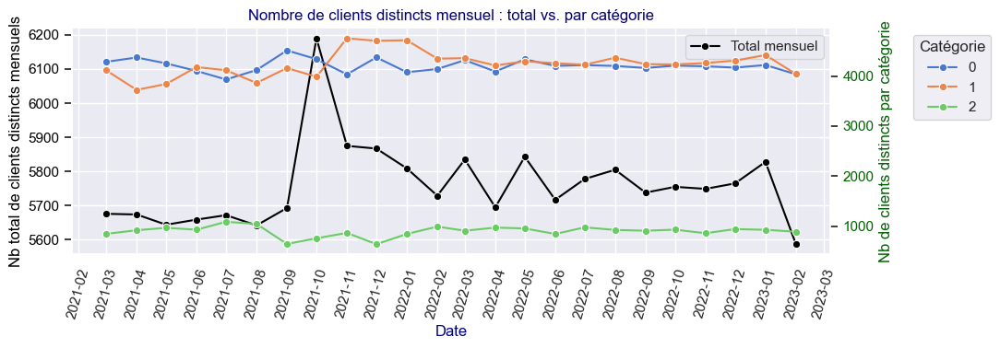

In [909]:
#import matplotlib.pyplot as plt
#import matplotlib.dates as mdates
#import seaborn as sns

# Création de la figure et du premier axe
fig, ax1 = plt.subplots(figsize=(10, 4))

# AXE GAUCHE : Nb total de clients distincts
sns.lineplot(
    data=df_Complet_monthly_Grouper.reset_index(), 
    x="day01", 
    y="nb_clients_distincts", 
    ax=ax1,
    color="black",
    marker='o',
    label="Total mensuel"
)

ax1.set_ylabel("Nb total de clients distincts mensuels", color="black")
ax1.tick_params(axis='y', labelcolor="black")

# Format des dates
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=75)

# AXE DROIT : Transactions par catégorie
ax2 = ax1.twinx()

sns.lineplot(
    data=df_Complet_monthly_par_categ_Grouper.reset_index(), 
    x="day01", 
    y="nb_clients_distincts", 
    hue="categ", 
    palette=palette_fixe_categ,
    ax=ax2,
    marker='o'
)

ax2.set_ylabel("Nb de clients distincts par catégorie", color="darkgreen")
ax2.tick_params(axis='y', labelcolor="darkgreen")

# TITRE + LÉGENDES
plt.title("Nombre de clients distincts mensuel : total vs. par catégorie")
ax1.set_xlabel("Date")
fig.tight_layout()
ax1.grid(True)
ax2.legend(title="Catégorie", bbox_to_anchor=(1.221, 1))  # Légende à droite
plt.show()


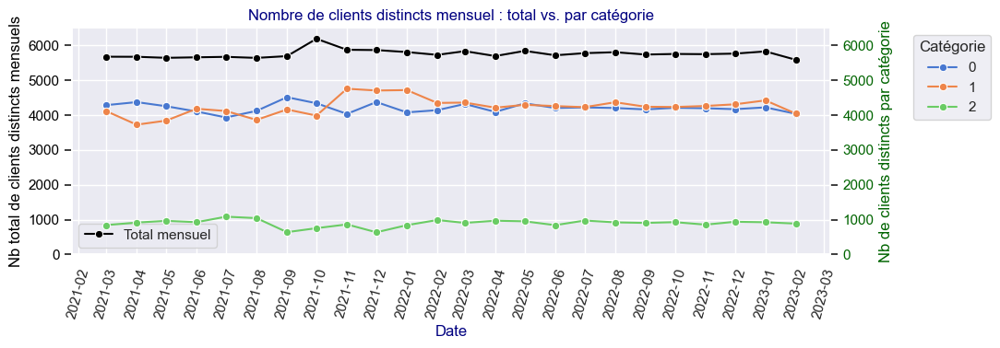

In [910]:
# Création de la figure et du premier axe
fig, ax1 = plt.subplots(figsize=(10, 4))

# AXE GAUCHE : Nb total de clients distincts
sns.lineplot(
    data=df_Complet_monthly_Grouper.reset_index(), 
    x="day01", 
    y="nb_clients_distincts", 
    ax=ax1,
    color="black",
    marker='o',
    label="Total mensuel"
)

ax1.set_ylabel("Nb total de clients distincts mensuels", color="black")
ax1.tick_params(axis='y', labelcolor="black")

# Format des dates
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.ylim(0,6_500)
plt.xticks(rotation=75)

# AXE DROIT : Transactions par catégorie
ax2 = ax1.twinx()

sns.lineplot(
    data=df_Complet_monthly_par_categ_Grouper.reset_index(), 
    x="day01", 
    y="nb_clients_distincts", 
    hue="categ", 
    palette=palette_fixe_categ,
    ax=ax2,
    marker='o'
)

ax2.set_ylabel("Nb de clients distincts par catégorie", color="darkgreen")
ax2.tick_params(axis='y', labelcolor="darkgreen")

# Synchronisation des échelles
ax2.set_ylim(ax1.get_ylim())

# TITRE + LÉGENDES
plt.title("Nombre de clients distincts mensuel : total vs. par catégorie")
ax1.set_xlabel("Date")
fig.tight_layout()
ax1.grid(True)
ax2.legend(title="Catégorie", bbox_to_anchor=(1.221, 1))
plt.show()


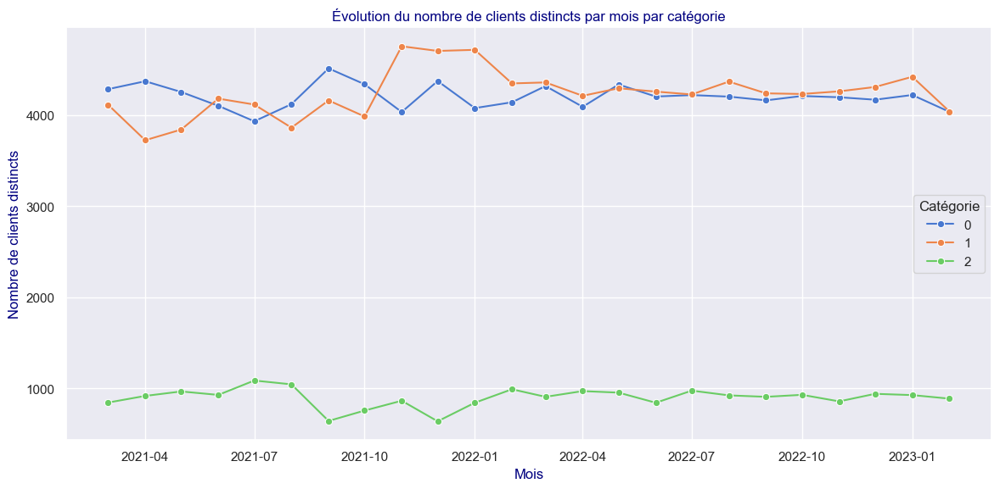

In [911]:
# Graphique par catégorie Exercice 2021-22
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_Complet_monthly_par_categ_Grouper, 
             x='day01', 
             y='nb_clients_distincts', 
             hue='categ',
             marker='o',
             palette = palette_fixe_categ)

plt.title("Évolution du nombre de clients distincts par mois par catégorie")
plt.xlabel("Mois")
plt.ylabel("Nombre de clients distincts")
#plt.ylim(0,25_000)
plt.legend(title="Catégorie")
plt.grid(True)
plt.tight_layout()
plt.show()

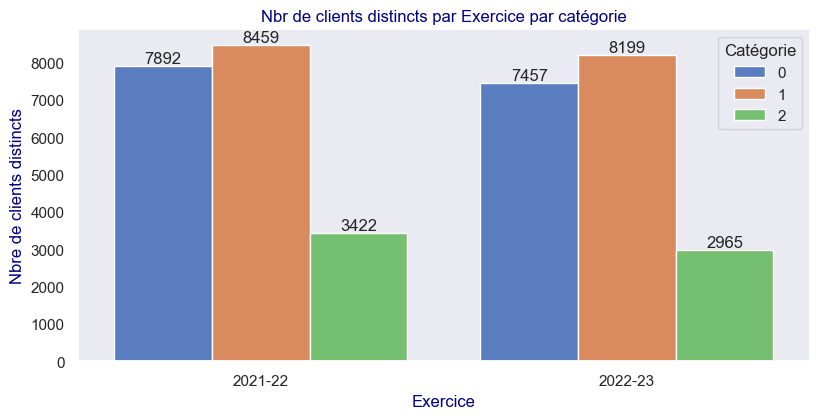

In [912]:
plt.figure(figsize=(8,4)) 

ax=sns.barplot(
    data=df_Complet_yearly_par_categ_Grouper,
    x="exercice",
    y="nb_clients_distincts",
    hue='categ',
    palette=palette_fixe_categ,
    errorbar=None
)
for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x],
                 fontsize=12
                 )  
    
plt.title("Nbr de clients distincts par Exercice par catégorie")
plt.xlabel("Exercice")
plt.ylabel("Nbre de clients distincts")
plt.legend(title="Catégorie")
#plt.xticks(rotation=90)
#plt.ylim(1_000,17_500)
plt.tight_layout(pad=0) #pour gérer les marges
plt.show()

Remarque :  
Ca n'a pas de sens d'empiler des clients distincts par catégorie, car les mêmes clients peuvetn acheter des livres de plusiseurs catégories.

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">5.3 - ZOOM SUR LES REFERENCES :</h3>
</div>

##### <u>**ZOOM SUR LES REFERENCES :**</u>  

-	les tops,
-	les flops,
-	la répartition par catégorie,
-	etc.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.1 - Préparation des tables :</h4>
</div>

Utilisons plutôt la table qui contient toutes les transactions plus les produits non vendus :  
df_analyse_O1_O2_products_1_1

In [913]:
df_analyse_O1_O2_products_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


###### <font color='blue'><u>**1 TABLE BILAN QUOTIDIEN :**</u></font>

In [914]:
#Regroupement en gardant la possibilité d'une étude chronologique :
df_Produits_daily_Grouper = (df_analyse_O1_O2_products_1_1.groupby([pd.Grouper(key='day',freq='D'), 
                                                                             'id_prod','price','categ'])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Produits_daily_Grouper.set_index(keys='day',inplace=True)
df_Produits_daily_Grouper

,id_prod,price,categ,nb_transactions,nb_clients_distincts
day,,,,,
2021-03-01,0_0,3.75,0,1,1
2021-03-01,0_1,10.99,0,1,1
2021-03-01,0_1000,6.84,0,1,1
2021-03-01,0_1003,14.99,0,1,1
2021-03-01,0_1007,4.99,0,1,1
...,...,...,...,...,...
2023-02-28,2_44,70.92,2,1,1
2023-02-28,2_54,89.43,2,1,1
2023-02-28,2_62,60.96,2,1,1


###### <font color='blue'><u>**2 TABLE BILAN 2 ANS par produits :**</u></font>

Attention il faut que je reparte du fichier initial pour ne pas additionner 2 fois le même clients

In [915]:
#Regroupement en gardant la possibilité d'une étude chronologique :
df_Produits_2ans = (df_analyse_O1_O2_products_1_1.groupby(['id_prod','price','categ'])
                    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
                         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
                    .reset_index()
                    )

df_Produits_2ans.set_index(keys='id_prod',inplace=True)
df_Produits_2ans

,price,categ,nb_transactions,nb_clients_distincts
id_prod,,,,
0_0,3.75,0,1242,520
0_1,10.99,0,487,230
0_10,17.95,0,22,12
0_100,20.60,0,3,2
0_1000,6.84,0,432,199
...,...,...,...,...
2_95,98.99,2,4,3
2_96,47.91,2,598,240
2_97,160.99,2,13,5


In [916]:
df_Produits_2ans['CA_prod'] = df_Produits_2ans['price']*df_Produits_2ans['nb_transactions']
df_Produits_2ans.head(5)

,price,categ,nb_transactions,nb_clients_distincts,CA_prod
id_prod,,,,,
0_0,3.75,0,1242,520,4657.50
0_1,10.99,0,487,230,5352.13
0_10,17.95,0,22,12,394.90
0_100,20.60,0,3,2,61.80
0_1000,6.84,0,432,199,2954.88


###### <font color='blue'><u>**3 TABLE BILAN 2 ANS par catégorie :**</u></font>

In [917]:
df_analyse_O1_O2_products_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


ATTENTION au calcul du CA avec les produits qui n'ont pas de transactions dans df_analyse_O1_O2_products_1_1

In [918]:
df_analyse_O1_O2_products_1_1['transaction_id'].isna().sum()

21

In [919]:
(((~df_analyse_O1_O2_products_1_1['transaction_id'].isna()))*1 ).sum()

687534

In [920]:
(((df_analyse_O1_O2_products_1_1['transaction_id'].isna()))*1 ).sum()

21

In [921]:
#df_analyse_O1_O2_products_1_1['transaction_id'].isna()
((~df_analyse_O1_O2_products_1_1['transaction_id'].isna()))*1 

0         1
1         1
2         1
3         1
4         1
         ..
687550    1
687551    1
687552    1
687553    1
687554    1
Name: transaction_id, Length: 687555, dtype: int32

In [922]:
df_analyse_O1_O2_products_1_1['Quantity']= ((~df_analyse_O1_O2_products_1_1['transaction_id'].isna()))*1 
df_analyse_O1_O2_products_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ,Quantity
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0,1
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0,1


In [923]:
df_analyse_O1_O2_products_1_1['CA_pr']= df_analyse_O1_O2_products_1_1['Quantity']*df_analyse_O1_O2_products_1_1['price']
df_analyse_O1_O2_products_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ,Quantity,CA_pr
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0,1,3.75
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0,1,3.75


In [924]:
#Groupby categ:
df_Produits_2ans_par_categ = (df_analyse_O1_O2_products_1_1.groupby(['categ'])
                              .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
                                   CA_categ=pd.NamedAgg(column='CA_pr',aggfunc='sum'),
                                   nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'),
                                  nb_references_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'))
                              .reset_index()
                              )

df_Produits_2ans_par_categ.set_index(keys='categ',inplace=True)
df_Produits_2ans_par_categ

,nb_transactions,CA_categ,nb_clients_distincts,nb_references_distincts
categ,,,,
0,415459,4419730.97,7896,2308
1,235592,4827657.11,8459,739
2,36483,2780275.02,3597,239


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.2 - Top et Flops des références :</h4>
</div>

##### <font color=green><u>A. Top et Flops des références par Nombre de transactions :</u></font>

In [925]:
df_top15_produits_nb_tr = (df_Produits_2ans.sort_values(by='nb_transactions',ascending=False)
                           .reset_index()
                           .head(15)
                           )
df_top15_produits_nb_tr

,id_prod,price,categ,nb_transactions,nb_clients_distincts,CA_prod
0,1_369,23.99,1,2340,998,56136.60
1,1_417,20.99,1,2269,987,47626.31
2,1_414,23.83,1,2246,945,53522.18
3,1_498,23.37,1,2202,954,51460.74
4,1_425,16.99,1,2163,927,36749.37
5,1_403,17.99,1,2040,858,36699.60
6,1_413,17.99,1,2036,919,36627.64
7,1_412,16.65,1,2014,881,33533.10
8,1_406,24.81,1,2003,882,49694.43
9,1_407,15.99,1,2001,876,31995.99


In [926]:
df_flop15_produits_nb_tr = (df_Produits_2ans.sort_values(by='nb_transactions',ascending=True)
                           .reset_index()
                           .head(15)
                           )
df_flop15_produits_nb_tr

,id_prod,price,categ,nb_transactions,nb_clients_distincts,CA_prod
0,0_1016,35.06,0,0,0,0.0
1,0_1620,0.80,0,0,0,0.0
2,0_1624,24.50,0,0,0,0.0
3,0_322,2.99,0,0,0,0.0
4,1_0,31.82,1,0,0,0.0
5,0_1025,24.99,0,0,0,0.0
6,0_310,1.94,0,0,0,0.0
7,0_299,22.99,0,0,0,0.0
8,0_1318,20.92,0,0,0,0.0
9,0_1645,2.99,0,0,0,0.0


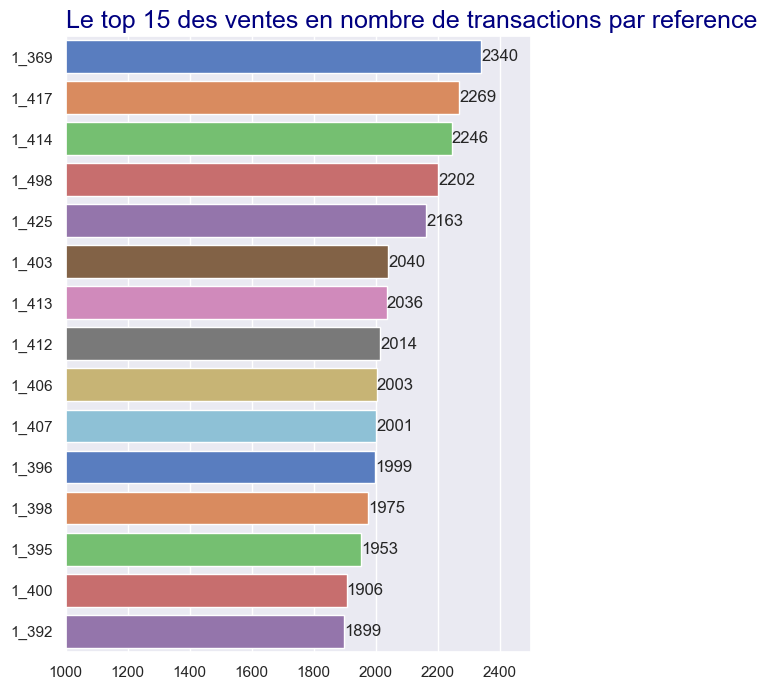

In [927]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,8))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top15_produits_nb_tr , 
                 y='id_prod',
                 x = 'nb_transactions', errorbar=None,
                 hue='id_prod',legend=False,
                 palette='muted',
                 order=df_top15_produits_nb_tr['id_prod']
                )

for x in range(0,15) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le top 15 des ventes en nombre de transactions par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

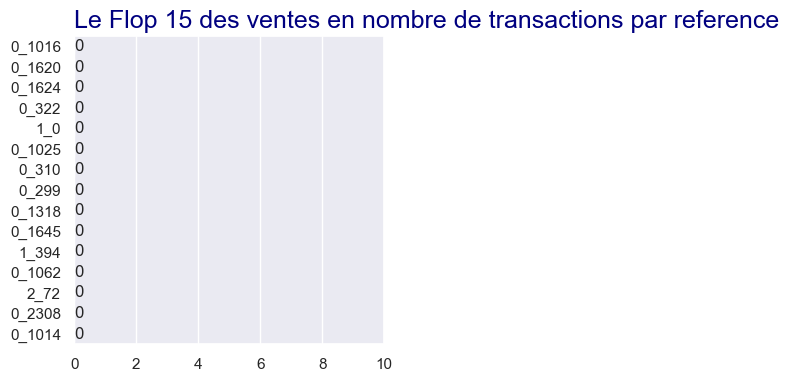

In [928]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(4,4))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop15_produits_nb_tr , 
                 y='id_prod',
                 x = 'nb_transactions', errorbar=None,
                 hue='id_prod',legend=False,
                 palette='muted',
                 order=df_flop15_produits_nb_tr['id_prod']
                )

for x in range(0,15) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
plt.xlim(0,10)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le Flop 15 des ventes en nombre de transactions par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

##### <font color=green>**Les 21 produits non vendus :**</font>

In [929]:
df_Produits_2ans.head()

,price,categ,nb_transactions,nb_clients_distincts,CA_prod
id_prod,,,,,
0_0,3.75,0,1242,520,4657.50
0_1,10.99,0,487,230,5352.13
0_10,17.95,0,22,12,394.90
0_100,20.60,0,3,2,61.80
0_1000,6.84,0,432,199,2954.88


In [930]:
#df_Produits_2ans['nb_transactions']==0
#liste_produits_non_vendus = 
#df_Produits_2ans[df_Produits_2ans['nb_transactions']==0].index.to_list()
nb_produits_non_vendus = len(df_Produits_2ans[df_Produits_2ans['nb_transactions']==0].index)

liste_produits_non_vendus = df_Produits_2ans[df_Produits_2ans['nb_transactions']==0].index.to_list()

print(f"Le nombre de produits non vendus est de : {nb_produits_non_vendus}")
print(f"Les produits non vendus sont les suivants : ")
for elt in liste_produits_non_vendus :
    print(elt)

Le nombre de produits non vendus est de : 21
Les produits non vendus sont les suivants : 
0_1014
0_1016
0_1025
0_1062
0_1119
0_1318
0_1620
0_1624
0_1645
0_1780
0_1800
0_2308
0_299
0_310
0_322
0_510
1_0
1_394
2_72
2_86
2_87


In [931]:
#EXPORT de la liste des produits non vendus
#df_liste_produits non vendus = (df_Produits_2ans[df_Produits_2ans['nb_transactions']==0] )


##### <font color=green><u>B. Top et Flops des références par CA par produit :</u></font>

In [932]:
df_top15_produits_CA_pr = (df_Produits_2ans.sort_values(by='CA_prod',ascending=False)
                           .reset_index()
                           .head(15)
                           )
df_top15_produits_CA_pr

,id_prod,price,categ,nb_transactions,nb_clients_distincts,CA_prod
0,2_159,145.99,2,650,530,94893.50
1,2_135,68.99,2,1005,402,69334.95
2,2_112,67.57,2,968,383,65407.76
3,2_102,59.14,2,1027,402,60736.78
4,2_209,69.99,2,814,316,56971.86
5,1_395,28.99,1,1953,833,56617.47
6,1_369,23.99,1,2340,998,56136.60
7,2_110,62.25,2,865,357,53846.25
8,1_383,28.99,1,1857,812,53834.43
9,1_414,23.83,1,2246,945,53522.18


In [933]:
df_flop15_produits_CA_pr = (df_Produits_2ans.sort_values(by='CA_prod',ascending=True)
                           .reset_index()
                           .head(15)
                           )
df_flop15_produits_CA_pr

,id_prod,price,categ,nb_transactions,nb_clients_distincts,CA_prod
0,1_394,39.73,1,0,0,0.0
1,2_72,141.32,2,0,0,0.0
2,0_1014,1.15,0,0,0,0.0
3,0_1624,24.50,0,0,0,0.0
4,0_1780,1.67,0,0,0,0.0
5,0_1620,0.80,0,0,0,0.0
6,1_0,31.82,1,0,0,0.0
7,0_322,2.99,0,0,0,0.0
8,0_1016,35.06,0,0,0,0.0
9,0_1062,20.08,0,0,0,0.0


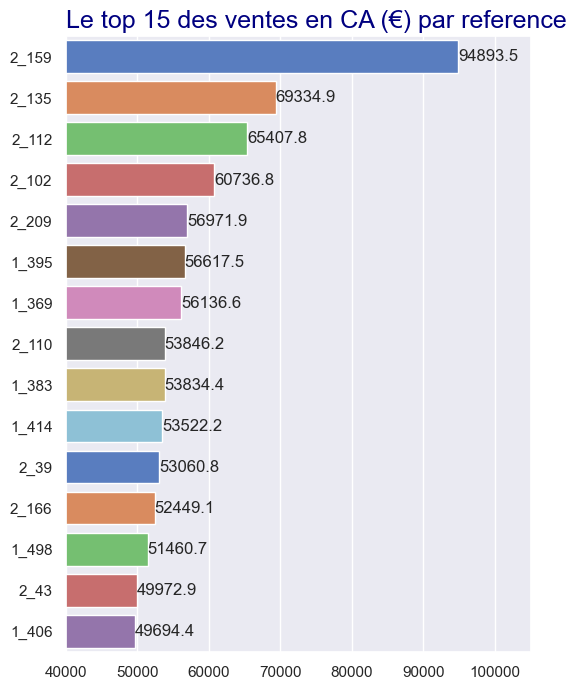

In [934]:
# TOP 15 PRODUITS en CA par produits (HORIZONTAL)

plt.figure(figsize=(6,8))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top15_produits_CA_pr , 
                 y='id_prod',
                 x = 'CA_prod', errorbar=None,
                 hue='id_prod',legend=False,
                 palette='muted',
                 order=df_top15_produits_CA_pr['id_prod']
                )

for x in range(0,15) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
plt.xlim(40_000,105_000)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le top 15 des ventes en CA (€) par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

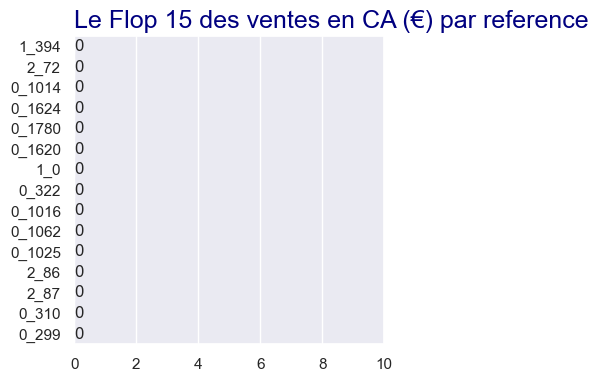

In [935]:
# FLOP 15 PRODUITS en CA par produits (HORIZONTAL)

plt.figure(figsize=(4,4))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop15_produits_CA_pr , 
                 y='id_prod',
                 x = 'CA_prod', errorbar=None,
                 hue='id_prod',legend=False,
                 palette='muted',
                 order=df_flop15_produits_CA_pr['id_prod']
                )

for x in range(0,15) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
plt.xlim(0,10)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le Flop 15 des ventes en CA (€) par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

##### <font color=green><u>C. Top et Flops des références par Popularité (nb_clients_distincts) :</u></font>

In [936]:
df_top15_produits_nb_cl = (df_Produits_2ans.sort_values(by='nb_clients_distincts',ascending=False)
                           .reset_index()
                           .head(15)
                           )
df_top15_produits_nb_cl

,id_prod,price,categ,nb_transactions,nb_clients_distincts,CA_prod
0,1_369,23.99,1,2340,998,56136.60
1,1_417,20.99,1,2269,987,47626.31
2,1_498,23.37,1,2202,954,51460.74
3,1_414,23.83,1,2246,945,53522.18
4,1_425,16.99,1,2163,927,36749.37
5,1_413,17.99,1,2036,919,36627.64
6,1_406,24.81,1,2003,882,49694.43
7,1_412,16.65,1,2014,881,33533.10
8,1_396,18.60,1,1999,881,37181.40
9,1_407,15.99,1,2001,876,31995.99


In [937]:
df_flop15_produits_nb_cl = (df_Produits_2ans.sort_values(by='nb_clients_distincts',ascending=True)
                           .reset_index()
                           .head(15)
                           )
df_flop15_produits_nb_cl

,id_prod,price,categ,nb_transactions,nb_clients_distincts,CA_prod
0,0_1318,20.92,0,0,0,0.0
1,0_510,23.66,0,0,0,0.0
2,0_1062,20.08,0,0,0,0.0
3,0_1620,0.80,0,0,0,0.0
4,0_1624,24.50,0,0,0,0.0
5,2_72,141.32,2,0,0,0.0
6,0_1025,24.99,0,0,0,0.0
7,1_394,39.73,1,0,0,0.0
8,0_1645,2.99,0,0,0,0.0
9,0_1780,1.67,0,0,0,0.0


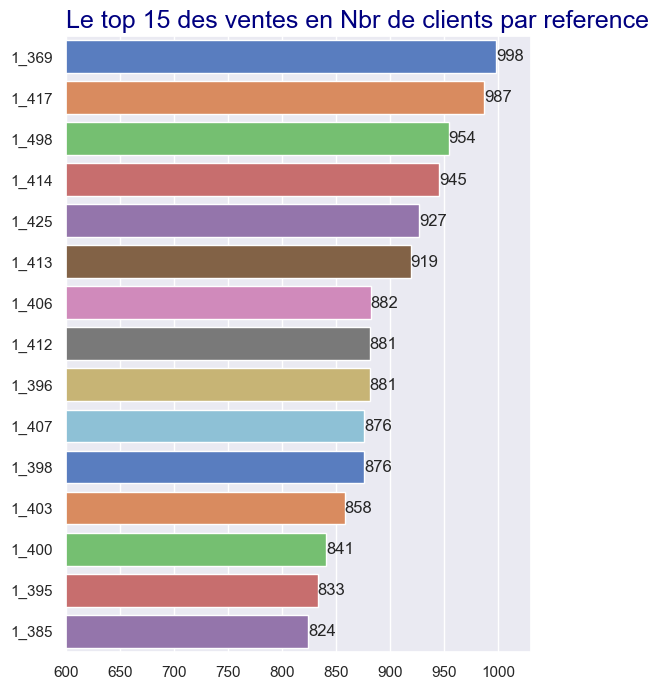

In [938]:
# TOP 15 PRODUITS en nb_clients_distincts (HORIZONTAL)

plt.figure(figsize=(6,8))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top15_produits_nb_cl , 
                 y='id_prod',
                 x = 'nb_clients_distincts', errorbar=None,
                 hue='id_prod',legend=False,
                 palette='muted',
                 order=df_top15_produits_nb_cl['id_prod']
                )

for x in range(0,15) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
plt.xlim(600,1030)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le top 15 des ventes en Nbr de clients par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

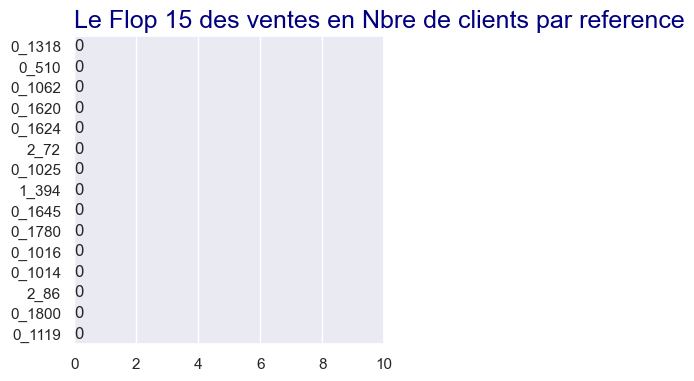

In [939]:
# FLOP 15 PRODUITS en nb_clients_distincts (HORIZONTAL)

plt.figure(figsize=(4,4))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop15_produits_nb_cl , 
                 y='id_prod',
                 x = 'nb_clients_distincts', errorbar=None,
                 hue='id_prod',legend=False,
                 palette='muted',
                 order=df_flop15_produits_nb_cl['id_prod']
                )

for x in range(0,15) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
plt.xlim(0,10)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le Flop 15 des ventes en Nbre de clients par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

**Remarque :**  
Les FLops : vérifier si les références sont bien à vendre et en stocks.  
Vérifier si il n'y a pas un pb technique qui bloque la vente...  
Si ce n'est pas le cas : les brader?


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.3 - Répartition par catégorie :</h4>
</div>

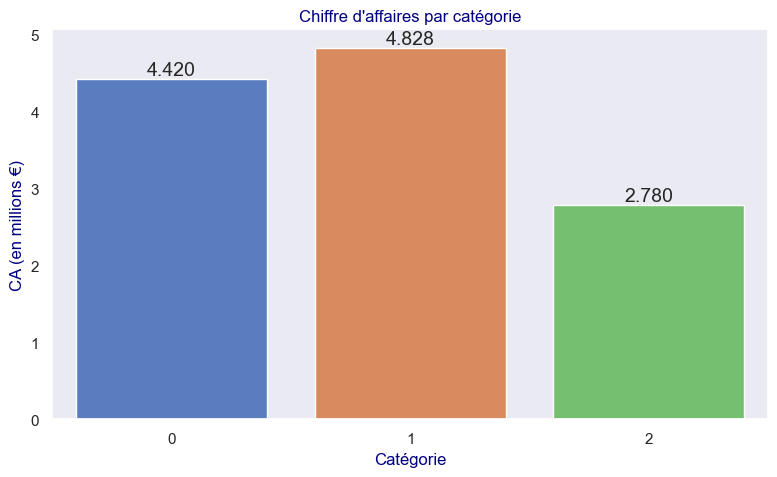

In [940]:
#POUR RAPPEL DEJA TRACE DANS L'ANALYSE DU CA :
#BILAN sur 2 ans :
#df_cat = df_CA_Daily_categ_1_1.groupby("categ")["price"].sum().reset_index()


plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_CA_2ans_categ_1_1bis, 
                 x="categ", 
                 y="CA_2ans_Millions",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.3f')

plt.title("Chiffre d'affaires par catégorie")
plt.xlabel("Catégorie")
plt.ylabel("CA (en millions €)")
plt.tight_layout()
plt.show()

In [941]:
df_Produits_2ans_par_categ

,nb_transactions,CA_categ,nb_clients_distincts,nb_references_distincts
categ,,,,
0,415459,4419730.97,7896,2308
1,235592,4827657.11,8459,739
2,36483,2780275.02,3597,239


In [942]:
df_Produits_2ans_par_categ['nb_transactions_Milliers'] = df_Produits_2ans_par_categ['nb_transactions']/1_000
df_Produits_2ans_par_categ['CA_categ_Millions'] = df_Produits_2ans_par_categ['CA_categ']/1_000_000
df_Produits_2ans_par_categ

,nb_transactions,CA_categ,nb_clients_distincts,nb_references_distincts,nb_transactions_Milliers,CA_categ_Millions
categ,,,,,,
0,415459,4419730.97,7896,2308,415.459,4.419731
1,235592,4827657.11,8459,739,235.592,4.827657
2,36483,2780275.02,3597,239,36.483,2.780275


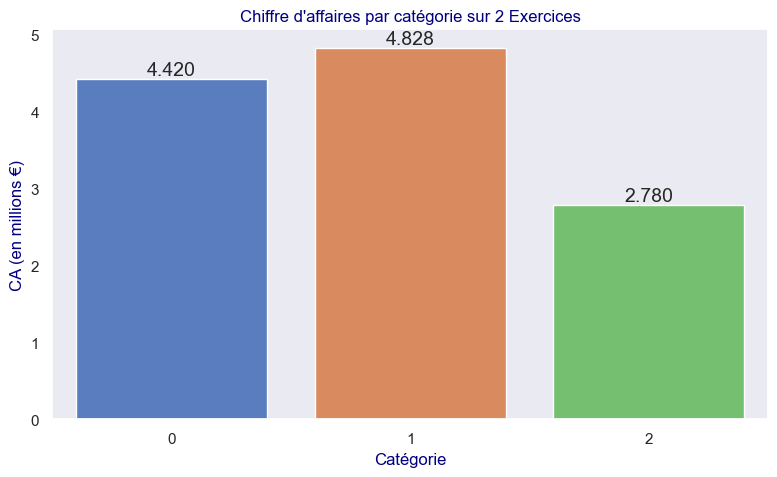

In [943]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="CA_categ_Millions",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.3f')

plt.title("Chiffre d'affaires par catégorie sur 2 Exercices")
plt.xlabel("Catégorie")
plt.ylabel("CA (en millions €)")
plt.tight_layout()
plt.show()

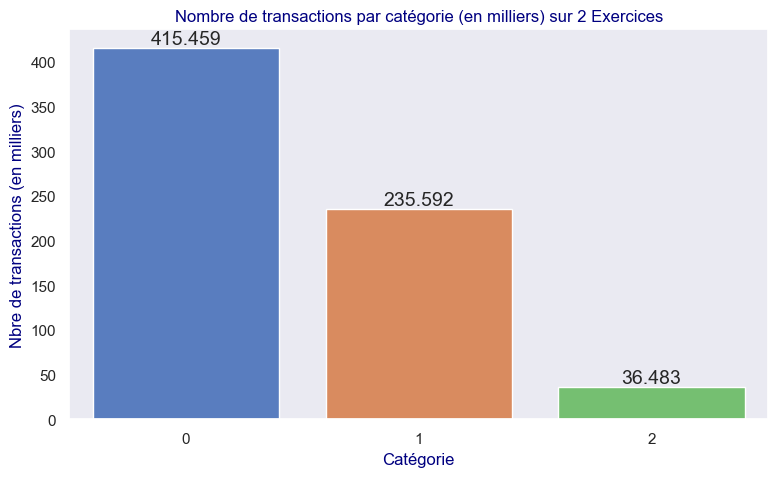

In [944]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="nb_transactions_Milliers",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.3f')

plt.title("Nombre de transactions par catégorie (en milliers) sur 2 Exercices")
plt.xlabel("Catégorie")
plt.ylabel("Nbre de transactions (en milliers)")
plt.tight_layout()
plt.show()

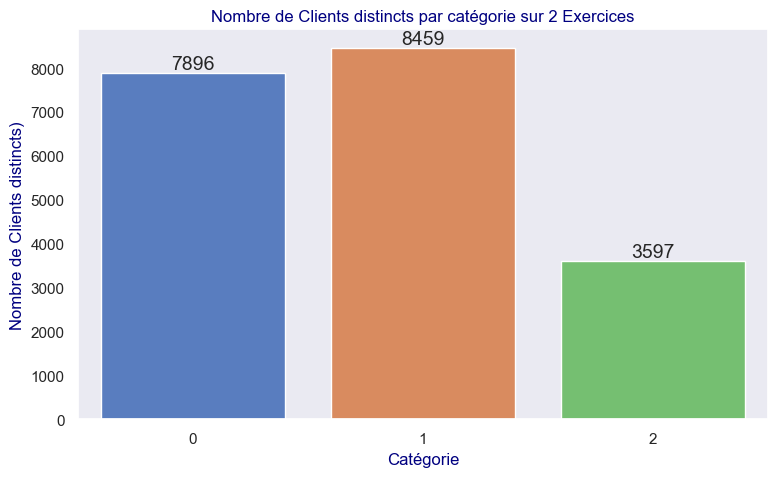

In [945]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="nb_clients_distincts",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title("Nombre de Clients distincts par catégorie sur 2 Exercices")
plt.xlabel("Catégorie")
plt.ylabel("Nombre de Clients distincts)")
plt.tight_layout()
plt.show()

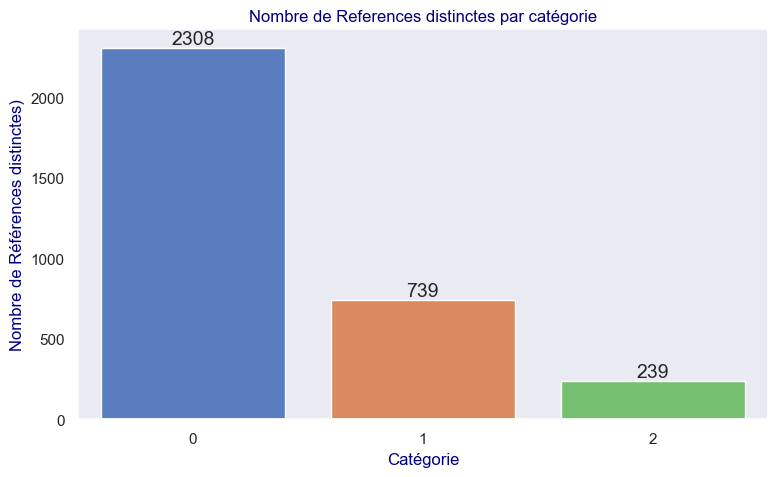

In [946]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="nb_references_distincts",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title("Nombre de References distinctes par catégorie")
plt.xlabel("Catégorie")
plt.ylabel("Nombre de Références distinctes)")
plt.tight_layout()
plt.show()

**VERSION POURCENTAGE :**

In [947]:
df_Produits_2ans_par_categ

,nb_transactions,CA_categ,nb_clients_distincts,nb_references_distincts,nb_transactions_Milliers,CA_categ_Millions
categ,,,,,,
0,415459,4419730.97,7896,2308,415.459,4.419731
1,235592,4827657.11,8459,739,235.592,4.827657
2,36483,2780275.02,3597,239,36.483,2.780275


In [948]:
df_Produits_2ans_par_categ['nb_transactions_%'] = (df_Produits_2ans_par_categ['nb_transactions']
                                                   /(df_Produits_2ans_par_categ['nb_transactions'].sum()))*100
df_Produits_2ans_par_categ['CA_categ_%'] = (df_Produits_2ans_par_categ['CA_categ']
                                                   /(df_Produits_2ans_par_categ['CA_categ'].sum()))*100
df_Produits_2ans_par_categ['nb_references_distincts_%'] = (df_Produits_2ans_par_categ['nb_references_distincts']
                                                   /(df_Produits_2ans_par_categ['nb_references_distincts'].sum()))*100
df_Produits_2ans_par_categ

,nb_transactions,CA_categ,nb_clients_distincts,nb_references_distincts,nb_transactions_Milliers,CA_categ_Millions,nb_transactions_%,CA_categ_%,nb_references_distincts_%
categ,,,,,,,,,
0,415459,4419730.97,7896,2308,415.459,4.419731,60.427412,36.746382,70.237371
1,235592,4827657.11,8459,739,235.592,4.827657,34.266233,40.137948,22.489349
2,36483,2780275.02,3597,239,36.483,2.780275,5.306356,23.115671,7.273281


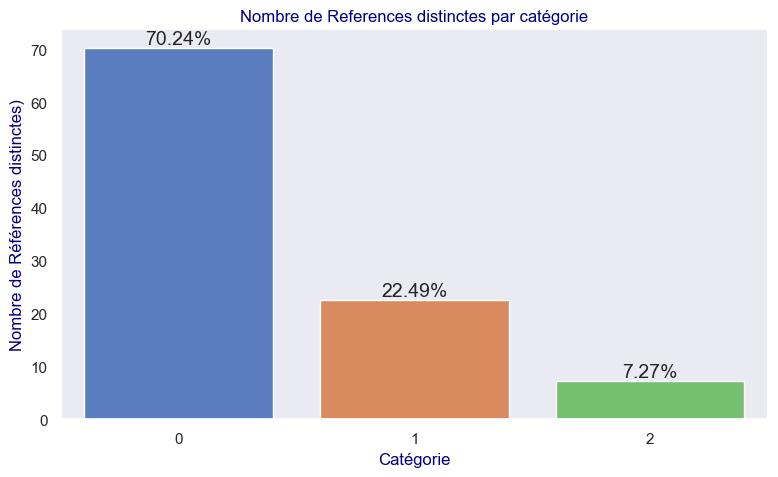

In [949]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="nb_references_distincts_%",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.2f%%')

plt.title("Nombre de References distinctes par catégorie")
plt.xlabel("Catégorie")
plt.ylabel("Nombre de Références distinctes)")
plt.tight_layout()
plt.show()

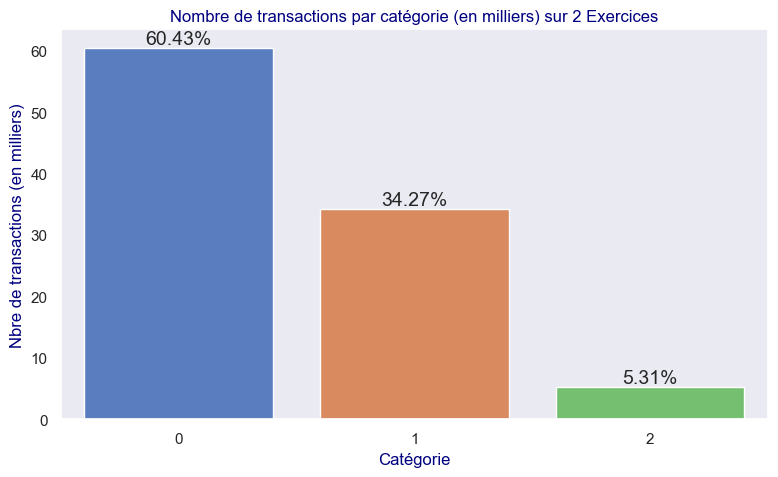

In [950]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="nb_transactions_%",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.2f%%')

plt.title("Nombre de transactions par catégorie (en milliers) sur 2 Exercices")
plt.xlabel("Catégorie")
plt.ylabel("Nbre de transactions (en milliers)")
plt.tight_layout()
plt.show()

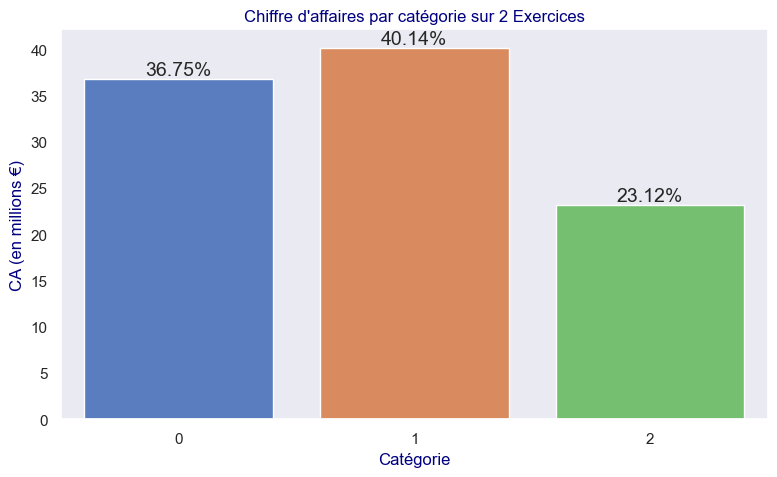

In [951]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="CA_categ_%",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.2f%%')

plt.title("Chiffre d'affaires par catégorie sur 2 Exercices")
plt.xlabel("Catégorie")
plt.ylabel("CA (en millions €)")
plt.tight_layout()
plt.show()

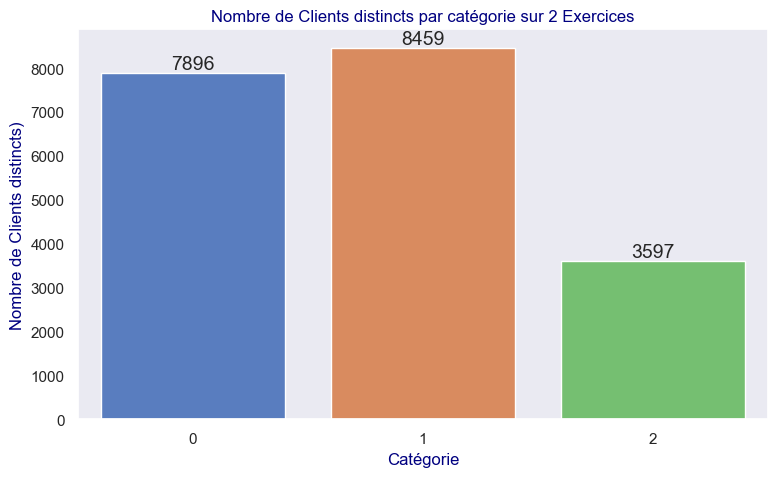

In [952]:
#BILAN sur 2 ans :

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_Produits_2ans_par_categ, 
                 x="categ", 
                 y="nb_clients_distincts",
                 hue="categ",
                palette = palette_fixe_categ)

for x in range(0,3) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title("Nombre de Clients distincts par catégorie sur 2 Exercices")
plt.xlabel("Catégorie")
plt.ylabel("Nombre de Clients distincts)")
plt.tight_layout()
plt.show()

**VERSION CAMENBERT :**

In [953]:
display(df_Produits_2ans_par_categ)

,nb_transactions,CA_categ,nb_clients_distincts,nb_references_distincts,nb_transactions_Milliers,CA_categ_Millions,nb_transactions_%,CA_categ_%,nb_references_distincts_%
categ,,,,,,,,,
0,415459,4419730.97,7896,2308,415.459,4.419731,60.427412,36.746382,70.237371
1,235592,4827657.11,8459,739,235.592,4.827657,34.266233,40.137948,22.489349
2,36483,2780275.02,3597,239,36.483,2.780275,5.306356,23.115671,7.273281


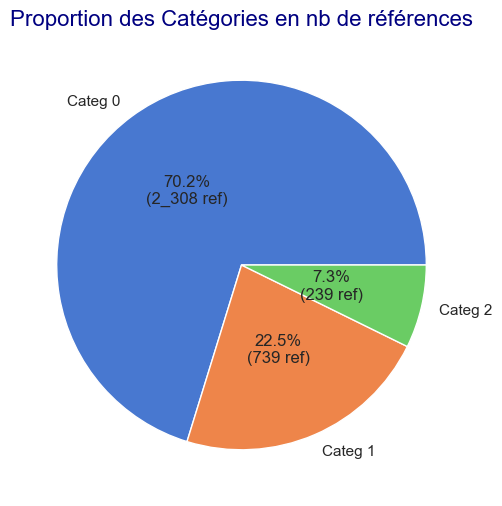

In [954]:
#Camenbert du nombre de références

# Fonction pour afficher à la fois nombre et pourcentage
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{pct:.1f}%\n({val:_.0f} ref)'
    return my_autopct

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_Produits_2ans_par_categ


# Récupérer les couleurs dans l'ordre des labels du pie chart
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph['nb_references_distincts'],
        labels=[f"Categ {cat}" for cat in df_graph.index],
        normalize=True,
        autopct=make_autopct(df_graph['nb_references_distincts']),
        labeldistance=1.1,
        pctdistance =0.5,
        startangle=0,
        colors=colors_in_order
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        

plt.title("Proportion des Catégories en nb de références",fontdict={'fontsize' : 16, 'color':'navy'})
#plt.legend(title='catégorie')
plt.show()

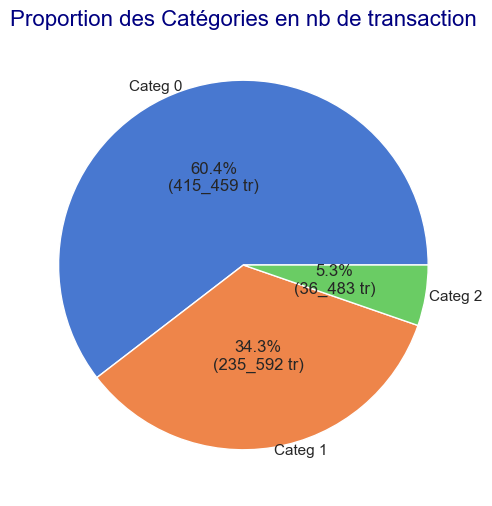

In [955]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

# Fonction pour afficher à la fois nombre et pourcentage
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{pct:.1f}%\n({val:_.0f} tr)'
    return my_autopct

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_Produits_2ans_par_categ


# Récupérer les couleurs dans l'ordre des labels du pie chart
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph['nb_transactions'],
        labels=[f"Categ {cat}" for cat in df_graph.index],
        normalize=True,
        autopct=make_autopct(df_graph['nb_transactions']),
        labeldistance=1.02,
        pctdistance =0.5,
        startangle=0,
        colors=colors_in_order
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        

plt.title("Proportion des Catégories en nb de transaction",fontdict={'fontsize' : 16, 'color':'navy'})
#plt.legend(title='catégorie')
plt.show()

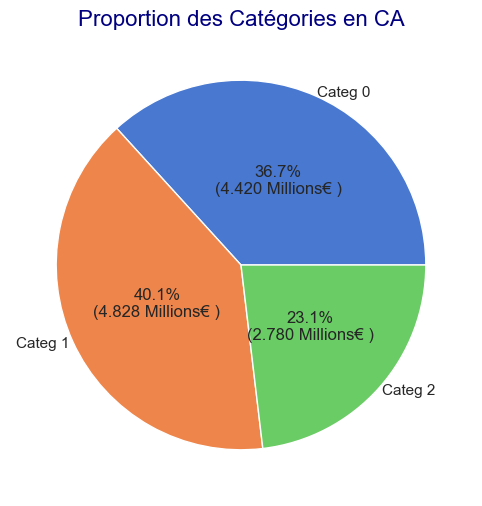

In [956]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

# Fonction pour afficher à la fois nombre et pourcentage
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{pct:.1f}%\n({val/1_000_000:_.3f} Millions€ )'
    return my_autopct

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

df_graph = df_Produits_2ans_par_categ


# Récupérer les couleurs dans l'ordre des labels du pie chart
colors_in_order = [palette_fixe_categ[c] for c in df_graph.index]

plt.pie(x=df_graph['CA_categ'],
        labels=[f"Categ {cat}" for cat in df_graph.index],
        normalize=True,
        autopct=make_autopct(df_graph['CA_categ']),
        labeldistance=1.02,
        pctdistance =0.5,
        startangle=0,
        colors=colors_in_order
#        colors=['gold','skyblue'],
#        rotatelabels =True
       )
        

plt.title("Proportion des Catégories en CA",fontdict={'fontsize' : 16, 'color':'navy'})
#plt.legend(title='catégorie')
plt.show()

In [957]:
df_pie

categ,0,1,2
exercice,,,
2021-22,2292,737,236
2022-23,2256,734,230


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">5.4 - PROFILS DE NOS CLIENTS :</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.1 -répartition du chiffre d'affaires pour les clients BtoB </h4>
</div>

##### <font color='green'><u>**A. RAPPEL DES TABLES UTILES**</u> </font>

In [958]:
df_client_nb_achat_1bis_Gros_Client.head()

,transaction_id
client_id,
c_1609,25586
c_3454,6793
c_4958,5222
c_6714,9199


In [959]:
index_client_Gros_Client

Index(['c_1609', 'c_3454', 'c_4958', 'c_6714'], dtype='string', name='client_id')

In [960]:
df_analyse_O1_O2_customers_1_1.head()

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0
2,t_362246,s_180968,2022-03-18 16:40:10.068303,2022-03-18,c_1011,f,1999,0_0,3.75,0
3,t_391460,s_195932,2022-04-18 16:40:10.068303,2022-04-18,c_1011,f,1999,0_0,3.75,0
4,t_677849,s_343439,2023-02-18 16:40:10.068303,2023-02-18,c_1011,f,1999,0_0,3.75,0


##### <font color='green'><u>**B. CONSTRUCTIONS DES TABLES CA PAR CLIENT**</u></font>

##### **TABLE QUOTIDIENNE:**

In [961]:
(df_analyse_O1_O2_customers_1_1.groupby([pd.Grouper(key='day',freq='D'), 'client_id'])
    .agg(CA_client=pd.NamedAgg(column='price',aggfunc='sum'),
         nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='nunique'),
         nb_sessions=pd.NamedAgg(column='client_id',aggfunc='nunique'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique')
        )
).reset_index().set_index(keys='day').head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts
day,,,,,
2021-03-01,c_1031,27.99,1,1,1
2021-03-01,c_1052,247.22,1,1,1
2021-03-01,c_1074,29.21,2,1,2
2021-03-01,c_110,21.23,1,1,1
2021-03-01,c_1112,31.31,3,1,3


In [962]:
#Table Quotidienne du CA par client
df_CA_par_client_daily = (df_analyse_O1_O2_customers_1_1.groupby([pd.Grouper(key='day',freq='D'), 'client_id'])
                            .agg(CA_client=pd.NamedAgg(column='price',aggfunc='sum'),
                                 nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='nunique'),
                                 nb_sessions=pd.NamedAgg(column='client_id',aggfunc='nunique'),
                                 nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique')
                                 )
                            ).reset_index().set_index(keys='day')

df_CA_par_client_daily.head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts
day,,,,,
2021-03-01,c_1031,27.99,1,1,1
2021-03-01,c_1052,247.22,1,1,1
2021-03-01,c_1074,29.21,2,1,2
2021-03-01,c_110,21.23,1,1,1
2021-03-01,c_1112,31.31,3,1,3


**Remarque :**  
Attention : Rappel une session peut-être sur 2 jours distincts et donc comptés 2 fois

##### **TABLE MENSUELLE:**

In [963]:
#Table Mensuel du CA par client
df_CA_par_client_monthly = (df_analyse_O1_O2_customers_1_1.groupby([pd.Grouper(key='day',freq='ME'), 'client_id'])
                            .agg(CA_client=pd.NamedAgg(column='price',aggfunc='sum'),
                                 nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='nunique'),
                                 nb_sessions=pd.NamedAgg(column='client_id',aggfunc='nunique'),
                                 nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique')
                                 )
                            ).reset_index().set_index(keys='day')

df_CA_par_client_monthly.head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts
day,,,,,
2021-03-31,c_10,14.99,1,1,1
2021-03-31,c_1000,160.77,9,1,9
2021-03-31,c_1001,357.19,6,1,6
2021-03-31,c_1003,133.96,11,1,10
2021-03-31,c_1004,63.09,7,1,7


In [964]:
#Préparation des Data Frame pour Graph

df_CA_par_client_monthly['exercice'] = df_CA_par_client_monthly.index.map(get_exercice)
df_CA_par_client_monthly['annee'] = df_CA_par_client_monthly.index.year
df_CA_par_client_monthly['mois'] = df_CA_par_client_monthly.index.strftime('%b')
df_CA_par_client_monthly['mois_num'] = df_CA_par_client_monthly.index.month
df_CA_par_client_monthly['day01'] = df_CA_par_client_monthly.index.to_period('M').to_timestamp(how='start')

df_CA_par_client_monthly.head(6)

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,,
2021-03-31,c_10,14.99,1,1,1,2021-22,2021,Mar,3,2021-03-01
2021-03-31,c_1000,160.77,9,1,9,2021-22,2021,Mar,3,2021-03-01
2021-03-31,c_1001,357.19,6,1,6,2021-22,2021,Mar,3,2021-03-01
2021-03-31,c_1003,133.96,11,1,10,2021-22,2021,Mar,3,2021-03-01
2021-03-31,c_1004,63.09,7,1,7,2021-22,2021,Mar,3,2021-03-01
2021-03-31,c_1005,7.99,1,1,1,2021-22,2021,Mar,3,2021-03-01


##### **TABLE ANNUELLE :**

In [965]:
#Table Mensuel du CA par client
df_CA_par_client_yearly = (df_analyse_O1_O2_customers_1_1.groupby([pd.Grouper(key='day',freq='YE-FEB'), 'client_id'])
                            .agg(CA_client=pd.NamedAgg(column='price',aggfunc='sum'),
                                 nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='nunique'),
                                 nb_sessions=pd.NamedAgg(column='client_id',aggfunc='nunique'),
                                 nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique')
                                 )
                            ).reset_index().set_index(keys='day')

df_CA_par_client_yearly.head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts
day,,,,,
2022-02-28,c_1,371.49,24,1,23
2022-02-28,c_10,586.18,28,1,27
2022-02-28,c_100,222.87,6,1,6
2022-02-28,c_1000,1010.01,57,1,53
2022-02-28,c_1001,1113.44,59,1,57


In [966]:
#Préparation des Data Frame pour Graph

df_CA_par_client_yearly['exercice'] = df_CA_par_client_yearly.index.map(get_exercice)
df_CA_par_client_yearly['day01'] = df_CA_par_client_yearly.index.to_period('Y-FEB').to_timestamp(how='start')

df_CA_par_client_yearly.head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,exercice,day01
day,,,,,,,
2022-02-28,c_1,371.49,24,1,23,2021-22,2021-03-01
2022-02-28,c_10,586.18,28,1,27,2021-22,2021-03-01
2022-02-28,c_100,222.87,6,1,6,2021-22,2021-03-01
2022-02-28,c_1000,1010.01,57,1,53,2021-22,2021-03-01
2022-02-28,c_1001,1113.44,59,1,57,2021-22,2021-03-01


In [967]:
df_CA_par_client_yearly['CA_client_Milliers']=df_CA_par_client_yearly['CA_client']/1_000

df_CA_par_client_yearly.head(2)

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,exercice,day01,CA_client_Milliers
day,,,,,,,,
2022-02-28,c_1,371.49,24,1,23,2021-22,2021-03-01,0.37149
2022-02-28,c_10,586.18,28,1,27,2021-22,2021-03-01,0.58618


##### **TABLE 2ANS :**

In [968]:
#Table Mensuel du CA par client
df_CA_par_client_2ans = (df_analyse_O1_O2_customers_1_1.groupby('client_id')
                            .agg(CA_client=pd.NamedAgg(column='price',aggfunc='sum'),
                                 nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='nunique'),
                                 nb_sessions=pd.NamedAgg(column='client_id',aggfunc='nunique'),
                                 nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique')
                                 )
                            ).reset_index()

df_CA_par_client_2ans.head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts
0,c_1,629.02,43,1,23
1,c_10,1353.60,58,1,27
2,c_100,254.85,8,1,6
3,c_1000,2291.88,126,1,53
4,c_1001,1823.85,103,1,57


In [969]:
df_CA_par_client_2ans['CA_client_Milliers']=df_CA_par_client_2ans['CA_client']/1_000
df_CA_par_client_2ans.head(2)

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,CA_client_Milliers
0,c_1,629.02,43,1,23,0.62902
1,c_10,1353.60,58,1,27,1.35360


##### <font color='green'><u>**C. VISUALISATION DES TABLES**</u> </font>

##### CODE COULEUR CLIENTS BTB

In [970]:
index_client_Gros_Client

Index(['c_1609', 'c_3454', 'c_4958', 'c_6714'], dtype='string', name='client_id')

In [971]:
Ordre_client_BTB = index_client_Gros_Client

In [972]:
# Générer une palette 'muted' avec autant de couleurs que de catégories
couleurs_muted_BTB = sns.color_palette("muted", len(Ordre_client_BTB))

# Associer chaque produit à une couleur fixe dans un dictionnaire
palette_fixe_client_BTB = dict(zip(Ordre_client_BTB, couleurs_muted_BTB))

##### **TABLE MENSUELLE:**

In [973]:
df_CA_par_client_monthly.head(2)

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,exercice,annee,mois,mois_num,day01
day,,,,,,,,,,
2021-03-31,c_10,14.99,1,1,1,2021-22,2021,Mar,3,2021-03-01
2021-03-31,c_1000,160.77,9,1,9,2021-22,2021,Mar,3,2021-03-01


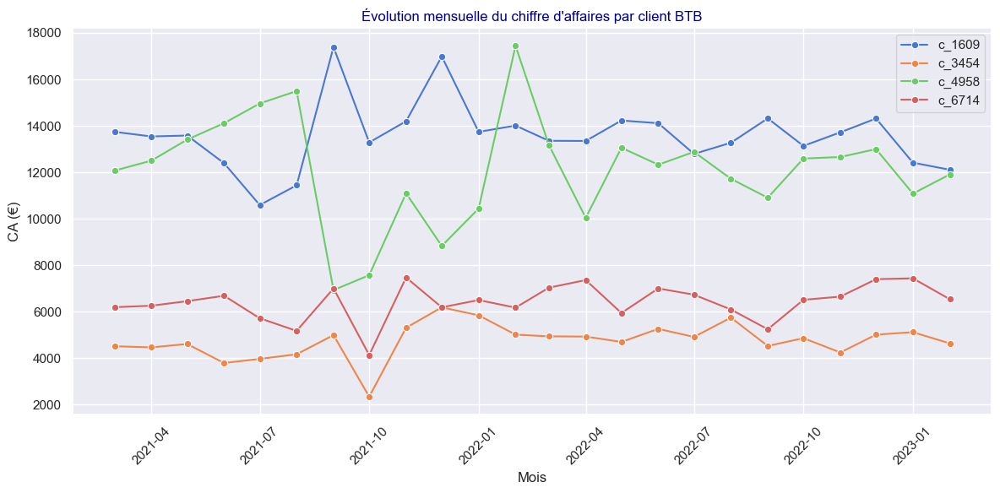

In [974]:

#Restriction aux données clients BTB
mask_clients_BTB = df_CA_par_client_monthly['client_id'].isin(index_client_Gros_Client)
df_graph = df_CA_par_client_monthly.loc[mask_clients_BTB,:]

plt.figure(figsize=(12, 6))

sns.lineplot(
    data=df_graph,
    x="day01",
    y="CA_client",
    hue="client_id",
    palette=palette_fixe_client_BTB,
    marker='o'
)
plt.title("Évolution mensuelle du chiffre d'affaires par client BTB")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

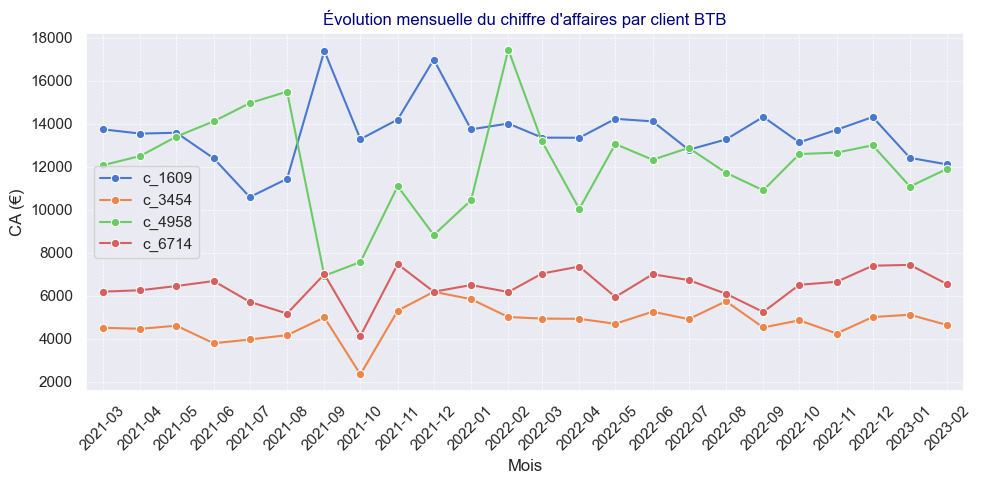

In [975]:
#IDEM AVEC AMELIORATIONS VISUELLES 2
#Restriction aux données clients BTB
mask_clients_BTB = df_CA_par_client_monthly['client_id'].isin(index_client_Gros_Client)
df_graph = df_CA_par_client_monthly.loc[mask_clients_BTB,:]

plt.figure(figsize=(10, 5))

sns.lineplot(
    data=df_graph,
    x="day01",
    y="CA_client",
    hue="client_id",
    palette=palette_fixe_client_BTB,
    marker='o'
)


# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

plt.title("Évolution mensuelle du chiffre d'affaires par client BTB")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xticks(rotation=45)
plt.xlim(datetime(2021, 2, 15), datetime(2023, 2, 15))
plt.tight_layout()
plt.legend()
plt.show()


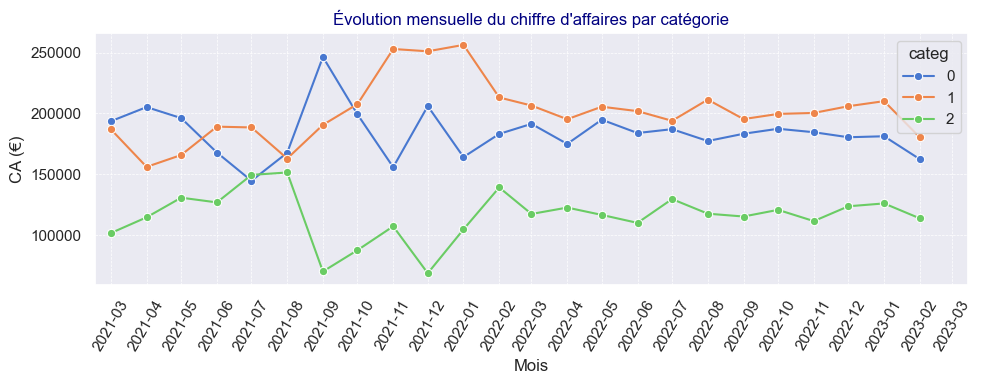

In [976]:
#IDEM AVEC AMELIORATIONS VISUELLES 2
plt.figure(figsize=(10, 4))
# Exemple : somme du CA par mois, affichée avec seaborn
sns.lineplot(
    data=df_CA_Monthly_1_1_bis_par_categ_Grouper,
    x="day01",
    y="CA_Monthly",
    hue="categ",
    palette=palette_fixe_categ,
    marker='o'
)

# Configuration de l'axe des abscisses : dates mensuelles, rotation et grille
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=60)

# Grilles
plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

# Titres et légendes
plt.title("Évolution mensuelle du chiffre d'affaires par catégorie")
plt.xlabel("Mois")
plt.ylabel("CA (€)")
plt.xlim(datetime(2021, 2, 15), datetime(2023, 3, 15))
plt.tight_layout()
plt.show()

##### **TABLE ANNUELLE :**

In [977]:
df_CA_par_client_yearly.head(2)

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,exercice,day01,CA_client_Milliers
day,,,,,,,,
2022-02-28,c_1,371.49,24,1,23,2021-22,2021-03-01,0.37149
2022-02-28,c_10,586.18,28,1,27,2021-22,2021-03-01,0.58618


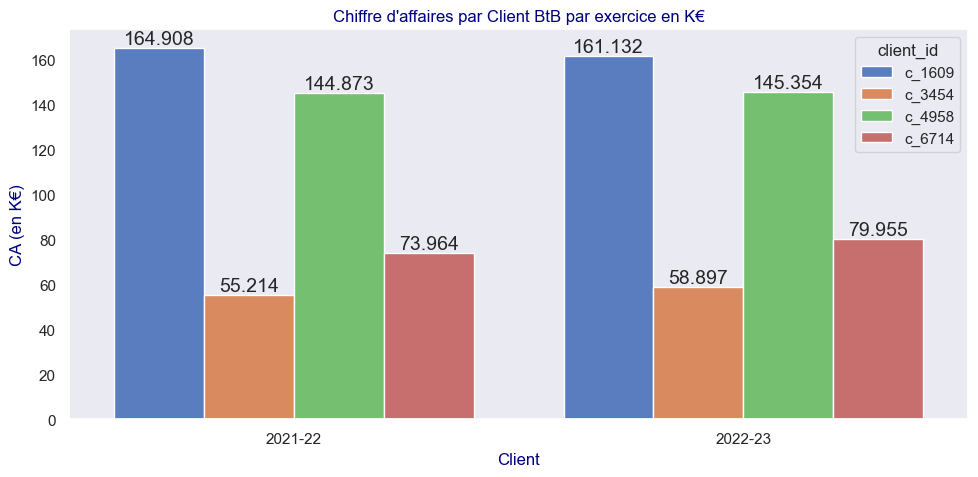

In [978]:
#BILAN par exercice

#Restriction aux données clients BTB
mask_clients_BTB = df_CA_par_client_yearly['client_id'].isin(index_client_Gros_Client)

df_graph = df_CA_par_client_yearly.loc[mask_clients_BTB,:]

plt.figure(figsize=(10, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_graph, 
                 x="exercice", 
                 y="CA_client_Milliers",
                 hue="client_id",
                palette = palette_fixe_client_BTB
                )

for x in range(0,len(ax.containers) ) :
    ax.bar_label(ax.containers[x], fmt='%.3f')

plt.title("Chiffre d'affaires par Client BtB par exercice en K€")
plt.xlabel("Client")
plt.ylabel("CA (en K€)")
plt.tight_layout()
plt.show()

##### **TABLE 2ANS :**

In [979]:
df_CA_par_client_2ans.head()

,client_id,CA_client,nb_transactions,nb_sessions,nb_produits_distincts,CA_client_Milliers
0,c_1,629.02,43,1,23,0.62902
1,c_10,1353.60,58,1,27,1.35360
2,c_100,254.85,8,1,6,0.25485
3,c_1000,2291.88,126,1,53,2.29188
4,c_1001,1823.85,103,1,57,1.82385


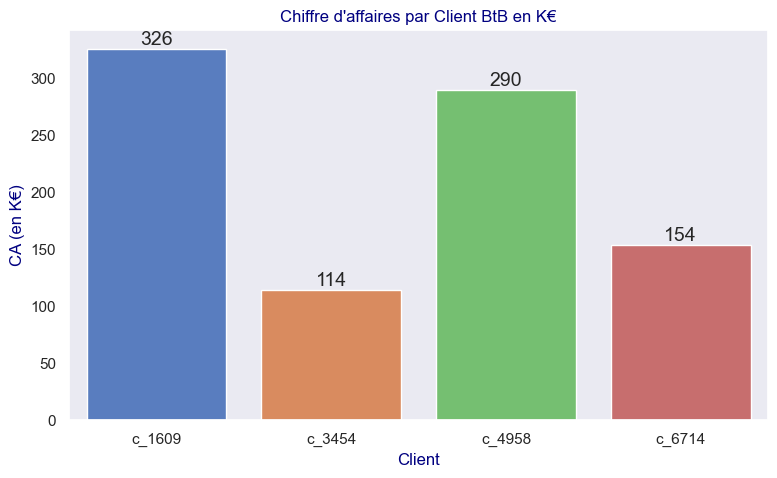

In [980]:
#BILAN sur 2 ans :

#Restriction aux données clients BTB
mask_clients_BTB = df_CA_par_client_2ans['client_id'].isin(index_client_Gros_Client)

df_graph = df_CA_par_client_2ans.loc[mask_clients_BTB,:]

plt.figure(figsize=(8, 5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})
ax = sns.barplot(data=df_graph, 
                 x="client_id", 
                 y="CA_client_Milliers",
                 hue="client_id",
                palette = palette_fixe_client_BTB
                )

for x in range(0,len(ax.containers) ) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title("Chiffre d'affaires par Client BtB en K€")
plt.xlabel("Client")
plt.ylabel("CA (en K€)")
plt.tight_layout()
plt.show()

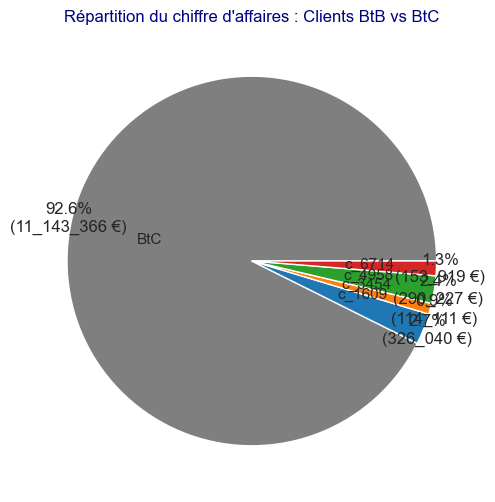

In [981]:
#import matplotlib.pyplot as plt
#import seaborn as sns

# Liste des clients BtB
clients_BtB = ['c_1609', 'c_3454', 'c_4958', 'c_6714']

# Créer une colonne 'type_client' pour catégoriser BtB vs BtC
df_CA_par_client_2ans['type_client'] = df_CA_par_client_2ans['client_id'].apply(
    lambda x: x if x in clients_BtB else 'BtC'
)

# Agréger le CA par type de client
df_pie = df_CA_par_client_2ans.groupby('type_client', as_index=False)['CA_client'].sum()

# Fonction pour l'affichage % + valeur absolue
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = pct * total / 100.0
        return f'{pct:.1f}%\n({val:_.0f} €)'
    return my_autopct

# Style
plt.figure(figsize=(10, 6))
plt.rcParams.update({
    'font.size': 14,
    'axes.labelcolor': 'navy',
    'axes.titlecolor': 'navy',
    'figure.titlesize': 16
})
sns.set_theme(style='dark', palette='muted')

# Couleurs : palette fixe avec BtC en gris
couleurs_clients = {
    'c_1609': '#1f77b4',
    'c_3454': '#ff7f0e',
    'c_4958': '#2ca02c',
    'c_6714': '#d62728',
    'BtC': '#7f7f7f'
}
colors_in_order = [couleurs_clients[client] for client in df_pie['type_client']]

# Tracer le camembert
plt.pie(
    x=df_pie['CA_client'],
    labels=df_pie['type_client'],
    normalize=True,
    autopct=make_autopct(df_pie['CA_client']),
    labeldistance=0.5,
    pctdistance=1.02,
    startangle=0,
    colors=colors_in_order
)

plt.title("Répartition du chiffre d'affaires : Clients BtB vs BtC")
plt.show()


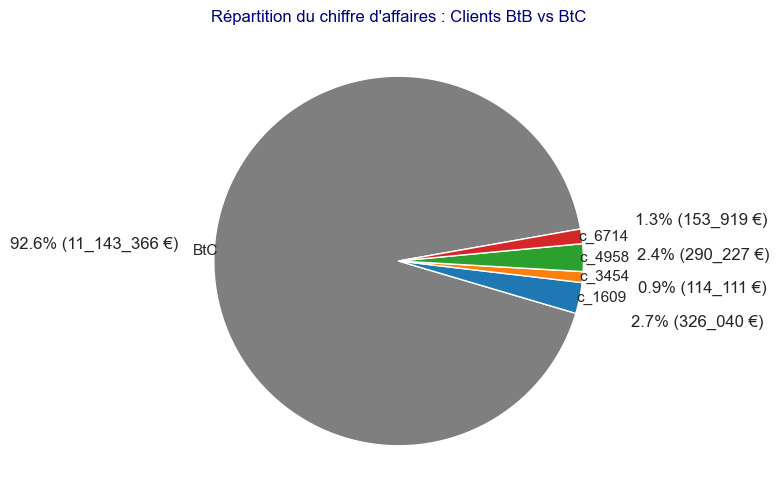

In [982]:
#import matplotlib.pyplot as plt
#import seaborn as sns

# Liste des clients BtB
clients_BtB = ['c_1609', 'c_3454', 'c_4958', 'c_6714']

# Créer une colonne 'type_client' pour catégoriser BtB vs BtC
df_CA_par_client_2ans['type_client'] = df_CA_par_client_2ans['client_id'].apply(
    lambda x: x if x in clients_BtB else 'BtC'
)

# Agréger le CA par type de client
df_pie = df_CA_par_client_2ans.groupby('type_client', as_index=False)['CA_client'].sum()

# Fonction pour l'affichage % + valeur absolue
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = pct * total / 100.0
        return f'{pct:.1f}% ({val:_.0f} €)'
    return my_autopct

# Style
plt.figure(figsize=(10, 6))
plt.rcParams.update({
    'font.size': 14,
    'axes.labelcolor': 'navy',
    'axes.titlecolor': 'navy',
    'figure.titlesize': 16
})
sns.set_theme(style='dark', palette='muted')

# Couleurs : palette fixe avec BtC en gris
couleurs_clients = {
    'c_1609': '#1f77b4',
    'c_3454': '#ff7f0e',
    'c_4958': '#2ca02c',
    'c_6714': '#d62728',
    'BtC': '#7f7f7f'
}
colors_in_order = [couleurs_clients[client] for client in df_pie['type_client']]

# Tracer le camembert
plt.pie(
    x=df_pie['CA_client'],
    labels=df_pie['type_client'],
    normalize=True,
    autopct=make_autopct(df_pie['CA_client']),
    labeldistance=0.98,
    pctdistance=1.65,
    startangle=10,
    colors=colors_in_order
)

plt.title("Répartition du chiffre d'affaires : Clients BtB vs BtC")
plt.show()


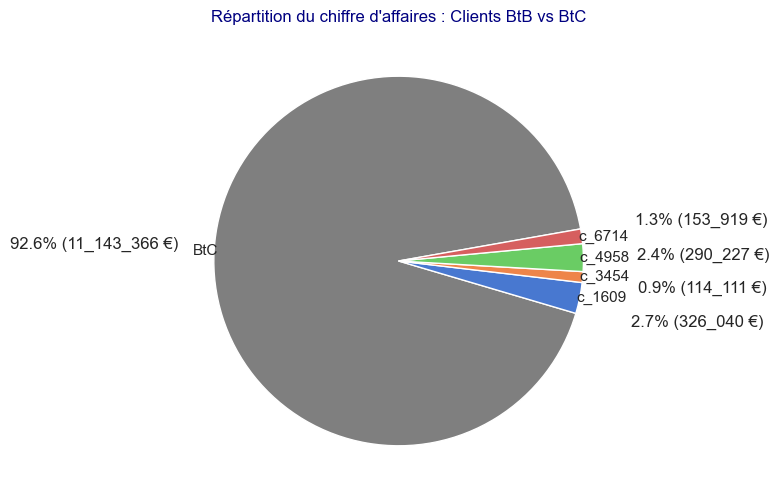

In [983]:
#import matplotlib.pyplot as plt
#import seaborn as sns

# Liste des clients BtB (déjà présents dans Ordre_client_BTB)
clients_BtB = list(Ordre_client_BTB)  # ['c_1609', 'c_3454', 'c_4958', 'c_6714']

# Ajouter une colonne pour distinguer BtB vs BtC
df_CA_par_client_2ans['type_client'] = df_CA_par_client_2ans['client_id'].apply(
    lambda x: x if x in clients_BtB else 'BtC'
)

# Agréger le CA par type de client (4 BtB + 1 BtC)
df_pie = df_CA_par_client_2ans.groupby('type_client', as_index=False)['CA_client'].sum()

# Définir la palette finale avec couleurs BtB + gris pour BtC
palette_fixe_client_BTB_BtC = palette_fixe_client_BTB.copy()
palette_fixe_client_BTB_BtC['BtC'] = '#7f7f7f'  # gris pour le regroupement des BtC

# Obtenir les couleurs dans l’ordre des labels du camembert
colors_in_order = [palette_fixe_client_BTB_BtC[client] for client in df_pie['type_client']]

# Fonction d’affichage des pourcentages + valeurs
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = pct * total / 100.0
        return f'{pct:.1f}% ({val:_.0f} €)'
    return my_autopct

# Style général
plt.figure(figsize=(10, 6))
plt.rcParams.update({
    'font.size': 14,
    'axes.labelcolor': 'navy',
    'axes.titlecolor': 'navy',
    'figure.titlesize': 16
})
sns.set_theme(style='dark', palette='muted')

# Tracer le camembert
plt.pie(
    x=df_pie['CA_client'],
    labels=df_pie['type_client'],
    normalize=True,
    autopct=make_autopct(df_pie['CA_client']),
    labeldistance=0.98,
    pctdistance=1.65,
    startangle=10,
    colors=colors_in_order
)

plt.title("Répartition du chiffre d'affaires : Clients BtB vs BtC")
plt.show()


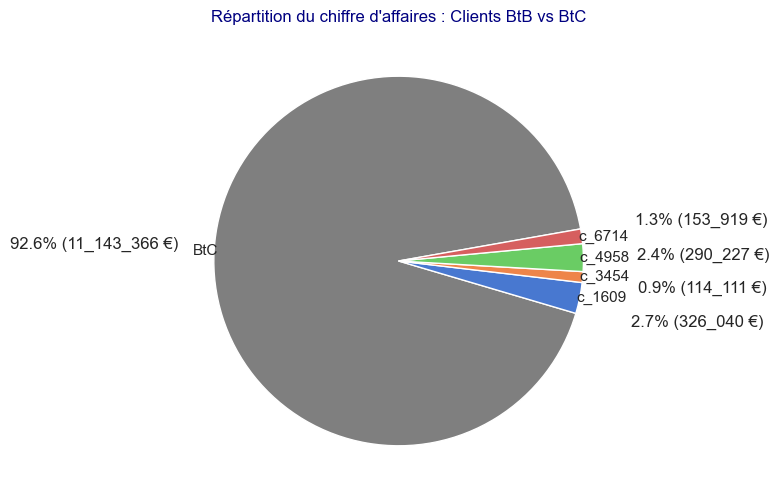

In [984]:
#import matplotlib.pyplot as plt
#import seaborn as sns

# Liste des clients BtB (déjà présents dans Ordre_client_BTB)
clients_BtB = list(Ordre_client_BTB)  # ['c_1609', 'c_3454', 'c_4958', 'c_6714']

# Ajouter une colonne pour distinguer BtB vs BtC
df_CA_par_client_2ans['type_client'] = df_CA_par_client_2ans['client_id'].apply(
    lambda x: x if x in clients_BtB else 'BtC'
)

# Agréger le CA par type de client (4 BtB + 1 BtC)
df_pie = df_CA_par_client_2ans.groupby('type_client', as_index=False)['CA_client'].sum()

# Définir la palette finale avec couleurs BtB + gris pour BtC
palette_fixe_client_BTB_BtC = palette_fixe_client_BTB.copy()
palette_fixe_client_BTB_BtC['BtC'] = '#7f7f7f'  # gris pour le regroupement des BtC

# Obtenir les couleurs dans l’ordre des labels du camembert
colors_in_order = [palette_fixe_client_BTB_BtC[client] for client in df_pie['type_client']]

# Fonction d’affichage des pourcentages + valeurs
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = pct * total / 100.0
        return f'{pct:.1f}% ({val:_.0f} €)'
    return my_autopct

# Style général
plt.figure(figsize=(6, 6))
plt.rcParams.update({
    'font.size': 14,
    'axes.labelcolor': 'navy',
    'axes.titlecolor': 'navy',
    'figure.titlesize': 16
})
sns.set_theme(style='dark', palette='muted')

# Tracer le camembert
plt.pie(
    x=df_pie['CA_client'],
    labels=df_pie['type_client'],
    normalize=True,
    autopct=make_autopct(df_pie['CA_client']),
    labeldistance=0.98,
    pctdistance=1.65,
    startangle=10,
    colors=colors_in_order
)

plt.title("Répartition du chiffre d'affaires : Clients BtB vs BtC")
plt.show()


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.2 - Courbe de Lorenz</h4>
</div>

In [985]:
df_analyse_O1_O2_customers_1_1.head()

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0
2,t_362246,s_180968,2022-03-18 16:40:10.068303,2022-03-18,c_1011,f,1999,0_0,3.75,0
3,t_391460,s_195932,2022-04-18 16:40:10.068303,2022-04-18,c_1011,f,1999,0_0,3.75,0
4,t_677849,s_343439,2023-02-18 16:40:10.068303,2023-02-18,c_1011,f,1999,0_0,3.75,0


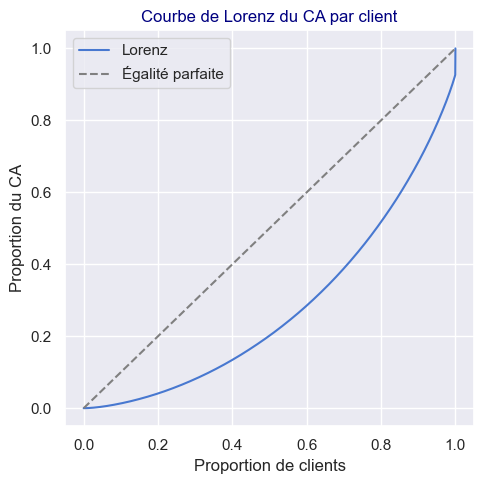

In [986]:
#Courbe de Lorenz

df_lorenz = df_analyse_O1_O2_customers_1_1.groupby("client_id")["price"].sum().sort_values().values
df_lorenz = np.cumsum(df_lorenz) / df_lorenz.sum()
df_lorenz = np.insert(df_lorenz, 0, 0)

plt.figure(figsize=(5, 5))
plt.plot(np.linspace(0.0, 1.0, len(df_lorenz)), df_lorenz, label="Lorenz")
plt.plot([0,1], [0,1], '--', color='gray', label="Égalité parfaite")
plt.title("Courbe de Lorenz du CA par client")
plt.xlabel("Proportion de clients")
plt.ylabel("Proportion du CA")
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

<u>**Observations :**</u>  
La courbe set assez bien étalée.

On note seulement la montée rapide à la toute fin, qui traduir la présence des 4 gros clients.  
Le nombre de clients par rapport aux 4 clients BTB rend un peu plus difficile de voir cette accélartion en fin de coure).


##### TESTS AVEC SEABORN :

##### <font color ='red'><u>**A FAIRE DANS UN AUTRE NOTEBOOK SANS LES 4 CLIENTS BTB :**</font></u>

##### <u>**PROFILS DE NOS CLIENTS :**</u>  

-	répartition du chiffre d'affaires pour les clients BtoB,  
-	courbe de Lorenz  ,
-	et..  .


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">5.5 - AUTRES ANALYSES PERTINENTES? :</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.5.1 - ANALYSE DES PRIX DES PRODUITS</h4>
</div>

**ATTENTION :**  
IL FAUT REGROUPER PAR PRODUTI SIONON ON COMPTE PLUSIEURS FOIS LE MÊME PRODUIT VENDU

POUR L'ENSEMBLE DES PRODUITS VENDUS SUR INTERNET (acheté ou non):


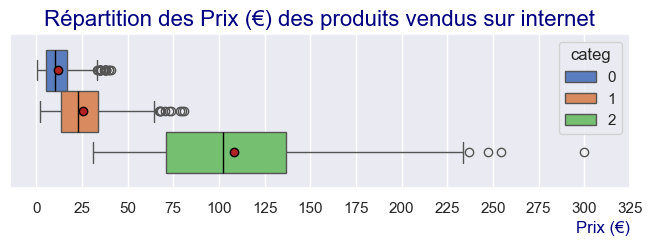

analyse des prix des produits de categorie 0 :
count    2308.000000
mean       11.732795
std         7.565755
min         0.620000
25%         5.587500
50%        10.320000
75%        16.655000
max        40.990000
Name: price, dtype: float64
analyse des prix des produits de categorie 1 :
count    739.000000
mean      25.531421
std       15.425162
min        2.000000
25%       13.390000
50%       22.990000
75%       33.990000
max       80.990000
Name: price, dtype: float64
analyse des prix des produits de categorie 2 :
count    239.000000
mean     108.354686
std       49.561431
min       30.990000
25%       71.065000
50%      101.990000
75%      136.530000
max      300.000000
Name: price, dtype: float64


In [987]:
print("POUR L'ENSEMBLE DES PRODUITS VENDUS SUR INTERNET (acheté ou non):")

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

df_graph = df_analyse_O1_O2_products_1_1[['id_prod','price','categ']].drop_duplicates()

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='price',
            hue='categ',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            palette = palette_fixe_categ
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xticks(range(0,330,25))
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus sur internet",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()


#print("POUR L'ENSEMBLE DES PRODUITS VENDUS SUR INTERNET (acheté ou non:")
print ("analyse des prix des produits de categorie 0 :")
print(df_graph.loc[df_graph['categ']=='0',:]['price'].describe())

print ("analyse des prix des produits de categorie 1 :")
print(df_graph.loc[df_graph['categ']=='1',:]['price'].describe())

print ("analyse des prix des produits de categorie 2 :")
print(df_graph.loc[df_graph['categ']=='2',:]['price'].describe())

POUR L'ENSEMBLE DES PRODUITS VENDUS AUX BTB


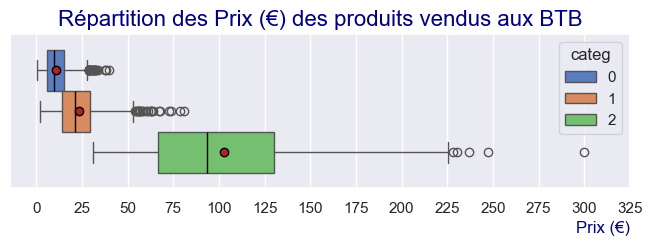

analyse des prix des produits de categorie 0 :
count    1620.000000
mean       10.885667
std         5.997644
min         0.620000
25%         5.990000
50%         9.990000
75%        14.990000
max        39.990000
Name: price, dtype: float64
analyse des prix des produits de categorie 1 :
count    556.000000
mean      23.646906
std       13.580356
min        2.000000
25%       13.990000
50%       21.135000
75%       29.550000
max       80.990000
Name: price, dtype: float64
analyse des prix des produits de categorie 2 :
count    179.000000
mean     102.674749
std       49.042602
min       30.990000
25%       66.660000
50%       93.480000
75%      130.270000
max      300.000000
Name: price, dtype: float64


In [988]:
print("POUR L'ENSEMBLE DES PRODUITS VENDUS AUX BTB")

mask_clients_BTB = df_analyse_O1_O2_transactions_1_1['client_id'].isin(index_client_Gros_Client)
df_graph = df_analyse_O1_O2_transactions_1_1.loc[mask_clients_BTB,:][['id_prod','price','categ']].drop_duplicates()

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='price',
            hue='categ',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            palette = palette_fixe_categ
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xticks(range(0,330,25))
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus aux BTB",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

#print("POUR L'ENSEMBLE DES PRODUITS VENDUS AUX BTB")
print ("analyse des prix des produits de categorie 0 :")
print(df_graph.loc[df_graph['categ']=='0',:]['price'].describe())

print ("analyse des prix des produits de categorie 1 :")
print(df_graph.loc[df_graph['categ']=='1',:]['price'].describe())

print ("analyse des prix des produits de categorie 2 :")
print(df_graph.loc[df_graph['categ']=='2',:]['price'].describe())

POUR LES PRODUITS VENDUS AUX BTC 


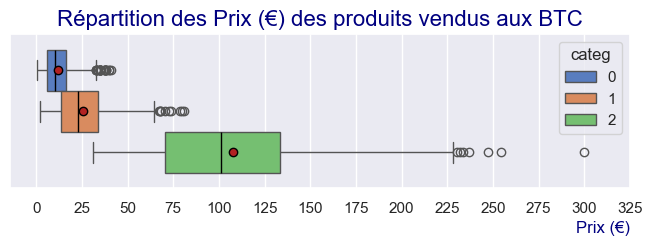

analyse des prix des produits de categorie 0 :
count    2290.000000
mean       11.712576
std         7.525119
min         0.620000
25%         5.635000
50%        10.305000
75%        16.462500
max        40.990000
Name: price, dtype: float64
analyse des prix des produits de categorie 1 :
count    737.000000
mean      25.503623
std       15.435471
min        2.000000
25%       13.350000
50%       22.990000
75%       33.990000
max       80.990000
Name: price, dtype: float64
analyse des prix des produits de categorie 2 :
count    235.000000
mean     107.487319
std       49.307598
min       30.990000
25%       70.460000
50%      100.990000
75%      133.545000
max      300.000000
Name: price, dtype: float64


In [989]:
print("POUR LES PRODUITS VENDUS AUX BTC ")

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

mask_client_BtC = ~(df_analyse_O1_O2_transactions_1_1['client_id'].isin(index_client_Gros_Client))
df_graph = df_analyse_O1_O2_transactions_1_1.loc[mask_client_BtC,:][['id_prod','price','categ']].drop_duplicates()

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='price',
            hue='categ',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            palette = palette_fixe_categ
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xticks(range(0,330,25))
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits vendus aux BTC",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

#print("POUR LES PRODUITS VENDUS AUX BTC ")
print ("analyse des prix des produits de categorie 0 :")
print(df_graph.loc[df_graph['categ']=='0',:]['price'].describe())

print ("analyse des prix des produits de categorie 1 :")
print(df_graph.loc[df_graph['categ']=='1',:]['price'].describe())

print ("analyse des prix des produits de categorie 2 :")
print(df_graph.loc[df_graph['categ']=='2',:]['price'].describe())

POUR LES PRODUITS NON VENDUS 


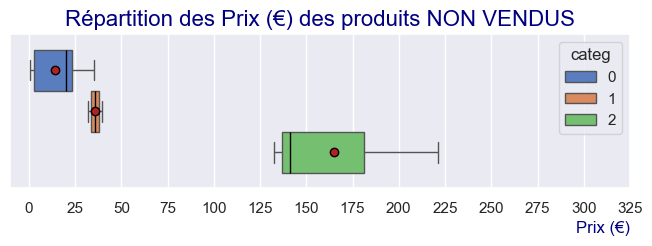

analyse des prix des produits de categorie 0 :
count    16.000000
mean     14.316250
std      11.652405
min       0.800000
25%       2.727500
50%      20.180000
75%      23.157500
max      35.060000
Name: price, dtype: float64
analyse des prix des produits de categorie 1 :
count     2.000000
mean     35.775000
std       5.593215
min      31.820000
25%      33.797500
50%      35.775000
75%      37.752500
max      39.730000
Name: price, dtype: float64
analyse des prix des produits de categorie 2 :
count      3.000000
mean     164.890000
std       48.790141
min      132.360000
25%      136.840000
50%      141.320000
75%      181.155000
max      220.990000
Name: price, dtype: float64


In [990]:
print("POUR LES PRODUITS NON VENDUS ")

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'navy','axes.titlecolor':'navy','figure.titlesize':16})

df_graph = df_produits_non_internet[['id_prod','price','categ']].drop_duplicates()

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_graph,
            x='price',
            hue='categ',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            palette = palette_fixe_categ
            #hue_order= ...
           )
#plt.xlim(0,250)
plt.grid(axis='x')
plt.xticks(range(0,330,25))
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'navy'},loc='right')
#plt.legend()
plt.title("Répartition des Prix (€) des produits NON VENDUS",fontdict={'fontsize' : 16, 'color':'navy'})
plt.show()

#print("POUR LES PRODUITS VENDUS AUX BTC ")
print ("analyse des prix des produits de categorie 0 :")
print(df_graph.loc[df_graph['categ']=='0',:]['price'].describe())

print ("analyse des prix des produits de categorie 1 :")
print(df_graph.loc[df_graph['categ']=='1',:]['price'].describe())

print ("analyse des prix des produits de categorie 2 :")
print(df_graph.loc[df_graph['categ']=='2',:]['price'].describe())

##### <u>**OBSERVATIONS :**</u>  
On notera que les  prix moyens des produits NON VENDUS sont supérieurs à la moyenne de leur catégorie.

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 6 - ANALYSE DES COMPORTEMENTS CLIENTS </h2>
</div>

objectif : mieux comprendre le comportement de nos clients en ligne

##### <u>**5 corrélations pour étudier le profil de nos clients :**</u>  
-	le lien entre le genre d’un client et les catégories des livres acheté,  
-	le lien entre l'âge des clients et le montant total des achats,  
-	le lien entre l'âge des clients et la fréquence d’achat,  
-	le lien entre l'âge des clients et la taille du panier moyen,  
-	le lien entre l'âge des clients et la catégorie des livres achtés.  


<u>Remarque : Source utile pours la réalisation des tests statistique :</u>  
 le tableau récapitulatif d’XLSTA :  
https://help.xlstat.com/fr/6443-which-statistical-test-should-you-use 



##### **IMPORTS POUR LE TRAVAIL STATISTIQUE :**

In [991]:
from scipy.stats import norm

In [992]:
from scipy.stats import shapiro

In [993]:
from scipy.stats import spearmanr

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">6.0 - Travaillons sur un fichier BtC avec uniquement les clients ayant acheté au moins une fois :</h3>
</div>

Ca n'a pas de sens d'étudier les catégories de livres achetés ou le montant total ou la fréquence ou la taille du panier pour des clients qui n'ont jamais acheté.  
Je vais donc utiliser le fichier df_analyse_O1_O2_transactions_1_1 des transactions (qui inclut les clients ayant achetés; et les produits ayant été achetés).

In [994]:
df_analyse_O1_O2_transactions_1_1.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


In [995]:
index_client_Gros_Client

Index(['c_1609', 'c_3454', 'c_4958', 'c_6714'], dtype='string', name='client_id')

In [996]:
df_analyse_O1_O2_transactions_1_1['client_id'].describe()

count     687534
unique      8600
top       c_1609
freq       25586
Name: client_id, dtype: object

In [997]:
df_analyse_O1_O2_transactions_1_1['client_id'].dropna().describe()

count     687534
unique      8600
top       c_1609
freq       25586
Name: client_id, dtype: object

In [998]:
mask_client_BtC = ~(df_analyse_O1_O2_transactions_1_1['client_id'].isin(index_client_Gros_Client))
df_analyse_O1_O2_BtC = df_analyse_O1_O2_transactions_1_1.loc[mask_client_BtC,:]

In [999]:
df_analyse_O1_O2_BtC['client_id'].describe()

count     640734
unique      8596
top       c_2140
freq         405
Name: client_id, dtype: object

In [1000]:
df_analyse_O1_O2_BtC['client_id'].dropna().describe()

count     640734
unique      8596
top       c_2140
freq         405
Name: client_id, dtype: object

In [1001]:
Description_Fichier_Tableau_avc_ValBlanches(df_analyse_O1_O2_BtC)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],640734,640734,0,640734,0
session_id,string[python],640734,640734,0,322466,0
date,datetime64[ns],640734,640734,0,640615,0
day,datetime64[ns],640734,640734,0,730,0
client_id,string[python],640734,640734,0,8596,0
sex,string[python],640734,640734,0,2,0
birth,Int64,640734,640734,0,76,0
id_prod,string[python],640734,640734,0,3262,0
price,float64,640734,640734,0,1440,0
categ,string[python],640734,640734,0,3,0


In [1002]:
df_analyse_O1_O2_BtC.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0


In [1003]:
df_analyse_O1_O2_BtC['age']= 2022-df_analyse_O1_O2_BtC['birth']

C:\Users\matth\AppData\Local\Temp\ipykernel_8436\3500234386.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_analyse_O1_O2_BtC['age']= 2022-df_analyse_O1_O2_BtC['birth']


In [1004]:
df_analyse_O1_O2_BtC.head(2)

,transaction_id,session_id,date,day,client_id,sex,birth,id_prod,price,categ,age
0,t_1818,s_908,2021-03-02 21:57:33.862118,2021-03-02,c_1004,m,1973,0_0,3.75,0,49
1,t_334688,s_167174,2022-02-18 16:40:10.068303,2022-02-18,c_1011,f,1999,0_0,3.75,0,23


In [1005]:
Description_Fichier_Tableau_avc_ValBlanches(df_analyse_O1_O2_BtC)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
transaction_id,string[python],640734,640734,0,640734,0
session_id,string[python],640734,640734,0,322466,0
date,datetime64[ns],640734,640734,0,640615,0
day,datetime64[ns],640734,640734,0,730,0
client_id,string[python],640734,640734,0,8596,0
sex,string[python],640734,640734,0,2,0
birth,Int64,640734,640734,0,76,0
id_prod,string[python],640734,640734,0,3262,0
price,float64,640734,640734,0,1440,0
categ,string[python],640734,640734,0,3,0


In [1006]:
df_analyse_O1_O2_BtC.shape

(640734, 11)

In [1007]:
df_analyse_O1_O2_BtC.dtypes

transaction_id    string[python]
session_id        string[python]
date              datetime64[ns]
day               datetime64[ns]
client_id         string[python]
sex               string[python]
birth                      Int64
id_prod           string[python]
price                    float64
categ             string[python]
age                        Int64
dtype: object

In [1008]:
df_analyse_O1_O2_BtC.columns

Index(['transaction_id', 'session_id', 'date', 'day', 'client_id', 'sex',
       'birth', 'id_prod', 'price', 'categ', 'age'],
      dtype='object')

##### <u>**EXPORT DU FICHIER CLIENTS BTC POUR ETUDE DE CORRELATION :**</u>

In [1009]:
#EXPORT DU FICHIER CLIENTS BTC POUR ETUDE DE CORRELATION 
df_analyse_O1_O2_BtC.to_csv("df_analyse_O1_O2_BtC.csv",index=False)

SUITE DE L'ANALYSE DES PROFILS CLIENTS DANS UN SECOND NOTEBOOK (tel que demandé)

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; "> Etape Y - COMPLEMENTS </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Y.1 EXPORTS UTILES:</h3>
</div>

In [1010]:
#EXPORT UTILE :
#EXPORT de la liste des produits non vendus
df_liste_produits_non_vendus = (df_Produits_2ans[df_Produits_2ans['nb_transactions']==0] )
df_liste_produits_non_vendus.to_csv("df_liste_produits_non_vendus.csv",index=False)
df_liste_produits_non_vendus.to_excel("df_liste_produits_non_vendus.xlsx",index=False)

In [1011]:
#DEJA FAIT en fin de paragraphe 6.0
#EXPORT DU FICHIER CLIENTS BTC POUR ETUDE DE CORRELATION 
#df_analyse_O1_O2_BtC.to_csv("df_analyse_O1_O2_BtC.csv",index=False)

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; "> Etape Z - COMPLEMENTS PERSOS </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Z.1 -REMETTRE EN PLACE LES WARNINGS, SI WARNINGS DESACTIVES</h3>
</div>

In [1012]:
#Restore the warning behaviour to default : Show all warnings (even those ignored by default)
#warnings.filterwarnings('ignore')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Z.2 - DOCUMENTATIONS </h3>
</div>

#### <u>**Z.2.1 COPY :**</u>

**ATTENTION AUX SHALLOW COPY et DEEP COPY :  
Une shallow copy crée un nouvel objet mais qui poionte vers les même données que le premier=> une modification sur l'une modifie l'autre.
Il faut faire un DEEP COPY si on veut que les données soient indépendantes également**  

source : https://medium.com/@mathieuvdp/attention-au-deep-copy-de-pandas-8ebbdd5b0b92  

Bien_2 = Bien_1.copy(deep=False) =>shallow copy  
Bien_2 = Bien_1.copy(deep=True) => deep_copy

**Faire attention aux copy(deep=True)**  
**NE PAS EN ABUSER**, surtout sur des fichiers lourds.  
Au pire daire des copy(deep=True) dans le travail d'exploration.  
Puis les remplacer par des cop(deep=False), une fois que le travail est validé.  
Ou travailler sur le fichier en cours de modif quitte à relancer le Kernel si erreur.

<u>Remarque : Source utile pours la réalisation des tests statistique :</u>  
 le tableau récapitulatif d’XLSTA :  
https://help.xlstat.com/fr/6443-which-statistical-test-should-you-use 



#### <u>**Z.2.2 SUPPRESSION DE LIGNES VIDES / source Nettoyage CNAM :**</u> 

<u>**SUPPRESSION DE LIGNES VIDES / source Nettoyage CNAM :**</u>  

https://jhub.cnam.fr/doc/notebooks/Nettoyage_de_donnees_Python_Pandas.html  

Dans un premier temps, il peut être souhaitable de filtrer/retirer les valeurs manquantes dans le dataframe.  

Pour cela on utilise la fonction dropna().  
Cette fonction possède plusieurs arguments, permettant de moduler le niveau de filtrage des valeurs manquantes :  

axis= (0 ou 1) : filtrage des valeurs manquantes selon les lignes (axis = 0) ou les colonnes (axis=1). Valeur par défaut : axis=0.
how=all : argument permettant de ne retirer que les lignes (pour axis=0) ou toutes les colonnes (pour axis=1) du dataframe pour lequelles toutes les valeurs sont manquantes.  

Attention : si cet argument n'est pas spécifié, chaque ligne (resp. chaque colonne) contenant au moins une donnée manquante sera supprimée !  

inplace=True : applique directement la modification dans le dataframe (sans créer un autre dataframe).  
thresh= (nombre entier n) : permet de ne conserver que les lignes (resp. les colonnes) contenant au moins n valeurs non manquantes.


#### <u>**Z.2.3 Reordonner des colonnes :**</u> 

**CNAM (même source que pour les lignes vides) :**  


pour REORDONNER DES COLONNES, on peut utiliser df.reindex :  

ordre_colonnes = ["country", "year", "sex", "age", "cases"]  
tub = tub.reindex(columns=ordre_colonnes    


Après Lecture de la documentation, et essais,  
Cela n'a pas l'air d'être mieux que mon classique :
tub = tub[['D','B','C','A']]  
(ou A, B C D sont les colonnes d'origines).  

En effet il semble que reindex fait également un nouvel objet.)

#### **<u>Z.2.4 Travail sur les séries temporelles :</u>**

<u>Source intéressante :</u>    
https://moncoachdata.com/blog/methodes-de-series-temporelles-avec-pandas/

<u>Comprendre l'utilité des séries temporelles :</u>  
- Facilité d'usage des données de type datetime et timestamp.
- Prioriser l'utilisation de la Série en Index, donne un type Datetimeindex (qui donne plsu de fonctiosn sur le traitement temporel)
- Maitriser les fonctionnalités :
. resample : un équivalent de groupby spécifique qui ne s'applique qu'aux datetime
  pd.Grouper : permet de donner des instructions particulières d'aggrégation pour une série temporelle incluse dans un groupby classique, avec d'autres colonnes.

<u>Remarque :</u>  
Le .resample qu'à un datetime ; mais on ne peut pas faire un resample sur date+col_non_date (p ex ici date+categ)  
Pour faire un groupby sur date+categ, en gardant les caractéristiques de la date (comme sur un resample), on utilise :  
groupby(pd.grouper(conditions de resample sur date),categ).  

Exemples :  

#### <u>**Z.2.5 Travail sur la saisonnalité :**</u>

Source STATOSCOP :  
https://blog.statoscop.fr/timeseries-4.html  


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Z.3 - DOCUMENTATIONS DU THEME</h3>
</div>

ETUDE INTERESSANTE SUR LA LECTURE :  
https://centrenationaldulivre.fr/sites/default/files/2023-04/Les%20Fran%C3%A7ais%20et%20la%20lecture%20Rapport%20complet%202023-04-12%20OK.pdf
